In [1]:
# !pip install tensorflow --user

In [2]:
# !jupyter nbextension enable --py widgetsnbextension

In [3]:
# !pip install catboost

In [4]:
# !pip install scikit-learn==1.0.2 --user

In [5]:
# pip install pytorch-tabnet

In [96]:
import warnings
import pandas as pd
import numpy as np
import pickle

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
%matplotlib inline

# Tensorflow, Keras, Pytorch
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

from pytorch_tabnet.tab_model import TabNetClassifier, TabNetRegressor

# Preprocessing
import sklearn
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.metrics import mean_squared_error

# Clustering
from scipy import stats
from scipy.cluster.hierarchy import fcluster, dendrogram, linkage
from sklearn.cluster import KMeans

# Models
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, BaggingRegressor
from sklearn.linear_model import LinearRegression
import xgboost as xgb

# Math stats
from scipy import stats
import math

#RegEx and json
import re
from ast import literal_eval
import json
import requests
import urllib.parse

In [7]:
sklearn.__version__

'1.0.2'

In [8]:
warnings.filterwarnings('ignore')
RANDOM_SEED = 42

## 1.1 Data preprocessing

In [8]:
df = pd.read_csv('data.csv')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103115 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226470 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

In [10]:
df.head()

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
0,Active,NaN,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,NaN,NaN,611019,"$418,000"
1,for sale,NaN,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,NaN,NaN,201916904,"$310,000"
2,for sale,NaN,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,NaN,yes,FR19221027,"$2,895,000"
3,for sale,NaN,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,3.0,NaN,NaN,14191809,"$2,395,000"
4,for sale,NaN,lot/land,1524 Kiscoe St,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",NaN,32908,NaN,FL,NaN,NaN,NaN,861745,"$5,000"


In [11]:
# Let's remove duplicate columns as weel as columns which make no sence
df.drop(['private pool', 'mls-id', 'stories', 'MlsId'], axis=1, inplace=True)
df.head()

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,PrivatePool,target
0,Active,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,"$418,000"
1,for sale,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,NaN,"$310,000"
2,for sale,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,yes,"$2,895,000"
3,for sale,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,NaN,"$2,395,000"
4,for sale,lot/land,1524 Kiscoe St,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",NaN,32908,NaN,FL,NaN,"$5,000"


#### Status column

In [12]:
# Make everything uppercase#
df['status'] = df['status'].str.upper()
# df['status'].unique()
df['status'].value_counts()

FOR SALE                  199571
ACTIVE                    105207
FORECLOSURE                 6769
NEW CONSTRUCTION            5475
PENDING                     4807
                           ...  
CONTING ACCPT BACKUPS          1
PENDING BACKUPS WANTED         1
COMING SOON: DEC 23.           1
COMING SOON: NOV 14.           1
COMING SOON: NOV 25.           1
Name: status, Length: 152, dtype: int64

In [13]:
# Remove rent options
df = df[df['status']  != 'FOR RENT']

In [14]:
# Fill na for now as pending
df['status'].fillna('OTHER', inplace=True)

In [15]:
# Let's create 7 main statuses 'For sale', 'Active', 'Foreclosure', 'New', 'Sold', 'Contract' and 'Pending'
types = ['FOR SALE', 'ACTIVE', 'FORECLOSURE', 'NEW', 'SOLD', 'CONTRACT', 'PENDING']
for strtype in types: 
    df['status'] = df['status'].apply(lambda x: strtype if strtype in x else x)

In [16]:
# replace the rest with Pending
df['status'] = df['status'].apply(lambda x: x if x in types else 'OTHER')
df['status'].value_counts()

FOR SALE       199571
ACTIVE         106555
OTHER           45318
FORECLOSURE     10450
NEW              6165
PENDING          5364
CONTRACT         3075
SOLD              289
Name: status, dtype: int64

#### Property Type

In [17]:
# Make upper case
df['propertyType'] = df['propertyType'].str.upper()
# Replace "-", "," and "/" as well as some types
df['propertyType'] = df['propertyType'].str.replace('-', ' ')
df['propertyType'] = df['propertyType'].str.replace('/', ' ')
df['propertyType'] = df['propertyType'].str.replace(',', '')
df['propertyType'] = df['propertyType'].str.replace(' HOME', '')
df['propertyType'] = df['propertyType'].str.replace('CONDO TOWNHOME ROW CO OP', 'CONDO')
df['propertyType'].unique()

array(['SINGLE FAMILY', 'LOT LAND', 'TOWNHOUSE', ...,
       'CABIN LODGE CONTEMPORARY CONVERTED BARN COTTAGE LOFT WITH BEDROOMS LOG POST & BEAM',
       'LAKE HOUSE SINGLE DETACHED TUDOR',
       'BILEVEL CONVERTED DWELLING LOFT WITH BEDROOMS CONDO UNIT'],
      dtype=object)

In [18]:
# Let's keep the most common types
types = list(df['propertyType'].value_counts().index)[:10]

In [19]:
# IMPORTANT about types: LAND cannot have any beds or baths, it's just piece of land

In [20]:
df.loc[df['propertyType'] == 'LAND', ['baths', 'beds']] = '0'

In [21]:
types.remove('LAND') # exclude LAND not to conflict with LOT LAND

In [22]:
for strtype in types:
    df['propertyType'] = df['propertyType'].apply(lambda x: strtype if strtype in str(x) else x)

types.append('LAND')
df['propertyType'] = df['propertyType'].apply(lambda x: x if x in types else 'OTHER')
df['propertyType'].value_counts()

SINGLE FAMILY    186586
OTHER             58529
CONDO             51481
LOT LAND          20552
TOWNHOUSE         18525
MULTI FAMILY      12086
LAND              10934
TRADITIONAL        9348
COOP               3801
RANCH              2915
HIGH RISE          2030
Name: propertyType, dtype: int64

#### Street

In [23]:
# 2 missing values, just replace then with Unknonw
df['street'].fillna('Unknownw', inplace=True)

#### Baths

In [24]:
df['baths'] = df['baths'].str.replace(',', '.')

In [25]:
# Create function for Regex
def apply_regex(column):
    df[column] = df[column].apply(lambda x: re.sub("[^0-9.]", "", str(x)))

In [26]:
apply_regex('baths')

In [27]:
# Replace the rest of strings with some numeric value
df['baths'] = df['baths'].replace('..', '10000')
df['baths'] = df['baths'].replace('', '10000')

In [28]:
# Make float type 
df['baths'] = df['baths'].astype('float')

In [29]:
df['baths'].value_counts()[:20]

2.00        103387
10000.00    100538
3.00         66642
4.00         26320
1.00         17779
2.50         13726
0.00         11139
5.00          9451
3.50          6127
1.50          4337
6.00          4302
7.00          2076
1.75          1817
4.50          1553
2.25          1459
1.25          1216
8.00          1159
2.75          1000
9.00           545
5.50           521
10.00          327
750.00         237
6.50           191
11.00          187
12.00          134
7.50            84
13.00           74
2.10            53
16.00           52
14.00           45
18.00           32
8.50            30
15.00           28
1.10            17
24.00           17
20.00           16
Name: baths, dtype: int64

In [30]:
# Assign nan where we have baths > 100 (mostly to replace 10000 which should be nan)
df.loc[df.baths > 100, 'baths'] = np.nan

#### Fireplace

In [31]:
# Here is enough to do boolean with 0 and 1 if there is a fireplace
df['fireplace'].fillna(0, inplace=True)
df.loc[df.fireplace != 0, 'fireplace'] = 1
df['fireplace'] = df['fireplace'].astype('int')

#### City

In [32]:
# Just replace city with unknown if empty
df['city'].fillna('unknown', inplace=True)
df['city'] = df['city'].str.upper()

In [33]:
# Clean city where it's not literal
df['city'] = df['city'].apply(lambda x: re.sub("[^A-Z ]", "", str(x)))

In [34]:
# Check empties (69 entries we can remove)
df = df[df['city'] != ''] 

In [35]:
df = df[df['city'] != 'UNKNOWN']

In [36]:
df['city'] = df['city'].apply(lambda x: 'HOUSTON' if 'HOUSTON' in x else x)

#### Area (sqft)

In [37]:
# Same RegEx as for baths
apply_regex('sqft')

In [38]:
# replace ''
df['sqft'] = df['sqft'].replace('', '0')
df['sqft'] = df['sqft'].astype('float')
df.loc[df.sqft == 0, 'sqft'] = np.nan

#### Zipcode

In [39]:
# Cut long zips
df['zipcode'] = df['zipcode'].astype('str').apply(lambda x: x[:5] if len(x) > 5 else x)
# Add 0 if zip lenth is 4
df['zipcode'] = df['zipcode'].apply(lambda x: x + '0' if len(x) == 4 else x)

In [40]:
for i in df['zipcode']:
    if len(i) !=5 or i == '00000':
        print(i)

0
0
--
--
0
00000


In [41]:
# Remove the rest
df = df[(df['zipcode'] != '0') & (df['zipcode'] != '--') & (df['zipcode'] != '00000') & (df['zipcode'] != 'nan')]

#### Beds

In [42]:
# Same RegEx as for baths
apply_regex('beds')
df['beds'] = df['beds'].replace('', '10000').replace(',', '.')

In [43]:
df['beds'].value_counts()[:20]

10000    98065
3        97614
4        63639
2        47612
5        20314
0        12101
3.0       8087
6         6268
1         5737
4.0       5231
2.0       2429
7         1753
5.0       1371
8         1177
9          479
1.0        428
6.0        311
10         275
12         189
11         131
Name: beds, dtype: int64

In [44]:
# Cut one weird strings
df['beds'] = df['beds'].apply(lambda x: x[:-1] if x[-1] == '.' else x)
df['beds'] = df['beds'].astype('float')

In [45]:
# Assign nan where we have beds > 15
df.loc[df.beds > 15, 'beds'] = np.nan

#### State

In [46]:
df['state'] = df['state'].str.upper()
df['state'].unique()

array(['NC', 'WA', 'CA', 'TX', 'FL', 'PA', 'TN', 'IA', 'NY', 'OR', 'DC',
       'NV', 'AZ', 'GA', 'IL', 'NJ', 'MA', 'OH', 'IN', 'UT', 'MI', 'VT',
       'MD', 'CO', 'VA', 'KY', 'MO', 'WI', 'ME', 'MS', 'OK', 'SC', 'MT',
       'DE', 'BA', 'AL', 'OT'], dtype=object)

#### PrivatePool

In [47]:
df['PrivatePool'] = df['PrivatePool'].fillna(0)
df.loc[df.PrivatePool != 0, 'PrivatePool'] = 1
df['PrivatePool'] = df['PrivatePool'].astype('int')

#### Target price

In [48]:
# Apply same regex for numeric values
apply_regex('target')

In [49]:
df.loc[df.target == '', 'target'] = np.nan

In [50]:
df['target'] = df['target'].astype('float')

In [51]:
# Check where we stand for now
df.reset_index(inplace=True, drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 376738 entries, 0 to 376737
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        376738 non-null  object 
 1   propertyType  376738 non-null  object 
 2   street        376738 non-null  object 
 3   baths         275967 non-null  float64
 4   homeFacts     376738 non-null  object 
 5   fireplace     376738 non-null  int32  
 6   city          376738 non-null  object 
 7   schools       376738 non-null  object 
 8   sqft          323538 non-null  float64
 9   zipcode       376738 non-null  object 
 10  beds          276976 non-null  float64
 11  state         376738 non-null  object 
 12  PrivatePool   376738 non-null  int32  
 13  target        374257 non-null  float64
dtypes: float64(4), int32(2), object(8)
memory usage: 37.4+ MB


## 1.2 EDA Feature Engineering

### Variables look like json

#### Home Facts

In [52]:
# Check how it look like converting with literal evaluation
literal_eval(df.loc[0, 'homeFacts'])['atAGlanceFacts']

[{'factValue': '2019', 'factLabel': 'Year built'},
 {'factValue': '', 'factLabel': 'Remodeled year'},
 {'factValue': 'Central A/C, Heat Pump', 'factLabel': 'Heating'},
 {'factValue': '', 'factLabel': 'Cooling'},
 {'factValue': '', 'factLabel': 'Parking'},
 {'factValue': None, 'factLabel': 'lotsize'},
 {'factValue': '$144', 'factLabel': 'Price/sqft'}]

In [53]:
df['homeFacts'] = df['homeFacts'].apply(lambda x: literal_eval(x)['atAGlanceFacts'])

In [54]:
# Create new variables from Home Facts TAKES FOREVER!
# for i in range(len(df)):
#     for dictionary in df['homeFacts'][i]:
#         df.loc[i, dictionary['factLabel']] = dictionary['factValue']

In [55]:
def create_column(fact_label):
    
    column = []
    for dictionary in df['homeFacts']:
        for i in range(len(dictionary)):
            if dictionary[i]['factLabel'] == fact_label:
                if dictionary[i]['factValue'] != '':
                    column.append(dictionary[i]['factValue'])
                else:
                    column.append(0)
    df[fact_label] = column

In [56]:
# Let's create new columns 
new_columns = ['Year built', 'Remodeled year', 'Heating', 'Cooling', 'Parking', 'lotsize', 'Price/sqft']

In [57]:
# Create columns and replace 0 back with nan
for i in new_columns:
    create_column(i)
    df.loc[df[i] == 0, f'{i}'] = np.nan

#### Schools

In [58]:
literal_eval(df.loc[1, 'schools'])[0]

{'rating': ['4/10', 'None/10', '4/10'],
 'data': {'Distance': ['1.65mi', '1.32mi', '1.01mi'],
  'Grades': ['9-12', '3-8', 'PK-8']},
 'name': ['East Valley High School&Extension',
  'Eastvalley Middle School',
  'Trentwood Elementary School']}

In [59]:
# Let's make our life easier and create column with max rating of nearest schools and number of schools around
df['max_rating'] = df['schools'].apply(lambda x: literal_eval(x)[0]['rating'])
df['schools_around'] = df['schools'].apply(lambda x: len(literal_eval(x)[0]['name']))

In [60]:
# Apply regex to ratings
for ratings in df['max_rating']:
    for i in range(len(ratings)):
        ratings[i] = re.sub("[^0-9.]", "0", ratings[i][:1]) ## take first digit from ratings

In [61]:
df['max_rating'] = df['max_rating'].apply(lambda x: max(x) if x != [] else 0)

In [62]:
# Replace the rest 80 schools no max rating with 0 and make it numeric
df['max_rating'] = df['max_rating'].replace('', 0)
df['schools_around'] = df['schools_around'].replace('', 0)
df[['max_rating', 'schools_around']] = df[['max_rating', 'schools_around']].astype('int')
df['max_rating'].value_counts()

7    68781
6    59978
8    58378
9    54569
5    44489
4    42379
3    27754
2    12376
0     5120
1     2914
Name: max_rating, dtype: int64

In [63]:
# Where we stand now
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 376738 entries, 0 to 376737
Data columns (total 23 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   status          376738 non-null  object 
 1   propertyType    376738 non-null  object 
 2   street          376738 non-null  object 
 3   baths           275967 non-null  float64
 4   homeFacts       376738 non-null  object 
 5   fireplace       376738 non-null  int32  
 6   city            376738 non-null  object 
 7   schools         376738 non-null  object 
 8   sqft            323538 non-null  float64
 9   zipcode         376738 non-null  object 
 10  beds            276976 non-null  float64
 11  state           376738 non-null  object 
 12  PrivatePool     376738 non-null  int32  
 13  target          374257 non-null  float64
 14  Year built      314410 non-null  object 
 15  Remodeled year  151075 non-null  object 
 16  Heating         267672 non-null  object 
 17  Cooling   

#### Built year, remodeled year

In [64]:
# Replace string No data with nan
df['Remodeled year'] = df['Remodeled year'].replace('No Data', 0)
df.loc[0, 'Remodeled year'] = np.nan

In [65]:
# If remodeled year is null then let's assume it wsnt remodeled and fill with built year 
df.loc[df['Remodeled year'].isna(), 'Remodeled year'] = df.loc[df['Remodeled year'].isna(), 'Year built']

In [66]:
# Replace string No data with nan again because it might be applied from year built
df['Remodeled year'] = df['Remodeled year'].replace('No Data', 0)
df.loc[0, 'Remodeled year'] = np.nan

In [67]:
# Keep only remodeled year as latest year
df.drop('Year built', axis = 1, inplace = True)
df['Remodeled year'] = df['Remodeled year'].astype('float')

#### Heating, cooling, parking

In [68]:
# Keep 5 most frequent heating types
df['Heating'] = df['Heating'].str.upper()
types = list(df['Heating'].value_counts().index)[:5]

In [69]:
types.append('NO')
types

['FORCED AIR', 'OTHER', 'ELECTRIC', 'GAS', 'HEAT PUMP', 'NO']

In [70]:
df.loc[df['Heating'].isna(), 'Heating'] = 'NO'

In [71]:
for strtype in types: 
    df['Heating'] = df['Heating'].apply(lambda x: strtype if strtype in x else x)
df['Heating'] = df['Heating'].apply(lambda x: x if x in types else 'OTHER')
df['Heating'].value_counts()

FORCED AIR    140835
NO            117859
OTHER          63786
ELECTRIC       28927
GAS            15250
HEAT PUMP      10081
Name: Heating, dtype: int64

In [72]:
# For cooling just keep boolean
df.loc[(df['Cooling'].isna()) | (df['Cooling'] == 'No Data') | (df['Cooling'] == 'None'), 'Cooling'] = 0
df.loc[df['Cooling'] != 0, 'Cooling'] = 1

In [73]:
# Parking the same
df.loc[(df['Parking'].isna()) | (df['Parking'] == 'No Data') | (df['Parking'] == 'None'), 'Parking'] = 0
df.loc[df['Parking'] != 0, 'Parking'] = 1

#### Lotsize

In [74]:
# Apply regex first
apply_regex('lotsize')

In [75]:
# Do some manual corrections
df['lotsize'] = df['lotsize'].apply(lambda x: x[:-2] if x[-2:] == '..' else x)

In [76]:
# Make some replacements
df['lotsize'] = df['lotsize'].replace('', '0')
df['lotsize'] = df['lotsize'].astype('float')
df.loc[df.lotsize == 0, 'lotsize'] = np.nan

In [77]:
df.loc[~((df['sqft'].isna()) | (df['lotsize'].isna())), ['sqft', 'lotsize', 'propertyType']]

,sqft,lotsize,propertyType
1,1947.0,5828.0,SINGLE FAMILY
2,3000.0,8626.0,SINGLE FAMILY
3,6457.0,8220.0,SINGLE FAMILY
5,897.0,680.0,TOWNHOUSE
6,1507.0,4996.0,OTHER
...,...,...,...
376729,1829.0,7704.0,SINGLE FAMILY
376730,1895.0,7500.0,TRADITIONAL
376733,4017.0,8500.0,SINGLE FAMILY
376735,1152.0,1600.0,SINGLE FAMILY


In [78]:
# We can see that lotsize and sqft is not the same, remove houses without sqft as it's very important variable
df = df[~df['sqft'].isna()]

In [79]:
# Try to replace missing lotsize
df.loc[df['lotsize'].isna(), 'lotsize'] = df.loc[df['lotsize'].isna(), 'sqft']

In [80]:
# Remove lotsize
# df.drop('lotsize', axis=1, inplace=True)

#### Price per sqft

In [81]:
df[['sqft', 'lotsize', 'target', 'Price/sqft']]

,sqft,lotsize,target,Price/sqft
0,2900.0,2900.0,418000.0,$144
1,1947.0,5828.0,310000.0,$159/sqft
2,3000.0,8626.0,2895000.0,$965/sqft
3,6457.0,8220.0,2395000.0,$371/sqft
5,897.0,680.0,209000.0,$233/sqft
...,...,...,...,...
376732,1417.0,1417.0,799000.0,$564
376733,4017.0,8500.0,1249000.0,$311
376734,2000.0,2000.0,674999.0,$337/sqft
376735,1152.0,1600.0,528000.0,$458/sqft


In [82]:
# Apply regex but not including "."
df['Price/sqft'] = df['Price/sqft'].apply(lambda x: re.sub("[^0-9]", "", str(x)))

In [83]:
# Try to restore target
df['Price/sqft'] = df['Price/sqft'].replace('', '0')
df['Price/sqft'] = df['Price/sqft'].astype('float')
df.loc[df['Price/sqft'] == 0, 'Price/sqft'] = np.nan

In [84]:
df.loc[df['target'].isna(), 'target'] = df.loc[df['target'].isna(), 'Price/sqft']*df.loc[df['target'].isna(), 'sqft']

In [85]:
# Drop useless columns
df.drop(['Price/sqft', 'homeFacts', 'schools'], axis=1, inplace=True)

In [86]:
# Change types for heating and cooling
df[['Parking', 'Cooling']] = df[['Parking', 'Cooling']].astype('int')

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 323538 entries, 0 to 376737
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   status          323538 non-null  object 
 1   propertyType    323538 non-null  object 
 2   street          323538 non-null  object 
 3   baths           260200 non-null  float64
 4   fireplace       323538 non-null  int32  
 5   city            323538 non-null  object 
 6   sqft            323538 non-null  float64
 7   zipcode         323538 non-null  object 
 8   beds            259624 non-null  float64
 9   state           323538 non-null  object 
 10  PrivatePool     323538 non-null  int32  
 11  target          321871 non-null  float64
 12  Remodeled year  305352 non-null  float64
 13  Heating         323538 non-null  object 
 14  Cooling         323538 non-null  int32  
 15  Parking         323538 non-null  int32  
 16  lotsize         323538 non-null  float64
 17  max_rating

## Descriptive statistics

#### Remove outliers

In [88]:
# Remove outliers function with z-score
def remove_outliers(df, column):
    df['z_score'] = stats.zscore(df[column])
    df = df.loc[df['z_score'].abs()<=3]
    df.drop('z_score', axis=1, inplace=True)
    return df

In [89]:
# Apply hard filter for sqft and target
# Let's say Price cannot be lower than 1000 and higher than 100,000,000, sqft is between 100 and 60000
df = df[~((df['target'] > 100000000) | (df['target'] < 1000) | (df['sqft'] > 60000) | (df['sqft'] < 100))]

In [90]:
# Drop nan where target is null
df = df[~df['target'].isna()]

In [91]:
# Apply z-score for sqft and target
df = remove_outliers(df, 'sqft')
df = remove_outliers(df, 'target')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 314048 entries, 0 to 376737
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   status          314048 non-null  object 
 1   propertyType    314048 non-null  object 
 2   street          314048 non-null  object 
 3   baths           253439 non-null  float64
 4   fireplace       314048 non-null  int32  
 5   city            314048 non-null  object 
 6   sqft            314048 non-null  float64
 7   zipcode         314048 non-null  object 
 8   beds            252775 non-null  float64
 9   state           314048 non-null  object 
 10  PrivatePool     314048 non-null  int32  
 11  target          314048 non-null  float64
 12  Remodeled year  296593 non-null  float64
 13  Heating         314048 non-null  object 
 14  Cooling         314048 non-null  int32  
 15  Parking         314048 non-null  int32  
 16  lotsize         314048 non-null  float64
 17  max_rating

In [92]:
# Numeric variables 'Remodeled year' not included as it's out of memory
profile = ProfileReport(df[['target', 'sqft', 'beds', 'baths', 'schools_around', 'max_rating']], title="Houses pricing", explorative=True)
profile

In [93]:
# Remodeled year
df['Remodeled year'].value_counts()

2019.0    30523
2006.0     8842
2005.0     7730
2007.0     7107
2018.0     6922
          ...  
1858.0        1
1857.0        1
1843.0        1
1845.0        1
1019.0        1
Name: Remodeled year, Length: 219, dtype: int64

In [94]:
# Replace 1019 as not realistic, other nan values fill out with average for house type
df.loc[df['Remodeled year'] == 1019, 'Remodeled year'] = 2019
for propertyType in list(df['propertyType'].unique()):
    df.loc[(df['Remodeled year'].isna()) & (df['propertyType'] == propertyType), 'Remodeled year'] = df[df['propertyType'] == propertyType]['Remodeled year'].mean()

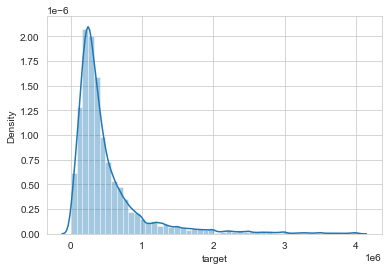

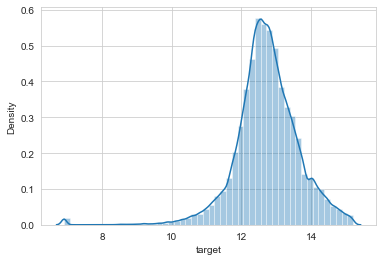

In [95]:
# Brief look at target
def dist_plot(df, column):
    x = df[column]
    sns.set_style('whitegrid')
    sns.distplot(x)
    plt.show()
    
    # LOGARITHMS
    x = np.log(df[column])
    sns.distplot(x)
    plt.show()
    
dist_plot(df, 'target')

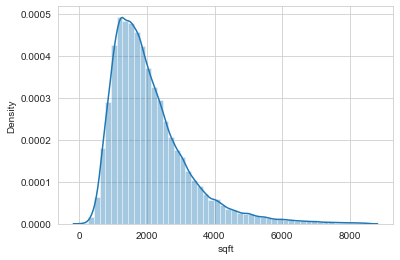

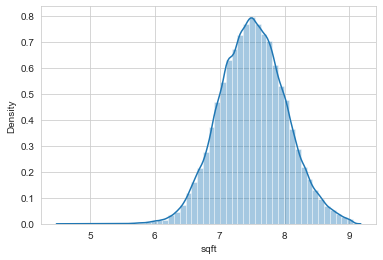

In [96]:
# And other numeric variables
dist_plot(df, 'sqft')

### Create new variables

#### Price/sqft for City and State


In [97]:
df['Price_sqft'] = df['target']/df['sqft']
for state in list(df['state'].unique()):
    df.loc[(df['state'] == state), 'Price_sqft_state'] = df[df['state'] == state]['Price_sqft'].mean()
    
for city in list(df['city'].unique()):
    df.loc[(df['city'] == city), 'Price_sqft_city'] = df[df['city'] == city]['Price_sqft'].mean()

for zipcode in list(df['zipcode'].unique()):
    df.loc[(df['zipcode'] == zipcode), 'Price_sqft_zip'] = df[df['zipcode'] == zipcode]['Price_sqft'].mean() 

In [98]:
# Save df
df.to_csv('half_preproc_data.csv', index=False)

In [9]:
df = pd.read_csv('half_preproc_data.csv')

## 1.3 Create model to predict missing values for  "beds" and "baths"

In [10]:
def preproc(df, column):
    
    # Keep columns we will use and split variables
    df_preproc = df[['propertyType', 'PrivatePool', 'sqft', column]] # TARGET removed
    df_preproc.loc[df_preproc[column].isna(), 'sample'] = 0
    df_preproc.loc[~df_preproc[column].isna(), 'sample'] = 1
    
    # Remove type land because it wont affect baths and beds
    df_preproc = df_preproc[df_preproc['propertyType'] != 'LAND']
    
    # Encode propertyType
    df_preproc['propertyType'] = df_preproc['propertyType'].astype('category').cat.codes
    
    # !!!! Logarithms
    df_preproc[['sqft']] = np.log(df_preproc[['sqft']])   
    
    # Data normalization
    scaler = RobustScaler() 
    df_preproc[['sqft']] = scaler.fit_transform(df_preproc[['sqft']])
    
    
    # Train test data
    train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
    test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)
    train_data[column] = train_data[column].astype('int')
    
    # Outliers from sqft and target
    for col in ['sqft']: 
        train_data['z_score'] = stats.zscore(train_data[col])
        train_data = train_data.loc[train_data['z_score'].abs()<=3]
        train_data.drop('z_score', axis=1, inplace=True)
    
    # Cut target 
    train_data = train_data[train_data[column] < 8]
       
    y = train_data[column].values     # target variable
    X = train_data.drop([column], axis=1)
    X_pred = test_data.drop([column], axis=1)
    
    # Split X, y
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=RANDOM_SEED)
    
    return X_pred, X_train, X_test, y_train, y_test

In [11]:
def run_cat_boost(X_pred, X_train, X_test, y_train, y_test):
    
    model = CatBoostClassifier(iterations = 500,
                              random_seed = RANDOM_SEED,
                              eval_metric='Accuracy',
                                  )
    
    model.fit(X_train, y_train,
             eval_set=(X_test, y_test),
             verbose_eval=100,
             use_best_model=True,
             plot=True
             )
    
    test_predict_catboost = model.predict(X_test)
    missing_values = model.predict(X_pred)
    
    return missing_values

In [12]:
# Beds
X_pred, X_train, X_test, y_train, y_test = preproc(df, 'beds')

In [13]:
beds = run_cat_boost(X_pred, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.156441
0:	learn: 0.5718382	test: 0.5700470	best: 0.5700470 (0)	total: 220ms	remaining: 1m 49s
100:	learn: 0.6057029	test: 0.6041163	best: 0.6046958 (98)	total: 13.1s	remaining: 51.7s
200:	learn: 0.6069718	test: 0.6035768	best: 0.6046958 (98)	total: 27.3s	remaining: 40.6s
300:	learn: 0.6076811	test: 0.6042362	best: 0.6046958 (98)	total: 40.8s	remaining: 26.9s
400:	learn: 0.6080708	test: 0.6042961	best: 0.6046958 (98)	total: 54.6s	remaining: 13.5s
499:	learn: 0.6083605	test: 0.6040563	best: 0.6046958 (98)	total: 1m 9s	remaining: 0us

bestTest = 0.6046957738
bestIteration = 98

Shrink model to first 99 iterations.


In [14]:
# Accuracy around 61% not the best but still better than avearage or guessing
beds_to_df = []
for i in beds:
    beds_to_df.append(i[0])
df.loc[df['beds'].isna(), 'beds'] = beds_to_df

In [15]:
# Baths
X_pred, X_train, X_test, y_train, y_test = preproc(df, 'baths')

In [16]:
baths = run_cat_boost(X_pred, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.156458
0:	learn: 0.5791667	test: 0.5768810	best: 0.5768810 (0)	total: 128ms	remaining: 1m 3s
100:	learn: 0.6144833	test: 0.6105382	best: 0.6108164 (87)	total: 13.4s	remaining: 53.1s
200:	learn: 0.6157449	test: 0.6108363	best: 0.6108363 (200)	total: 28s	remaining: 41.7s
300:	learn: 0.6165446	test: 0.6113528	best: 0.6114323 (288)	total: 41.6s	remaining: 27.5s
400:	learn: 0.6171506	test: 0.6109952	best: 0.6114721 (306)	total: 54.9s	remaining: 13.6s
499:	learn: 0.6178510	test: 0.6110747	best: 0.6115118 (417)	total: 1m 10s	remaining: 0us

bestTest = 0.6115117919
bestIteration = 417

Shrink model to first 418 iterations.


In [17]:
baths_to_df = []
for i in baths:
    baths_to_df.append(i[0])
df.loc[df['baths'].isna(), 'baths'] = baths_to_df

In [18]:
# Final df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 314048 entries, 0 to 314047
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   status            314048 non-null  object 
 1   propertyType      314048 non-null  object 
 2   street            314048 non-null  object 
 3   baths             314048 non-null  float64
 4   fireplace         314048 non-null  int64  
 5   city              314048 non-null  object 
 6   sqft              314048 non-null  float64
 7   zipcode           314048 non-null  int64  
 8   beds              314048 non-null  float64
 9   state             314048 non-null  object 
 10  PrivatePool       314048 non-null  int64  
 11  target            314048 non-null  float64
 12  Remodeled year    314048 non-null  float64
 13  Heating           314048 non-null  object 
 14  Cooling           314048 non-null  int64  
 15  Parking           314048 non-null  int64  
 16  lotsize           31

In [19]:
df.head()

,status,propertyType,street,baths,fireplace,city,sqft,zipcode,beds,state,...,Heating,Cooling,Parking,lotsize,max_rating,schools_around,Price_sqft,Price_sqft_state,Price_sqft_city,Price_sqft_zip
0,ACTIVE,SINGLE FAMILY,240 Heather Ln,3.5,1,SOUTHERN PINES,2900.0,28387,4.0,NC,...,HEAT PUMP,0,0,2900.0,7,8,144.137931,171.296020,181.025683,181.025683
1,FOR SALE,SINGLE FAMILY,12911 E Heroy Ave,3.0,0,SPOKANE VALLEY,1947.0,99216,3.0,WA,...,NO,0,0,5828.0,4,3,159.219312,345.901758,151.160727,157.744031
2,FOR SALE,SINGLE FAMILY,2005 Westridge Rd,2.0,1,LOS ANGELES,3000.0,90049,3.0,CA,...,FORCED AIR,1,1,8626.0,8,3,965.000000,480.531056,618.779736,858.633077
3,FOR SALE,SINGLE FAMILY,4311 Livingston Ave,8.0,1,DALLAS,6457.0,75205,5.0,TX,...,FORCED AIR,1,1,8220.0,9,4,370.915286,172.788575,232.665713,411.811203
4,FOR SALE,TOWNHOUSE,1624 S Newkirk St,2.0,0,PHILADELPHIA,897.0,19145,2.0,PA,...,FORCED AIR,1,0,680.0,0,0,232.998885,198.298056,211.186647,211.207771


In [20]:
# Save preprocessed df
df.to_csv('data_processed.csv', index=False)

### 1.4 Parse coordinates (will be used for visualization)

In [21]:
# df_street = df[['street', 'state', 'zipcode']]

In [22]:
# # We will use street and zip to get coordinates
# for i in range(len(df_street)):
#     address = df_street.loc[i, 'street'] + ', ' + df_street.loc[i, 'state'] + ' ' + df_street.loc[i, 'zipcode'].astype('str')
#     url = url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(address) +'?format=json'
#     response = requests.get(url).json()
#     if len(response) > 0:
#         df_street.loc[i, 'lat'] = round(float(response[0]['lat']), 4)
#         df_street.loc[i, 'lon'] = round(float(response[0]['lon']), 4)
#     else:
#         df_street.loc[i, ['lat', 'lon']] = np.nan

In [23]:
# df

In [24]:
# Save preprocessed df
# df.to_csv('data_processed.csv', index=False)

## 2. Base model

In [25]:
data = pd.read_csv('data_processed.csv')
df = data.copy()

In [26]:
# I will use zipcode only not street and change types for schools
df.drop('street', axis=1, inplace=True)
df[['max_rating', 'schools_around']] = df[['max_rating', 'schools_around']].astype('float')
df['zipcode'] = df['zipcode'].astype('str')

In [27]:
# Split columns by category
def split_columns(df):
    boolean = []
    numeric = []
    category = []
    for i in list(df.dtypes.index):
        if df.dtypes[i] == 'object':
            category.append(i)
        elif df.dtypes[i] == 'float64':
            numeric.append(i)
        else:
            boolean.append(i)
    return boolean, numeric, category

In [28]:
boolean, numeric, category = split_columns(df)

### 2.1 Correlation analysis

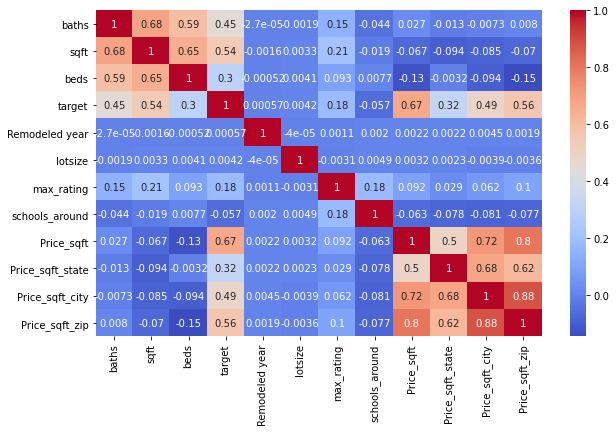

In [29]:
# Build heatmap for numeric variables
def corr_heatmap(df, columns):
    correlation = df[columns].corr()
    plt.figure(figsize=(10, 6))
    sns.heatmap(correlation, annot=True, cmap='coolwarm')
    plt.show()
    
corr_heatmap(df, numeric)

IMPORTANT NOTE: We cannot take price per sqft because it was derived directly from target price 

In [30]:
# Remove some columns
df.drop(['Price_sqft', 'lotsize', 'Remodeled year', 'schools_around'], axis=1, inplace=True)
# df.drop(['Price_sqft', 'Price_sqft_city', 'Price_sqft_state', 'Price_sqft_zip', 'lotsize', 'Remodeled year', 'schools_around'], axis=1, inplace=True)
# df.drop('Price_sqft', axis=1, inplace=True)

In [31]:
# Update columns
boolean, numeric, category = split_columns(df)

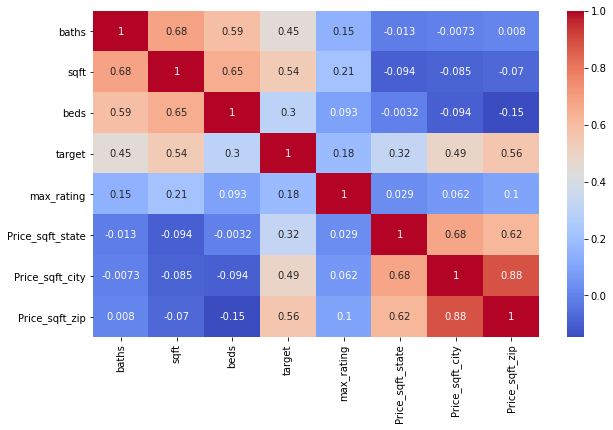

In [32]:
corr_heatmap(df, numeric)

In [33]:
numeric.remove('target')

In [34]:
# F test for category columns
def f_test(df, columns):
    df_f = df.copy()
    enc = OrdinalEncoder()
    df_f[columns] = enc.fit_transform(df_f[columns])
    col_test = pd.Series(f_regression(df_f[columns], df_f['target'])[0], index = columns)
    col_test.sort_values(inplace = True)
    col_test.plot(kind = 'barh')

In [35]:
df.dropna(inplace=True)

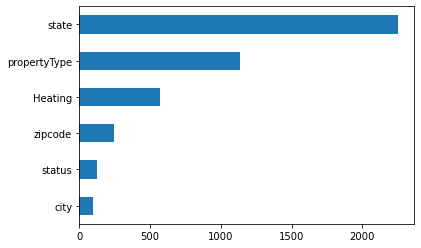

In [36]:
f_test(df, category)

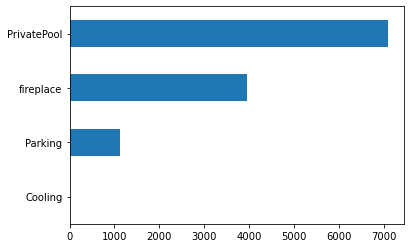

In [37]:
f_test(df, boolean)

In [38]:
# Drop cooling
df.drop('Cooling', axis=1, inplace=True)

In [39]:
# df.drop('PrivatePool', axis=1, inplace=True)

## Clusters idea (not iused)

In [41]:
# Preparation new standartized A
# scaler = StandardScaler()
# X = scaler.fit_transform(df[['sqft', 'target', 'beds', 'baths']])
# cols = df[['sqft', 'target', 'beds', 'baths']].columns
# A = pd.DataFrame(data=X, columns=cols)

In [42]:
# See the contribution of each column
# n_PC = None
# pca = PCA(n_components=n_PC, random_state=RANDOM_SEED)
# PC = pca.fit_transform(A)
# pca.explained_variance_
# var_explained = pca.explained_variance_ratio_
# var_explained

In [43]:
# Keep 2 features (other are included into these 2 with some weight)
# n_PC = 2
# pca = PCA(n_components=n_PC, random_state=RANDOM_SEED)
# PC = pca.fit_transform(A)
# pca.explained_variance_

In [44]:
# Create dataframe with new features
# PCA_2 = pd.DataFrame(data=PC, columns=[['f_1', 'f_2']])

#### Clustering

In [45]:
# Try to define number of clusters
# wcss = []
# for i in range(1, 11):
#     kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
#     kmeans.fit(PCA_2.values)
#     wcss.append(kmeans.inertia_)
# plt.plot(range(1, 11), wcss)
# plt.title('The Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('WCSS')
# plt.show()

In [46]:
# kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
# y_kmeans = kmeans.fit_predict(PCA_2.values)

In [47]:
# df['cluster'] = y_kmeans

### 2.2 Preproc and base model

In [65]:
def preproc(df, target):
    
    # Keep columns we will use and split variables
    df_preproc = df.copy()
    
    # Encode categories separately
    # OneHot
    enc = OneHotEncoder(handle_unknown='ignore')
#     array_enc = enc.fit_transform(df_preproc[['propertyType', 'Heating', 'status']]).toarray()
#     df_preproc[list(enc.get_feature_names(['propertyType', 'Heating', 'status']))] = array_enc #add columns
#     df_preproc.drop(['propertyType', 'Heating', 'status'], axis=1, inplace=True)
     
    # LabelEncoder
    enc_ord = OrdinalEncoder()
    df_preproc[['zipcode', 'city', 'state', 'propertyType', 'Heating', 'status']] = enc_ord.fit_transform(df_preproc[['zipcode', 'city', 'state', 'propertyType', 'Heating', 'status']])
#     df_preproc[['state']] = enc_ord.fit_transform(df_preproc[['state']])
    
    # Remove outliers
    for col in numeric: 
        df_preproc['z_score'] = stats.zscore(df_preproc[col])
        df_preproc = df_preproc.loc[df_preproc['z_score'].abs()<=3]
        df_preproc.drop('z_score', axis=1, inplace=True)
    
    # Logarithms
    df_preproc[['sqft', 'Price_sqft_state', 'Price_sqft_city', 'Price_sqft_zip']] = np.log(df_preproc[['sqft', 'Price_sqft_state', 'Price_sqft_city', 'Price_sqft_zip']])
    
    # Data normalization
    scaler = RobustScaler()
    df_preproc[numeric] = scaler.fit_transform(df_preproc[numeric])
    
    y = df_preproc[target].values     # target variable
    X = df_preproc.drop([target], axis=1)
    
    # Split X, y
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=RANDOM_SEED, stratify=X['state'])
    
    return X_train, X_test, y_train, y_test, enc, enc_ord, scaler

In [66]:
def run_cat_boost_regressor(X_train, X_test, y_train, y_test):
    
    def mape(y_true, y_pred):
        return np.mean(np.abs((y_pred-y_true)/y_true))
    
    model = CatBoostRegressor(iterations = 15000,
                              depth=10,
                              learning_rate = 0.5,
                              random_seed = RANDOM_SEED,
                              eval_metric='MAPE',
                              custom_metric=['RMSE', 'MAE'],
                              od_wait=500,
                              )
    
    model.fit(X_train, np.log(y_train),
             eval_set=(X_test, np.log(y_test)),
             verbose_eval=100,
             use_best_model=True,
             plot=True
             )
    
    test_predict_catboost = np.exp(model.predict(X_test))
#     test_predict_catboost = model.predict(X_test)
    
    print(f"TEST mape: {(mape(y_test, test_predict_catboost))*100:0.2f}%")
    
    return model, test_predict_catboost

In [67]:
def save_model(model):
    filename = 'best_model.pkl'
    pickle.dump(model, open(filename, 'wb'))

In [68]:
X_train, X_test, y_train, y_test, enc, enc_ord, robust_scaler = preproc(df, 'target')

In [69]:
X_train

,status,propertyType,baths,fireplace,city,sqft,zipcode,beds,state,PrivatePool,Heating,Parking,max_rating,Price_sqft_state,Price_sqft_city,Price_sqft_zip
181040,2.0,8.0,0.0,1,261.0,0.389844,1475.0,1.0,28.0,0,5.0,0,-0.666667,-0.680009,-0.291246,-0.797710
125278,2.0,0.0,0.0,0,273.0,-0.227683,2171.0,-1.0,9.0,1,5.0,1,0.333333,0.000000,0.436559,1.473227
293159,2.0,9.0,1.0,0,826.0,-0.250804,3250.0,0.0,21.0,0,1.0,1,0.666667,-0.173536,0.086027,-0.072237
110796,5.0,8.0,0.0,0,365.0,-0.590690,1158.0,0.0,6.0,1,1.0,1,-0.333333,0.286766,0.044005,0.349792
108292,2.0,0.0,0.0,0,273.0,-0.227683,2178.0,-1.0,9.0,0,1.0,1,1.000000,0.000000,0.436559,1.055074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72135,5.0,0.0,-1.0,0,946.0,-1.621814,1137.0,-2.0,6.0,0,1.0,1,-1.333333,0.286766,1.036352,1.297027
268740,2.0,8.0,2.0,1,1443.0,1.015588,2671.0,1.0,29.0,0,5.0,1,1.000000,-0.713234,-0.325095,0.036772
300173,5.0,9.0,0.0,0,1328.0,-0.526330,2787.0,0.0,29.0,0,4.0,1,-0.666667,-0.713234,-0.510462,-0.616295
25460,2.0,9.0,1.0,1,692.0,-0.241715,2639.0,0.0,29.0,0,5.0,1,0.000000,-0.713234,-0.039743,-0.665661


### Simple linear regression

In [70]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [71]:
lm = LinearRegression()
lm.fit(X_train, y_train)
lm_pred = lm.predict(X_test)

In [72]:
# MAPE
print(f"TEST mape: {(mape(y_test, lm_pred))*100:0.2f}%")

TEST mape: 253.88%


### Simple average across states

In [73]:
states = list(X_train['state'].unique())
avg_state = {}
full_train = X_train.copy()
full_train['price'] = y_train
for state in states:
    avg_state[state] = full_train[full_train['state'] == state].price.mean()

In [75]:
full_test = X_test.copy()
full_test['price'] = 0

In [78]:
for i in list(full_test.index):
    full_test.loc[i, 'price'] = avg_state[full_test.loc[i, 'state']]

In [79]:
avg_pred = full_test['price']
# MAPE
print(f"TEST mape: {(mape(y_test, avg_pred))*100:0.2f}%")

TEST mape: 146.67%


### 2.3 CatBoost

In [80]:
model, predict = run_cat_boost_regressor(X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.0328100	test: 0.0328693	best: 0.0328693 (0)	total: 58.2ms	remaining: 14m 32s
100:	learn: 0.0162152	test: 0.0175468	best: 0.0175468 (100)	total: 5.71s	remaining: 14m 2s
200:	learn: 0.0148164	test: 0.0171376	best: 0.0171373 (199)	total: 13.3s	remaining: 16m 22s
300:	learn: 0.0139303	test: 0.0169406	best: 0.0169406 (300)	total: 21.3s	remaining: 17m 22s
400:	learn: 0.0131897	test: 0.0168420	best: 0.0168393 (387)	total: 29.7s	remaining: 18m 1s
500:	learn: 0.0126076	test: 0.0167930	best: 0.0167915 (486)	total: 37.7s	remaining: 18m 11s
600:	learn: 0.0120984	test: 0.0167564	best: 0.0167532 (592)	total: 45.6s	remaining: 18m 12s
700:	learn: 0.0116803	test: 0.0167268	best: 0.0167268 (700)	total: 54.1s	remaining: 18m 22s
800:	learn: 0.0113026	test: 0.0167143	best: 0.0167120 (748)	total: 1m 2s	remaining: 18m 35s
900:	learn: 0.0109356	test: 0.0167113	best: 0.0167113 (900)	total: 1m 10s	remaining: 18m 30s
1000:	learn: 0.0105960	test: 0.0166893	best: 0.0166882 (999)	total: 1m 19s	remaining

#### Good MAPE achieved Let's try to improve it 

In [81]:
# Save model and encoders to pickle
save_model(model)

In [82]:
filename = 'robust_scaler.pkl'
pickle.dump(robust_scaler, open(filename, 'wb'))

In [83]:
filename = 'one_hot_enc.pkl'
pickle.dump(enc, open(filename, 'wb'))

In [84]:
filename = 'ord_enc.pkl'
pickle.dump(enc_ord, open(filename, 'wb'))

### 2.4 Other models

In [85]:
def mape(y_true, y_pred):
        return np.mean(np.abs((y_pred-y_true)/y_true))

#### Random Forest

In [86]:
rf = RandomForestRegressor(
 n_estimators=300, 
 min_samples_split=2,
 min_samples_leaf=1,
 max_features=10,
 max_depth=89,
 bootstrap=True, 
 random_state=42)

rf.fit(X_train, np.log(y_train))
predict_test = np.exp(rf.predict(X_test))
print(f"MAPE: {(mape(y_test, predict_test))*100:0.2f}%")

MAPE: 22.24%


In [87]:
# n_estimators = [int(x) for x in np.linspace(start=200, stop=1000, num=10)]
# max_features = ['auto', 'sqrt']
# max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
# max_depth.append(None)
# min_samples_split = [2, 5, 10]
# min_samples_leaf = [1, 2, 4]
# bootstrap = [True, False]
# random_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
#                'max_depth': max_depth,
#                'min_samples_split': min_samples_split,
#                'min_samples_leaf': min_samples_leaf,
#                'bootstrap': bootstrap}

# rf_random = GridSearchCV(estimator=rf, param_grid=random_grid, scoring='neg_root_mean_squared_error', cv=3, n_jobs=-1)
# rf_random.fit(X_train, np.log(y_train))

# print(rf_random.best_params_)

#### XGBoost

In [88]:
# XG with random params
xg_reg = xgb.XGBRegressor(colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 3000)
xg_reg.fit(X_train, np.log(y_train))
test_predict = np.exp(xg_reg.predict(X_test))
print(f"XGBoost MAPE: {mape(y_test, test_predict)*100:0.3f}%")

XGBoost MAPE: 23.432%


### 2.5 Cross validation

In [89]:
X = pd.concat([X_train, X_test]).reset_index(drop=True)
y = pd.DataFrame(data=np.append(y_train, y_test), columns = ['target'])

In [90]:
print(len(X))
print(len(y))

292292
292292


In [91]:
# def mape(y_true, y_pred):
#     return np.mean(np.abs((y_pred-y_true)/y_true))

In [92]:
# Validate the results on 5 folds CV using best model (catboost)
kf = KFold(n_splits=5, shuffle=True)
MAPES = []

for i, (train_index, valid_index) in enumerate(kf.split(X)):
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_valid, y_valid = X.iloc[valid_index], y.iloc[valid_index]

    model = CatBoostRegressor(iterations = 15000,
                              depth=10,
                              learning_rate = 0.5,
                              random_seed = RANDOM_SEED,
                              eval_metric='MAPE',
                              custom_metric=['RMSE', 'MAE'],
                              od_wait=500,
                              )
    
    model.fit(X_train, np.log(y_train),
             eval_set=(X_valid, np.log(y_valid)),
             verbose_eval=100,
             use_best_model=True
             )
    
    test_predict_catboost = np.exp(model.predict(X_valid))
    
    mape = np.mean(np.abs((y_valid['target'] - test_predict_catboost)/(y_valid['target'])))

    MAPES.append(mape)

0:	learn: 0.0328665	test: 0.0330216	best: 0.0330216 (0)	total: 82.2ms	remaining: 20m 33s
100:	learn: 0.0162113	test: 0.0175815	best: 0.0175815 (100)	total: 8.3s	remaining: 20m 25s
200:	learn: 0.0148904	test: 0.0171163	best: 0.0171163 (200)	total: 16.9s	remaining: 20m 43s
300:	learn: 0.0140213	test: 0.0169462	best: 0.0169462 (300)	total: 25.8s	remaining: 21m 1s
400:	learn: 0.0133804	test: 0.0168333	best: 0.0168333 (400)	total: 34.6s	remaining: 21m 1s
500:	learn: 0.0128293	test: 0.0167596	best: 0.0167585 (499)	total: 43.5s	remaining: 20m 58s
600:	learn: 0.0123401	test: 0.0167095	best: 0.0167095 (600)	total: 51.8s	remaining: 20m 40s
700:	learn: 0.0119257	test: 0.0166821	best: 0.0166821 (700)	total: 60s	remaining: 20m 23s
800:	learn: 0.0115493	test: 0.0166355	best: 0.0166355 (800)	total: 1m 8s	remaining: 20m 10s
900:	learn: 0.0112266	test: 0.0166118	best: 0.0166107 (898)	total: 1m 16s	remaining: 19m 58s
1000:	learn: 0.0109057	test: 0.0165915	best: 0.0165893 (993)	total: 1m 24s	remaining: 1

1700:	learn: 0.0091945	test: 0.0163285	best: 0.0163273 (1697)	total: 2m 28s	remaining: 19m 24s
1800:	learn: 0.0090167	test: 0.0163359	best: 0.0163251 (1716)	total: 2m 37s	remaining: 19m 14s
1900:	learn: 0.0088446	test: 0.0163268	best: 0.0163251 (1716)	total: 2m 46s	remaining: 19m 6s
2000:	learn: 0.0086727	test: 0.0163298	best: 0.0163251 (1716)	total: 2m 54s	remaining: 18m 55s
2100:	learn: 0.0085060	test: 0.0163300	best: 0.0163251 (1716)	total: 3m 3s	remaining: 18m 45s
2200:	learn: 0.0083537	test: 0.0163317	best: 0.0163251 (1716)	total: 3m 11s	remaining: 18m 35s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.01632506054
bestIteration = 1716

Shrink model to first 1717 iterations.
0:	learn: 0.0330293	test: 0.0327741	best: 0.0327741 (0)	total: 96.2ms	remaining: 24m 2s
100:	learn: 0.0161846	test: 0.0173913	best: 0.0173913 (100)	total: 8.63s	remaining: 21m 13s
200:	learn: 0.0149250	test: 0.0169946	best: 0.0169946 (200)	total: 17.4s	remaining: 21m 22s
300:	learn: 0.0140

In [93]:
MAPES

[0.22615255661246803,
 0.22841380876892228,
 0.23455095278943816,
 0.22533236139874202,
 0.2220631347549171]

In [94]:
# AVG MAPE after cross validation
print(f"CV MAPE: {np.mean(MAPES)*100:0.3f}%") 

CV MAPE: 22.730%


In [95]:
# CV for random forest (Takes forever)
kf = KFold(n_splits=5, shuffle=True)
MAPES = []

for i, (train_index, valid_index) in enumerate(kf.split(X)):
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_valid, y_valid = X.iloc[valid_index], y.iloc[valid_index]

    rf = RandomForestRegressor(
     n_estimators=300, 
     min_samples_split=2,
     min_samples_leaf=1,
     max_features=10,
     max_depth=89,
     bootstrap=True, 
     random_state=42)

    rf.fit(X_train, np.log(y_train))
    predict_test = np.exp(rf.predict(X_valid))
    
    mape = np.mean(np.abs((y_valid['target'] - predict_test)/(y_valid['target'])))

    MAPES.append(mape)
    
    
print(f"CV MAPE: {np.mean(MAPES)*100:0.3f}%")

CV MAPE: 21.815%


### 2.6 Bagging 

In [98]:
# Blending catboost and RF
# CatBoost
bagged_catboost = BaggingRegressor(
    base_estimator=model,
    n_estimators=10,
)

bagged_catboost.fit(X_train, y_train)
y_bagging_pred = bagged_catboost.predict(X_test)

0:	learn: 1.6906734	total: 65.5ms	remaining: 16m 21s
1:	learn: 1.2076421	total: 137ms	remaining: 17m 8s
2:	learn: 0.9269335	total: 207ms	remaining: 17m 16s
3:	learn: 0.7868327	total: 287ms	remaining: 17m 56s
4:	learn: 0.7324862	total: 363ms	remaining: 18m 9s
5:	learn: 0.6493172	total: 441ms	remaining: 18m 21s
6:	learn: 0.6276880	total: 523ms	remaining: 18m 40s
7:	learn: 0.5863866	total: 600ms	remaining: 18m 43s
8:	learn: 0.5189273	total: 678ms	remaining: 18m 49s
9:	learn: 0.4760631	total: 771ms	remaining: 19m 15s
10:	learn: 0.4570800	total: 854ms	remaining: 19m 23s
11:	learn: 0.4603770	total: 934ms	remaining: 19m 26s
12:	learn: 0.4586318	total: 1.02s	remaining: 19m 40s
13:	learn: 0.4369057	total: 1.1s	remaining: 19m 43s
14:	learn: 0.4304816	total: 1.19s	remaining: 19m 43s
15:	learn: 0.4178323	total: 1.27s	remaining: 19m 47s
16:	learn: 0.4173964	total: 1.35s	remaining: 19m 50s
17:	learn: 0.4171847	total: 1.43s	remaining: 19m 50s
18:	learn: 0.4160560	total: 1.51s	remaining: 19m 54s
19:	l

157:	learn: 0.3029875	total: 13.1s	remaining: 20m 34s
158:	learn: 0.3026475	total: 13.2s	remaining: 20m 35s
159:	learn: 0.3023683	total: 13.3s	remaining: 20m 34s
160:	learn: 0.3023038	total: 13.4s	remaining: 20m 34s
161:	learn: 0.3020986	total: 13.5s	remaining: 20m 34s
162:	learn: 0.3021690	total: 13.6s	remaining: 20m 33s
163:	learn: 0.3018335	total: 13.6s	remaining: 20m 33s
164:	learn: 0.3013659	total: 13.7s	remaining: 20m 33s
165:	learn: 0.3008743	total: 13.8s	remaining: 20m 32s
166:	learn: 0.3015570	total: 13.9s	remaining: 20m 32s
167:	learn: 0.3012230	total: 14s	remaining: 20m 32s
168:	learn: 0.3011149	total: 14s	remaining: 20m 31s
169:	learn: 0.3009954	total: 14.1s	remaining: 20m 31s
170:	learn: 0.3008413	total: 14.2s	remaining: 20m 32s
171:	learn: 0.3006177	total: 14.3s	remaining: 20m 31s
172:	learn: 0.2997860	total: 14.4s	remaining: 20m 31s
173:	learn: 0.2990306	total: 14.5s	remaining: 20m 31s
174:	learn: 0.2989253	total: 14.5s	remaining: 20m 31s
175:	learn: 0.2988608	total: 14.

311:	learn: 0.2720334	total: 25.9s	remaining: 20m 17s
312:	learn: 0.2717645	total: 25.9s	remaining: 20m 17s
313:	learn: 0.2712627	total: 26s	remaining: 20m 17s
314:	learn: 0.2713809	total: 26.1s	remaining: 20m 17s
315:	learn: 0.2712912	total: 26.2s	remaining: 20m 17s
316:	learn: 0.2711767	total: 26.3s	remaining: 20m 16s
317:	learn: 0.2709488	total: 26.4s	remaining: 20m 16s
318:	learn: 0.2706678	total: 26.4s	remaining: 20m 16s
319:	learn: 0.2707254	total: 26.5s	remaining: 20m 16s
320:	learn: 0.2694789	total: 26.6s	remaining: 20m 16s
321:	learn: 0.2692315	total: 26.7s	remaining: 20m 15s
322:	learn: 0.2688744	total: 26.8s	remaining: 20m 15s
323:	learn: 0.2686334	total: 26.8s	remaining: 20m 15s
324:	learn: 0.2684500	total: 26.9s	remaining: 20m 15s
325:	learn: 0.2684132	total: 27s	remaining: 20m 14s
326:	learn: 0.2684282	total: 27.1s	remaining: 20m 14s
327:	learn: 0.2683641	total: 27.1s	remaining: 20m 14s
328:	learn: 0.2678283	total: 27.2s	remaining: 20m 13s
329:	learn: 0.2675594	total: 27.

466:	learn: 0.2436789	total: 38.5s	remaining: 19m 56s
467:	learn: 0.2436488	total: 38.5s	remaining: 19m 56s
468:	learn: 0.2434844	total: 38.6s	remaining: 19m 56s
469:	learn: 0.2435159	total: 38.7s	remaining: 19m 56s
470:	learn: 0.2434161	total: 38.8s	remaining: 19m 56s
471:	learn: 0.2433814	total: 38.9s	remaining: 19m 56s
472:	learn: 0.2432554	total: 38.9s	remaining: 19m 56s
473:	learn: 0.2430861	total: 39s	remaining: 19m 56s
474:	learn: 0.2397543	total: 39.1s	remaining: 19m 56s
475:	learn: 0.2396992	total: 39.2s	remaining: 19m 56s
476:	learn: 0.2396797	total: 39.3s	remaining: 19m 56s
477:	learn: 0.2395958	total: 39.4s	remaining: 19m 55s
478:	learn: 0.2395315	total: 39.4s	remaining: 19m 55s
479:	learn: 0.2394838	total: 39.5s	remaining: 19m 55s
480:	learn: 0.2393892	total: 39.6s	remaining: 19m 55s
481:	learn: 0.2393265	total: 39.7s	remaining: 19m 55s
482:	learn: 0.2390656	total: 39.8s	remaining: 19m 55s
483:	learn: 0.2391948	total: 39.9s	remaining: 19m 55s
484:	learn: 0.2390315	total: 3

621:	learn: 0.2269609	total: 51.5s	remaining: 19m 51s
622:	learn: 0.2269313	total: 51.6s	remaining: 19m 51s
623:	learn: 0.2264792	total: 51.7s	remaining: 19m 51s
624:	learn: 0.2264734	total: 51.8s	remaining: 19m 51s
625:	learn: 0.2262472	total: 51.9s	remaining: 19m 51s
626:	learn: 0.2262154	total: 52s	remaining: 19m 51s
627:	learn: 0.2261763	total: 52.1s	remaining: 19m 51s
628:	learn: 0.2257335	total: 52.1s	remaining: 19m 51s
629:	learn: 0.2257415	total: 52.2s	remaining: 19m 50s
630:	learn: 0.2255525	total: 52.3s	remaining: 19m 50s
631:	learn: 0.2255207	total: 52.4s	remaining: 19m 50s
632:	learn: 0.2255438	total: 52.5s	remaining: 19m 50s
633:	learn: 0.2255571	total: 52.5s	remaining: 19m 50s
634:	learn: 0.2255499	total: 52.6s	remaining: 19m 50s
635:	learn: 0.2254380	total: 52.7s	remaining: 19m 49s
636:	learn: 0.2249471	total: 52.8s	remaining: 19m 49s
637:	learn: 0.2249137	total: 52.9s	remaining: 19m 49s
638:	learn: 0.2249101	total: 52.9s	remaining: 19m 49s
639:	learn: 0.2249139	total: 5

774:	learn: 0.2152565	total: 1m 4s	remaining: 19m 34s
775:	learn: 0.2150085	total: 1m 4s	remaining: 19m 34s
776:	learn: 0.2151850	total: 1m 4s	remaining: 19m 34s
777:	learn: 0.2150063	total: 1m 4s	remaining: 19m 34s
778:	learn: 0.2150276	total: 1m 4s	remaining: 19m 34s
779:	learn: 0.2150040	total: 1m 4s	remaining: 19m 34s
780:	learn: 0.2148928	total: 1m 4s	remaining: 19m 34s
781:	learn: 0.2146691	total: 1m 4s	remaining: 19m 33s
782:	learn: 0.2145292	total: 1m 4s	remaining: 19m 33s
783:	learn: 0.2145435	total: 1m 4s	remaining: 19m 33s
784:	learn: 0.2145130	total: 1m 4s	remaining: 19m 33s
785:	learn: 0.2147289	total: 1m 4s	remaining: 19m 33s
786:	learn: 0.2140431	total: 1m 4s	remaining: 19m 33s
787:	learn: 0.2140076	total: 1m 5s	remaining: 19m 33s
788:	learn: 0.2140307	total: 1m 5s	remaining: 19m 32s
789:	learn: 0.2139844	total: 1m 5s	remaining: 19m 32s
790:	learn: 0.2136718	total: 1m 5s	remaining: 19m 32s
791:	learn: 0.2134655	total: 1m 5s	remaining: 19m 32s
792:	learn: 0.2131867	total:

927:	learn: 0.2020188	total: 1m 16s	remaining: 19m 19s
928:	learn: 0.2019373	total: 1m 16s	remaining: 19m 19s
929:	learn: 0.2018130	total: 1m 16s	remaining: 19m 19s
930:	learn: 0.2017038	total: 1m 16s	remaining: 19m 19s
931:	learn: 0.2015628	total: 1m 16s	remaining: 19m 19s
932:	learn: 0.2014370	total: 1m 16s	remaining: 19m 19s
933:	learn: 0.2012234	total: 1m 16s	remaining: 19m 19s
934:	learn: 0.2011942	total: 1m 17s	remaining: 19m 19s
935:	learn: 0.2011128	total: 1m 17s	remaining: 19m 18s
936:	learn: 0.2009551	total: 1m 17s	remaining: 19m 18s
937:	learn: 0.2008845	total: 1m 17s	remaining: 19m 18s
938:	learn: 0.2010303	total: 1m 17s	remaining: 19m 18s
939:	learn: 0.2009713	total: 1m 17s	remaining: 19m 18s
940:	learn: 0.2008235	total: 1m 17s	remaining: 19m 18s
941:	learn: 0.2009238	total: 1m 17s	remaining: 19m 18s
942:	learn: 0.2006593	total: 1m 17s	remaining: 19m 18s
943:	learn: 0.2004742	total: 1m 17s	remaining: 19m 18s
944:	learn: 0.2004138	total: 1m 17s	remaining: 19m 18s
945:	learn

1076:	learn: 0.1902308	total: 1m 28s	remaining: 19m 8s
1077:	learn: 0.1902128	total: 1m 28s	remaining: 19m 8s
1078:	learn: 0.1903497	total: 1m 28s	remaining: 19m 8s
1079:	learn: 0.1903363	total: 1m 29s	remaining: 19m 8s
1080:	learn: 0.1904310	total: 1m 29s	remaining: 19m 8s
1081:	learn: 0.1904183	total: 1m 29s	remaining: 19m 8s
1082:	learn: 0.1904035	total: 1m 29s	remaining: 19m 8s
1083:	learn: 0.1904145	total: 1m 29s	remaining: 19m 7s
1084:	learn: 0.1903812	total: 1m 29s	remaining: 19m 7s
1085:	learn: 0.1904550	total: 1m 29s	remaining: 19m 7s
1086:	learn: 0.1904699	total: 1m 29s	remaining: 19m 7s
1087:	learn: 0.1898366	total: 1m 29s	remaining: 19m 7s
1088:	learn: 0.1897838	total: 1m 29s	remaining: 19m 7s
1089:	learn: 0.1896512	total: 1m 29s	remaining: 19m 7s
1090:	learn: 0.1897673	total: 1m 29s	remaining: 19m 7s
1091:	learn: 0.1897522	total: 1m 30s	remaining: 19m 7s
1092:	learn: 0.1896989	total: 1m 30s	remaining: 19m 7s
1093:	learn: 0.1895740	total: 1m 30s	remaining: 19m 6s
1094:	lear

1225:	learn: 0.1813454	total: 1m 40s	remaining: 18m 54s
1226:	learn: 0.1813314	total: 1m 41s	remaining: 18m 53s
1227:	learn: 0.1811695	total: 1m 41s	remaining: 18m 53s
1228:	learn: 0.1810800	total: 1m 41s	remaining: 18m 53s
1229:	learn: 0.1810618	total: 1m 41s	remaining: 18m 53s
1230:	learn: 0.1810436	total: 1m 41s	remaining: 18m 53s
1231:	learn: 0.1810527	total: 1m 41s	remaining: 18m 53s
1232:	learn: 0.1810752	total: 1m 41s	remaining: 18m 53s
1233:	learn: 0.1810944	total: 1m 41s	remaining: 18m 53s
1234:	learn: 0.1810934	total: 1m 41s	remaining: 18m 53s
1235:	learn: 0.1810948	total: 1m 41s	remaining: 18m 52s
1236:	learn: 0.1810795	total: 1m 41s	remaining: 18m 52s
1237:	learn: 0.1809983	total: 1m 41s	remaining: 18m 52s
1238:	learn: 0.1809757	total: 1m 41s	remaining: 18m 52s
1239:	learn: 0.1808470	total: 1m 42s	remaining: 18m 52s
1240:	learn: 0.1807817	total: 1m 42s	remaining: 18m 52s
1241:	learn: 0.1807713	total: 1m 42s	remaining: 18m 52s
1242:	learn: 0.1807593	total: 1m 42s	remaining: 

1374:	learn: 0.1715322	total: 1m 53s	remaining: 18m 39s
1375:	learn: 0.1715261	total: 1m 53s	remaining: 18m 39s
1376:	learn: 0.1715232	total: 1m 53s	remaining: 18m 39s
1377:	learn: 0.1712674	total: 1m 53s	remaining: 18m 39s
1378:	learn: 0.1713349	total: 1m 53s	remaining: 18m 39s
1379:	learn: 0.1713647	total: 1m 53s	remaining: 18m 39s
1380:	learn: 0.1711069	total: 1m 53s	remaining: 18m 39s
1381:	learn: 0.1710879	total: 1m 53s	remaining: 18m 39s
1382:	learn: 0.1711109	total: 1m 53s	remaining: 18m 39s
1383:	learn: 0.1710706	total: 1m 53s	remaining: 18m 38s
1384:	learn: 0.1710122	total: 1m 53s	remaining: 18m 38s
1385:	learn: 0.1708993	total: 1m 53s	remaining: 18m 38s
1386:	learn: 0.1708286	total: 1m 53s	remaining: 18m 38s
1387:	learn: 0.1708228	total: 1m 54s	remaining: 18m 38s
1388:	learn: 0.1708510	total: 1m 54s	remaining: 18m 38s
1389:	learn: 0.1708739	total: 1m 54s	remaining: 18m 38s
1390:	learn: 0.1707671	total: 1m 54s	remaining: 18m 38s
1391:	learn: 0.1707048	total: 1m 54s	remaining: 

1524:	learn: 0.1629953	total: 2m 5s	remaining: 18m 25s
1525:	learn: 0.1631722	total: 2m 5s	remaining: 18m 25s
1526:	learn: 0.1631118	total: 2m 5s	remaining: 18m 25s
1527:	learn: 0.1631017	total: 2m 5s	remaining: 18m 25s
1528:	learn: 0.1630114	total: 2m 5s	remaining: 18m 25s
1529:	learn: 0.1630123	total: 2m 5s	remaining: 18m 25s
1530:	learn: 0.1630154	total: 2m 5s	remaining: 18m 25s
1531:	learn: 0.1629891	total: 2m 5s	remaining: 18m 25s
1532:	learn: 0.1630199	total: 2m 5s	remaining: 18m 25s
1533:	learn: 0.1629116	total: 2m 5s	remaining: 18m 24s
1534:	learn: 0.1629113	total: 2m 5s	remaining: 18m 24s
1535:	learn: 0.1628031	total: 2m 6s	remaining: 18m 24s
1536:	learn: 0.1627502	total: 2m 6s	remaining: 18m 24s
1537:	learn: 0.1626808	total: 2m 6s	remaining: 18m 24s
1538:	learn: 0.1626316	total: 2m 6s	remaining: 18m 24s
1539:	learn: 0.1624003	total: 2m 6s	remaining: 18m 24s
1540:	learn: 0.1623272	total: 2m 6s	remaining: 18m 24s
1541:	learn: 0.1622200	total: 2m 6s	remaining: 18m 24s
1542:	lear

1673:	learn: 0.1540536	total: 2m 17s	remaining: 18m 14s
1674:	learn: 0.1540352	total: 2m 17s	remaining: 18m 14s
1675:	learn: 0.1540338	total: 2m 17s	remaining: 18m 14s
1676:	learn: 0.1541128	total: 2m 17s	remaining: 18m 14s
1677:	learn: 0.1541256	total: 2m 17s	remaining: 18m 14s
1678:	learn: 0.1539669	total: 2m 17s	remaining: 18m 14s
1679:	learn: 0.1539488	total: 2m 18s	remaining: 18m 14s
1680:	learn: 0.1539798	total: 2m 18s	remaining: 18m 14s
1681:	learn: 0.1539653	total: 2m 18s	remaining: 18m 14s
1682:	learn: 0.1539034	total: 2m 18s	remaining: 18m 14s
1683:	learn: 0.1539555	total: 2m 18s	remaining: 18m 14s
1684:	learn: 0.1538627	total: 2m 18s	remaining: 18m 13s
1685:	learn: 0.1538696	total: 2m 18s	remaining: 18m 13s
1686:	learn: 0.1538647	total: 2m 18s	remaining: 18m 13s
1687:	learn: 0.1538298	total: 2m 18s	remaining: 18m 13s
1688:	learn: 0.1538094	total: 2m 18s	remaining: 18m 13s
1689:	learn: 0.1538022	total: 2m 18s	remaining: 18m 13s
1690:	learn: 0.1536096	total: 2m 18s	remaining: 

1823:	learn: 0.1481759	total: 2m 29s	remaining: 18m 2s
1824:	learn: 0.1481659	total: 2m 29s	remaining: 18m 1s
1825:	learn: 0.1480481	total: 2m 29s	remaining: 18m 1s
1826:	learn: 0.1480602	total: 2m 30s	remaining: 18m 1s
1827:	learn: 0.1480621	total: 2m 30s	remaining: 18m 1s
1828:	learn: 0.1480560	total: 2m 30s	remaining: 18m 1s
1829:	learn: 0.1480304	total: 2m 30s	remaining: 18m 1s
1830:	learn: 0.1478402	total: 2m 30s	remaining: 18m 1s
1831:	learn: 0.1478370	total: 2m 30s	remaining: 18m 1s
1832:	learn: 0.1478331	total: 2m 30s	remaining: 18m 1s
1833:	learn: 0.1478097	total: 2m 30s	remaining: 18m 1s
1834:	learn: 0.1477312	total: 2m 30s	remaining: 18m 1s
1835:	learn: 0.1476995	total: 2m 30s	remaining: 18m 1s
1836:	learn: 0.1476873	total: 2m 30s	remaining: 18m 1s
1837:	learn: 0.1476663	total: 2m 31s	remaining: 18m 1s
1838:	learn: 0.1476340	total: 2m 31s	remaining: 18m 1s
1839:	learn: 0.1474479	total: 2m 31s	remaining: 18m 1s
1840:	learn: 0.1474240	total: 2m 31s	remaining: 18m 1s
1841:	lear

1972:	learn: 0.1418372	total: 2m 42s	remaining: 17m 50s
1973:	learn: 0.1417983	total: 2m 42s	remaining: 17m 50s
1974:	learn: 0.1416858	total: 2m 42s	remaining: 17m 50s
1975:	learn: 0.1417312	total: 2m 42s	remaining: 17m 50s
1976:	learn: 0.1417111	total: 2m 42s	remaining: 17m 50s
1977:	learn: 0.1416939	total: 2m 42s	remaining: 17m 50s
1978:	learn: 0.1416323	total: 2m 42s	remaining: 17m 49s
1979:	learn: 0.1416114	total: 2m 42s	remaining: 17m 49s
1980:	learn: 0.1415584	total: 2m 42s	remaining: 17m 49s
1981:	learn: 0.1415313	total: 2m 42s	remaining: 17m 49s
1982:	learn: 0.1415478	total: 2m 42s	remaining: 17m 49s
1983:	learn: 0.1415334	total: 2m 43s	remaining: 17m 49s
1984:	learn: 0.1415250	total: 2m 43s	remaining: 17m 49s
1985:	learn: 0.1414875	total: 2m 43s	remaining: 17m 49s
1986:	learn: 0.1414646	total: 2m 43s	remaining: 17m 49s
1987:	learn: 0.1414004	total: 2m 43s	remaining: 17m 49s
1988:	learn: 0.1413857	total: 2m 43s	remaining: 17m 49s
1989:	learn: 0.1414006	total: 2m 43s	remaining: 

2120:	learn: 0.1365171	total: 2m 54s	remaining: 17m 42s
2121:	learn: 0.1365200	total: 2m 55s	remaining: 17m 42s
2122:	learn: 0.1364900	total: 2m 55s	remaining: 17m 42s
2123:	learn: 0.1364543	total: 2m 55s	remaining: 17m 42s
2124:	learn: 0.1364386	total: 2m 55s	remaining: 17m 42s
2125:	learn: 0.1364231	total: 2m 55s	remaining: 17m 42s
2126:	learn: 0.1363917	total: 2m 55s	remaining: 17m 42s
2127:	learn: 0.1363497	total: 2m 55s	remaining: 17m 42s
2128:	learn: 0.1363763	total: 2m 55s	remaining: 17m 42s
2129:	learn: 0.1363523	total: 2m 55s	remaining: 17m 42s
2130:	learn: 0.1363146	total: 2m 55s	remaining: 17m 42s
2131:	learn: 0.1363434	total: 2m 55s	remaining: 17m 42s
2132:	learn: 0.1363472	total: 2m 56s	remaining: 17m 42s
2133:	learn: 0.1363275	total: 2m 56s	remaining: 17m 42s
2134:	learn: 0.1362908	total: 2m 56s	remaining: 17m 41s
2135:	learn: 0.1362498	total: 2m 56s	remaining: 17m 41s
2136:	learn: 0.1362096	total: 2m 56s	remaining: 17m 41s
2137:	learn: 0.1362074	total: 2m 56s	remaining: 

2270:	learn: 0.1312376	total: 3m 7s	remaining: 17m 30s
2271:	learn: 0.1312601	total: 3m 7s	remaining: 17m 30s
2272:	learn: 0.1312756	total: 3m 7s	remaining: 17m 30s
2273:	learn: 0.1312784	total: 3m 7s	remaining: 17m 30s
2274:	learn: 0.1312725	total: 3m 7s	remaining: 17m 30s
2275:	learn: 0.1312282	total: 3m 7s	remaining: 17m 30s
2276:	learn: 0.1312258	total: 3m 7s	remaining: 17m 30s
2277:	learn: 0.1312262	total: 3m 8s	remaining: 17m 30s
2278:	learn: 0.1311610	total: 3m 8s	remaining: 17m 30s
2279:	learn: 0.1310362	total: 3m 8s	remaining: 17m 29s
2280:	learn: 0.1310534	total: 3m 8s	remaining: 17m 29s
2281:	learn: 0.1310368	total: 3m 8s	remaining: 17m 29s
2282:	learn: 0.1310210	total: 3m 8s	remaining: 17m 29s
2283:	learn: 0.1309777	total: 3m 8s	remaining: 17m 29s
2284:	learn: 0.1309988	total: 3m 8s	remaining: 17m 29s
2285:	learn: 0.1308628	total: 3m 8s	remaining: 17m 29s
2286:	learn: 0.1308559	total: 3m 8s	remaining: 17m 29s
2287:	learn: 0.1308496	total: 3m 8s	remaining: 17m 29s
2288:	lear

2417:	learn: 0.1261494	total: 3m 19s	remaining: 17m 18s
2418:	learn: 0.1259684	total: 3m 19s	remaining: 17m 18s
2419:	learn: 0.1259746	total: 3m 19s	remaining: 17m 18s
2420:	learn: 0.1259538	total: 3m 19s	remaining: 17m 18s
2421:	learn: 0.1258444	total: 3m 19s	remaining: 17m 17s
2422:	learn: 0.1257461	total: 3m 19s	remaining: 17m 17s
2423:	learn: 0.1256826	total: 3m 20s	remaining: 17m 17s
2424:	learn: 0.1256618	total: 3m 20s	remaining: 17m 17s
2425:	learn: 0.1255754	total: 3m 20s	remaining: 17m 17s
2426:	learn: 0.1255628	total: 3m 20s	remaining: 17m 17s
2427:	learn: 0.1255859	total: 3m 20s	remaining: 17m 17s
2428:	learn: 0.1254791	total: 3m 20s	remaining: 17m 17s
2429:	learn: 0.1254612	total: 3m 20s	remaining: 17m 17s
2430:	learn: 0.1254717	total: 3m 20s	remaining: 17m 17s
2431:	learn: 0.1254117	total: 3m 20s	remaining: 17m 17s
2432:	learn: 0.1254440	total: 3m 20s	remaining: 17m 16s
2433:	learn: 0.1254223	total: 3m 20s	remaining: 17m 16s
2434:	learn: 0.1253840	total: 3m 20s	remaining: 

2565:	learn: 0.1215288	total: 3m 31s	remaining: 17m 6s
2566:	learn: 0.1215158	total: 3m 31s	remaining: 17m 6s
2567:	learn: 0.1215059	total: 3m 31s	remaining: 17m 6s
2568:	learn: 0.1215058	total: 3m 32s	remaining: 17m 6s
2569:	learn: 0.1214806	total: 3m 32s	remaining: 17m 5s
2570:	learn: 0.1214504	total: 3m 32s	remaining: 17m 5s
2571:	learn: 0.1214602	total: 3m 32s	remaining: 17m 5s
2572:	learn: 0.1214487	total: 3m 32s	remaining: 17m 5s
2573:	learn: 0.1214328	total: 3m 32s	remaining: 17m 5s
2574:	learn: 0.1214142	total: 3m 32s	remaining: 17m 5s
2575:	learn: 0.1213947	total: 3m 32s	remaining: 17m 5s
2576:	learn: 0.1213822	total: 3m 32s	remaining: 17m 5s
2577:	learn: 0.1213847	total: 3m 32s	remaining: 17m 5s
2578:	learn: 0.1213194	total: 3m 32s	remaining: 17m 5s
2579:	learn: 0.1213809	total: 3m 32s	remaining: 17m 5s
2580:	learn: 0.1213467	total: 3m 33s	remaining: 17m 4s
2581:	learn: 0.1213288	total: 3m 33s	remaining: 17m 4s
2582:	learn: 0.1214032	total: 3m 33s	remaining: 17m 4s
2583:	lear

2714:	learn: 0.1182107	total: 3m 44s	remaining: 16m 54s
2715:	learn: 0.1182322	total: 3m 44s	remaining: 16m 54s
2716:	learn: 0.1182628	total: 3m 44s	remaining: 16m 54s
2717:	learn: 0.1182652	total: 3m 44s	remaining: 16m 54s
2718:	learn: 0.1182550	total: 3m 44s	remaining: 16m 54s
2719:	learn: 0.1182680	total: 3m 44s	remaining: 16m 54s
2720:	learn: 0.1182147	total: 3m 44s	remaining: 16m 54s
2721:	learn: 0.1181919	total: 3m 44s	remaining: 16m 54s
2722:	learn: 0.1181842	total: 3m 44s	remaining: 16m 54s
2723:	learn: 0.1181701	total: 3m 45s	remaining: 16m 54s
2724:	learn: 0.1182012	total: 3m 45s	remaining: 16m 53s
2725:	learn: 0.1181813	total: 3m 45s	remaining: 16m 53s
2726:	learn: 0.1181303	total: 3m 45s	remaining: 16m 53s
2727:	learn: 0.1181334	total: 3m 45s	remaining: 16m 53s
2728:	learn: 0.1181150	total: 3m 45s	remaining: 16m 53s
2729:	learn: 0.1181094	total: 3m 45s	remaining: 16m 53s
2730:	learn: 0.1181051	total: 3m 45s	remaining: 16m 53s
2731:	learn: 0.1181238	total: 3m 45s	remaining: 

2862:	learn: 0.1145020	total: 3m 57s	remaining: 16m 44s
2863:	learn: 0.1145132	total: 3m 57s	remaining: 16m 44s
2864:	learn: 0.1144067	total: 3m 57s	remaining: 16m 44s
2865:	learn: 0.1143781	total: 3m 57s	remaining: 16m 44s
2866:	learn: 0.1143074	total: 3m 57s	remaining: 16m 44s
2867:	learn: 0.1143171	total: 3m 57s	remaining: 16m 44s
2868:	learn: 0.1142559	total: 3m 57s	remaining: 16m 44s
2869:	learn: 0.1142845	total: 3m 57s	remaining: 16m 44s
2870:	learn: 0.1142837	total: 3m 57s	remaining: 16m 43s
2871:	learn: 0.1142743	total: 3m 57s	remaining: 16m 43s
2872:	learn: 0.1142743	total: 3m 57s	remaining: 16m 43s
2873:	learn: 0.1142452	total: 3m 57s	remaining: 16m 43s
2874:	learn: 0.1142404	total: 3m 57s	remaining: 16m 43s
2875:	learn: 0.1142343	total: 3m 58s	remaining: 16m 43s
2876:	learn: 0.1142163	total: 3m 58s	remaining: 16m 43s
2877:	learn: 0.1141488	total: 3m 58s	remaining: 16m 43s
2878:	learn: 0.1141363	total: 3m 58s	remaining: 16m 43s
2879:	learn: 0.1141347	total: 3m 58s	remaining: 

3012:	learn: 0.1108712	total: 4m 9s	remaining: 16m 31s
3013:	learn: 0.1108766	total: 4m 9s	remaining: 16m 31s
3014:	learn: 0.1108565	total: 4m 9s	remaining: 16m 31s
3015:	learn: 0.1108310	total: 4m 9s	remaining: 16m 31s
3016:	learn: 0.1108065	total: 4m 9s	remaining: 16m 31s
3017:	learn: 0.1108065	total: 4m 9s	remaining: 16m 31s
3018:	learn: 0.1108282	total: 4m 9s	remaining: 16m 31s
3019:	learn: 0.1108059	total: 4m 9s	remaining: 16m 31s
3020:	learn: 0.1107853	total: 4m 9s	remaining: 16m 30s
3021:	learn: 0.1105926	total: 4m 9s	remaining: 16m 30s
3022:	learn: 0.1106304	total: 4m 10s	remaining: 16m 30s
3023:	learn: 0.1106246	total: 4m 10s	remaining: 16m 30s
3024:	learn: 0.1105575	total: 4m 10s	remaining: 16m 30s
3025:	learn: 0.1105096	total: 4m 10s	remaining: 16m 30s
3026:	learn: 0.1104931	total: 4m 10s	remaining: 16m 30s
3027:	learn: 0.1104868	total: 4m 10s	remaining: 16m 30s
3028:	learn: 0.1104870	total: 4m 10s	remaining: 16m 30s
3029:	learn: 0.1105321	total: 4m 10s	remaining: 16m 30s
30

3159:	learn: 0.1077044	total: 4m 21s	remaining: 16m 18s
3160:	learn: 0.1076727	total: 4m 21s	remaining: 16m 18s
3161:	learn: 0.1076589	total: 4m 21s	remaining: 16m 18s
3162:	learn: 0.1076604	total: 4m 21s	remaining: 16m 18s
3163:	learn: 0.1076638	total: 4m 21s	remaining: 16m 18s
3164:	learn: 0.1076636	total: 4m 21s	remaining: 16m 18s
3165:	learn: 0.1076433	total: 4m 21s	remaining: 16m 18s
3166:	learn: 0.1076236	total: 4m 21s	remaining: 16m 18s
3167:	learn: 0.1076173	total: 4m 21s	remaining: 16m 17s
3168:	learn: 0.1076730	total: 4m 21s	remaining: 16m 17s
3169:	learn: 0.1076764	total: 4m 22s	remaining: 16m 17s
3170:	learn: 0.1076887	total: 4m 22s	remaining: 16m 17s
3171:	learn: 0.1076765	total: 4m 22s	remaining: 16m 17s
3172:	learn: 0.1076733	total: 4m 22s	remaining: 16m 17s
3173:	learn: 0.1075350	total: 4m 22s	remaining: 16m 17s
3174:	learn: 0.1075391	total: 4m 22s	remaining: 16m 17s
3175:	learn: 0.1075004	total: 4m 22s	remaining: 16m 17s
3176:	learn: 0.1075029	total: 4m 22s	remaining: 

3309:	learn: 0.1054981	total: 4m 33s	remaining: 16m 5s
3310:	learn: 0.1054750	total: 4m 33s	remaining: 16m 5s
3311:	learn: 0.1054592	total: 4m 33s	remaining: 16m 5s
3312:	learn: 0.1054227	total: 4m 33s	remaining: 16m 5s
3313:	learn: 0.1054354	total: 4m 33s	remaining: 16m 5s
3314:	learn: 0.1054316	total: 4m 33s	remaining: 16m 5s
3315:	learn: 0.1054148	total: 4m 33s	remaining: 16m 5s
3316:	learn: 0.1054194	total: 4m 34s	remaining: 16m 5s
3317:	learn: 0.1053111	total: 4m 34s	remaining: 16m 5s
3318:	learn: 0.1053020	total: 4m 34s	remaining: 16m 5s
3319:	learn: 0.1053155	total: 4m 34s	remaining: 16m 4s
3320:	learn: 0.1052745	total: 4m 34s	remaining: 16m 4s
3321:	learn: 0.1052582	total: 4m 34s	remaining: 16m 4s
3322:	learn: 0.1051937	total: 4m 34s	remaining: 16m 4s
3323:	learn: 0.1051579	total: 4m 34s	remaining: 16m 4s
3324:	learn: 0.1051411	total: 4m 34s	remaining: 16m 4s
3325:	learn: 0.1051069	total: 4m 34s	remaining: 16m 4s
3326:	learn: 0.1051944	total: 4m 34s	remaining: 16m 4s
3327:	lear

3458:	learn: 0.1026664	total: 4m 45s	remaining: 15m 53s
3459:	learn: 0.1026528	total: 4m 45s	remaining: 15m 53s
3460:	learn: 0.1026611	total: 4m 45s	remaining: 15m 53s
3461:	learn: 0.1026458	total: 4m 46s	remaining: 15m 53s
3462:	learn: 0.1026164	total: 4m 46s	remaining: 15m 53s
3463:	learn: 0.1025844	total: 4m 46s	remaining: 15m 53s
3464:	learn: 0.1025653	total: 4m 46s	remaining: 15m 53s
3465:	learn: 0.1025820	total: 4m 46s	remaining: 15m 52s
3466:	learn: 0.1025459	total: 4m 46s	remaining: 15m 52s
3467:	learn: 0.1025176	total: 4m 46s	remaining: 15m 52s
3468:	learn: 0.1025034	total: 4m 46s	remaining: 15m 52s
3469:	learn: 0.1024945	total: 4m 46s	remaining: 15m 52s
3470:	learn: 0.1023358	total: 4m 46s	remaining: 15m 52s
3471:	learn: 0.1022969	total: 4m 46s	remaining: 15m 52s
3472:	learn: 0.1022810	total: 4m 46s	remaining: 15m 52s
3473:	learn: 0.1023208	total: 4m 47s	remaining: 15m 52s
3474:	learn: 0.1023248	total: 4m 47s	remaining: 15m 52s
3475:	learn: 0.1023234	total: 4m 47s	remaining: 

3605:	learn: 0.0994467	total: 4m 57s	remaining: 15m 41s
3606:	learn: 0.0994562	total: 4m 57s	remaining: 15m 41s
3607:	learn: 0.0994365	total: 4m 58s	remaining: 15m 41s
3608:	learn: 0.0994391	total: 4m 58s	remaining: 15m 40s
3609:	learn: 0.0994422	total: 4m 58s	remaining: 15m 40s
3610:	learn: 0.0994257	total: 4m 58s	remaining: 15m 40s
3611:	learn: 0.0994159	total: 4m 58s	remaining: 15m 40s
3612:	learn: 0.0993665	total: 4m 58s	remaining: 15m 40s
3613:	learn: 0.0993735	total: 4m 58s	remaining: 15m 40s
3614:	learn: 0.0993793	total: 4m 58s	remaining: 15m 40s
3615:	learn: 0.0993632	total: 4m 58s	remaining: 15m 40s
3616:	learn: 0.0993190	total: 4m 58s	remaining: 15m 40s
3617:	learn: 0.0993307	total: 4m 58s	remaining: 15m 40s
3618:	learn: 0.0993175	total: 4m 58s	remaining: 15m 40s
3619:	learn: 0.0993129	total: 4m 58s	remaining: 15m 39s
3620:	learn: 0.0993213	total: 4m 59s	remaining: 15m 39s
3621:	learn: 0.0992818	total: 4m 59s	remaining: 15m 39s
3622:	learn: 0.0992187	total: 4m 59s	remaining: 

3756:	learn: 0.0965344	total: 5m 10s	remaining: 15m 28s
3757:	learn: 0.0965263	total: 5m 10s	remaining: 15m 28s
3758:	learn: 0.0965385	total: 5m 10s	remaining: 15m 28s
3759:	learn: 0.0964983	total: 5m 10s	remaining: 15m 28s
3760:	learn: 0.0964796	total: 5m 10s	remaining: 15m 28s
3761:	learn: 0.0964621	total: 5m 10s	remaining: 15m 28s
3762:	learn: 0.0964069	total: 5m 10s	remaining: 15m 28s
3763:	learn: 0.0963983	total: 5m 10s	remaining: 15m 28s
3764:	learn: 0.0963869	total: 5m 11s	remaining: 15m 28s
3765:	learn: 0.0963459	total: 5m 11s	remaining: 15m 28s
3766:	learn: 0.0963982	total: 5m 11s	remaining: 15m 28s
3767:	learn: 0.0963706	total: 5m 11s	remaining: 15m 28s
3768:	learn: 0.0963404	total: 5m 11s	remaining: 15m 27s
3769:	learn: 0.0963324	total: 5m 11s	remaining: 15m 27s
3770:	learn: 0.0963281	total: 5m 11s	remaining: 15m 27s
3771:	learn: 0.0963490	total: 5m 11s	remaining: 15m 27s
3772:	learn: 0.0963200	total: 5m 11s	remaining: 15m 27s
3773:	learn: 0.0962178	total: 5m 11s	remaining: 

3905:	learn: 0.0928980	total: 5m 22s	remaining: 15m 16s
3906:	learn: 0.0928387	total: 5m 22s	remaining: 15m 16s
3907:	learn: 0.0928329	total: 5m 22s	remaining: 15m 16s
3908:	learn: 0.0928255	total: 5m 22s	remaining: 15m 16s
3909:	learn: 0.0928309	total: 5m 23s	remaining: 15m 16s
3910:	learn: 0.0928025	total: 5m 23s	remaining: 15m 16s
3911:	learn: 0.0928025	total: 5m 23s	remaining: 15m 16s
3912:	learn: 0.0927956	total: 5m 23s	remaining: 15m 16s
3913:	learn: 0.0927818	total: 5m 23s	remaining: 15m 15s
3914:	learn: 0.0927561	total: 5m 23s	remaining: 15m 15s
3915:	learn: 0.0927475	total: 5m 23s	remaining: 15m 15s
3916:	learn: 0.0927755	total: 5m 23s	remaining: 15m 15s
3917:	learn: 0.0927100	total: 5m 23s	remaining: 15m 15s
3918:	learn: 0.0927030	total: 5m 23s	remaining: 15m 15s
3919:	learn: 0.0927134	total: 5m 23s	remaining: 15m 15s
3920:	learn: 0.0927150	total: 5m 23s	remaining: 15m 15s
3921:	learn: 0.0926980	total: 5m 24s	remaining: 15m 15s
3922:	learn: 0.0925559	total: 5m 24s	remaining: 

4055:	learn: 0.0902521	total: 5m 35s	remaining: 15m 4s
4056:	learn: 0.0902348	total: 5m 35s	remaining: 15m 4s
4057:	learn: 0.0900415	total: 5m 35s	remaining: 15m 4s
4058:	learn: 0.0900280	total: 5m 35s	remaining: 15m 4s
4059:	learn: 0.0899969	total: 5m 35s	remaining: 15m 4s
4060:	learn: 0.0899471	total: 5m 35s	remaining: 15m 4s
4061:	learn: 0.0899340	total: 5m 35s	remaining: 15m 3s
4062:	learn: 0.0899435	total: 5m 35s	remaining: 15m 3s
4063:	learn: 0.0899114	total: 5m 35s	remaining: 15m 3s
4064:	learn: 0.0899066	total: 5m 35s	remaining: 15m 3s
4065:	learn: 0.0898616	total: 5m 36s	remaining: 15m 3s
4066:	learn: 0.0898525	total: 5m 36s	remaining: 15m 3s
4067:	learn: 0.0898561	total: 5m 36s	remaining: 15m 3s
4068:	learn: 0.0898316	total: 5m 36s	remaining: 15m 3s
4069:	learn: 0.0898326	total: 5m 36s	remaining: 15m 3s
4070:	learn: 0.0898024	total: 5m 36s	remaining: 15m 3s
4071:	learn: 0.0898085	total: 5m 36s	remaining: 15m 3s
4072:	learn: 0.0897370	total: 5m 36s	remaining: 15m 3s
4073:	lear

4205:	learn: 0.0876571	total: 5m 48s	remaining: 14m 53s
4206:	learn: 0.0876731	total: 5m 48s	remaining: 14m 53s
4207:	learn: 0.0876659	total: 5m 48s	remaining: 14m 53s
4208:	learn: 0.0876615	total: 5m 48s	remaining: 14m 52s
4209:	learn: 0.0876511	total: 5m 48s	remaining: 14m 52s
4210:	learn: 0.0876508	total: 5m 48s	remaining: 14m 52s
4211:	learn: 0.0876259	total: 5m 48s	remaining: 14m 52s
4212:	learn: 0.0875948	total: 5m 48s	remaining: 14m 52s
4213:	learn: 0.0873461	total: 5m 48s	remaining: 14m 52s
4214:	learn: 0.0872916	total: 5m 48s	remaining: 14m 52s
4215:	learn: 0.0872536	total: 5m 48s	remaining: 14m 52s
4216:	learn: 0.0872347	total: 5m 48s	remaining: 14m 52s
4217:	learn: 0.0872150	total: 5m 49s	remaining: 14m 52s
4218:	learn: 0.0872015	total: 5m 49s	remaining: 14m 52s
4219:	learn: 0.0871833	total: 5m 49s	remaining: 14m 52s
4220:	learn: 0.0871200	total: 5m 49s	remaining: 14m 51s
4221:	learn: 0.0871115	total: 5m 49s	remaining: 14m 51s
4222:	learn: 0.0871214	total: 5m 49s	remaining: 

4352:	learn: 0.0849990	total: 6m	remaining: 14m 41s
4353:	learn: 0.0847532	total: 6m	remaining: 14m 41s
4354:	learn: 0.0847199	total: 6m	remaining: 14m 41s
4355:	learn: 0.0846782	total: 6m	remaining: 14m 41s
4356:	learn: 0.0846605	total: 6m	remaining: 14m 41s
4357:	learn: 0.0846505	total: 6m	remaining: 14m 41s
4358:	learn: 0.0846506	total: 6m	remaining: 14m 41s
4359:	learn: 0.0846604	total: 6m 1s	remaining: 14m 41s
4360:	learn: 0.0846259	total: 6m 1s	remaining: 14m 41s
4361:	learn: 0.0846084	total: 6m 1s	remaining: 14m 40s
4362:	learn: 0.0845739	total: 6m 1s	remaining: 14m 40s
4363:	learn: 0.0842778	total: 6m 1s	remaining: 14m 40s
4364:	learn: 0.0842848	total: 6m 1s	remaining: 14m 40s
4365:	learn: 0.0842758	total: 6m 1s	remaining: 14m 40s
4366:	learn: 0.0842143	total: 6m 1s	remaining: 14m 40s
4367:	learn: 0.0841974	total: 6m 1s	remaining: 14m 40s
4368:	learn: 0.0841995	total: 6m 1s	remaining: 14m 40s
4369:	learn: 0.0841689	total: 6m 2s	remaining: 14m 40s
4370:	learn: 0.0841686	total: 6

4503:	learn: 0.0820971	total: 6m 15s	remaining: 14m 35s
4504:	learn: 0.0821046	total: 6m 15s	remaining: 14m 35s
4505:	learn: 0.0820637	total: 6m 15s	remaining: 14m 35s
4506:	learn: 0.0820580	total: 6m 16s	remaining: 14m 35s
4507:	learn: 0.0820472	total: 6m 16s	remaining: 14m 35s
4508:	learn: 0.0820145	total: 6m 16s	remaining: 14m 35s
4509:	learn: 0.0820047	total: 6m 16s	remaining: 14m 35s
4510:	learn: 0.0820062	total: 6m 16s	remaining: 14m 35s
4511:	learn: 0.0819791	total: 6m 16s	remaining: 14m 35s
4512:	learn: 0.0819839	total: 6m 16s	remaining: 14m 35s
4513:	learn: 0.0819884	total: 6m 16s	remaining: 14m 35s
4514:	learn: 0.0819771	total: 6m 16s	remaining: 14m 35s
4515:	learn: 0.0819644	total: 6m 16s	remaining: 14m 35s
4516:	learn: 0.0819532	total: 6m 17s	remaining: 14m 35s
4517:	learn: 0.0819317	total: 6m 17s	remaining: 14m 35s
4518:	learn: 0.0819071	total: 6m 17s	remaining: 14m 35s
4519:	learn: 0.0819114	total: 6m 17s	remaining: 14m 35s
4520:	learn: 0.0818438	total: 6m 17s	remaining: 

4650:	learn: 0.0799950	total: 6m 31s	remaining: 14m 32s
4651:	learn: 0.0799788	total: 6m 32s	remaining: 14m 32s
4652:	learn: 0.0799765	total: 6m 32s	remaining: 14m 31s
4653:	learn: 0.0799494	total: 6m 32s	remaining: 14m 31s
4654:	learn: 0.0799500	total: 6m 32s	remaining: 14m 31s
4655:	learn: 0.0799231	total: 6m 32s	remaining: 14m 31s
4656:	learn: 0.0798694	total: 6m 32s	remaining: 14m 31s
4657:	learn: 0.0798737	total: 6m 32s	remaining: 14m 31s
4658:	learn: 0.0798889	total: 6m 32s	remaining: 14m 31s
4659:	learn: 0.0798830	total: 6m 32s	remaining: 14m 31s
4660:	learn: 0.0798651	total: 6m 32s	remaining: 14m 31s
4661:	learn: 0.0798650	total: 6m 33s	remaining: 14m 31s
4662:	learn: 0.0798508	total: 6m 33s	remaining: 14m 31s
4663:	learn: 0.0798368	total: 6m 33s	remaining: 14m 31s
4664:	learn: 0.0798201	total: 6m 33s	remaining: 14m 31s
4665:	learn: 0.0797921	total: 6m 33s	remaining: 14m 31s
4666:	learn: 0.0797700	total: 6m 33s	remaining: 14m 31s
4667:	learn: 0.0797664	total: 6m 33s	remaining: 

4799:	learn: 0.0783606	total: 6m 47s	remaining: 14m 26s
4800:	learn: 0.0782556	total: 6m 47s	remaining: 14m 26s
4801:	learn: 0.0782564	total: 6m 47s	remaining: 14m 26s
4802:	learn: 0.0782382	total: 6m 47s	remaining: 14m 25s
4803:	learn: 0.0782407	total: 6m 47s	remaining: 14m 25s
4804:	learn: 0.0782350	total: 6m 48s	remaining: 14m 25s
4805:	learn: 0.0782280	total: 6m 48s	remaining: 14m 25s
4806:	learn: 0.0781686	total: 6m 48s	remaining: 14m 25s
4807:	learn: 0.0781366	total: 6m 48s	remaining: 14m 25s
4808:	learn: 0.0781415	total: 6m 48s	remaining: 14m 25s
4809:	learn: 0.0781424	total: 6m 48s	remaining: 14m 25s
4810:	learn: 0.0781318	total: 6m 48s	remaining: 14m 25s
4811:	learn: 0.0781254	total: 6m 48s	remaining: 14m 25s
4812:	learn: 0.0781286	total: 6m 48s	remaining: 14m 25s
4813:	learn: 0.0780767	total: 6m 48s	remaining: 14m 25s
4814:	learn: 0.0780301	total: 6m 49s	remaining: 14m 25s
4815:	learn: 0.0780153	total: 6m 49s	remaining: 14m 25s
4816:	learn: 0.0779477	total: 6m 49s	remaining: 

4948:	learn: 0.0763661	total: 7m	remaining: 14m 13s
4949:	learn: 0.0763640	total: 7m	remaining: 14m 13s
4950:	learn: 0.0763409	total: 7m	remaining: 14m 13s
4951:	learn: 0.0763441	total: 7m	remaining: 14m 13s
4952:	learn: 0.0763386	total: 7m	remaining: 14m 13s
4953:	learn: 0.0763338	total: 7m	remaining: 14m 13s
4954:	learn: 0.0763232	total: 7m	remaining: 14m 13s
4955:	learn: 0.0763196	total: 7m	remaining: 14m 13s
4956:	learn: 0.0763353	total: 7m	remaining: 14m 12s
4957:	learn: 0.0762907	total: 7m 1s	remaining: 14m 12s
4958:	learn: 0.0762405	total: 7m 1s	remaining: 14m 12s
4959:	learn: 0.0762775	total: 7m 1s	remaining: 14m 12s
4960:	learn: 0.0762877	total: 7m 1s	remaining: 14m 12s
4961:	learn: 0.0762823	total: 7m 1s	remaining: 14m 12s
4962:	learn: 0.0762524	total: 7m 1s	remaining: 14m 12s
4963:	learn: 0.0762348	total: 7m 1s	remaining: 14m 12s
4964:	learn: 0.0761681	total: 7m 1s	remaining: 14m 12s
4965:	learn: 0.0761533	total: 7m 1s	remaining: 14m 12s
4966:	learn: 0.0761030	total: 7m 1s	r

5102:	learn: 0.0751774	total: 7m 13s	remaining: 14m
5103:	learn: 0.0751560	total: 7m 13s	remaining: 13m 59s
5104:	learn: 0.0751569	total: 7m 13s	remaining: 13m 59s
5105:	learn: 0.0751443	total: 7m 13s	remaining: 13m 59s
5106:	learn: 0.0751338	total: 7m 13s	remaining: 13m 59s
5107:	learn: 0.0751217	total: 7m 13s	remaining: 13m 59s
5108:	learn: 0.0751264	total: 7m 13s	remaining: 13m 59s
5109:	learn: 0.0751306	total: 7m 13s	remaining: 13m 59s
5110:	learn: 0.0751259	total: 7m 13s	remaining: 13m 59s
5111:	learn: 0.0750502	total: 7m 13s	remaining: 13m 59s
5112:	learn: 0.0750644	total: 7m 14s	remaining: 13m 59s
5113:	learn: 0.0750615	total: 7m 14s	remaining: 13m 59s
5114:	learn: 0.0749904	total: 7m 14s	remaining: 13m 59s
5115:	learn: 0.0749785	total: 7m 14s	remaining: 13m 59s
5116:	learn: 0.0749789	total: 7m 14s	remaining: 13m 58s
5117:	learn: 0.0749816	total: 7m 14s	remaining: 13m 58s
5118:	learn: 0.0749577	total: 7m 14s	remaining: 13m 58s
5119:	learn: 0.0749517	total: 7m 14s	remaining: 13m 

5250:	learn: 0.0734599	total: 7m 26s	remaining: 13m 49s
5251:	learn: 0.0734593	total: 7m 26s	remaining: 13m 48s
5252:	learn: 0.0734541	total: 7m 26s	remaining: 13m 48s
5253:	learn: 0.0734509	total: 7m 26s	remaining: 13m 48s
5254:	learn: 0.0733998	total: 7m 26s	remaining: 13m 48s
5255:	learn: 0.0734153	total: 7m 26s	remaining: 13m 48s
5256:	learn: 0.0734094	total: 7m 27s	remaining: 13m 48s
5257:	learn: 0.0734052	total: 7m 27s	remaining: 13m 48s
5258:	learn: 0.0733583	total: 7m 27s	remaining: 13m 48s
5259:	learn: 0.0733214	total: 7m 27s	remaining: 13m 48s
5260:	learn: 0.0733107	total: 7m 27s	remaining: 13m 48s
5261:	learn: 0.0732553	total: 7m 27s	remaining: 13m 48s
5262:	learn: 0.0732386	total: 7m 27s	remaining: 13m 48s
5263:	learn: 0.0732149	total: 7m 27s	remaining: 13m 48s
5264:	learn: 0.0732141	total: 7m 27s	remaining: 13m 47s
5265:	learn: 0.0732117	total: 7m 27s	remaining: 13m 47s
5266:	learn: 0.0731955	total: 7m 27s	remaining: 13m 47s
5267:	learn: 0.0731856	total: 7m 28s	remaining: 

5398:	learn: 0.0716383	total: 7m 39s	remaining: 13m 36s
5399:	learn: 0.0715886	total: 7m 39s	remaining: 13m 36s
5400:	learn: 0.0715821	total: 7m 39s	remaining: 13m 36s
5401:	learn: 0.0715785	total: 7m 39s	remaining: 13m 36s
5402:	learn: 0.0715978	total: 7m 39s	remaining: 13m 36s
5403:	learn: 0.0715729	total: 7m 39s	remaining: 13m 35s
5404:	learn: 0.0715389	total: 7m 39s	remaining: 13m 35s
5405:	learn: 0.0715359	total: 7m 39s	remaining: 13m 35s
5406:	learn: 0.0715306	total: 7m 39s	remaining: 13m 35s
5407:	learn: 0.0715002	total: 7m 39s	remaining: 13m 35s
5408:	learn: 0.0715197	total: 7m 39s	remaining: 13m 35s
5409:	learn: 0.0715064	total: 7m 40s	remaining: 13m 35s
5410:	learn: 0.0714956	total: 7m 40s	remaining: 13m 35s
5411:	learn: 0.0714786	total: 7m 40s	remaining: 13m 35s
5412:	learn: 0.0714695	total: 7m 40s	remaining: 13m 35s
5413:	learn: 0.0714741	total: 7m 40s	remaining: 13m 35s
5414:	learn: 0.0714821	total: 7m 40s	remaining: 13m 35s
5415:	learn: 0.0714906	total: 7m 40s	remaining: 

5546:	learn: 0.0700420	total: 7m 52s	remaining: 13m 24s
5547:	learn: 0.0700363	total: 7m 52s	remaining: 13m 24s
5548:	learn: 0.0700348	total: 7m 52s	remaining: 13m 24s
5549:	learn: 0.0700028	total: 7m 52s	remaining: 13m 24s
5550:	learn: 0.0700163	total: 7m 52s	remaining: 13m 24s
5551:	learn: 0.0699926	total: 7m 52s	remaining: 13m 24s
5552:	learn: 0.0699884	total: 7m 52s	remaining: 13m 24s
5553:	learn: 0.0699803	total: 7m 52s	remaining: 13m 24s
5554:	learn: 0.0698999	total: 7m 53s	remaining: 13m 24s
5555:	learn: 0.0699077	total: 7m 53s	remaining: 13m 24s
5556:	learn: 0.0699050	total: 7m 53s	remaining: 13m 24s
5557:	learn: 0.0699195	total: 7m 53s	remaining: 13m 24s
5558:	learn: 0.0698932	total: 7m 53s	remaining: 13m 23s
5559:	learn: 0.0698716	total: 7m 53s	remaining: 13m 23s
5560:	learn: 0.0698502	total: 7m 53s	remaining: 13m 23s
5561:	learn: 0.0698255	total: 7m 53s	remaining: 13m 23s
5562:	learn: 0.0698229	total: 7m 53s	remaining: 13m 23s
5563:	learn: 0.0698160	total: 7m 53s	remaining: 

5696:	learn: 0.0685506	total: 8m 4s	remaining: 13m 11s
5697:	learn: 0.0685487	total: 8m 5s	remaining: 13m 11s
5698:	learn: 0.0685396	total: 8m 5s	remaining: 13m 11s
5699:	learn: 0.0685309	total: 8m 5s	remaining: 13m 11s
5700:	learn: 0.0685319	total: 8m 5s	remaining: 13m 11s
5701:	learn: 0.0685236	total: 8m 5s	remaining: 13m 11s
5702:	learn: 0.0684856	total: 8m 5s	remaining: 13m 11s
5703:	learn: 0.0685013	total: 8m 5s	remaining: 13m 11s
5704:	learn: 0.0684961	total: 8m 5s	remaining: 13m 11s
5705:	learn: 0.0684733	total: 8m 5s	remaining: 13m 11s
5706:	learn: 0.0684612	total: 8m 5s	remaining: 13m 10s
5707:	learn: 0.0684344	total: 8m 5s	remaining: 13m 10s
5708:	learn: 0.0684237	total: 8m 5s	remaining: 13m 10s
5709:	learn: 0.0684296	total: 8m 5s	remaining: 13m 10s
5710:	learn: 0.0684227	total: 8m 6s	remaining: 13m 10s
5711:	learn: 0.0684224	total: 8m 6s	remaining: 13m 10s
5712:	learn: 0.0684321	total: 8m 6s	remaining: 13m 10s
5713:	learn: 0.0684089	total: 8m 6s	remaining: 13m 10s
5714:	lear

5849:	learn: 0.0669364	total: 8m 17s	remaining: 12m 58s
5850:	learn: 0.0669148	total: 8m 17s	remaining: 12m 58s
5851:	learn: 0.0668792	total: 8m 17s	remaining: 12m 58s
5852:	learn: 0.0668548	total: 8m 17s	remaining: 12m 58s
5853:	learn: 0.0668865	total: 8m 17s	remaining: 12m 57s
5854:	learn: 0.0668880	total: 8m 18s	remaining: 12m 57s
5855:	learn: 0.0668838	total: 8m 18s	remaining: 12m 57s
5856:	learn: 0.0668737	total: 8m 18s	remaining: 12m 57s
5857:	learn: 0.0668642	total: 8m 18s	remaining: 12m 57s
5858:	learn: 0.0668667	total: 8m 18s	remaining: 12m 57s
5859:	learn: 0.0668704	total: 8m 18s	remaining: 12m 57s
5860:	learn: 0.0668679	total: 8m 18s	remaining: 12m 57s
5861:	learn: 0.0668388	total: 8m 18s	remaining: 12m 57s
5862:	learn: 0.0668384	total: 8m 18s	remaining: 12m 57s
5863:	learn: 0.0668328	total: 8m 18s	remaining: 12m 57s
5864:	learn: 0.0668169	total: 8m 18s	remaining: 12m 56s
5865:	learn: 0.0668106	total: 8m 18s	remaining: 12m 56s
5866:	learn: 0.0667943	total: 8m 18s	remaining: 

5997:	learn: 0.0654923	total: 8m 29s	remaining: 12m 45s
5998:	learn: 0.0654925	total: 8m 30s	remaining: 12m 45s
5999:	learn: 0.0654921	total: 8m 30s	remaining: 12m 45s
6000:	learn: 0.0654836	total: 8m 30s	remaining: 12m 45s
6001:	learn: 0.0654833	total: 8m 30s	remaining: 12m 45s
6002:	learn: 0.0654533	total: 8m 30s	remaining: 12m 44s
6003:	learn: 0.0654771	total: 8m 30s	remaining: 12m 44s
6004:	learn: 0.0654651	total: 8m 30s	remaining: 12m 44s
6005:	learn: 0.0654477	total: 8m 30s	remaining: 12m 44s
6006:	learn: 0.0654327	total: 8m 30s	remaining: 12m 44s
6007:	learn: 0.0654345	total: 8m 30s	remaining: 12m 44s
6008:	learn: 0.0654331	total: 8m 30s	remaining: 12m 44s
6009:	learn: 0.0654139	total: 8m 30s	remaining: 12m 44s
6010:	learn: 0.0654149	total: 8m 31s	remaining: 12m 44s
6011:	learn: 0.0654248	total: 8m 31s	remaining: 12m 44s
6012:	learn: 0.0654131	total: 8m 31s	remaining: 12m 44s
6013:	learn: 0.0653977	total: 8m 31s	remaining: 12m 44s
6014:	learn: 0.0653853	total: 8m 31s	remaining: 

6146:	learn: 0.0641839	total: 8m 42s	remaining: 12m 32s
6147:	learn: 0.0641691	total: 8m 42s	remaining: 12m 32s
6148:	learn: 0.0641727	total: 8m 42s	remaining: 12m 32s
6149:	learn: 0.0641545	total: 8m 42s	remaining: 12m 32s
6150:	learn: 0.0641603	total: 8m 42s	remaining: 12m 32s
6151:	learn: 0.0641563	total: 8m 42s	remaining: 12m 32s
6152:	learn: 0.0641565	total: 8m 43s	remaining: 12m 31s
6153:	learn: 0.0641506	total: 8m 43s	remaining: 12m 31s
6154:	learn: 0.0641403	total: 8m 43s	remaining: 12m 31s
6155:	learn: 0.0641345	total: 8m 43s	remaining: 12m 31s
6156:	learn: 0.0641358	total: 8m 43s	remaining: 12m 31s
6157:	learn: 0.0641279	total: 8m 43s	remaining: 12m 31s
6158:	learn: 0.0640842	total: 8m 43s	remaining: 12m 31s
6159:	learn: 0.0640801	total: 8m 43s	remaining: 12m 31s
6160:	learn: 0.0641064	total: 8m 43s	remaining: 12m 31s
6161:	learn: 0.0641046	total: 8m 43s	remaining: 12m 31s
6162:	learn: 0.0641235	total: 8m 43s	remaining: 12m 31s
6163:	learn: 0.0641013	total: 8m 43s	remaining: 

6294:	learn: 0.0630247	total: 8m 55s	remaining: 12m 19s
6295:	learn: 0.0629974	total: 8m 55s	remaining: 12m 19s
6296:	learn: 0.0629602	total: 8m 55s	remaining: 12m 19s
6297:	learn: 0.0629440	total: 8m 55s	remaining: 12m 19s
6298:	learn: 0.0629476	total: 8m 55s	remaining: 12m 19s
6299:	learn: 0.0629496	total: 8m 55s	remaining: 12m 19s
6300:	learn: 0.0629416	total: 8m 55s	remaining: 12m 19s
6301:	learn: 0.0629398	total: 8m 55s	remaining: 12m 19s
6302:	learn: 0.0629491	total: 8m 55s	remaining: 12m 19s
6303:	learn: 0.0629398	total: 8m 55s	remaining: 12m 19s
6304:	learn: 0.0629211	total: 8m 55s	remaining: 12m 19s
6305:	learn: 0.0629157	total: 8m 55s	remaining: 12m 18s
6306:	learn: 0.0628839	total: 8m 56s	remaining: 12m 18s
6307:	learn: 0.0628741	total: 8m 56s	remaining: 12m 18s
6308:	learn: 0.0628649	total: 8m 56s	remaining: 12m 18s
6309:	learn: 0.0628734	total: 8m 56s	remaining: 12m 18s
6310:	learn: 0.0628609	total: 8m 56s	remaining: 12m 18s
6311:	learn: 0.0628617	total: 8m 56s	remaining: 

6445:	learn: 0.0614993	total: 9m 7s	remaining: 12m 7s
6446:	learn: 0.0614935	total: 9m 7s	remaining: 12m 6s
6447:	learn: 0.0614896	total: 9m 8s	remaining: 12m 6s
6448:	learn: 0.0614814	total: 9m 8s	remaining: 12m 6s
6449:	learn: 0.0614571	total: 9m 8s	remaining: 12m 6s
6450:	learn: 0.0614620	total: 9m 8s	remaining: 12m 6s
6451:	learn: 0.0614586	total: 9m 8s	remaining: 12m 6s
6452:	learn: 0.0614292	total: 9m 8s	remaining: 12m 6s
6453:	learn: 0.0614602	total: 9m 8s	remaining: 12m 6s
6454:	learn: 0.0613874	total: 9m 8s	remaining: 12m 6s
6455:	learn: 0.0614003	total: 9m 8s	remaining: 12m 6s
6456:	learn: 0.0613815	total: 9m 8s	remaining: 12m 6s
6457:	learn: 0.0613801	total: 9m 8s	remaining: 12m 6s
6458:	learn: 0.0613462	total: 9m 9s	remaining: 12m 5s
6459:	learn: 0.0613319	total: 9m 9s	remaining: 12m 5s
6460:	learn: 0.0613496	total: 9m 9s	remaining: 12m 5s
6461:	learn: 0.0613322	total: 9m 9s	remaining: 12m 5s
6462:	learn: 0.0613282	total: 9m 9s	remaining: 12m 5s
6463:	learn: 0.0613336	total

6596:	learn: 0.0598117	total: 9m 20s	remaining: 11m 53s
6597:	learn: 0.0598078	total: 9m 20s	remaining: 11m 53s
6598:	learn: 0.0598119	total: 9m 20s	remaining: 11m 53s
6599:	learn: 0.0598084	total: 9m 20s	remaining: 11m 53s
6600:	learn: 0.0598011	total: 9m 20s	remaining: 11m 53s
6601:	learn: 0.0597650	total: 9m 20s	remaining: 11m 53s
6602:	learn: 0.0597412	total: 9m 20s	remaining: 11m 53s
6603:	learn: 0.0597528	total: 9m 21s	remaining: 11m 53s
6604:	learn: 0.0597547	total: 9m 21s	remaining: 11m 53s
6605:	learn: 0.0597465	total: 9m 21s	remaining: 11m 53s
6606:	learn: 0.0597648	total: 9m 21s	remaining: 11m 53s
6607:	learn: 0.0597387	total: 9m 21s	remaining: 11m 52s
6608:	learn: 0.0597317	total: 9m 21s	remaining: 11m 52s
6609:	learn: 0.0597108	total: 9m 21s	remaining: 11m 52s
6610:	learn: 0.0596982	total: 9m 21s	remaining: 11m 52s
6611:	learn: 0.0597017	total: 9m 21s	remaining: 11m 52s
6612:	learn: 0.0596683	total: 9m 21s	remaining: 11m 52s
6613:	learn: 0.0596649	total: 9m 21s	remaining: 

6744:	learn: 0.0585389	total: 9m 32s	remaining: 11m 40s
6745:	learn: 0.0585370	total: 9m 32s	remaining: 11m 40s
6746:	learn: 0.0585210	total: 9m 32s	remaining: 11m 40s
6747:	learn: 0.0585255	total: 9m 32s	remaining: 11m 40s
6748:	learn: 0.0585296	total: 9m 33s	remaining: 11m 40s
6749:	learn: 0.0585216	total: 9m 33s	remaining: 11m 40s
6750:	learn: 0.0584905	total: 9m 33s	remaining: 11m 40s
6751:	learn: 0.0584883	total: 9m 33s	remaining: 11m 40s
6752:	learn: 0.0584841	total: 9m 33s	remaining: 11m 40s
6753:	learn: 0.0584922	total: 9m 33s	remaining: 11m 40s
6754:	learn: 0.0584776	total: 9m 33s	remaining: 11m 40s
6755:	learn: 0.0584799	total: 9m 33s	remaining: 11m 39s
6756:	learn: 0.0584645	total: 9m 33s	remaining: 11m 39s
6757:	learn: 0.0584484	total: 9m 33s	remaining: 11m 39s
6758:	learn: 0.0583934	total: 9m 33s	remaining: 11m 39s
6759:	learn: 0.0583910	total: 9m 33s	remaining: 11m 39s
6760:	learn: 0.0583855	total: 9m 34s	remaining: 11m 39s
6761:	learn: 0.0583677	total: 9m 34s	remaining: 

6891:	learn: 0.0573063	total: 9m 44s	remaining: 11m 28s
6892:	learn: 0.0573061	total: 9m 45s	remaining: 11m 28s
6893:	learn: 0.0571408	total: 9m 45s	remaining: 11m 28s
6894:	learn: 0.0571277	total: 9m 45s	remaining: 11m 27s
6895:	learn: 0.0571229	total: 9m 45s	remaining: 11m 27s
6896:	learn: 0.0571398	total: 9m 45s	remaining: 11m 27s
6897:	learn: 0.0571581	total: 9m 45s	remaining: 11m 27s
6898:	learn: 0.0571533	total: 9m 45s	remaining: 11m 27s
6899:	learn: 0.0571560	total: 9m 45s	remaining: 11m 27s
6900:	learn: 0.0571569	total: 9m 45s	remaining: 11m 27s
6901:	learn: 0.0571499	total: 9m 45s	remaining: 11m 27s
6902:	learn: 0.0571476	total: 9m 45s	remaining: 11m 27s
6903:	learn: 0.0571243	total: 9m 45s	remaining: 11m 27s
6904:	learn: 0.0571228	total: 9m 46s	remaining: 11m 27s
6905:	learn: 0.0571247	total: 9m 46s	remaining: 11m 26s
6906:	learn: 0.0571246	total: 9m 46s	remaining: 11m 26s
6907:	learn: 0.0570787	total: 9m 46s	remaining: 11m 26s
6908:	learn: 0.0570717	total: 9m 46s	remaining: 

7040:	learn: 0.0560891	total: 9m 57s	remaining: 11m 15s
7041:	learn: 0.0560850	total: 9m 57s	remaining: 11m 15s
7042:	learn: 0.0560787	total: 9m 57s	remaining: 11m 15s
7043:	learn: 0.0560938	total: 9m 57s	remaining: 11m 15s
7044:	learn: 0.0560737	total: 9m 57s	remaining: 11m 15s
7045:	learn: 0.0560741	total: 9m 57s	remaining: 11m 15s
7046:	learn: 0.0560720	total: 9m 58s	remaining: 11m 14s
7047:	learn: 0.0560646	total: 9m 58s	remaining: 11m 14s
7048:	learn: 0.0560642	total: 9m 58s	remaining: 11m 14s
7049:	learn: 0.0560643	total: 9m 58s	remaining: 11m 14s
7050:	learn: 0.0560637	total: 9m 58s	remaining: 11m 14s
7051:	learn: 0.0560528	total: 9m 58s	remaining: 11m 14s
7052:	learn: 0.0560374	total: 9m 58s	remaining: 11m 14s
7053:	learn: 0.0560355	total: 9m 58s	remaining: 11m 14s
7054:	learn: 0.0560326	total: 9m 58s	remaining: 11m 14s
7055:	learn: 0.0560560	total: 9m 58s	remaining: 11m 14s
7056:	learn: 0.0560516	total: 9m 58s	remaining: 11m 14s
7057:	learn: 0.0560575	total: 9m 58s	remaining: 

7190:	learn: 0.0548374	total: 10m 9s	remaining: 11m 2s
7191:	learn: 0.0548319	total: 10m 10s	remaining: 11m 2s
7192:	learn: 0.0548328	total: 10m 10s	remaining: 11m 2s
7193:	learn: 0.0548315	total: 10m 10s	remaining: 11m 2s
7194:	learn: 0.0548250	total: 10m 10s	remaining: 11m 2s
7195:	learn: 0.0548219	total: 10m 10s	remaining: 11m 1s
7196:	learn: 0.0548157	total: 10m 10s	remaining: 11m 1s
7197:	learn: 0.0548130	total: 10m 10s	remaining: 11m 1s
7198:	learn: 0.0548219	total: 10m 10s	remaining: 11m 1s
7199:	learn: 0.0548322	total: 10m 10s	remaining: 11m 1s
7200:	learn: 0.0548082	total: 10m 10s	remaining: 11m 1s
7201:	learn: 0.0548085	total: 10m 10s	remaining: 11m 1s
7202:	learn: 0.0548197	total: 10m 10s	remaining: 11m 1s
7203:	learn: 0.0548201	total: 10m 11s	remaining: 11m 1s
7204:	learn: 0.0548175	total: 10m 11s	remaining: 11m 1s
7205:	learn: 0.0548071	total: 10m 11s	remaining: 11m 1s
7206:	learn: 0.0548037	total: 10m 11s	remaining: 11m
7207:	learn: 0.0548004	total: 10m 11s	remaining: 11m

7337:	learn: 0.0533621	total: 10m 22s	remaining: 10m 49s
7338:	learn: 0.0533603	total: 10m 22s	remaining: 10m 49s
7339:	learn: 0.0533646	total: 10m 22s	remaining: 10m 49s
7340:	learn: 0.0533591	total: 10m 22s	remaining: 10m 49s
7341:	learn: 0.0533353	total: 10m 22s	remaining: 10m 49s
7342:	learn: 0.0533303	total: 10m 22s	remaining: 10m 49s
7343:	learn: 0.0532577	total: 10m 22s	remaining: 10m 49s
7344:	learn: 0.0532471	total: 10m 22s	remaining: 10m 48s
7345:	learn: 0.0532435	total: 10m 22s	remaining: 10m 48s
7346:	learn: 0.0532362	total: 10m 22s	remaining: 10m 48s
7347:	learn: 0.0532333	total: 10m 22s	remaining: 10m 48s
7348:	learn: 0.0532283	total: 10m 22s	remaining: 10m 48s
7349:	learn: 0.0532030	total: 10m 23s	remaining: 10m 48s
7350:	learn: 0.0531913	total: 10m 23s	remaining: 10m 48s
7351:	learn: 0.0531849	total: 10m 23s	remaining: 10m 48s
7352:	learn: 0.0531699	total: 10m 23s	remaining: 10m 48s
7353:	learn: 0.0531554	total: 10m 23s	remaining: 10m 48s
7354:	learn: 0.0531504	total: 1

7481:	learn: 0.0520389	total: 10m 34s	remaining: 10m 37s
7482:	learn: 0.0520380	total: 10m 34s	remaining: 10m 36s
7483:	learn: 0.0520323	total: 10m 34s	remaining: 10m 36s
7484:	learn: 0.0520350	total: 10m 34s	remaining: 10m 36s
7485:	learn: 0.0520317	total: 10m 34s	remaining: 10m 36s
7486:	learn: 0.0520051	total: 10m 34s	remaining: 10m 36s
7487:	learn: 0.0519991	total: 10m 34s	remaining: 10m 36s
7488:	learn: 0.0520045	total: 10m 34s	remaining: 10m 36s
7489:	learn: 0.0520011	total: 10m 34s	remaining: 10m 36s
7490:	learn: 0.0519989	total: 10m 34s	remaining: 10m 36s
7491:	learn: 0.0519970	total: 10m 34s	remaining: 10m 36s
7492:	learn: 0.0520042	total: 10m 34s	remaining: 10m 36s
7493:	learn: 0.0520063	total: 10m 35s	remaining: 10m 36s
7494:	learn: 0.0520055	total: 10m 35s	remaining: 10m 35s
7495:	learn: 0.0520012	total: 10m 35s	remaining: 10m 35s
7496:	learn: 0.0520034	total: 10m 35s	remaining: 10m 35s
7497:	learn: 0.0519995	total: 10m 35s	remaining: 10m 35s
7498:	learn: 0.0520012	total: 1

7625:	learn: 0.0510679	total: 10m 46s	remaining: 10m 24s
7626:	learn: 0.0510096	total: 10m 46s	remaining: 10m 24s
7627:	learn: 0.0510212	total: 10m 46s	remaining: 10m 24s
7628:	learn: 0.0510164	total: 10m 46s	remaining: 10m 24s
7629:	learn: 0.0510176	total: 10m 46s	remaining: 10m 24s
7630:	learn: 0.0509972	total: 10m 46s	remaining: 10m 24s
7631:	learn: 0.0510058	total: 10m 46s	remaining: 10m 24s
7632:	learn: 0.0510040	total: 10m 46s	remaining: 10m 24s
7633:	learn: 0.0509858	total: 10m 46s	remaining: 10m 23s
7634:	learn: 0.0509676	total: 10m 46s	remaining: 10m 23s
7635:	learn: 0.0509670	total: 10m 46s	remaining: 10m 23s
7636:	learn: 0.0509647	total: 10m 46s	remaining: 10m 23s
7637:	learn: 0.0509564	total: 10m 46s	remaining: 10m 23s
7638:	learn: 0.0509521	total: 10m 47s	remaining: 10m 23s
7639:	learn: 0.0509522	total: 10m 47s	remaining: 10m 23s
7640:	learn: 0.0509596	total: 10m 47s	remaining: 10m 23s
7641:	learn: 0.0509583	total: 10m 47s	remaining: 10m 23s
7642:	learn: 0.0509590	total: 1

7769:	learn: 0.0501206	total: 10m 57s	remaining: 10m 12s
7770:	learn: 0.0501191	total: 10m 57s	remaining: 10m 12s
7771:	learn: 0.0501078	total: 10m 58s	remaining: 10m 11s
7772:	learn: 0.0501033	total: 10m 58s	remaining: 10m 11s
7773:	learn: 0.0500833	total: 10m 58s	remaining: 10m 11s
7774:	learn: 0.0500844	total: 10m 58s	remaining: 10m 11s
7775:	learn: 0.0500800	total: 10m 58s	remaining: 10m 11s
7776:	learn: 0.0500556	total: 10m 58s	remaining: 10m 11s
7777:	learn: 0.0500382	total: 10m 58s	remaining: 10m 11s
7778:	learn: 0.0500188	total: 10m 58s	remaining: 10m 11s
7779:	learn: 0.0500176	total: 10m 58s	remaining: 10m 11s
7780:	learn: 0.0500087	total: 10m 58s	remaining: 10m 11s
7781:	learn: 0.0500353	total: 10m 58s	remaining: 10m 11s
7782:	learn: 0.0500160	total: 10m 58s	remaining: 10m 11s
7783:	learn: 0.0500118	total: 10m 59s	remaining: 10m 10s
7784:	learn: 0.0500074	total: 10m 59s	remaining: 10m 10s
7785:	learn: 0.0499985	total: 10m 59s	remaining: 10m 10s
7786:	learn: 0.0499928	total: 1

7919:	learn: 0.0490939	total: 11m 10s	remaining: 9m 59s
7920:	learn: 0.0491044	total: 11m 11s	remaining: 9m 59s
7921:	learn: 0.0491093	total: 11m 11s	remaining: 9m 59s
7922:	learn: 0.0491024	total: 11m 11s	remaining: 9m 59s
7923:	learn: 0.0490858	total: 11m 11s	remaining: 9m 59s
7924:	learn: 0.0490733	total: 11m 11s	remaining: 9m 59s
7925:	learn: 0.0490546	total: 11m 11s	remaining: 9m 59s
7926:	learn: 0.0490476	total: 11m 11s	remaining: 9m 59s
7927:	learn: 0.0490120	total: 11m 11s	remaining: 9m 59s
7928:	learn: 0.0490125	total: 11m 11s	remaining: 9m 58s
7929:	learn: 0.0490093	total: 11m 11s	remaining: 9m 58s
7930:	learn: 0.0490080	total: 11m 11s	remaining: 9m 58s
7931:	learn: 0.0490092	total: 11m 11s	remaining: 9m 58s
7932:	learn: 0.0490042	total: 11m 11s	remaining: 9m 58s
7933:	learn: 0.0490019	total: 11m 12s	remaining: 9m 58s
7934:	learn: 0.0489960	total: 11m 12s	remaining: 9m 58s
7935:	learn: 0.0489996	total: 11m 12s	remaining: 9m 58s
7936:	learn: 0.0490051	total: 11m 12s	remaining:

8066:	learn: 0.0480695	total: 11m 23s	remaining: 9m 47s
8067:	learn: 0.0480673	total: 11m 23s	remaining: 9m 46s
8068:	learn: 0.0480617	total: 11m 23s	remaining: 9m 46s
8069:	learn: 0.0480590	total: 11m 23s	remaining: 9m 46s
8070:	learn: 0.0480575	total: 11m 23s	remaining: 9m 46s
8071:	learn: 0.0480469	total: 11m 23s	remaining: 9m 46s
8072:	learn: 0.0480492	total: 11m 23s	remaining: 9m 46s
8073:	learn: 0.0480444	total: 11m 23s	remaining: 9m 46s
8074:	learn: 0.0480410	total: 11m 23s	remaining: 9m 46s
8075:	learn: 0.0480443	total: 11m 23s	remaining: 9m 46s
8076:	learn: 0.0480505	total: 11m 23s	remaining: 9m 46s
8077:	learn: 0.0480540	total: 11m 23s	remaining: 9m 46s
8078:	learn: 0.0480636	total: 11m 24s	remaining: 9m 46s
8079:	learn: 0.0480656	total: 11m 24s	remaining: 9m 45s
8080:	learn: 0.0480707	total: 11m 24s	remaining: 9m 45s
8081:	learn: 0.0480691	total: 11m 24s	remaining: 9m 45s
8082:	learn: 0.0480665	total: 11m 24s	remaining: 9m 45s
8083:	learn: 0.0480647	total: 11m 24s	remaining:

8215:	learn: 0.0473664	total: 11m 35s	remaining: 9m 34s
8216:	learn: 0.0472011	total: 11m 35s	remaining: 9m 34s
8217:	learn: 0.0472013	total: 11m 35s	remaining: 9m 34s
8218:	learn: 0.0471974	total: 11m 35s	remaining: 9m 34s
8219:	learn: 0.0471982	total: 11m 35s	remaining: 9m 33s
8220:	learn: 0.0471813	total: 11m 35s	remaining: 9m 33s
8221:	learn: 0.0471878	total: 11m 36s	remaining: 9m 33s
8222:	learn: 0.0471802	total: 11m 36s	remaining: 9m 33s
8223:	learn: 0.0471893	total: 11m 36s	remaining: 9m 33s
8224:	learn: 0.0471766	total: 11m 36s	remaining: 9m 33s
8225:	learn: 0.0471594	total: 11m 36s	remaining: 9m 33s
8226:	learn: 0.0471769	total: 11m 36s	remaining: 9m 33s
8227:	learn: 0.0471749	total: 11m 36s	remaining: 9m 33s
8228:	learn: 0.0471681	total: 11m 36s	remaining: 9m 33s
8229:	learn: 0.0471772	total: 11m 36s	remaining: 9m 33s
8230:	learn: 0.0471720	total: 11m 36s	remaining: 9m 33s
8231:	learn: 0.0471686	total: 11m 36s	remaining: 9m 32s
8232:	learn: 0.0471567	total: 11m 36s	remaining:

8363:	learn: 0.0465769	total: 11m 47s	remaining: 9m 21s
8364:	learn: 0.0465599	total: 11m 48s	remaining: 9m 21s
8365:	learn: 0.0465578	total: 11m 48s	remaining: 9m 21s
8366:	learn: 0.0465687	total: 11m 48s	remaining: 9m 21s
8367:	learn: 0.0465790	total: 11m 48s	remaining: 9m 21s
8368:	learn: 0.0465890	total: 11m 48s	remaining: 9m 21s
8369:	learn: 0.0465825	total: 11m 48s	remaining: 9m 21s
8370:	learn: 0.0465788	total: 11m 48s	remaining: 9m 21s
8371:	learn: 0.0465990	total: 11m 48s	remaining: 9m 20s
8372:	learn: 0.0465953	total: 11m 48s	remaining: 9m 20s
8373:	learn: 0.0465833	total: 11m 48s	remaining: 9m 20s
8374:	learn: 0.0465748	total: 11m 48s	remaining: 9m 20s
8375:	learn: 0.0465632	total: 11m 48s	remaining: 9m 20s
8376:	learn: 0.0465501	total: 11m 49s	remaining: 9m 20s
8377:	learn: 0.0465430	total: 11m 49s	remaining: 9m 20s
8378:	learn: 0.0465346	total: 11m 49s	remaining: 9m 20s
8379:	learn: 0.0465256	total: 11m 49s	remaining: 9m 20s
8380:	learn: 0.0465207	total: 11m 49s	remaining:

8512:	learn: 0.0455245	total: 12m	remaining: 9m 9s
8513:	learn: 0.0455232	total: 12m	remaining: 9m 8s
8514:	learn: 0.0455064	total: 12m	remaining: 9m 8s
8515:	learn: 0.0455098	total: 12m	remaining: 9m 8s
8516:	learn: 0.0455112	total: 12m	remaining: 9m 8s
8517:	learn: 0.0455225	total: 12m	remaining: 9m 8s
8518:	learn: 0.0455219	total: 12m 1s	remaining: 9m 8s
8519:	learn: 0.0455226	total: 12m 1s	remaining: 9m 8s
8520:	learn: 0.0455130	total: 12m 1s	remaining: 9m 8s
8521:	learn: 0.0455452	total: 12m 1s	remaining: 9m 8s
8522:	learn: 0.0455480	total: 12m 1s	remaining: 9m 8s
8523:	learn: 0.0455325	total: 12m 1s	remaining: 9m 8s
8524:	learn: 0.0455139	total: 12m 1s	remaining: 9m 7s
8525:	learn: 0.0455130	total: 12m 1s	remaining: 9m 7s
8526:	learn: 0.0455002	total: 12m 1s	remaining: 9m 7s
8527:	learn: 0.0454825	total: 12m 1s	remaining: 9m 7s
8528:	learn: 0.0454811	total: 12m 1s	remaining: 9m 7s
8529:	learn: 0.0454798	total: 12m 1s	remaining: 9m 7s
8530:	learn: 0.0454774	total: 12m 1s	remaining

8665:	learn: 0.0449600	total: 12m 13s	remaining: 8m 56s
8666:	learn: 0.0449559	total: 12m 13s	remaining: 8m 56s
8667:	learn: 0.0449467	total: 12m 13s	remaining: 8m 55s
8668:	learn: 0.0449491	total: 12m 13s	remaining: 8m 55s
8669:	learn: 0.0449421	total: 12m 13s	remaining: 8m 55s
8670:	learn: 0.0449429	total: 12m 13s	remaining: 8m 55s
8671:	learn: 0.0449372	total: 12m 14s	remaining: 8m 55s
8672:	learn: 0.0449426	total: 12m 14s	remaining: 8m 55s
8673:	learn: 0.0449286	total: 12m 14s	remaining: 8m 55s
8674:	learn: 0.0449189	total: 12m 14s	remaining: 8m 55s
8675:	learn: 0.0449146	total: 12m 14s	remaining: 8m 55s
8676:	learn: 0.0449113	total: 12m 14s	remaining: 8m 55s
8677:	learn: 0.0449088	total: 12m 14s	remaining: 8m 55s
8678:	learn: 0.0449093	total: 12m 14s	remaining: 8m 54s
8679:	learn: 0.0449100	total: 12m 14s	remaining: 8m 54s
8680:	learn: 0.0448890	total: 12m 14s	remaining: 8m 54s
8681:	learn: 0.0448922	total: 12m 14s	remaining: 8m 54s
8682:	learn: 0.0448949	total: 12m 14s	remaining:

8814:	learn: 0.0443435	total: 12m 25s	remaining: 8m 43s
8815:	learn: 0.0443349	total: 12m 25s	remaining: 8m 42s
8816:	learn: 0.0443329	total: 12m 25s	remaining: 8m 42s
8817:	learn: 0.0443300	total: 12m 25s	remaining: 8m 42s
8818:	learn: 0.0443247	total: 12m 25s	remaining: 8m 42s
8819:	learn: 0.0443052	total: 12m 25s	remaining: 8m 42s
8820:	learn: 0.0443056	total: 12m 25s	remaining: 8m 42s
8821:	learn: 0.0443033	total: 12m 25s	remaining: 8m 42s
8822:	learn: 0.0443056	total: 12m 26s	remaining: 8m 42s
8823:	learn: 0.0443001	total: 12m 26s	remaining: 8m 42s
8824:	learn: 0.0442938	total: 12m 26s	remaining: 8m 42s
8825:	learn: 0.0442630	total: 12m 26s	remaining: 8m 42s
8826:	learn: 0.0442670	total: 12m 26s	remaining: 8m 41s
8827:	learn: 0.0442604	total: 12m 26s	remaining: 8m 41s
8828:	learn: 0.0442600	total: 12m 26s	remaining: 8m 41s
8829:	learn: 0.0442534	total: 12m 26s	remaining: 8m 41s
8830:	learn: 0.0442497	total: 12m 26s	remaining: 8m 41s
8831:	learn: 0.0442470	total: 12m 26s	remaining:

8963:	learn: 0.0436862	total: 12m 37s	remaining: 8m 30s
8964:	learn: 0.0436791	total: 12m 37s	remaining: 8m 30s
8965:	learn: 0.0436784	total: 12m 37s	remaining: 8m 29s
8966:	learn: 0.0436649	total: 12m 37s	remaining: 8m 29s
8967:	learn: 0.0436606	total: 12m 37s	remaining: 8m 29s
8968:	learn: 0.0436637	total: 12m 37s	remaining: 8m 29s
8969:	learn: 0.0436623	total: 12m 38s	remaining: 8m 29s
8970:	learn: 0.0436604	total: 12m 38s	remaining: 8m 29s
8971:	learn: 0.0436569	total: 12m 38s	remaining: 8m 29s
8972:	learn: 0.0436573	total: 12m 38s	remaining: 8m 29s
8973:	learn: 0.0436319	total: 12m 38s	remaining: 8m 29s
8974:	learn: 0.0436312	total: 12m 38s	remaining: 8m 29s
8975:	learn: 0.0436432	total: 12m 38s	remaining: 8m 29s
8976:	learn: 0.0436435	total: 12m 38s	remaining: 8m 28s
8977:	learn: 0.0436413	total: 12m 38s	remaining: 8m 28s
8978:	learn: 0.0436363	total: 12m 38s	remaining: 8m 28s
8979:	learn: 0.0436261	total: 12m 38s	remaining: 8m 28s
8980:	learn: 0.0436237	total: 12m 38s	remaining:

9110:	learn: 0.0431972	total: 12m 49s	remaining: 8m 17s
9111:	learn: 0.0431911	total: 12m 49s	remaining: 8m 17s
9112:	learn: 0.0431924	total: 12m 49s	remaining: 8m 17s
9113:	learn: 0.0431887	total: 12m 49s	remaining: 8m 16s
9114:	learn: 0.0431890	total: 12m 49s	remaining: 8m 16s
9115:	learn: 0.0431878	total: 12m 49s	remaining: 8m 16s
9116:	learn: 0.0431832	total: 12m 49s	remaining: 8m 16s
9117:	learn: 0.0431835	total: 12m 49s	remaining: 8m 16s
9118:	learn: 0.0431729	total: 12m 49s	remaining: 8m 16s
9119:	learn: 0.0431701	total: 12m 49s	remaining: 8m 16s
9120:	learn: 0.0431684	total: 12m 50s	remaining: 8m 16s
9121:	learn: 0.0431638	total: 12m 50s	remaining: 8m 16s
9122:	learn: 0.0431611	total: 12m 50s	remaining: 8m 16s
9123:	learn: 0.0431606	total: 12m 50s	remaining: 8m 16s
9124:	learn: 0.0431508	total: 12m 50s	remaining: 8m 15s
9125:	learn: 0.0431367	total: 12m 50s	remaining: 8m 15s
9126:	learn: 0.0431352	total: 12m 50s	remaining: 8m 15s
9127:	learn: 0.0430608	total: 12m 50s	remaining:

9261:	learn: 0.0424040	total: 13m 1s	remaining: 8m 4s
9262:	learn: 0.0424038	total: 13m 1s	remaining: 8m 3s
9263:	learn: 0.0423941	total: 13m 1s	remaining: 8m 3s
9264:	learn: 0.0423841	total: 13m 1s	remaining: 8m 3s
9265:	learn: 0.0423691	total: 13m 1s	remaining: 8m 3s
9266:	learn: 0.0423686	total: 13m 1s	remaining: 8m 3s
9267:	learn: 0.0423683	total: 13m 1s	remaining: 8m 3s
9268:	learn: 0.0423465	total: 13m 1s	remaining: 8m 3s
9269:	learn: 0.0423416	total: 13m 1s	remaining: 8m 3s
9270:	learn: 0.0423374	total: 13m 1s	remaining: 8m 3s
9271:	learn: 0.0423378	total: 13m 2s	remaining: 8m 3s
9272:	learn: 0.0423307	total: 13m 2s	remaining: 8m 3s
9273:	learn: 0.0423335	total: 13m 2s	remaining: 8m 2s
9274:	learn: 0.0423266	total: 13m 2s	remaining: 8m 2s
9275:	learn: 0.0423268	total: 13m 2s	remaining: 8m 2s
9276:	learn: 0.0423283	total: 13m 2s	remaining: 8m 2s
9277:	learn: 0.0423183	total: 13m 2s	remaining: 8m 2s
9278:	learn: 0.0423104	total: 13m 2s	remaining: 8m 2s
9279:	learn: 0.0423010	total

9412:	learn: 0.0415399	total: 13m 13s	remaining: 7m 50s
9413:	learn: 0.0414877	total: 13m 13s	remaining: 7m 50s
9414:	learn: 0.0414927	total: 13m 13s	remaining: 7m 50s
9415:	learn: 0.0414778	total: 13m 13s	remaining: 7m 50s
9416:	learn: 0.0414783	total: 13m 13s	remaining: 7m 50s
9417:	learn: 0.0414543	total: 13m 13s	remaining: 7m 50s
9418:	learn: 0.0414621	total: 13m 13s	remaining: 7m 50s
9419:	learn: 0.0414559	total: 13m 13s	remaining: 7m 50s
9420:	learn: 0.0414507	total: 13m 13s	remaining: 7m 50s
9421:	learn: 0.0414476	total: 13m 14s	remaining: 7m 50s
9422:	learn: 0.0414442	total: 13m 14s	remaining: 7m 49s
9423:	learn: 0.0414424	total: 13m 14s	remaining: 7m 49s
9424:	learn: 0.0414416	total: 13m 14s	remaining: 7m 49s
9425:	learn: 0.0414382	total: 13m 14s	remaining: 7m 49s
9426:	learn: 0.0414332	total: 13m 14s	remaining: 7m 49s
9427:	learn: 0.0414301	total: 13m 14s	remaining: 7m 49s
9428:	learn: 0.0414287	total: 13m 14s	remaining: 7m 49s
9429:	learn: 0.0414219	total: 13m 14s	remaining:

9561:	learn: 0.0406137	total: 13m 25s	remaining: 7m 37s
9562:	learn: 0.0406101	total: 13m 25s	remaining: 7m 37s
9563:	learn: 0.0406076	total: 13m 25s	remaining: 7m 37s
9564:	learn: 0.0406084	total: 13m 25s	remaining: 7m 37s
9565:	learn: 0.0405851	total: 13m 25s	remaining: 7m 37s
9566:	learn: 0.0405839	total: 13m 25s	remaining: 7m 37s
9567:	learn: 0.0405825	total: 13m 25s	remaining: 7m 37s
9568:	learn: 0.0405734	total: 13m 25s	remaining: 7m 37s
9569:	learn: 0.0405623	total: 13m 25s	remaining: 7m 37s
9570:	learn: 0.0405501	total: 13m 25s	remaining: 7m 37s
9571:	learn: 0.0405465	total: 13m 26s	remaining: 7m 37s
9572:	learn: 0.0405488	total: 13m 26s	remaining: 7m 36s
9573:	learn: 0.0405529	total: 13m 26s	remaining: 7m 36s
9574:	learn: 0.0405539	total: 13m 26s	remaining: 7m 36s
9575:	learn: 0.0405537	total: 13m 26s	remaining: 7m 36s
9576:	learn: 0.0405588	total: 13m 26s	remaining: 7m 36s
9577:	learn: 0.0405457	total: 13m 26s	remaining: 7m 36s
9578:	learn: 0.0405425	total: 13m 26s	remaining:

9710:	learn: 0.0401027	total: 13m 37s	remaining: 7m 25s
9711:	learn: 0.0400973	total: 13m 37s	remaining: 7m 25s
9712:	learn: 0.0400850	total: 13m 37s	remaining: 7m 25s
9713:	learn: 0.0400734	total: 13m 37s	remaining: 7m 24s
9714:	learn: 0.0400599	total: 13m 37s	remaining: 7m 24s
9715:	learn: 0.0400615	total: 13m 37s	remaining: 7m 24s
9716:	learn: 0.0400507	total: 13m 37s	remaining: 7m 24s
9717:	learn: 0.0400495	total: 13m 38s	remaining: 7m 24s
9718:	learn: 0.0400478	total: 13m 38s	remaining: 7m 24s
9719:	learn: 0.0400484	total: 13m 38s	remaining: 7m 24s
9720:	learn: 0.0400455	total: 13m 38s	remaining: 7m 24s
9721:	learn: 0.0400441	total: 13m 38s	remaining: 7m 24s
9722:	learn: 0.0400319	total: 13m 38s	remaining: 7m 24s
9723:	learn: 0.0400332	total: 13m 38s	remaining: 7m 24s
9724:	learn: 0.0400160	total: 13m 38s	remaining: 7m 24s
9725:	learn: 0.0400104	total: 13m 38s	remaining: 7m 23s
9726:	learn: 0.0400095	total: 13m 38s	remaining: 7m 23s
9727:	learn: 0.0400100	total: 13m 38s	remaining:

9858:	learn: 0.0393165	total: 13m 50s	remaining: 7m 12s
9859:	learn: 0.0393121	total: 13m 50s	remaining: 7m 12s
9860:	learn: 0.0393092	total: 13m 50s	remaining: 7m 12s
9861:	learn: 0.0393068	total: 13m 50s	remaining: 7m 12s
9862:	learn: 0.0392947	total: 13m 50s	remaining: 7m 12s
9863:	learn: 0.0392937	total: 13m 50s	remaining: 7m 12s
9864:	learn: 0.0393012	total: 13m 50s	remaining: 7m 12s
9865:	learn: 0.0393002	total: 13m 50s	remaining: 7m 12s
9866:	learn: 0.0392999	total: 13m 50s	remaining: 7m 12s
9867:	learn: 0.0392986	total: 13m 50s	remaining: 7m 12s
9868:	learn: 0.0392972	total: 13m 50s	remaining: 7m 11s
9869:	learn: 0.0392945	total: 13m 50s	remaining: 7m 11s
9870:	learn: 0.0392937	total: 13m 51s	remaining: 7m 11s
9871:	learn: 0.0392955	total: 13m 51s	remaining: 7m 11s
9872:	learn: 0.0392953	total: 13m 51s	remaining: 7m 11s
9873:	learn: 0.0392933	total: 13m 51s	remaining: 7m 11s
9874:	learn: 0.0392344	total: 13m 51s	remaining: 7m 11s
9875:	learn: 0.0392286	total: 13m 51s	remaining:

10009:	learn: 0.0385328	total: 14m 2s	remaining: 6m 59s
10010:	learn: 0.0385322	total: 14m 2s	remaining: 6m 59s
10011:	learn: 0.0385282	total: 14m 2s	remaining: 6m 59s
10012:	learn: 0.0385173	total: 14m 2s	remaining: 6m 59s
10013:	learn: 0.0384931	total: 14m 2s	remaining: 6m 59s
10014:	learn: 0.0384909	total: 14m 2s	remaining: 6m 59s
10015:	learn: 0.0385203	total: 14m 2s	remaining: 6m 59s
10016:	learn: 0.0384728	total: 14m 2s	remaining: 6m 59s
10017:	learn: 0.0384670	total: 14m 2s	remaining: 6m 59s
10018:	learn: 0.0384610	total: 14m 2s	remaining: 6m 59s
10019:	learn: 0.0384605	total: 14m 2s	remaining: 6m 58s
10020:	learn: 0.0384596	total: 14m 2s	remaining: 6m 58s
10021:	learn: 0.0384589	total: 14m 3s	remaining: 6m 58s
10022:	learn: 0.0384568	total: 14m 3s	remaining: 6m 58s
10023:	learn: 0.0384521	total: 14m 3s	remaining: 6m 58s
10024:	learn: 0.0384443	total: 14m 3s	remaining: 6m 58s
10025:	learn: 0.0384389	total: 14m 3s	remaining: 6m 58s
10026:	learn: 0.0384384	total: 14m 3s	remaining:

10156:	learn: 0.0379116	total: 14m 13s	remaining: 6m 47s
10157:	learn: 0.0379189	total: 14m 13s	remaining: 6m 47s
10158:	learn: 0.0379196	total: 14m 14s	remaining: 6m 46s
10159:	learn: 0.0379167	total: 14m 14s	remaining: 6m 46s
10160:	learn: 0.0379159	total: 14m 14s	remaining: 6m 46s
10161:	learn: 0.0379249	total: 14m 14s	remaining: 6m 46s
10162:	learn: 0.0379208	total: 14m 14s	remaining: 6m 46s
10163:	learn: 0.0379174	total: 14m 14s	remaining: 6m 46s
10164:	learn: 0.0379129	total: 14m 14s	remaining: 6m 46s
10165:	learn: 0.0379095	total: 14m 14s	remaining: 6m 46s
10166:	learn: 0.0379085	total: 14m 14s	remaining: 6m 46s
10167:	learn: 0.0379045	total: 14m 14s	remaining: 6m 46s
10168:	learn: 0.0379001	total: 14m 14s	remaining: 6m 46s
10169:	learn: 0.0378986	total: 14m 14s	remaining: 6m 46s
10170:	learn: 0.0378970	total: 14m 14s	remaining: 6m 45s
10171:	learn: 0.0378896	total: 14m 15s	remaining: 6m 45s
10172:	learn: 0.0378936	total: 14m 15s	remaining: 6m 45s
10173:	learn: 0.0378913	total: 

10302:	learn: 0.0373908	total: 14m 25s	remaining: 6m 34s
10303:	learn: 0.0373875	total: 14m 26s	remaining: 6m 34s
10304:	learn: 0.0373628	total: 14m 26s	remaining: 6m 34s
10305:	learn: 0.0373558	total: 14m 26s	remaining: 6m 34s
10306:	learn: 0.0373574	total: 14m 26s	remaining: 6m 34s
10307:	learn: 0.0373560	total: 14m 26s	remaining: 6m 34s
10308:	learn: 0.0373305	total: 14m 26s	remaining: 6m 34s
10309:	learn: 0.0373298	total: 14m 26s	remaining: 6m 34s
10310:	learn: 0.0373267	total: 14m 26s	remaining: 6m 34s
10311:	learn: 0.0373264	total: 14m 26s	remaining: 6m 33s
10312:	learn: 0.0373252	total: 14m 26s	remaining: 6m 33s
10313:	learn: 0.0373228	total: 14m 26s	remaining: 6m 33s
10314:	learn: 0.0373140	total: 14m 26s	remaining: 6m 33s
10315:	learn: 0.0373121	total: 14m 26s	remaining: 6m 33s
10316:	learn: 0.0373104	total: 14m 27s	remaining: 6m 33s
10317:	learn: 0.0372990	total: 14m 27s	remaining: 6m 33s
10318:	learn: 0.0373001	total: 14m 27s	remaining: 6m 33s
10319:	learn: 0.0372958	total: 

10447:	learn: 0.0368560	total: 14m 37s	remaining: 6m 22s
10448:	learn: 0.0368548	total: 14m 37s	remaining: 6m 22s
10449:	learn: 0.0368552	total: 14m 37s	remaining: 6m 22s
10450:	learn: 0.0368569	total: 14m 37s	remaining: 6m 22s
10451:	learn: 0.0368493	total: 14m 38s	remaining: 6m 22s
10452:	learn: 0.0368324	total: 14m 38s	remaining: 6m 21s
10453:	learn: 0.0368326	total: 14m 38s	remaining: 6m 21s
10454:	learn: 0.0368322	total: 14m 38s	remaining: 6m 21s
10455:	learn: 0.0368318	total: 14m 38s	remaining: 6m 21s
10456:	learn: 0.0368302	total: 14m 38s	remaining: 6m 21s
10457:	learn: 0.0368182	total: 14m 38s	remaining: 6m 21s
10458:	learn: 0.0368145	total: 14m 38s	remaining: 6m 21s
10459:	learn: 0.0368206	total: 14m 38s	remaining: 6m 21s
10460:	learn: 0.0368713	total: 14m 38s	remaining: 6m 21s
10461:	learn: 0.0368679	total: 14m 38s	remaining: 6m 21s
10462:	learn: 0.0368688	total: 14m 38s	remaining: 6m 21s
10463:	learn: 0.0368676	total: 14m 38s	remaining: 6m 21s
10464:	learn: 0.0368748	total: 

10591:	learn: 0.0361483	total: 14m 49s	remaining: 6m 10s
10592:	learn: 0.0361501	total: 14m 49s	remaining: 6m 10s
10593:	learn: 0.0361380	total: 14m 49s	remaining: 6m 10s
10594:	learn: 0.0361227	total: 14m 49s	remaining: 6m 9s
10595:	learn: 0.0361172	total: 14m 49s	remaining: 6m 9s
10596:	learn: 0.0361107	total: 14m 49s	remaining: 6m 9s
10597:	learn: 0.0361005	total: 14m 49s	remaining: 6m 9s
10598:	learn: 0.0361015	total: 14m 50s	remaining: 6m 9s
10599:	learn: 0.0360956	total: 14m 50s	remaining: 6m 9s
10600:	learn: 0.0360950	total: 14m 50s	remaining: 6m 9s
10601:	learn: 0.0360945	total: 14m 50s	remaining: 6m 9s
10602:	learn: 0.0360944	total: 14m 50s	remaining: 6m 9s
10603:	learn: 0.0361091	total: 14m 50s	remaining: 6m 9s
10604:	learn: 0.0361075	total: 14m 50s	remaining: 6m 9s
10605:	learn: 0.0361047	total: 14m 50s	remaining: 6m 8s
10606:	learn: 0.0361062	total: 14m 50s	remaining: 6m 8s
10607:	learn: 0.0361034	total: 14m 50s	remaining: 6m 8s
10608:	learn: 0.0361031	total: 14m 50s	remain

10740:	learn: 0.0356512	total: 15m 1s	remaining: 5m 57s
10741:	learn: 0.0356504	total: 15m 1s	remaining: 5m 57s
10742:	learn: 0.0356387	total: 15m 1s	remaining: 5m 57s
10743:	learn: 0.0356367	total: 15m 1s	remaining: 5m 57s
10744:	learn: 0.0356354	total: 15m 1s	remaining: 5m 57s
10745:	learn: 0.0356311	total: 15m 1s	remaining: 5m 57s
10746:	learn: 0.0356308	total: 15m 1s	remaining: 5m 56s
10747:	learn: 0.0356288	total: 15m 2s	remaining: 5m 56s
10748:	learn: 0.0356269	total: 15m 2s	remaining: 5m 56s
10749:	learn: 0.0356263	total: 15m 2s	remaining: 5m 56s
10750:	learn: 0.0356239	total: 15m 2s	remaining: 5m 56s
10751:	learn: 0.0356196	total: 15m 2s	remaining: 5m 56s
10752:	learn: 0.0356205	total: 15m 2s	remaining: 5m 56s
10753:	learn: 0.0356279	total: 15m 2s	remaining: 5m 56s
10754:	learn: 0.0356241	total: 15m 2s	remaining: 5m 56s
10755:	learn: 0.0356194	total: 15m 2s	remaining: 5m 56s
10756:	learn: 0.0356181	total: 15m 2s	remaining: 5m 56s
10757:	learn: 0.0356240	total: 15m 2s	remaining:

10887:	learn: 0.0351278	total: 15m 13s	remaining: 5m 44s
10888:	learn: 0.0351277	total: 15m 13s	remaining: 5m 44s
10889:	learn: 0.0351177	total: 15m 13s	remaining: 5m 44s
10890:	learn: 0.0351064	total: 15m 13s	remaining: 5m 44s
10891:	learn: 0.0351085	total: 15m 13s	remaining: 5m 44s
10892:	learn: 0.0351030	total: 15m 13s	remaining: 5m 44s
10893:	learn: 0.0351022	total: 15m 13s	remaining: 5m 44s
10894:	learn: 0.0351009	total: 15m 13s	remaining: 5m 44s
10895:	learn: 0.0350992	total: 15m 13s	remaining: 5m 44s
10896:	learn: 0.0350930	total: 15m 14s	remaining: 5m 44s
10897:	learn: 0.0350918	total: 15m 14s	remaining: 5m 44s
10898:	learn: 0.0350867	total: 15m 14s	remaining: 5m 43s
10899:	learn: 0.0349683	total: 15m 14s	remaining: 5m 43s
10900:	learn: 0.0349690	total: 15m 14s	remaining: 5m 43s
10901:	learn: 0.0349693	total: 15m 14s	remaining: 5m 43s
10902:	learn: 0.0349710	total: 15m 14s	remaining: 5m 43s
10903:	learn: 0.0349643	total: 15m 14s	remaining: 5m 43s
10904:	learn: 0.0349701	total: 

11032:	learn: 0.0345244	total: 15m 24s	remaining: 5m 32s
11033:	learn: 0.0345250	total: 15m 24s	remaining: 5m 32s
11034:	learn: 0.0345188	total: 15m 24s	remaining: 5m 32s
11035:	learn: 0.0345067	total: 15m 25s	remaining: 5m 32s
11036:	learn: 0.0345067	total: 15m 25s	remaining: 5m 32s
11037:	learn: 0.0345108	total: 15m 25s	remaining: 5m 32s
11038:	learn: 0.0345082	total: 15m 25s	remaining: 5m 32s
11039:	learn: 0.0343539	total: 15m 25s	remaining: 5m 31s
11040:	learn: 0.0343526	total: 15m 25s	remaining: 5m 31s
11041:	learn: 0.0343490	total: 15m 25s	remaining: 5m 31s
11042:	learn: 0.0343482	total: 15m 25s	remaining: 5m 31s
11043:	learn: 0.0343399	total: 15m 25s	remaining: 5m 31s
11044:	learn: 0.0343429	total: 15m 25s	remaining: 5m 31s
11045:	learn: 0.0343508	total: 15m 25s	remaining: 5m 31s
11046:	learn: 0.0343471	total: 15m 25s	remaining: 5m 31s
11047:	learn: 0.0343455	total: 15m 26s	remaining: 5m 31s
11048:	learn: 0.0343457	total: 15m 26s	remaining: 5m 31s
11049:	learn: 0.0343445	total: 

11177:	learn: 0.0338579	total: 15m 36s	remaining: 5m 20s
11178:	learn: 0.0338623	total: 15m 36s	remaining: 5m 20s
11179:	learn: 0.0338553	total: 15m 36s	remaining: 5m 20s
11180:	learn: 0.0338768	total: 15m 36s	remaining: 5m 19s
11181:	learn: 0.0338688	total: 15m 36s	remaining: 5m 19s
11182:	learn: 0.0338639	total: 15m 36s	remaining: 5m 19s
11183:	learn: 0.0338639	total: 15m 36s	remaining: 5m 19s
11184:	learn: 0.0338642	total: 15m 37s	remaining: 5m 19s
11185:	learn: 0.0337316	total: 15m 37s	remaining: 5m 19s
11186:	learn: 0.0337240	total: 15m 37s	remaining: 5m 19s
11187:	learn: 0.0337258	total: 15m 37s	remaining: 5m 19s
11188:	learn: 0.0337240	total: 15m 37s	remaining: 5m 19s
11189:	learn: 0.0337188	total: 15m 37s	remaining: 5m 19s
11190:	learn: 0.0337166	total: 15m 37s	remaining: 5m 19s
11191:	learn: 0.0337202	total: 15m 37s	remaining: 5m 18s
11192:	learn: 0.0337197	total: 15m 37s	remaining: 5m 18s
11193:	learn: 0.0337193	total: 15m 37s	remaining: 5m 18s
11194:	learn: 0.0337165	total: 

11323:	learn: 0.0331590	total: 15m 47s	remaining: 5m 7s
11324:	learn: 0.0331597	total: 15m 48s	remaining: 5m 7s
11325:	learn: 0.0331602	total: 15m 48s	remaining: 5m 7s
11326:	learn: 0.0331595	total: 15m 48s	remaining: 5m 7s
11327:	learn: 0.0331627	total: 15m 48s	remaining: 5m 7s
11328:	learn: 0.0331583	total: 15m 48s	remaining: 5m 7s
11329:	learn: 0.0331578	total: 15m 48s	remaining: 5m 7s
11330:	learn: 0.0331611	total: 15m 48s	remaining: 5m 7s
11331:	learn: 0.0331573	total: 15m 48s	remaining: 5m 7s
11332:	learn: 0.0331456	total: 15m 48s	remaining: 5m 6s
11333:	learn: 0.0331704	total: 15m 48s	remaining: 5m 6s
11334:	learn: 0.0331650	total: 15m 48s	remaining: 5m 6s
11335:	learn: 0.0331568	total: 15m 48s	remaining: 5m 6s
11336:	learn: 0.0331572	total: 15m 49s	remaining: 5m 6s
11337:	learn: 0.0331593	total: 15m 49s	remaining: 5m 6s
11338:	learn: 0.0331559	total: 15m 49s	remaining: 5m 6s
11339:	learn: 0.0331529	total: 15m 49s	remaining: 5m 6s
11340:	learn: 0.0331525	total: 15m 49s	remaining

11471:	learn: 0.0327643	total: 15m 59s	remaining: 4m 55s
11472:	learn: 0.0327689	total: 15m 59s	remaining: 4m 55s
11473:	learn: 0.0327421	total: 15m 59s	remaining: 4m 54s
11474:	learn: 0.0327272	total: 15m 59s	remaining: 4m 54s
11475:	learn: 0.0327260	total: 16m	remaining: 4m 54s
11476:	learn: 0.0327241	total: 16m	remaining: 4m 54s
11477:	learn: 0.0327189	total: 16m	remaining: 4m 54s
11478:	learn: 0.0327254	total: 16m	remaining: 4m 54s
11479:	learn: 0.0327157	total: 16m	remaining: 4m 54s
11480:	learn: 0.0327095	total: 16m	remaining: 4m 54s
11481:	learn: 0.0327079	total: 16m	remaining: 4m 54s
11482:	learn: 0.0327059	total: 16m	remaining: 4m 54s
11483:	learn: 0.0327061	total: 16m	remaining: 4m 54s
11484:	learn: 0.0327023	total: 16m	remaining: 4m 54s
11485:	learn: 0.0326999	total: 16m	remaining: 4m 53s
11486:	learn: 0.0327046	total: 16m	remaining: 4m 53s
11487:	learn: 0.0326969	total: 16m 1s	remaining: 4m 53s
11488:	learn: 0.0326849	total: 16m 1s	remaining: 4m 53s
11489:	learn: 0.0326872	

11618:	learn: 0.0323045	total: 16m 11s	remaining: 4m 42s
11619:	learn: 0.0323057	total: 16m 11s	remaining: 4m 42s
11620:	learn: 0.0323023	total: 16m 11s	remaining: 4m 42s
11621:	learn: 0.0323015	total: 16m 11s	remaining: 4m 42s
11622:	learn: 0.0323090	total: 16m 11s	remaining: 4m 42s
11623:	learn: 0.0323081	total: 16m 11s	remaining: 4m 42s
11624:	learn: 0.0322955	total: 16m 12s	remaining: 4m 42s
11625:	learn: 0.0322933	total: 16m 12s	remaining: 4m 42s
11626:	learn: 0.0322890	total: 16m 12s	remaining: 4m 42s
11627:	learn: 0.0322883	total: 16m 12s	remaining: 4m 41s
11628:	learn: 0.0322860	total: 16m 12s	remaining: 4m 41s
11629:	learn: 0.0322863	total: 16m 12s	remaining: 4m 41s
11630:	learn: 0.0322705	total: 16m 12s	remaining: 4m 41s
11631:	learn: 0.0322688	total: 16m 12s	remaining: 4m 41s
11632:	learn: 0.0322648	total: 16m 12s	remaining: 4m 41s
11633:	learn: 0.0322593	total: 16m 12s	remaining: 4m 41s
11634:	learn: 0.0322573	total: 16m 12s	remaining: 4m 41s
11635:	learn: 0.0322542	total: 

11763:	learn: 0.0318655	total: 16m 23s	remaining: 4m 30s
11764:	learn: 0.0318666	total: 16m 23s	remaining: 4m 30s
11765:	learn: 0.0318646	total: 16m 23s	remaining: 4m 30s
11766:	learn: 0.0318571	total: 16m 23s	remaining: 4m 30s
11767:	learn: 0.0318553	total: 16m 23s	remaining: 4m 30s
11768:	learn: 0.0318542	total: 16m 23s	remaining: 4m 29s
11769:	learn: 0.0318523	total: 16m 23s	remaining: 4m 29s
11770:	learn: 0.0318482	total: 16m 23s	remaining: 4m 29s
11771:	learn: 0.0318437	total: 16m 23s	remaining: 4m 29s
11772:	learn: 0.0318377	total: 16m 23s	remaining: 4m 29s
11773:	learn: 0.0318366	total: 16m 23s	remaining: 4m 29s
11774:	learn: 0.0318351	total: 16m 23s	remaining: 4m 29s
11775:	learn: 0.0318330	total: 16m 23s	remaining: 4m 29s
11776:	learn: 0.0318295	total: 16m 24s	remaining: 4m 29s
11777:	learn: 0.0318272	total: 16m 24s	remaining: 4m 29s
11778:	learn: 0.0318265	total: 16m 24s	remaining: 4m 29s
11779:	learn: 0.0318260	total: 16m 24s	remaining: 4m 29s
11780:	learn: 0.0318294	total: 

11908:	learn: 0.0313917	total: 16m 34s	remaining: 4m 18s
11909:	learn: 0.0313847	total: 16m 34s	remaining: 4m 18s
11910:	learn: 0.0313888	total: 16m 34s	remaining: 4m 18s
11911:	learn: 0.0313891	total: 16m 34s	remaining: 4m 17s
11912:	learn: 0.0313884	total: 16m 35s	remaining: 4m 17s
11913:	learn: 0.0313723	total: 16m 35s	remaining: 4m 17s
11914:	learn: 0.0313721	total: 16m 35s	remaining: 4m 17s
11915:	learn: 0.0313730	total: 16m 35s	remaining: 4m 17s
11916:	learn: 0.0313718	total: 16m 35s	remaining: 4m 17s
11917:	learn: 0.0313688	total: 16m 35s	remaining: 4m 17s
11918:	learn: 0.0313686	total: 16m 35s	remaining: 4m 17s
11919:	learn: 0.0313685	total: 16m 35s	remaining: 4m 17s
11920:	learn: 0.0313687	total: 16m 35s	remaining: 4m 17s
11921:	learn: 0.0313697	total: 16m 35s	remaining: 4m 17s
11922:	learn: 0.0313679	total: 16m 35s	remaining: 4m 17s
11923:	learn: 0.0313664	total: 16m 35s	remaining: 4m 16s
11924:	learn: 0.0313632	total: 16m 36s	remaining: 4m 16s
11925:	learn: 0.0313668	total: 

12055:	learn: 0.0309021	total: 16m 46s	remaining: 4m 5s
12056:	learn: 0.0309009	total: 16m 46s	remaining: 4m 5s
12057:	learn: 0.0308962	total: 16m 46s	remaining: 4m 5s
12058:	learn: 0.0308954	total: 16m 46s	remaining: 4m 5s
12059:	learn: 0.0308938	total: 16m 46s	remaining: 4m 5s
12060:	learn: 0.0308912	total: 16m 46s	remaining: 4m 5s
12061:	learn: 0.0308902	total: 16m 46s	remaining: 4m 5s
12062:	learn: 0.0308942	total: 16m 47s	remaining: 4m 5s
12063:	learn: 0.0308947	total: 16m 47s	remaining: 4m 5s
12064:	learn: 0.0308889	total: 16m 47s	remaining: 4m 5s
12065:	learn: 0.0308867	total: 16m 47s	remaining: 4m 4s
12066:	learn: 0.0308856	total: 16m 47s	remaining: 4m 4s
12067:	learn: 0.0308830	total: 16m 47s	remaining: 4m 4s
12068:	learn: 0.0308761	total: 16m 47s	remaining: 4m 4s
12069:	learn: 0.0308816	total: 16m 47s	remaining: 4m 4s
12070:	learn: 0.0308862	total: 16m 47s	remaining: 4m 4s
12071:	learn: 0.0308850	total: 16m 47s	remaining: 4m 4s
12072:	learn: 0.0308867	total: 16m 47s	remaining

12201:	learn: 0.0304883	total: 16m 58s	remaining: 3m 53s
12202:	learn: 0.0304820	total: 16m 58s	remaining: 3m 53s
12203:	learn: 0.0304816	total: 16m 58s	remaining: 3m 53s
12204:	learn: 0.0304822	total: 16m 58s	remaining: 3m 53s
12205:	learn: 0.0304675	total: 16m 58s	remaining: 3m 53s
12206:	learn: 0.0304759	total: 16m 58s	remaining: 3m 53s
12207:	learn: 0.0304720	total: 16m 58s	remaining: 3m 52s
12208:	learn: 0.0304681	total: 16m 58s	remaining: 3m 52s
12209:	learn: 0.0304661	total: 16m 58s	remaining: 3m 52s
12210:	learn: 0.0304688	total: 16m 58s	remaining: 3m 52s
12211:	learn: 0.0304607	total: 16m 58s	remaining: 3m 52s
12212:	learn: 0.0304580	total: 16m 58s	remaining: 3m 52s
12213:	learn: 0.0304432	total: 16m 59s	remaining: 3m 52s
12214:	learn: 0.0304424	total: 16m 59s	remaining: 3m 52s
12215:	learn: 0.0304455	total: 16m 59s	remaining: 3m 52s
12216:	learn: 0.0304435	total: 16m 59s	remaining: 3m 52s
12217:	learn: 0.0304357	total: 16m 59s	remaining: 3m 52s
12218:	learn: 0.0304346	total: 

12349:	learn: 0.0300400	total: 17m 9s	remaining: 3m 40s
12350:	learn: 0.0300428	total: 17m 9s	remaining: 3m 40s
12351:	learn: 0.0300466	total: 17m 9s	remaining: 3m 40s
12352:	learn: 0.0300450	total: 17m 10s	remaining: 3m 40s
12353:	learn: 0.0300439	total: 17m 10s	remaining: 3m 40s
12354:	learn: 0.0300420	total: 17m 10s	remaining: 3m 40s
12355:	learn: 0.0300402	total: 17m 10s	remaining: 3m 40s
12356:	learn: 0.0300313	total: 17m 10s	remaining: 3m 40s
12357:	learn: 0.0300250	total: 17m 10s	remaining: 3m 40s
12358:	learn: 0.0300237	total: 17m 10s	remaining: 3m 40s
12359:	learn: 0.0300236	total: 17m 10s	remaining: 3m 40s
12360:	learn: 0.0300221	total: 17m 10s	remaining: 3m 40s
12361:	learn: 0.0300105	total: 17m 10s	remaining: 3m 39s
12362:	learn: 0.0300111	total: 17m 10s	remaining: 3m 39s
12363:	learn: 0.0300087	total: 17m 10s	remaining: 3m 39s
12364:	learn: 0.0300078	total: 17m 10s	remaining: 3m 39s
12365:	learn: 0.0300043	total: 17m 11s	remaining: 3m 39s
12366:	learn: 0.0300041	total: 17m

12493:	learn: 0.0295996	total: 17m 21s	remaining: 3m 28s
12494:	learn: 0.0295972	total: 17m 21s	remaining: 3m 28s
12495:	learn: 0.0295963	total: 17m 21s	remaining: 3m 28s
12496:	learn: 0.0295943	total: 17m 21s	remaining: 3m 28s
12497:	learn: 0.0295889	total: 17m 21s	remaining: 3m 28s
12498:	learn: 0.0295730	total: 17m 21s	remaining: 3m 28s
12499:	learn: 0.0295709	total: 17m 21s	remaining: 3m 28s
12500:	learn: 0.0295596	total: 17m 21s	remaining: 3m 28s
12501:	learn: 0.0295584	total: 17m 21s	remaining: 3m 28s
12502:	learn: 0.0295570	total: 17m 21s	remaining: 3m 28s
12503:	learn: 0.0295544	total: 17m 21s	remaining: 3m 27s
12504:	learn: 0.0295517	total: 17m 22s	remaining: 3m 27s
12505:	learn: 0.0295492	total: 17m 22s	remaining: 3m 27s
12506:	learn: 0.0295497	total: 17m 22s	remaining: 3m 27s
12507:	learn: 0.0295433	total: 17m 22s	remaining: 3m 27s
12508:	learn: 0.0295462	total: 17m 22s	remaining: 3m 27s
12509:	learn: 0.0295447	total: 17m 22s	remaining: 3m 27s
12510:	learn: 0.0295401	total: 

12638:	learn: 0.0291524	total: 17m 32s	remaining: 3m 16s
12639:	learn: 0.0291540	total: 17m 32s	remaining: 3m 16s
12640:	learn: 0.0291369	total: 17m 33s	remaining: 3m 16s
12641:	learn: 0.0291355	total: 17m 33s	remaining: 3m 16s
12642:	learn: 0.0291326	total: 17m 33s	remaining: 3m 16s
12643:	learn: 0.0291339	total: 17m 33s	remaining: 3m 16s
12644:	learn: 0.0291231	total: 17m 33s	remaining: 3m 16s
12645:	learn: 0.0291134	total: 17m 33s	remaining: 3m 16s
12646:	learn: 0.0291104	total: 17m 33s	remaining: 3m 16s
12647:	learn: 0.0291083	total: 17m 33s	remaining: 3m 15s
12648:	learn: 0.0291042	total: 17m 33s	remaining: 3m 15s
12649:	learn: 0.0291036	total: 17m 33s	remaining: 3m 15s
12650:	learn: 0.0291041	total: 17m 33s	remaining: 3m 15s
12651:	learn: 0.0290968	total: 17m 33s	remaining: 3m 15s
12652:	learn: 0.0290947	total: 17m 34s	remaining: 3m 15s
12653:	learn: 0.0290916	total: 17m 34s	remaining: 3m 15s
12654:	learn: 0.0290901	total: 17m 34s	remaining: 3m 15s
12655:	learn: 0.0290915	total: 

12783:	learn: 0.0287558	total: 17m 44s	remaining: 3m 4s
12784:	learn: 0.0287546	total: 17m 44s	remaining: 3m 4s
12785:	learn: 0.0287502	total: 17m 44s	remaining: 3m 4s
12786:	learn: 0.0287541	total: 17m 44s	remaining: 3m 4s
12787:	learn: 0.0287489	total: 17m 44s	remaining: 3m 4s
12788:	learn: 0.0287428	total: 17m 44s	remaining: 3m 4s
12789:	learn: 0.0287372	total: 17m 44s	remaining: 3m 4s
12790:	learn: 0.0287351	total: 17m 45s	remaining: 3m 3s
12791:	learn: 0.0287374	total: 17m 45s	remaining: 3m 3s
12792:	learn: 0.0287335	total: 17m 45s	remaining: 3m 3s
12793:	learn: 0.0287271	total: 17m 45s	remaining: 3m 3s
12794:	learn: 0.0287279	total: 17m 45s	remaining: 3m 3s
12795:	learn: 0.0287395	total: 17m 45s	remaining: 3m 3s
12796:	learn: 0.0287391	total: 17m 45s	remaining: 3m 3s
12797:	learn: 0.0287323	total: 17m 45s	remaining: 3m 3s
12798:	learn: 0.0287315	total: 17m 45s	remaining: 3m 3s
12799:	learn: 0.0287300	total: 17m 45s	remaining: 3m 3s
12800:	learn: 0.0287286	total: 17m 45s	remaining

12931:	learn: 0.0283780	total: 17m 56s	remaining: 2m 52s
12932:	learn: 0.0283745	total: 17m 56s	remaining: 2m 52s
12933:	learn: 0.0283484	total: 17m 56s	remaining: 2m 51s
12934:	learn: 0.0283514	total: 17m 56s	remaining: 2m 51s
12935:	learn: 0.0283603	total: 17m 56s	remaining: 2m 51s
12936:	learn: 0.0283590	total: 17m 56s	remaining: 2m 51s
12937:	learn: 0.0283586	total: 17m 56s	remaining: 2m 51s
12938:	learn: 0.0283575	total: 17m 56s	remaining: 2m 51s
12939:	learn: 0.0283583	total: 17m 56s	remaining: 2m 51s
12940:	learn: 0.0283502	total: 17m 56s	remaining: 2m 51s
12941:	learn: 0.0283450	total: 17m 56s	remaining: 2m 51s
12942:	learn: 0.0283429	total: 17m 56s	remaining: 2m 51s
12943:	learn: 0.0283413	total: 17m 57s	remaining: 2m 51s
12944:	learn: 0.0283386	total: 17m 57s	remaining: 2m 50s
12945:	learn: 0.0283406	total: 17m 57s	remaining: 2m 50s
12946:	learn: 0.0283381	total: 17m 57s	remaining: 2m 50s
12947:	learn: 0.0283378	total: 17m 57s	remaining: 2m 50s
12948:	learn: 0.0283365	total: 

13079:	learn: 0.0279431	total: 18m 7s	remaining: 2m 39s
13080:	learn: 0.0279346	total: 18m 8s	remaining: 2m 39s
13081:	learn: 0.0279340	total: 18m 8s	remaining: 2m 39s
13082:	learn: 0.0279276	total: 18m 8s	remaining: 2m 39s
13083:	learn: 0.0279228	total: 18m 8s	remaining: 2m 39s
13084:	learn: 0.0279166	total: 18m 8s	remaining: 2m 39s
13085:	learn: 0.0279176	total: 18m 8s	remaining: 2m 39s
13086:	learn: 0.0279165	total: 18m 8s	remaining: 2m 39s
13087:	learn: 0.0279208	total: 18m 8s	remaining: 2m 39s
13088:	learn: 0.0279189	total: 18m 8s	remaining: 2m 38s
13089:	learn: 0.0279177	total: 18m 8s	remaining: 2m 38s
13090:	learn: 0.0279171	total: 18m 8s	remaining: 2m 38s
13091:	learn: 0.0279071	total: 18m 8s	remaining: 2m 38s
13092:	learn: 0.0279049	total: 18m 8s	remaining: 2m 38s
13093:	learn: 0.0279028	total: 18m 9s	remaining: 2m 38s
13094:	learn: 0.0278993	total: 18m 9s	remaining: 2m 38s
13095:	learn: 0.0278977	total: 18m 9s	remaining: 2m 38s
13096:	learn: 0.0278984	total: 18m 9s	remaining:

13226:	learn: 0.0275534	total: 18m 19s	remaining: 2m 27s
13227:	learn: 0.0275540	total: 18m 19s	remaining: 2m 27s
13228:	learn: 0.0275559	total: 18m 20s	remaining: 2m 27s
13229:	learn: 0.0275557	total: 18m 20s	remaining: 2m 27s
13230:	learn: 0.0275516	total: 18m 20s	remaining: 2m 27s
13231:	learn: 0.0275507	total: 18m 20s	remaining: 2m 27s
13232:	learn: 0.0275511	total: 18m 20s	remaining: 2m 26s
13233:	learn: 0.0275509	total: 18m 20s	remaining: 2m 26s
13234:	learn: 0.0275533	total: 18m 20s	remaining: 2m 26s
13235:	learn: 0.0275431	total: 18m 20s	remaining: 2m 26s
13236:	learn: 0.0275394	total: 18m 20s	remaining: 2m 26s
13237:	learn: 0.0275321	total: 18m 20s	remaining: 2m 26s
13238:	learn: 0.0275308	total: 18m 20s	remaining: 2m 26s
13239:	learn: 0.0275299	total: 18m 20s	remaining: 2m 26s
13240:	learn: 0.0275290	total: 18m 21s	remaining: 2m 26s
13241:	learn: 0.0275287	total: 18m 21s	remaining: 2m 26s
13242:	learn: 0.0275281	total: 18m 21s	remaining: 2m 26s
13243:	learn: 0.0275273	total: 

13370:	learn: 0.0271288	total: 18m 31s	remaining: 2m 15s
13371:	learn: 0.0271132	total: 18m 31s	remaining: 2m 15s
13372:	learn: 0.0271071	total: 18m 31s	remaining: 2m 15s
13373:	learn: 0.0271051	total: 18m 31s	remaining: 2m 15s
13374:	learn: 0.0271002	total: 18m 31s	remaining: 2m 15s
13375:	learn: 0.0270988	total: 18m 31s	remaining: 2m 14s
13376:	learn: 0.0270917	total: 18m 31s	remaining: 2m 14s
13377:	learn: 0.0270911	total: 18m 31s	remaining: 2m 14s
13378:	learn: 0.0270889	total: 18m 32s	remaining: 2m 14s
13379:	learn: 0.0270887	total: 18m 32s	remaining: 2m 14s
13380:	learn: 0.0270874	total: 18m 32s	remaining: 2m 14s
13381:	learn: 0.0270828	total: 18m 32s	remaining: 2m 14s
13382:	learn: 0.0270722	total: 18m 32s	remaining: 2m 14s
13383:	learn: 0.0270609	total: 18m 32s	remaining: 2m 14s
13384:	learn: 0.0270605	total: 18m 32s	remaining: 2m 14s
13385:	learn: 0.0270612	total: 18m 32s	remaining: 2m 14s
13386:	learn: 0.0270611	total: 18m 32s	remaining: 2m 14s
13387:	learn: 0.0270594	total: 

13517:	learn: 0.0266775	total: 18m 43s	remaining: 2m 3s
13518:	learn: 0.0266698	total: 18m 43s	remaining: 2m 3s
13519:	learn: 0.0265701	total: 18m 43s	remaining: 2m 2s
13520:	learn: 0.0265715	total: 18m 43s	remaining: 2m 2s
13521:	learn: 0.0265707	total: 18m 43s	remaining: 2m 2s
13522:	learn: 0.0265683	total: 18m 43s	remaining: 2m 2s
13523:	learn: 0.0265685	total: 18m 43s	remaining: 2m 2s
13524:	learn: 0.0265693	total: 18m 43s	remaining: 2m 2s
13525:	learn: 0.0265689	total: 18m 43s	remaining: 2m 2s
13526:	learn: 0.0265684	total: 18m 43s	remaining: 2m 2s
13527:	learn: 0.0265659	total: 18m 43s	remaining: 2m 2s
13528:	learn: 0.0265613	total: 18m 44s	remaining: 2m 2s
13529:	learn: 0.0265505	total: 18m 44s	remaining: 2m 2s
13530:	learn: 0.0265487	total: 18m 44s	remaining: 2m 2s
13531:	learn: 0.0265465	total: 18m 44s	remaining: 2m 1s
13532:	learn: 0.0265410	total: 18m 44s	remaining: 2m 1s
13533:	learn: 0.0265327	total: 18m 44s	remaining: 2m 1s
13534:	learn: 0.0265131	total: 18m 44s	remaining

13664:	learn: 0.0262277	total: 18m 54s	remaining: 1m 50s
13665:	learn: 0.0262174	total: 18m 54s	remaining: 1m 50s
13666:	learn: 0.0262156	total: 18m 54s	remaining: 1m 50s
13667:	learn: 0.0262148	total: 18m 55s	remaining: 1m 50s
13668:	learn: 0.0262112	total: 18m 55s	remaining: 1m 50s
13669:	learn: 0.0262072	total: 18m 55s	remaining: 1m 50s
13670:	learn: 0.0262077	total: 18m 55s	remaining: 1m 50s
13671:	learn: 0.0262066	total: 18m 55s	remaining: 1m 50s
13672:	learn: 0.0262059	total: 18m 55s	remaining: 1m 50s
13673:	learn: 0.0262084	total: 18m 55s	remaining: 1m 50s
13674:	learn: 0.0262085	total: 18m 55s	remaining: 1m 50s
13675:	learn: 0.0262100	total: 18m 55s	remaining: 1m 49s
13676:	learn: 0.0262071	total: 18m 55s	remaining: 1m 49s
13677:	learn: 0.0262036	total: 18m 55s	remaining: 1m 49s
13678:	learn: 0.0262042	total: 18m 55s	remaining: 1m 49s
13679:	learn: 0.0262009	total: 18m 56s	remaining: 1m 49s
13680:	learn: 0.0261970	total: 18m 56s	remaining: 1m 49s
13681:	learn: 0.0261976	total: 

13810:	learn: 0.0257485	total: 19m 6s	remaining: 1m 38s
13811:	learn: 0.0257440	total: 19m 6s	remaining: 1m 38s
13812:	learn: 0.0257427	total: 19m 6s	remaining: 1m 38s
13813:	learn: 0.0257424	total: 19m 6s	remaining: 1m 38s
13814:	learn: 0.0257447	total: 19m 6s	remaining: 1m 38s
13815:	learn: 0.0257413	total: 19m 6s	remaining: 1m 38s
13816:	learn: 0.0257381	total: 19m 6s	remaining: 1m 38s
13817:	learn: 0.0257363	total: 19m 6s	remaining: 1m 38s
13818:	learn: 0.0257355	total: 19m 7s	remaining: 1m 38s
13819:	learn: 0.0257154	total: 19m 7s	remaining: 1m 37s
13820:	learn: 0.0257114	total: 19m 7s	remaining: 1m 37s
13821:	learn: 0.0257112	total: 19m 7s	remaining: 1m 37s
13822:	learn: 0.0257123	total: 19m 7s	remaining: 1m 37s
13823:	learn: 0.0257125	total: 19m 7s	remaining: 1m 37s
13824:	learn: 0.0257104	total: 19m 7s	remaining: 1m 37s
13825:	learn: 0.0257086	total: 19m 7s	remaining: 1m 37s
13826:	learn: 0.0257086	total: 19m 7s	remaining: 1m 37s
13827:	learn: 0.0257123	total: 19m 7s	remaining:

13955:	learn: 0.0253908	total: 19m 18s	remaining: 1m 26s
13956:	learn: 0.0253849	total: 19m 18s	remaining: 1m 26s
13957:	learn: 0.0253799	total: 19m 18s	remaining: 1m 26s
13958:	learn: 0.0253810	total: 19m 18s	remaining: 1m 26s
13959:	learn: 0.0253766	total: 19m 18s	remaining: 1m 26s
13960:	learn: 0.0253760	total: 19m 18s	remaining: 1m 26s
13961:	learn: 0.0253793	total: 19m 18s	remaining: 1m 26s
13962:	learn: 0.0253775	total: 19m 18s	remaining: 1m 26s
13963:	learn: 0.0253833	total: 19m 18s	remaining: 1m 25s
13964:	learn: 0.0253826	total: 19m 18s	remaining: 1m 25s
13965:	learn: 0.0253856	total: 19m 18s	remaining: 1m 25s
13966:	learn: 0.0253829	total: 19m 18s	remaining: 1m 25s
13967:	learn: 0.0253804	total: 19m 19s	remaining: 1m 25s
13968:	learn: 0.0253731	total: 19m 19s	remaining: 1m 25s
13969:	learn: 0.0253641	total: 19m 19s	remaining: 1m 25s
13970:	learn: 0.0253618	total: 19m 19s	remaining: 1m 25s
13971:	learn: 0.0253581	total: 19m 19s	remaining: 1m 25s
13972:	learn: 0.0253556	total: 

14101:	learn: 0.0250299	total: 19m 29s	remaining: 1m 14s
14102:	learn: 0.0250291	total: 19m 29s	remaining: 1m 14s
14103:	learn: 0.0250285	total: 19m 29s	remaining: 1m 14s
14104:	learn: 0.0250287	total: 19m 29s	remaining: 1m 14s
14105:	learn: 0.0250291	total: 19m 30s	remaining: 1m 14s
14106:	learn: 0.0250265	total: 19m 30s	remaining: 1m 14s
14107:	learn: 0.0250210	total: 19m 30s	remaining: 1m 13s
14108:	learn: 0.0250124	total: 19m 30s	remaining: 1m 13s
14109:	learn: 0.0250099	total: 19m 30s	remaining: 1m 13s
14110:	learn: 0.0250091	total: 19m 30s	remaining: 1m 13s
14111:	learn: 0.0250088	total: 19m 30s	remaining: 1m 13s
14112:	learn: 0.0250008	total: 19m 30s	remaining: 1m 13s
14113:	learn: 0.0250022	total: 19m 30s	remaining: 1m 13s
14114:	learn: 0.0249992	total: 19m 30s	remaining: 1m 13s
14115:	learn: 0.0249976	total: 19m 30s	remaining: 1m 13s
14116:	learn: 0.0249892	total: 19m 30s	remaining: 1m 13s
14117:	learn: 0.0249869	total: 19m 30s	remaining: 1m 13s
14118:	learn: 0.0249823	total: 

14247:	learn: 0.0245402	total: 19m 41s	remaining: 1m 2s
14248:	learn: 0.0245407	total: 19m 41s	remaining: 1m 2s
14249:	learn: 0.0245361	total: 19m 41s	remaining: 1m 2s
14250:	learn: 0.0245366	total: 19m 41s	remaining: 1m 2s
14251:	learn: 0.0245343	total: 19m 41s	remaining: 1m 2s
14252:	learn: 0.0245359	total: 19m 41s	remaining: 1m 1s
14253:	learn: 0.0245335	total: 19m 41s	remaining: 1m 1s
14254:	learn: 0.0245338	total: 19m 41s	remaining: 1m 1s
14255:	learn: 0.0245344	total: 19m 41s	remaining: 1m 1s
14256:	learn: 0.0245340	total: 19m 41s	remaining: 1m 1s
14257:	learn: 0.0245316	total: 19m 42s	remaining: 1m 1s
14258:	learn: 0.0244875	total: 19m 42s	remaining: 1m 1s
14259:	learn: 0.0244847	total: 19m 42s	remaining: 1m 1s
14260:	learn: 0.0244919	total: 19m 42s	remaining: 1m 1s
14261:	learn: 0.0245010	total: 19m 42s	remaining: 1m 1s
14262:	learn: 0.0244990	total: 19m 42s	remaining: 1m 1s
14263:	learn: 0.0244989	total: 19m 42s	remaining: 1m 1s
14264:	learn: 0.0244963	total: 19m 42s	remaining

14396:	learn: 0.0241415	total: 19m 53s	remaining: 50s
14397:	learn: 0.0241400	total: 19m 53s	remaining: 49.9s
14398:	learn: 0.0241434	total: 19m 53s	remaining: 49.8s
14399:	learn: 0.0241305	total: 19m 53s	remaining: 49.7s
14400:	learn: 0.0241276	total: 19m 53s	remaining: 49.6s
14401:	learn: 0.0241295	total: 19m 53s	remaining: 49.6s
14402:	learn: 0.0241282	total: 19m 53s	remaining: 49.5s
14403:	learn: 0.0241297	total: 19m 53s	remaining: 49.4s
14404:	learn: 0.0241281	total: 19m 53s	remaining: 49.3s
14405:	learn: 0.0241206	total: 19m 53s	remaining: 49.2s
14406:	learn: 0.0241167	total: 19m 54s	remaining: 49.1s
14407:	learn: 0.0241125	total: 19m 54s	remaining: 49.1s
14408:	learn: 0.0241056	total: 19m 54s	remaining: 49s
14409:	learn: 0.0241040	total: 19m 54s	remaining: 48.9s
14410:	learn: 0.0241045	total: 19m 54s	remaining: 48.8s
14411:	learn: 0.0241023	total: 19m 54s	remaining: 48.7s
14412:	learn: 0.0241043	total: 19m 54s	remaining: 48.6s
14413:	learn: 0.0241036	total: 19m 54s	remaining: 48

14547:	learn: 0.0238964	total: 20m 5s	remaining: 37.4s
14548:	learn: 0.0238932	total: 20m 5s	remaining: 37.4s
14549:	learn: 0.0238941	total: 20m 5s	remaining: 37.3s
14550:	learn: 0.0238913	total: 20m 5s	remaining: 37.2s
14551:	learn: 0.0238917	total: 20m 5s	remaining: 37.1s
14552:	learn: 0.0238906	total: 20m 5s	remaining: 37s
14553:	learn: 0.0238879	total: 20m 5s	remaining: 37s
14554:	learn: 0.0238936	total: 20m 5s	remaining: 36.9s
14555:	learn: 0.0238962	total: 20m 5s	remaining: 36.8s
14556:	learn: 0.0238923	total: 20m 6s	remaining: 36.7s
14557:	learn: 0.0238912	total: 20m 6s	remaining: 36.6s
14558:	learn: 0.0238911	total: 20m 6s	remaining: 36.5s
14559:	learn: 0.0238906	total: 20m 6s	remaining: 36.5s
14560:	learn: 0.0238896	total: 20m 6s	remaining: 36.4s
14561:	learn: 0.0238879	total: 20m 6s	remaining: 36.3s
14562:	learn: 0.0238866	total: 20m 6s	remaining: 36.2s
14563:	learn: 0.0238855	total: 20m 6s	remaining: 36.1s
14564:	learn: 0.0238895	total: 20m 6s	remaining: 36s
14565:	learn: 0.

14697:	learn: 0.0235725	total: 20m 17s	remaining: 25s
14698:	learn: 0.0235675	total: 20m 17s	remaining: 24.9s
14699:	learn: 0.0235675	total: 20m 17s	remaining: 24.8s
14700:	learn: 0.0235623	total: 20m 17s	remaining: 24.8s
14701:	learn: 0.0235543	total: 20m 17s	remaining: 24.7s
14702:	learn: 0.0235539	total: 20m 17s	remaining: 24.6s
14703:	learn: 0.0235524	total: 20m 17s	remaining: 24.5s
14704:	learn: 0.0235501	total: 20m 17s	remaining: 24.4s
14705:	learn: 0.0235500	total: 20m 17s	remaining: 24.3s
14706:	learn: 0.0235500	total: 20m 18s	remaining: 24.3s
14707:	learn: 0.0235504	total: 20m 18s	remaining: 24.2s
14708:	learn: 0.0235460	total: 20m 18s	remaining: 24.1s
14709:	learn: 0.0235503	total: 20m 18s	remaining: 24s
14710:	learn: 0.0234903	total: 20m 18s	remaining: 23.9s
14711:	learn: 0.0234898	total: 20m 18s	remaining: 23.9s
14712:	learn: 0.0234772	total: 20m 18s	remaining: 23.8s
14713:	learn: 0.0234506	total: 20m 18s	remaining: 23.7s
14714:	learn: 0.0234455	total: 20m 18s	remaining: 23

14844:	learn: 0.0230941	total: 20m 29s	remaining: 12.8s
14845:	learn: 0.0230922	total: 20m 29s	remaining: 12.8s
14846:	learn: 0.0230915	total: 20m 29s	remaining: 12.7s
14847:	learn: 0.0230870	total: 20m 29s	remaining: 12.6s
14848:	learn: 0.0230841	total: 20m 29s	remaining: 12.5s
14849:	learn: 0.0230838	total: 20m 29s	remaining: 12.4s
14850:	learn: 0.0230780	total: 20m 29s	remaining: 12.3s
14851:	learn: 0.0230751	total: 20m 29s	remaining: 12.3s
14852:	learn: 0.0230713	total: 20m 29s	remaining: 12.2s
14853:	learn: 0.0230702	total: 20m 29s	remaining: 12.1s
14854:	learn: 0.0230687	total: 20m 29s	remaining: 12s
14855:	learn: 0.0230715	total: 20m 29s	remaining: 11.9s
14856:	learn: 0.0230710	total: 20m 30s	remaining: 11.8s
14857:	learn: 0.0230704	total: 20m 30s	remaining: 11.8s
14858:	learn: 0.0230732	total: 20m 30s	remaining: 11.7s
14859:	learn: 0.0230648	total: 20m 30s	remaining: 11.6s
14860:	learn: 0.0230634	total: 20m 30s	remaining: 11.5s
14861:	learn: 0.0230626	total: 20m 30s	remaining: 

14993:	learn: 0.0227450	total: 20m 41s	remaining: 497ms
14994:	learn: 0.0227470	total: 20m 41s	remaining: 414ms
14995:	learn: 0.0227405	total: 20m 41s	remaining: 331ms
14996:	learn: 0.0227398	total: 20m 41s	remaining: 248ms
14997:	learn: 0.0227379	total: 20m 41s	remaining: 166ms
14998:	learn: 0.0227367	total: 20m 41s	remaining: 82.8ms
14999:	learn: 0.0227385	total: 20m 41s	remaining: 0us
0:	learn: 1.7098381	total: 107ms	remaining: 26m 44s
1:	learn: 1.2472335	total: 206ms	remaining: 25m 47s
2:	learn: 0.9459567	total: 301ms	remaining: 25m 6s
3:	learn: 0.8121241	total: 391ms	remaining: 24m 26s
4:	learn: 0.7490790	total: 482ms	remaining: 24m 6s
5:	learn: 0.6267230	total: 555ms	remaining: 23m 6s
6:	learn: 0.5507377	total: 631ms	remaining: 22m 30s
7:	learn: 0.5478717	total: 704ms	remaining: 21m 59s
8:	learn: 0.5432613	total: 776ms	remaining: 21m 32s
9:	learn: 0.4928537	total: 855ms	remaining: 21m 21s
10:	learn: 0.4921329	total: 932ms	remaining: 21m 10s
11:	learn: 0.4911035	total: 1.01s	remai

149:	learn: 0.3140941	total: 12s	remaining: 19m 48s
150:	learn: 0.3133774	total: 12.1s	remaining: 19m 49s
151:	learn: 0.3132339	total: 12.2s	remaining: 19m 49s
152:	learn: 0.3132135	total: 12.3s	remaining: 19m 49s
153:	learn: 0.3133572	total: 12.3s	remaining: 19m 49s
154:	learn: 0.3132341	total: 12.4s	remaining: 19m 49s
155:	learn: 0.3131563	total: 12.5s	remaining: 19m 50s
156:	learn: 0.3130569	total: 12.6s	remaining: 19m 50s
157:	learn: 0.3129068	total: 12.7s	remaining: 19m 49s
158:	learn: 0.3124095	total: 12.7s	remaining: 19m 49s
159:	learn: 0.3119354	total: 12.8s	remaining: 19m 49s
160:	learn: 0.3116649	total: 12.9s	remaining: 19m 49s
161:	learn: 0.3093620	total: 13s	remaining: 19m 48s
162:	learn: 0.3093414	total: 13.1s	remaining: 19m 48s
163:	learn: 0.3091674	total: 13.1s	remaining: 19m 48s
164:	learn: 0.3098545	total: 13.2s	remaining: 19m 48s
165:	learn: 0.3085767	total: 13.3s	remaining: 19m 48s
166:	learn: 0.3085132	total: 13.4s	remaining: 19m 47s
167:	learn: 0.3081792	total: 13.

304:	learn: 0.2715332	total: 24.9s	remaining: 20m
305:	learn: 0.2715485	total: 25s	remaining: 20m
306:	learn: 0.2716427	total: 25.1s	remaining: 20m
307:	learn: 0.2716220	total: 25.2s	remaining: 20m
308:	learn: 0.2716176	total: 25.3s	remaining: 20m
309:	learn: 0.2715885	total: 25.3s	remaining: 20m
310:	learn: 0.2713282	total: 25.4s	remaining: 20m
311:	learn: 0.2714000	total: 25.5s	remaining: 20m
312:	learn: 0.2715375	total: 25.6s	remaining: 20m
313:	learn: 0.2712948	total: 25.7s	remaining: 20m
314:	learn: 0.2710620	total: 25.8s	remaining: 20m 1s
315:	learn: 0.2708550	total: 25.8s	remaining: 20m 1s
316:	learn: 0.2708437	total: 25.9s	remaining: 20m 1s
317:	learn: 0.2706153	total: 26s	remaining: 20m 1s
318:	learn: 0.2704793	total: 26.1s	remaining: 20m 1s
319:	learn: 0.2704419	total: 26.2s	remaining: 20m 1s
320:	learn: 0.2701584	total: 26.3s	remaining: 20m 1s
321:	learn: 0.2700901	total: 26.3s	remaining: 20m
322:	learn: 0.2697092	total: 26.4s	remaining: 20m 1s
323:	learn: 0.2694763	total: 2

461:	learn: 0.2491850	total: 38s	remaining: 19m 55s
462:	learn: 0.2491004	total: 38.1s	remaining: 19m 55s
463:	learn: 0.2490422	total: 38.2s	remaining: 19m 55s
464:	learn: 0.2487338	total: 38.2s	remaining: 19m 55s
465:	learn: 0.2487238	total: 38.3s	remaining: 19m 55s
466:	learn: 0.2486316	total: 38.4s	remaining: 19m 55s
467:	learn: 0.2484811	total: 38.5s	remaining: 19m 55s
468:	learn: 0.2484131	total: 38.6s	remaining: 19m 55s
469:	learn: 0.2484881	total: 38.7s	remaining: 19m 55s
470:	learn: 0.2484106	total: 38.8s	remaining: 19m 55s
471:	learn: 0.2484119	total: 38.8s	remaining: 19m 55s
472:	learn: 0.2483540	total: 38.9s	remaining: 19m 55s
473:	learn: 0.2483922	total: 39s	remaining: 19m 55s
474:	learn: 0.2476043	total: 39.1s	remaining: 19m 54s
475:	learn: 0.2473242	total: 39.2s	remaining: 19m 54s
476:	learn: 0.2472830	total: 39.2s	remaining: 19m 54s
477:	learn: 0.2471971	total: 39.3s	remaining: 19m 54s
478:	learn: 0.2472336	total: 39.4s	remaining: 19m 54s
479:	learn: 0.2473273	total: 39.

615:	learn: 0.2292745	total: 50.5s	remaining: 19m 38s
616:	learn: 0.2291859	total: 50.5s	remaining: 19m 38s
617:	learn: 0.2291575	total: 50.6s	remaining: 19m 38s
618:	learn: 0.2291649	total: 50.7s	remaining: 19m 37s
619:	learn: 0.2292148	total: 50.8s	remaining: 19m 37s
620:	learn: 0.2287505	total: 50.9s	remaining: 19m 37s
621:	learn: 0.2286699	total: 50.9s	remaining: 19m 37s
622:	learn: 0.2286545	total: 51s	remaining: 19m 37s
623:	learn: 0.2286066	total: 51.1s	remaining: 19m 37s
624:	learn: 0.2284332	total: 51.2s	remaining: 19m 37s
625:	learn: 0.2283601	total: 51.3s	remaining: 19m 37s
626:	learn: 0.2282593	total: 51.3s	remaining: 19m 36s
627:	learn: 0.2282181	total: 51.4s	remaining: 19m 36s
628:	learn: 0.2285153	total: 51.5s	remaining: 19m 36s
629:	learn: 0.2283802	total: 51.6s	remaining: 19m 36s
630:	learn: 0.2283448	total: 51.7s	remaining: 19m 36s
631:	learn: 0.2283485	total: 51.7s	remaining: 19m 36s
632:	learn: 0.2283636	total: 51.8s	remaining: 19m 36s
633:	learn: 0.2282173	total: 5

768:	learn: 0.2116049	total: 1m 2s	remaining: 19m 21s
769:	learn: 0.2115987	total: 1m 2s	remaining: 19m 20s
770:	learn: 0.2115880	total: 1m 2s	remaining: 19m 20s
771:	learn: 0.2115217	total: 1m 2s	remaining: 19m 20s
772:	learn: 0.2115169	total: 1m 3s	remaining: 19m 20s
773:	learn: 0.2114357	total: 1m 3s	remaining: 19m 20s
774:	learn: 0.2114282	total: 1m 3s	remaining: 19m 20s
775:	learn: 0.2113992	total: 1m 3s	remaining: 19m 20s
776:	learn: 0.2113367	total: 1m 3s	remaining: 19m 20s
777:	learn: 0.2111362	total: 1m 3s	remaining: 19m 19s
778:	learn: 0.2111378	total: 1m 3s	remaining: 19m 19s
779:	learn: 0.2111352	total: 1m 3s	remaining: 19m 19s
780:	learn: 0.2111616	total: 1m 3s	remaining: 19m 19s
781:	learn: 0.2109392	total: 1m 3s	remaining: 19m 19s
782:	learn: 0.2109396	total: 1m 3s	remaining: 19m 19s
783:	learn: 0.2108996	total: 1m 3s	remaining: 19m 19s
784:	learn: 0.2107831	total: 1m 4s	remaining: 19m 19s
785:	learn: 0.2107282	total: 1m 4s	remaining: 19m 19s
786:	learn: 0.2106776	total:

920:	learn: 0.1978894	total: 1m 14s	remaining: 19m 4s
921:	learn: 0.1978742	total: 1m 14s	remaining: 19m 4s
922:	learn: 0.1978528	total: 1m 15s	remaining: 19m 4s
923:	learn: 0.1978235	total: 1m 15s	remaining: 19m 4s
924:	learn: 0.1976106	total: 1m 15s	remaining: 19m 4s
925:	learn: 0.1975460	total: 1m 15s	remaining: 19m 4s
926:	learn: 0.1974025	total: 1m 15s	remaining: 19m 4s
927:	learn: 0.1973711	total: 1m 15s	remaining: 19m 3s
928:	learn: 0.1974107	total: 1m 15s	remaining: 19m 3s
929:	learn: 0.1974131	total: 1m 15s	remaining: 19m 3s
930:	learn: 0.1974323	total: 1m 15s	remaining: 19m 3s
931:	learn: 0.1973804	total: 1m 15s	remaining: 19m 3s
932:	learn: 0.1975074	total: 1m 15s	remaining: 19m 3s
933:	learn: 0.1974244	total: 1m 15s	remaining: 19m 3s
934:	learn: 0.1973628	total: 1m 15s	remaining: 19m 3s
935:	learn: 0.1967658	total: 1m 16s	remaining: 19m 3s
936:	learn: 0.1967918	total: 1m 16s	remaining: 19m 2s
937:	learn: 0.1965706	total: 1m 16s	remaining: 19m 2s
938:	learn: 0.1965162	total:

1072:	learn: 0.1875522	total: 1m 27s	remaining: 18m 49s
1073:	learn: 0.1874105	total: 1m 27s	remaining: 18m 49s
1074:	learn: 0.1872404	total: 1m 27s	remaining: 18m 49s
1075:	learn: 0.1871704	total: 1m 27s	remaining: 18m 49s
1076:	learn: 0.1869567	total: 1m 27s	remaining: 18m 49s
1077:	learn: 0.1866383	total: 1m 27s	remaining: 18m 48s
1078:	learn: 0.1866200	total: 1m 27s	remaining: 18m 48s
1079:	learn: 0.1865581	total: 1m 27s	remaining: 18m 48s
1080:	learn: 0.1865988	total: 1m 27s	remaining: 18m 48s
1081:	learn: 0.1865529	total: 1m 27s	remaining: 18m 48s
1082:	learn: 0.1864495	total: 1m 27s	remaining: 18m 48s
1083:	learn: 0.1864194	total: 1m 27s	remaining: 18m 48s
1084:	learn: 0.1864362	total: 1m 27s	remaining: 18m 48s
1085:	learn: 0.1865362	total: 1m 28s	remaining: 18m 48s
1086:	learn: 0.1864478	total: 1m 28s	remaining: 18m 48s
1087:	learn: 0.1865584	total: 1m 28s	remaining: 18m 47s
1088:	learn: 0.1864558	total: 1m 28s	remaining: 18m 47s
1089:	learn: 0.1864610	total: 1m 28s	remaining: 

1221:	learn: 0.1775612	total: 1m 39s	remaining: 18m 38s
1222:	learn: 0.1775236	total: 1m 39s	remaining: 18m 38s
1223:	learn: 0.1775461	total: 1m 39s	remaining: 18m 38s
1224:	learn: 0.1775546	total: 1m 39s	remaining: 18m 38s
1225:	learn: 0.1774687	total: 1m 39s	remaining: 18m 37s
1226:	learn: 0.1774641	total: 1m 39s	remaining: 18m 37s
1227:	learn: 0.1773905	total: 1m 39s	remaining: 18m 37s
1228:	learn: 0.1773948	total: 1m 39s	remaining: 18m 37s
1229:	learn: 0.1773819	total: 1m 39s	remaining: 18m 37s
1230:	learn: 0.1770416	total: 1m 39s	remaining: 18m 37s
1231:	learn: 0.1770020	total: 1m 39s	remaining: 18m 37s
1232:	learn: 0.1767122	total: 1m 40s	remaining: 18m 37s
1233:	learn: 0.1766590	total: 1m 40s	remaining: 18m 36s
1234:	learn: 0.1765071	total: 1m 40s	remaining: 18m 36s
1235:	learn: 0.1764858	total: 1m 40s	remaining: 18m 36s
1236:	learn: 0.1764522	total: 1m 40s	remaining: 18m 36s
1237:	learn: 0.1764443	total: 1m 40s	remaining: 18m 36s
1238:	learn: 0.1763835	total: 1m 40s	remaining: 

1369:	learn: 0.1686222	total: 1m 51s	remaining: 18m 26s
1370:	learn: 0.1685684	total: 1m 51s	remaining: 18m 26s
1371:	learn: 0.1685473	total: 1m 51s	remaining: 18m 26s
1372:	learn: 0.1684818	total: 1m 51s	remaining: 18m 25s
1373:	learn: 0.1684903	total: 1m 51s	remaining: 18m 25s
1374:	learn: 0.1681464	total: 1m 51s	remaining: 18m 25s
1375:	learn: 0.1681576	total: 1m 51s	remaining: 18m 25s
1376:	learn: 0.1681971	total: 1m 51s	remaining: 18m 25s
1377:	learn: 0.1681667	total: 1m 51s	remaining: 18m 25s
1378:	learn: 0.1681408	total: 1m 51s	remaining: 18m 25s
1379:	learn: 0.1680207	total: 1m 51s	remaining: 18m 25s
1380:	learn: 0.1680743	total: 1m 52s	remaining: 18m 25s
1381:	learn: 0.1679119	total: 1m 52s	remaining: 18m 25s
1382:	learn: 0.1676938	total: 1m 52s	remaining: 18m 24s
1383:	learn: 0.1676962	total: 1m 52s	remaining: 18m 24s
1384:	learn: 0.1676543	total: 1m 52s	remaining: 18m 24s
1385:	learn: 0.1676273	total: 1m 52s	remaining: 18m 24s
1386:	learn: 0.1675938	total: 1m 52s	remaining: 

1519:	learn: 0.1613388	total: 2m 3s	remaining: 18m 14s
1520:	learn: 0.1613177	total: 2m 3s	remaining: 18m 14s
1521:	learn: 0.1612850	total: 2m 3s	remaining: 18m 14s
1522:	learn: 0.1612384	total: 2m 3s	remaining: 18m 14s
1523:	learn: 0.1612291	total: 2m 3s	remaining: 18m 14s
1524:	learn: 0.1611329	total: 2m 3s	remaining: 18m 14s
1525:	learn: 0.1610928	total: 2m 3s	remaining: 18m 14s
1526:	learn: 0.1609902	total: 2m 4s	remaining: 18m 14s
1527:	learn: 0.1609508	total: 2m 4s	remaining: 18m 14s
1528:	learn: 0.1606056	total: 2m 4s	remaining: 18m 14s
1529:	learn: 0.1606103	total: 2m 4s	remaining: 18m 14s
1530:	learn: 0.1605621	total: 2m 4s	remaining: 18m 14s
1531:	learn: 0.1605378	total: 2m 4s	remaining: 18m 14s
1532:	learn: 0.1605108	total: 2m 4s	remaining: 18m 14s
1533:	learn: 0.1603176	total: 2m 4s	remaining: 18m 14s
1534:	learn: 0.1602900	total: 2m 4s	remaining: 18m 14s
1535:	learn: 0.1602514	total: 2m 4s	remaining: 18m 13s
1536:	learn: 0.1602418	total: 2m 4s	remaining: 18m 13s
1537:	lear

1668:	learn: 0.1548161	total: 2m 15s	remaining: 18m 4s
1669:	learn: 0.1547179	total: 2m 15s	remaining: 18m 4s
1670:	learn: 0.1547193	total: 2m 15s	remaining: 18m 4s
1671:	learn: 0.1546929	total: 2m 16s	remaining: 18m 4s
1672:	learn: 0.1546589	total: 2m 16s	remaining: 18m 4s
1673:	learn: 0.1546391	total: 2m 16s	remaining: 18m 4s
1674:	learn: 0.1545133	total: 2m 16s	remaining: 18m 4s
1675:	learn: 0.1544774	total: 2m 16s	remaining: 18m 4s
1676:	learn: 0.1544533	total: 2m 16s	remaining: 18m 4s
1677:	learn: 0.1540041	total: 2m 16s	remaining: 18m 4s
1678:	learn: 0.1539964	total: 2m 16s	remaining: 18m 3s
1679:	learn: 0.1538940	total: 2m 16s	remaining: 18m 3s
1680:	learn: 0.1538400	total: 2m 16s	remaining: 18m 3s
1681:	learn: 0.1538262	total: 2m 16s	remaining: 18m 3s
1682:	learn: 0.1537313	total: 2m 16s	remaining: 18m 3s
1683:	learn: 0.1537022	total: 2m 17s	remaining: 18m 3s
1684:	learn: 0.1535167	total: 2m 17s	remaining: 18m 3s
1685:	learn: 0.1534943	total: 2m 17s	remaining: 18m 3s
1686:	lear

1817:	learn: 0.1482821	total: 2m 27s	remaining: 17m 51s
1818:	learn: 0.1482807	total: 2m 27s	remaining: 17m 51s
1819:	learn: 0.1482721	total: 2m 27s	remaining: 17m 51s
1820:	learn: 0.1482666	total: 2m 28s	remaining: 17m 51s
1821:	learn: 0.1482660	total: 2m 28s	remaining: 17m 51s
1822:	learn: 0.1481653	total: 2m 28s	remaining: 17m 51s
1823:	learn: 0.1481295	total: 2m 28s	remaining: 17m 51s
1824:	learn: 0.1481348	total: 2m 28s	remaining: 17m 51s
1825:	learn: 0.1481033	total: 2m 28s	remaining: 17m 51s
1826:	learn: 0.1480984	total: 2m 28s	remaining: 17m 50s
1827:	learn: 0.1480633	total: 2m 28s	remaining: 17m 50s
1828:	learn: 0.1480021	total: 2m 28s	remaining: 17m 50s
1829:	learn: 0.1478873	total: 2m 28s	remaining: 17m 50s
1830:	learn: 0.1479034	total: 2m 28s	remaining: 17m 50s
1831:	learn: 0.1479169	total: 2m 28s	remaining: 17m 50s
1832:	learn: 0.1478723	total: 2m 29s	remaining: 17m 50s
1833:	learn: 0.1478608	total: 2m 29s	remaining: 17m 50s
1834:	learn: 0.1478734	total: 2m 29s	remaining: 

1966:	learn: 0.1428712	total: 2m 40s	remaining: 17m 43s
1967:	learn: 0.1427928	total: 2m 40s	remaining: 17m 43s
1968:	learn: 0.1427915	total: 2m 40s	remaining: 17m 43s
1969:	learn: 0.1426810	total: 2m 40s	remaining: 17m 43s
1970:	learn: 0.1426587	total: 2m 40s	remaining: 17m 43s
1971:	learn: 0.1426581	total: 2m 40s	remaining: 17m 42s
1972:	learn: 0.1425758	total: 2m 40s	remaining: 17m 42s
1973:	learn: 0.1425847	total: 2m 41s	remaining: 17m 42s
1974:	learn: 0.1425957	total: 2m 41s	remaining: 17m 42s
1975:	learn: 0.1425418	total: 2m 41s	remaining: 17m 42s
1976:	learn: 0.1425808	total: 2m 41s	remaining: 17m 42s
1977:	learn: 0.1425793	total: 2m 41s	remaining: 17m 42s
1978:	learn: 0.1425296	total: 2m 41s	remaining: 17m 42s
1979:	learn: 0.1425044	total: 2m 41s	remaining: 17m 42s
1980:	learn: 0.1424119	total: 2m 41s	remaining: 17m 42s
1981:	learn: 0.1423905	total: 2m 41s	remaining: 17m 42s
1982:	learn: 0.1423508	total: 2m 41s	remaining: 17m 42s
1983:	learn: 0.1422522	total: 2m 41s	remaining: 

2114:	learn: 0.1376570	total: 2m 53s	remaining: 17m 35s
2115:	learn: 0.1376267	total: 2m 53s	remaining: 17m 35s
2116:	learn: 0.1375210	total: 2m 53s	remaining: 17m 35s
2117:	learn: 0.1374237	total: 2m 53s	remaining: 17m 35s
2118:	learn: 0.1373108	total: 2m 53s	remaining: 17m 35s
2119:	learn: 0.1372243	total: 2m 53s	remaining: 17m 35s
2120:	learn: 0.1370691	total: 2m 53s	remaining: 17m 35s
2121:	learn: 0.1370711	total: 2m 53s	remaining: 17m 35s
2122:	learn: 0.1370448	total: 2m 53s	remaining: 17m 35s
2123:	learn: 0.1368029	total: 2m 54s	remaining: 17m 34s
2124:	learn: 0.1366949	total: 2m 54s	remaining: 17m 34s
2125:	learn: 0.1365761	total: 2m 54s	remaining: 17m 34s
2126:	learn: 0.1365864	total: 2m 54s	remaining: 17m 34s
2127:	learn: 0.1365858	total: 2m 54s	remaining: 17m 34s
2128:	learn: 0.1365648	total: 2m 54s	remaining: 17m 34s
2129:	learn: 0.1365631	total: 2m 54s	remaining: 17m 34s
2130:	learn: 0.1365357	total: 2m 54s	remaining: 17m 34s
2131:	learn: 0.1365672	total: 2m 54s	remaining: 

2263:	learn: 0.1314842	total: 3m 5s	remaining: 17m 23s
2264:	learn: 0.1314787	total: 3m 5s	remaining: 17m 23s
2265:	learn: 0.1314153	total: 3m 5s	remaining: 17m 23s
2266:	learn: 0.1313546	total: 3m 5s	remaining: 17m 23s
2267:	learn: 0.1313238	total: 3m 5s	remaining: 17m 22s
2268:	learn: 0.1312599	total: 3m 5s	remaining: 17m 22s
2269:	learn: 0.1310697	total: 3m 5s	remaining: 17m 22s
2270:	learn: 0.1310421	total: 3m 6s	remaining: 17m 22s
2271:	learn: 0.1310140	total: 3m 6s	remaining: 17m 22s
2272:	learn: 0.1310551	total: 3m 6s	remaining: 17m 22s
2273:	learn: 0.1310212	total: 3m 6s	remaining: 17m 22s
2274:	learn: 0.1310542	total: 3m 6s	remaining: 17m 22s
2275:	learn: 0.1310642	total: 3m 6s	remaining: 17m 22s
2276:	learn: 0.1310508	total: 3m 6s	remaining: 17m 22s
2277:	learn: 0.1310538	total: 3m 6s	remaining: 17m 21s
2278:	learn: 0.1310539	total: 3m 6s	remaining: 17m 21s
2279:	learn: 0.1310489	total: 3m 6s	remaining: 17m 21s
2280:	learn: 0.1310500	total: 3m 6s	remaining: 17m 21s
2281:	lear

2411:	learn: 0.1263684	total: 3m 17s	remaining: 17m 10s
2412:	learn: 0.1263669	total: 3m 17s	remaining: 17m 10s
2413:	learn: 0.1263590	total: 3m 17s	remaining: 17m 10s
2414:	learn: 0.1263483	total: 3m 17s	remaining: 17m 10s
2415:	learn: 0.1262639	total: 3m 17s	remaining: 17m 10s
2416:	learn: 0.1261947	total: 3m 17s	remaining: 17m 10s
2417:	learn: 0.1262182	total: 3m 17s	remaining: 17m 10s
2418:	learn: 0.1262131	total: 3m 18s	remaining: 17m 10s
2419:	learn: 0.1261472	total: 3m 18s	remaining: 17m 10s
2420:	learn: 0.1261481	total: 3m 18s	remaining: 17m 10s
2421:	learn: 0.1260788	total: 3m 18s	remaining: 17m 10s
2422:	learn: 0.1260737	total: 3m 18s	remaining: 17m 9s
2423:	learn: 0.1260394	total: 3m 18s	remaining: 17m 9s
2424:	learn: 0.1259978	total: 3m 18s	remaining: 17m 9s
2425:	learn: 0.1259943	total: 3m 18s	remaining: 17m 9s
2426:	learn: 0.1260053	total: 3m 18s	remaining: 17m 9s
2427:	learn: 0.1260046	total: 3m 18s	remaining: 17m 9s
2428:	learn: 0.1259652	total: 3m 18s	remaining: 17m 9s

2563:	learn: 0.1215355	total: 3m 30s	remaining: 16m 59s
2564:	learn: 0.1214725	total: 3m 30s	remaining: 16m 59s
2565:	learn: 0.1214650	total: 3m 30s	remaining: 16m 59s
2566:	learn: 0.1212341	total: 3m 30s	remaining: 16m 59s
2567:	learn: 0.1212099	total: 3m 30s	remaining: 16m 59s
2568:	learn: 0.1211914	total: 3m 30s	remaining: 16m 59s
2569:	learn: 0.1211895	total: 3m 30s	remaining: 16m 59s
2570:	learn: 0.1212000	total: 3m 30s	remaining: 16m 59s
2571:	learn: 0.1211760	total: 3m 30s	remaining: 16m 59s
2572:	learn: 0.1211398	total: 3m 30s	remaining: 16m 58s
2573:	learn: 0.1211179	total: 3m 31s	remaining: 16m 58s
2574:	learn: 0.1210711	total: 3m 31s	remaining: 16m 58s
2575:	learn: 0.1210067	total: 3m 31s	remaining: 16m 58s
2576:	learn: 0.1210011	total: 3m 31s	remaining: 16m 58s
2577:	learn: 0.1209761	total: 3m 31s	remaining: 16m 58s
2578:	learn: 0.1209697	total: 3m 31s	remaining: 16m 58s
2579:	learn: 0.1209069	total: 3m 31s	remaining: 16m 58s
2580:	learn: 0.1208967	total: 3m 31s	remaining: 

2710:	learn: 0.1170781	total: 3m 42s	remaining: 16m 50s
2711:	learn: 0.1170439	total: 3m 43s	remaining: 16m 50s
2712:	learn: 0.1170457	total: 3m 43s	remaining: 16m 50s
2713:	learn: 0.1170148	total: 3m 43s	remaining: 16m 50s
2714:	learn: 0.1170042	total: 3m 43s	remaining: 16m 50s
2715:	learn: 0.1169946	total: 3m 43s	remaining: 16m 51s
2716:	learn: 0.1168018	total: 3m 43s	remaining: 16m 51s
2717:	learn: 0.1167690	total: 3m 43s	remaining: 16m 51s
2718:	learn: 0.1167567	total: 3m 43s	remaining: 16m 51s
2719:	learn: 0.1167024	total: 3m 43s	remaining: 16m 51s
2720:	learn: 0.1166960	total: 3m 44s	remaining: 16m 51s
2721:	learn: 0.1166887	total: 3m 44s	remaining: 16m 50s
2722:	learn: 0.1166722	total: 3m 44s	remaining: 16m 50s
2723:	learn: 0.1165984	total: 3m 44s	remaining: 16m 50s
2724:	learn: 0.1165922	total: 3m 44s	remaining: 16m 50s
2725:	learn: 0.1165230	total: 3m 44s	remaining: 16m 50s
2726:	learn: 0.1165130	total: 3m 44s	remaining: 16m 50s
2727:	learn: 0.1165260	total: 3m 44s	remaining: 

2858:	learn: 0.1136322	total: 3m 56s	remaining: 16m 45s
2859:	learn: 0.1136038	total: 3m 56s	remaining: 16m 45s
2860:	learn: 0.1134313	total: 3m 57s	remaining: 16m 45s
2861:	learn: 0.1134451	total: 3m 57s	remaining: 16m 45s
2862:	learn: 0.1134609	total: 3m 57s	remaining: 16m 45s
2863:	learn: 0.1134629	total: 3m 57s	remaining: 16m 45s
2864:	learn: 0.1134766	total: 3m 57s	remaining: 16m 45s
2865:	learn: 0.1133938	total: 3m 57s	remaining: 16m 45s
2866:	learn: 0.1134090	total: 3m 57s	remaining: 16m 45s
2867:	learn: 0.1134022	total: 3m 57s	remaining: 16m 45s
2868:	learn: 0.1133671	total: 3m 57s	remaining: 16m 45s
2869:	learn: 0.1133820	total: 3m 57s	remaining: 16m 45s
2870:	learn: 0.1133598	total: 3m 57s	remaining: 16m 45s
2871:	learn: 0.1133721	total: 3m 58s	remaining: 16m 45s
2872:	learn: 0.1133323	total: 3m 58s	remaining: 16m 45s
2873:	learn: 0.1133180	total: 3m 58s	remaining: 16m 45s
2874:	learn: 0.1133169	total: 3m 58s	remaining: 16m 44s
2875:	learn: 0.1133092	total: 3m 58s	remaining: 

3008:	learn: 0.1108629	total: 4m 10s	remaining: 16m 36s
3009:	learn: 0.1108587	total: 4m 10s	remaining: 16m 36s
3010:	learn: 0.1108364	total: 4m 10s	remaining: 16m 36s
3011:	learn: 0.1108042	total: 4m 10s	remaining: 16m 36s
3012:	learn: 0.1107841	total: 4m 10s	remaining: 16m 36s
3013:	learn: 0.1104183	total: 4m 10s	remaining: 16m 36s
3014:	learn: 0.1103674	total: 4m 10s	remaining: 16m 36s
3015:	learn: 0.1101468	total: 4m 10s	remaining: 16m 36s
3016:	learn: 0.1101274	total: 4m 10s	remaining: 16m 35s
3017:	learn: 0.1101083	total: 4m 10s	remaining: 16m 35s
3018:	learn: 0.1102267	total: 4m 10s	remaining: 16m 35s
3019:	learn: 0.1102360	total: 4m 11s	remaining: 16m 35s
3020:	learn: 0.1102249	total: 4m 11s	remaining: 16m 35s
3021:	learn: 0.1102255	total: 4m 11s	remaining: 16m 35s
3022:	learn: 0.1102212	total: 4m 11s	remaining: 16m 35s
3023:	learn: 0.1101551	total: 4m 11s	remaining: 16m 35s
3024:	learn: 0.1101170	total: 4m 11s	remaining: 16m 35s
3025:	learn: 0.1100821	total: 4m 11s	remaining: 

3155:	learn: 0.1058975	total: 4m 22s	remaining: 16m 24s
3156:	learn: 0.1058487	total: 4m 22s	remaining: 16m 24s
3157:	learn: 0.1058484	total: 4m 22s	remaining: 16m 24s
3158:	learn: 0.1058046	total: 4m 22s	remaining: 16m 24s
3159:	learn: 0.1057340	total: 4m 22s	remaining: 16m 24s
3160:	learn: 0.1057379	total: 4m 22s	remaining: 16m 23s
3161:	learn: 0.1057170	total: 4m 22s	remaining: 16m 23s
3162:	learn: 0.1057098	total: 4m 22s	remaining: 16m 23s
3163:	learn: 0.1057699	total: 4m 22s	remaining: 16m 23s
3164:	learn: 0.1057891	total: 4m 23s	remaining: 16m 23s
3165:	learn: 0.1057355	total: 4m 23s	remaining: 16m 23s
3166:	learn: 0.1056822	total: 4m 23s	remaining: 16m 23s
3167:	learn: 0.1056446	total: 4m 23s	remaining: 16m 23s
3168:	learn: 0.1056600	total: 4m 23s	remaining: 16m 23s
3169:	learn: 0.1056477	total: 4m 23s	remaining: 16m 23s
3170:	learn: 0.1056469	total: 4m 23s	remaining: 16m 23s
3171:	learn: 0.1055857	total: 4m 23s	remaining: 16m 22s
3172:	learn: 0.1055560	total: 4m 23s	remaining: 

3304:	learn: 0.1035386	total: 4m 34s	remaining: 16m 11s
3305:	learn: 0.1035124	total: 4m 34s	remaining: 16m 11s
3306:	learn: 0.1035335	total: 4m 34s	remaining: 16m 11s
3307:	learn: 0.1035238	total: 4m 34s	remaining: 16m 11s
3308:	learn: 0.1035218	total: 4m 34s	remaining: 16m 11s
3309:	learn: 0.1034960	total: 4m 34s	remaining: 16m 11s
3310:	learn: 0.1034108	total: 4m 35s	remaining: 16m 11s
3311:	learn: 0.1033983	total: 4m 35s	remaining: 16m 11s
3312:	learn: 0.1033782	total: 4m 35s	remaining: 16m 10s
3313:	learn: 0.1033646	total: 4m 35s	remaining: 16m 10s
3314:	learn: 0.1033338	total: 4m 35s	remaining: 16m 10s
3315:	learn: 0.1033354	total: 4m 35s	remaining: 16m 10s
3316:	learn: 0.1031992	total: 4m 35s	remaining: 16m 10s
3317:	learn: 0.1032104	total: 4m 35s	remaining: 16m 10s
3318:	learn: 0.1032066	total: 4m 35s	remaining: 16m 10s
3319:	learn: 0.1031969	total: 4m 35s	remaining: 16m 10s
3320:	learn: 0.1031735	total: 4m 35s	remaining: 16m 10s
3321:	learn: 0.1031839	total: 4m 35s	remaining: 

3454:	learn: 0.0995516	total: 4m 47s	remaining: 15m 59s
3455:	learn: 0.0995340	total: 4m 47s	remaining: 15m 59s
3456:	learn: 0.0995309	total: 4m 47s	remaining: 15m 59s
3457:	learn: 0.0995109	total: 4m 47s	remaining: 15m 59s
3458:	learn: 0.0995082	total: 4m 47s	remaining: 15m 59s
3459:	learn: 0.0994920	total: 4m 47s	remaining: 15m 59s
3460:	learn: 0.0994725	total: 4m 47s	remaining: 15m 59s
3461:	learn: 0.0994669	total: 4m 47s	remaining: 15m 59s
3462:	learn: 0.0994764	total: 4m 47s	remaining: 15m 59s
3463:	learn: 0.0994471	total: 4m 47s	remaining: 15m 58s
3464:	learn: 0.0994389	total: 4m 48s	remaining: 15m 58s
3465:	learn: 0.0994267	total: 4m 48s	remaining: 15m 58s
3466:	learn: 0.0994046	total: 4m 48s	remaining: 15m 58s
3467:	learn: 0.0994042	total: 4m 48s	remaining: 15m 58s
3468:	learn: 0.0994263	total: 4m 48s	remaining: 15m 58s
3469:	learn: 0.0993950	total: 4m 48s	remaining: 15m 58s
3470:	learn: 0.0993547	total: 4m 48s	remaining: 15m 58s
3471:	learn: 0.0993663	total: 4m 48s	remaining: 

3602:	learn: 0.0968859	total: 4m 59s	remaining: 15m 46s
3603:	learn: 0.0968457	total: 4m 59s	remaining: 15m 46s
3604:	learn: 0.0968019	total: 4m 59s	remaining: 15m 46s
3605:	learn: 0.0966591	total: 4m 59s	remaining: 15m 46s
3606:	learn: 0.0966431	total: 4m 59s	remaining: 15m 46s
3607:	learn: 0.0966253	total: 4m 59s	remaining: 15m 46s
3608:	learn: 0.0966459	total: 4m 59s	remaining: 15m 46s
3609:	learn: 0.0966034	total: 4m 59s	remaining: 15m 46s
3610:	learn: 0.0966047	total: 4m 59s	remaining: 15m 46s
3611:	learn: 0.0965861	total: 5m	remaining: 15m 46s
3612:	learn: 0.0965226	total: 5m	remaining: 15m 45s
3613:	learn: 0.0964771	total: 5m	remaining: 15m 45s
3614:	learn: 0.0964751	total: 5m	remaining: 15m 45s
3615:	learn: 0.0964316	total: 5m	remaining: 15m 45s
3616:	learn: 0.0964292	total: 5m	remaining: 15m 45s
3617:	learn: 0.0963787	total: 5m	remaining: 15m 45s
3618:	learn: 0.0963516	total: 5m	remaining: 15m 45s
3619:	learn: 0.0963501	total: 5m	remaining: 15m 45s
3620:	learn: 0.0963471	total

3752:	learn: 0.0940046	total: 5m 11s	remaining: 15m 34s
3753:	learn: 0.0940037	total: 5m 11s	remaining: 15m 34s
3754:	learn: 0.0939638	total: 5m 11s	remaining: 15m 34s
3755:	learn: 0.0939486	total: 5m 11s	remaining: 15m 33s
3756:	learn: 0.0939085	total: 5m 12s	remaining: 15m 33s
3757:	learn: 0.0939238	total: 5m 12s	remaining: 15m 33s
3758:	learn: 0.0939280	total: 5m 12s	remaining: 15m 33s
3759:	learn: 0.0939174	total: 5m 12s	remaining: 15m 33s
3760:	learn: 0.0938836	total: 5m 12s	remaining: 15m 33s
3761:	learn: 0.0937130	total: 5m 12s	remaining: 15m 33s
3762:	learn: 0.0937000	total: 5m 12s	remaining: 15m 33s
3763:	learn: 0.0936963	total: 5m 12s	remaining: 15m 33s
3764:	learn: 0.0936770	total: 5m 12s	remaining: 15m 33s
3765:	learn: 0.0936688	total: 5m 12s	remaining: 15m 33s
3766:	learn: 0.0936521	total: 5m 12s	remaining: 15m 33s
3767:	learn: 0.0936123	total: 5m 12s	remaining: 15m 32s
3768:	learn: 0.0935821	total: 5m 13s	remaining: 15m 32s
3769:	learn: 0.0935749	total: 5m 13s	remaining: 

3900:	learn: 0.0913005	total: 5m 23s	remaining: 15m 21s
3901:	learn: 0.0912904	total: 5m 23s	remaining: 15m 21s
3902:	learn: 0.0912936	total: 5m 24s	remaining: 15m 21s
3903:	learn: 0.0913061	total: 5m 24s	remaining: 15m 21s
3904:	learn: 0.0913165	total: 5m 24s	remaining: 15m 21s
3905:	learn: 0.0913104	total: 5m 24s	remaining: 15m 21s
3906:	learn: 0.0912874	total: 5m 24s	remaining: 15m 21s
3907:	learn: 0.0913113	total: 5m 24s	remaining: 15m 21s
3908:	learn: 0.0912987	total: 5m 24s	remaining: 15m 20s
3909:	learn: 0.0907617	total: 5m 24s	remaining: 15m 20s
3910:	learn: 0.0907416	total: 5m 24s	remaining: 15m 20s
3911:	learn: 0.0907450	total: 5m 24s	remaining: 15m 20s
3912:	learn: 0.0907632	total: 5m 24s	remaining: 15m 20s
3913:	learn: 0.0907994	total: 5m 24s	remaining: 15m 20s
3914:	learn: 0.0907745	total: 5m 25s	remaining: 15m 20s
3915:	learn: 0.0907664	total: 5m 25s	remaining: 15m 20s
3916:	learn: 0.0907169	total: 5m 25s	remaining: 15m 20s
3917:	learn: 0.0907144	total: 5m 25s	remaining: 

4049:	learn: 0.0885268	total: 5m 36s	remaining: 15m 8s
4050:	learn: 0.0885169	total: 5m 36s	remaining: 15m 8s
4051:	learn: 0.0884771	total: 5m 36s	remaining: 15m 8s
4052:	learn: 0.0884673	total: 5m 36s	remaining: 15m 8s
4053:	learn: 0.0884622	total: 5m 36s	remaining: 15m 8s
4054:	learn: 0.0884464	total: 5m 36s	remaining: 15m 8s
4055:	learn: 0.0884310	total: 5m 36s	remaining: 15m 8s
4056:	learn: 0.0884261	total: 5m 36s	remaining: 15m 8s
4057:	learn: 0.0883983	total: 5m 36s	remaining: 15m 7s
4058:	learn: 0.0883923	total: 5m 36s	remaining: 15m 7s
4059:	learn: 0.0884209	total: 5m 36s	remaining: 15m 7s
4060:	learn: 0.0883624	total: 5m 36s	remaining: 15m 7s
4061:	learn: 0.0883383	total: 5m 37s	remaining: 15m 7s
4062:	learn: 0.0882849	total: 5m 37s	remaining: 15m 7s
4063:	learn: 0.0882733	total: 5m 37s	remaining: 15m 7s
4064:	learn: 0.0882700	total: 5m 37s	remaining: 15m 7s
4065:	learn: 0.0882631	total: 5m 37s	remaining: 15m 7s
4066:	learn: 0.0882436	total: 5m 37s	remaining: 15m 7s
4067:	lear

4199:	learn: 0.0864954	total: 5m 48s	remaining: 14m 56s
4200:	learn: 0.0864884	total: 5m 48s	remaining: 14m 56s
4201:	learn: 0.0864864	total: 5m 48s	remaining: 14m 56s
4202:	learn: 0.0864670	total: 5m 48s	remaining: 14m 55s
4203:	learn: 0.0864421	total: 5m 48s	remaining: 14m 55s
4204:	learn: 0.0864433	total: 5m 48s	remaining: 14m 55s
4205:	learn: 0.0862771	total: 5m 49s	remaining: 14m 55s
4206:	learn: 0.0862754	total: 5m 49s	remaining: 14m 55s
4207:	learn: 0.0862773	total: 5m 49s	remaining: 14m 55s
4208:	learn: 0.0862666	total: 5m 49s	remaining: 14m 55s
4209:	learn: 0.0862424	total: 5m 49s	remaining: 14m 55s
4210:	learn: 0.0862447	total: 5m 49s	remaining: 14m 55s
4211:	learn: 0.0862449	total: 5m 49s	remaining: 14m 55s
4212:	learn: 0.0862438	total: 5m 49s	remaining: 14m 55s
4213:	learn: 0.0862450	total: 5m 49s	remaining: 14m 55s
4214:	learn: 0.0862664	total: 5m 49s	remaining: 14m 55s
4215:	learn: 0.0862602	total: 5m 49s	remaining: 14m 55s
4216:	learn: 0.0862452	total: 5m 50s	remaining: 

4347:	learn: 0.0838606	total: 6m 1s	remaining: 14m 44s
4348:	learn: 0.0838261	total: 6m 1s	remaining: 14m 44s
4349:	learn: 0.0838169	total: 6m 1s	remaining: 14m 44s
4350:	learn: 0.0837965	total: 6m 1s	remaining: 14m 44s
4351:	learn: 0.0837435	total: 6m 1s	remaining: 14m 44s
4352:	learn: 0.0837217	total: 6m 1s	remaining: 14m 44s
4353:	learn: 0.0837207	total: 6m 1s	remaining: 14m 43s
4354:	learn: 0.0837154	total: 6m 1s	remaining: 14m 43s
4355:	learn: 0.0837036	total: 6m 1s	remaining: 14m 43s
4356:	learn: 0.0836768	total: 6m 1s	remaining: 14m 43s
4357:	learn: 0.0836744	total: 6m 1s	remaining: 14m 43s
4358:	learn: 0.0836696	total: 6m 1s	remaining: 14m 43s
4359:	learn: 0.0836647	total: 6m 2s	remaining: 14m 43s
4360:	learn: 0.0836490	total: 6m 2s	remaining: 14m 43s
4361:	learn: 0.0836359	total: 6m 2s	remaining: 14m 43s
4362:	learn: 0.0836713	total: 6m 2s	remaining: 14m 43s
4363:	learn: 0.0836653	total: 6m 2s	remaining: 14m 43s
4364:	learn: 0.0836543	total: 6m 2s	remaining: 14m 43s
4365:	lear

4496:	learn: 0.0813964	total: 6m 13s	remaining: 14m 31s
4497:	learn: 0.0813907	total: 6m 13s	remaining: 14m 31s
4498:	learn: 0.0813714	total: 6m 13s	remaining: 14m 31s
4499:	learn: 0.0813810	total: 6m 13s	remaining: 14m 31s
4500:	learn: 0.0812219	total: 6m 13s	remaining: 14m 31s
4501:	learn: 0.0812169	total: 6m 13s	remaining: 14m 31s
4502:	learn: 0.0812153	total: 6m 13s	remaining: 14m 31s
4503:	learn: 0.0812096	total: 6m 13s	remaining: 14m 31s
4504:	learn: 0.0811904	total: 6m 14s	remaining: 14m 31s
4505:	learn: 0.0811739	total: 6m 14s	remaining: 14m 31s
4506:	learn: 0.0811456	total: 6m 14s	remaining: 14m 31s
4507:	learn: 0.0811388	total: 6m 14s	remaining: 14m 31s
4508:	learn: 0.0811457	total: 6m 14s	remaining: 14m 30s
4509:	learn: 0.0811437	total: 6m 14s	remaining: 14m 30s
4510:	learn: 0.0811523	total: 6m 14s	remaining: 14m 30s
4511:	learn: 0.0811351	total: 6m 14s	remaining: 14m 30s
4512:	learn: 0.0811181	total: 6m 14s	remaining: 14m 30s
4513:	learn: 0.0811107	total: 6m 14s	remaining: 

4643:	learn: 0.0794080	total: 6m 25s	remaining: 14m 19s
4644:	learn: 0.0794000	total: 6m 25s	remaining: 14m 19s
4645:	learn: 0.0793944	total: 6m 25s	remaining: 14m 18s
4646:	learn: 0.0793533	total: 6m 25s	remaining: 14m 18s
4647:	learn: 0.0793531	total: 6m 25s	remaining: 14m 18s
4648:	learn: 0.0793410	total: 6m 25s	remaining: 14m 18s
4649:	learn: 0.0793419	total: 6m 25s	remaining: 14m 18s
4650:	learn: 0.0793403	total: 6m 25s	remaining: 14m 18s
4651:	learn: 0.0793255	total: 6m 25s	remaining: 14m 18s
4652:	learn: 0.0793087	total: 6m 26s	remaining: 14m 18s
4653:	learn: 0.0792452	total: 6m 26s	remaining: 14m 18s
4654:	learn: 0.0792350	total: 6m 26s	remaining: 14m 18s
4655:	learn: 0.0792321	total: 6m 26s	remaining: 14m 18s
4656:	learn: 0.0791848	total: 6m 26s	remaining: 14m 18s
4657:	learn: 0.0791694	total: 6m 26s	remaining: 14m 17s
4658:	learn: 0.0791455	total: 6m 26s	remaining: 14m 17s
4659:	learn: 0.0791400	total: 6m 26s	remaining: 14m 17s
4660:	learn: 0.0791436	total: 6m 26s	remaining: 

4792:	learn: 0.0774113	total: 6m 37s	remaining: 14m 6s
4793:	learn: 0.0773789	total: 6m 37s	remaining: 14m 6s
4794:	learn: 0.0774057	total: 6m 37s	remaining: 14m 6s
4795:	learn: 0.0774120	total: 6m 37s	remaining: 14m 6s
4796:	learn: 0.0773987	total: 6m 37s	remaining: 14m 6s
4797:	learn: 0.0772940	total: 6m 38s	remaining: 14m 6s
4798:	learn: 0.0771963	total: 6m 38s	remaining: 14m 6s
4799:	learn: 0.0771955	total: 6m 38s	remaining: 14m 6s
4800:	learn: 0.0771983	total: 6m 38s	remaining: 14m 6s
4801:	learn: 0.0771765	total: 6m 38s	remaining: 14m 6s
4802:	learn: 0.0771665	total: 6m 38s	remaining: 14m 5s
4803:	learn: 0.0771562	total: 6m 38s	remaining: 14m 5s
4804:	learn: 0.0771449	total: 6m 38s	remaining: 14m 5s
4805:	learn: 0.0771419	total: 6m 38s	remaining: 14m 5s
4806:	learn: 0.0771371	total: 6m 38s	remaining: 14m 5s
4807:	learn: 0.0771198	total: 6m 38s	remaining: 14m 5s
4808:	learn: 0.0771177	total: 6m 38s	remaining: 14m 5s
4809:	learn: 0.0771147	total: 6m 39s	remaining: 14m 5s
4810:	lear

4942:	learn: 0.0757778	total: 6m 50s	remaining: 13m 54s
4943:	learn: 0.0757666	total: 6m 50s	remaining: 13m 54s
4944:	learn: 0.0757540	total: 6m 50s	remaining: 13m 54s
4945:	learn: 0.0757464	total: 6m 50s	remaining: 13m 54s
4946:	learn: 0.0757362	total: 6m 50s	remaining: 13m 54s
4947:	learn: 0.0757232	total: 6m 50s	remaining: 13m 53s
4948:	learn: 0.0757085	total: 6m 50s	remaining: 13m 53s
4949:	learn: 0.0757158	total: 6m 50s	remaining: 13m 53s
4950:	learn: 0.0757152	total: 6m 50s	remaining: 13m 53s
4951:	learn: 0.0756965	total: 6m 50s	remaining: 13m 53s
4952:	learn: 0.0756980	total: 6m 50s	remaining: 13m 53s
4953:	learn: 0.0756222	total: 6m 51s	remaining: 13m 53s
4954:	learn: 0.0756197	total: 6m 51s	remaining: 13m 53s
4955:	learn: 0.0756332	total: 6m 51s	remaining: 13m 53s
4956:	learn: 0.0756285	total: 6m 51s	remaining: 13m 53s
4957:	learn: 0.0756227	total: 6m 51s	remaining: 13m 53s
4958:	learn: 0.0756492	total: 6m 51s	remaining: 13m 53s
4959:	learn: 0.0756157	total: 6m 51s	remaining: 

5092:	learn: 0.0741949	total: 7m 2s	remaining: 13m 41s
5093:	learn: 0.0741776	total: 7m 2s	remaining: 13m 41s
5094:	learn: 0.0741671	total: 7m 2s	remaining: 13m 41s
5095:	learn: 0.0741482	total: 7m 2s	remaining: 13m 41s
5096:	learn: 0.0741468	total: 7m 2s	remaining: 13m 41s
5097:	learn: 0.0741733	total: 7m 2s	remaining: 13m 41s
5098:	learn: 0.0741508	total: 7m 2s	remaining: 13m 41s
5099:	learn: 0.0741416	total: 7m 2s	remaining: 13m 40s
5100:	learn: 0.0741475	total: 7m 3s	remaining: 13m 40s
5101:	learn: 0.0741229	total: 7m 3s	remaining: 13m 40s
5102:	learn: 0.0741291	total: 7m 3s	remaining: 13m 40s
5103:	learn: 0.0741243	total: 7m 3s	remaining: 13m 40s
5104:	learn: 0.0741175	total: 7m 3s	remaining: 13m 40s
5105:	learn: 0.0741193	total: 7m 3s	remaining: 13m 40s
5106:	learn: 0.0741003	total: 7m 3s	remaining: 13m 40s
5107:	learn: 0.0740904	total: 7m 3s	remaining: 13m 40s
5108:	learn: 0.0740999	total: 7m 3s	remaining: 13m 40s
5109:	learn: 0.0741141	total: 7m 3s	remaining: 13m 40s
5110:	lear

5242:	learn: 0.0720921	total: 7m 14s	remaining: 13m 28s
5243:	learn: 0.0720229	total: 7m 14s	remaining: 13m 28s
5244:	learn: 0.0720001	total: 7m 14s	remaining: 13m 28s
5245:	learn: 0.0719824	total: 7m 14s	remaining: 13m 28s
5246:	learn: 0.0719672	total: 7m 15s	remaining: 13m 28s
5247:	learn: 0.0719702	total: 7m 15s	remaining: 13m 28s
5248:	learn: 0.0719562	total: 7m 15s	remaining: 13m 28s
5249:	learn: 0.0719377	total: 7m 15s	remaining: 13m 28s
5250:	learn: 0.0719025	total: 7m 15s	remaining: 13m 28s
5251:	learn: 0.0718858	total: 7m 15s	remaining: 13m 28s
5252:	learn: 0.0718409	total: 7m 15s	remaining: 13m 28s
5253:	learn: 0.0718384	total: 7m 15s	remaining: 13m 28s
5254:	learn: 0.0718398	total: 7m 15s	remaining: 13m 27s
5255:	learn: 0.0718375	total: 7m 15s	remaining: 13m 27s
5256:	learn: 0.0718076	total: 7m 15s	remaining: 13m 27s
5257:	learn: 0.0717871	total: 7m 15s	remaining: 13m 27s
5258:	learn: 0.0717951	total: 7m 16s	remaining: 13m 27s
5259:	learn: 0.0718095	total: 7m 16s	remaining: 

5391:	learn: 0.0704210	total: 7m 26s	remaining: 13m 16s
5392:	learn: 0.0704232	total: 7m 26s	remaining: 13m 16s
5393:	learn: 0.0704096	total: 7m 26s	remaining: 13m 16s
5394:	learn: 0.0703992	total: 7m 27s	remaining: 13m 15s
5395:	learn: 0.0703889	total: 7m 27s	remaining: 13m 15s
5396:	learn: 0.0703927	total: 7m 27s	remaining: 13m 15s
5397:	learn: 0.0703622	total: 7m 27s	remaining: 13m 15s
5398:	learn: 0.0703453	total: 7m 27s	remaining: 13m 15s
5399:	learn: 0.0703606	total: 7m 27s	remaining: 13m 15s
5400:	learn: 0.0703037	total: 7m 27s	remaining: 13m 15s
5401:	learn: 0.0702641	total: 7m 27s	remaining: 13m 15s
5402:	learn: 0.0702543	total: 7m 27s	remaining: 13m 15s
5403:	learn: 0.0702487	total: 7m 27s	remaining: 13m 15s
5404:	learn: 0.0702466	total: 7m 27s	remaining: 13m 15s
5405:	learn: 0.0702263	total: 7m 28s	remaining: 13m 15s
5406:	learn: 0.0702242	total: 7m 28s	remaining: 13m 14s
5407:	learn: 0.0701966	total: 7m 28s	remaining: 13m 14s
5408:	learn: 0.0701900	total: 7m 28s	remaining: 

5541:	learn: 0.0689268	total: 7m 39s	remaining: 13m 3s
5542:	learn: 0.0689289	total: 7m 39s	remaining: 13m 3s
5543:	learn: 0.0689149	total: 7m 39s	remaining: 13m 3s
5544:	learn: 0.0689002	total: 7m 39s	remaining: 13m 3s
5545:	learn: 0.0689250	total: 7m 39s	remaining: 13m 3s
5546:	learn: 0.0689005	total: 7m 39s	remaining: 13m 3s
5547:	learn: 0.0688831	total: 7m 39s	remaining: 13m 3s
5548:	learn: 0.0688718	total: 7m 39s	remaining: 13m 2s
5549:	learn: 0.0688594	total: 7m 39s	remaining: 13m 2s
5550:	learn: 0.0688698	total: 7m 39s	remaining: 13m 2s
5551:	learn: 0.0688722	total: 7m 39s	remaining: 13m 2s
5552:	learn: 0.0688654	total: 7m 39s	remaining: 13m 2s
5553:	learn: 0.0688233	total: 7m 40s	remaining: 13m 2s
5554:	learn: 0.0688417	total: 7m 40s	remaining: 13m 2s
5555:	learn: 0.0688165	total: 7m 40s	remaining: 13m 2s
5556:	learn: 0.0686208	total: 7m 40s	remaining: 13m 2s
5557:	learn: 0.0686209	total: 7m 40s	remaining: 13m 2s
5558:	learn: 0.0685918	total: 7m 40s	remaining: 13m 2s
5559:	lear

5689:	learn: 0.0674293	total: 7m 51s	remaining: 12m 51s
5690:	learn: 0.0674267	total: 7m 51s	remaining: 12m 51s
5691:	learn: 0.0674255	total: 7m 51s	remaining: 12m 51s
5692:	learn: 0.0673815	total: 7m 51s	remaining: 12m 51s
5693:	learn: 0.0673491	total: 7m 51s	remaining: 12m 51s
5694:	learn: 0.0673454	total: 7m 51s	remaining: 12m 50s
5695:	learn: 0.0673104	total: 7m 51s	remaining: 12m 50s
5696:	learn: 0.0673398	total: 7m 52s	remaining: 12m 50s
5697:	learn: 0.0673302	total: 7m 52s	remaining: 12m 50s
5698:	learn: 0.0673022	total: 7m 52s	remaining: 12m 50s
5699:	learn: 0.0672801	total: 7m 52s	remaining: 12m 50s
5700:	learn: 0.0672756	total: 7m 52s	remaining: 12m 50s
5701:	learn: 0.0673143	total: 7m 52s	remaining: 12m 50s
5702:	learn: 0.0673039	total: 7m 52s	remaining: 12m 50s
5703:	learn: 0.0672940	total: 7m 52s	remaining: 12m 50s
5704:	learn: 0.0672619	total: 7m 52s	remaining: 12m 50s
5705:	learn: 0.0672401	total: 7m 52s	remaining: 12m 50s
5706:	learn: 0.0672819	total: 7m 52s	remaining: 

5837:	learn: 0.0662298	total: 8m 3s	remaining: 12m 38s
5838:	learn: 0.0661550	total: 8m 3s	remaining: 12m 38s
5839:	learn: 0.0661541	total: 8m 3s	remaining: 12m 38s
5840:	learn: 0.0661537	total: 8m 3s	remaining: 12m 38s
5841:	learn: 0.0661192	total: 8m 3s	remaining: 12m 38s
5842:	learn: 0.0661120	total: 8m 4s	remaining: 12m 38s
5843:	learn: 0.0660842	total: 8m 4s	remaining: 12m 38s
5844:	learn: 0.0660823	total: 8m 4s	remaining: 12m 38s
5845:	learn: 0.0660799	total: 8m 4s	remaining: 12m 38s
5846:	learn: 0.0660799	total: 8m 4s	remaining: 12m 38s
5847:	learn: 0.0660622	total: 8m 4s	remaining: 12m 38s
5848:	learn: 0.0659826	total: 8m 4s	remaining: 12m 38s
5849:	learn: 0.0659667	total: 8m 4s	remaining: 12m 38s
5850:	learn: 0.0659533	total: 8m 4s	remaining: 12m 38s
5851:	learn: 0.0659438	total: 8m 4s	remaining: 12m 37s
5852:	learn: 0.0659357	total: 8m 4s	remaining: 12m 37s
5853:	learn: 0.0659360	total: 8m 5s	remaining: 12m 37s
5854:	learn: 0.0659351	total: 8m 5s	remaining: 12m 37s
5855:	lear

5985:	learn: 0.0648007	total: 8m 16s	remaining: 12m 27s
5986:	learn: 0.0647924	total: 8m 16s	remaining: 12m 27s
5987:	learn: 0.0647843	total: 8m 16s	remaining: 12m 27s
5988:	learn: 0.0647729	total: 8m 16s	remaining: 12m 27s
5989:	learn: 0.0647974	total: 8m 16s	remaining: 12m 26s
5990:	learn: 0.0648100	total: 8m 16s	remaining: 12m 26s
5991:	learn: 0.0647905	total: 8m 16s	remaining: 12m 26s
5992:	learn: 0.0648066	total: 8m 16s	remaining: 12m 26s
5993:	learn: 0.0647996	total: 8m 16s	remaining: 12m 26s
5994:	learn: 0.0648014	total: 8m 17s	remaining: 12m 26s
5995:	learn: 0.0647625	total: 8m 17s	remaining: 12m 26s
5996:	learn: 0.0647510	total: 8m 17s	remaining: 12m 26s
5997:	learn: 0.0647434	total: 8m 17s	remaining: 12m 26s
5998:	learn: 0.0647389	total: 8m 17s	remaining: 12m 26s
5999:	learn: 0.0646984	total: 8m 17s	remaining: 12m 26s
6000:	learn: 0.0646850	total: 8m 17s	remaining: 12m 26s
6001:	learn: 0.0646581	total: 8m 17s	remaining: 12m 25s
6002:	learn: 0.0646424	total: 8m 17s	remaining: 

6134:	learn: 0.0633606	total: 8m 28s	remaining: 12m 14s
6135:	learn: 0.0633196	total: 8m 28s	remaining: 12m 14s
6136:	learn: 0.0633167	total: 8m 28s	remaining: 12m 14s
6137:	learn: 0.0633095	total: 8m 28s	remaining: 12m 14s
6138:	learn: 0.0633066	total: 8m 28s	remaining: 12m 14s
6139:	learn: 0.0632941	total: 8m 28s	remaining: 12m 14s
6140:	learn: 0.0632873	total: 8m 29s	remaining: 12m 14s
6141:	learn: 0.0632612	total: 8m 29s	remaining: 12m 14s
6142:	learn: 0.0632221	total: 8m 29s	remaining: 12m 14s
6143:	learn: 0.0632568	total: 8m 29s	remaining: 12m 14s
6144:	learn: 0.0632559	total: 8m 29s	remaining: 12m 13s
6145:	learn: 0.0632177	total: 8m 29s	remaining: 12m 13s
6146:	learn: 0.0631868	total: 8m 29s	remaining: 12m 13s
6147:	learn: 0.0631661	total: 8m 29s	remaining: 12m 13s
6148:	learn: 0.0631444	total: 8m 29s	remaining: 12m 13s
6149:	learn: 0.0631514	total: 8m 29s	remaining: 12m 13s
6150:	learn: 0.0631351	total: 8m 29s	remaining: 12m 13s
6151:	learn: 0.0631290	total: 8m 29s	remaining: 

6283:	learn: 0.0618254	total: 8m 40s	remaining: 12m 2s
6284:	learn: 0.0617915	total: 8m 40s	remaining: 12m 2s
6285:	learn: 0.0617506	total: 8m 41s	remaining: 12m 2s
6286:	learn: 0.0617178	total: 8m 41s	remaining: 12m 2s
6287:	learn: 0.0617137	total: 8m 41s	remaining: 12m 2s
6288:	learn: 0.0617150	total: 8m 41s	remaining: 12m 1s
6289:	learn: 0.0616850	total: 8m 41s	remaining: 12m 1s
6290:	learn: 0.0616651	total: 8m 41s	remaining: 12m 1s
6291:	learn: 0.0616134	total: 8m 41s	remaining: 12m 1s
6292:	learn: 0.0616101	total: 8m 41s	remaining: 12m 1s
6293:	learn: 0.0616055	total: 8m 41s	remaining: 12m 1s
6294:	learn: 0.0615938	total: 8m 41s	remaining: 12m 1s
6295:	learn: 0.0615955	total: 8m 41s	remaining: 12m 1s
6296:	learn: 0.0615781	total: 8m 41s	remaining: 12m 1s
6297:	learn: 0.0615842	total: 8m 41s	remaining: 12m 1s
6298:	learn: 0.0615629	total: 8m 42s	remaining: 12m 1s
6299:	learn: 0.0615435	total: 8m 42s	remaining: 12m 1s
6300:	learn: 0.0615160	total: 8m 42s	remaining: 12m
6301:	learn: 

6433:	learn: 0.0601728	total: 8m 53s	remaining: 11m 50s
6434:	learn: 0.0601214	total: 8m 53s	remaining: 11m 50s
6435:	learn: 0.0601109	total: 8m 53s	remaining: 11m 50s
6436:	learn: 0.0600825	total: 8m 53s	remaining: 11m 49s
6437:	learn: 0.0600959	total: 8m 53s	remaining: 11m 49s
6438:	learn: 0.0600804	total: 8m 53s	remaining: 11m 49s
6439:	learn: 0.0600724	total: 8m 53s	remaining: 11m 49s
6440:	learn: 0.0600425	total: 8m 54s	remaining: 11m 49s
6441:	learn: 0.0600462	total: 8m 54s	remaining: 11m 49s
6442:	learn: 0.0600437	total: 8m 54s	remaining: 11m 49s
6443:	learn: 0.0600274	total: 8m 54s	remaining: 11m 49s
6444:	learn: 0.0600220	total: 8m 54s	remaining: 11m 49s
6445:	learn: 0.0600167	total: 8m 54s	remaining: 11m 49s
6446:	learn: 0.0599974	total: 8m 54s	remaining: 11m 49s
6447:	learn: 0.0599578	total: 8m 54s	remaining: 11m 49s
6448:	learn: 0.0599415	total: 8m 54s	remaining: 11m 48s
6449:	learn: 0.0599096	total: 8m 54s	remaining: 11m 48s
6450:	learn: 0.0598960	total: 8m 54s	remaining: 

6584:	learn: 0.0585266	total: 9m 5s	remaining: 11m 37s
6585:	learn: 0.0585103	total: 9m 6s	remaining: 11m 37s
6586:	learn: 0.0584848	total: 9m 6s	remaining: 11m 37s
6587:	learn: 0.0584938	total: 9m 6s	remaining: 11m 37s
6588:	learn: 0.0584933	total: 9m 6s	remaining: 11m 37s
6589:	learn: 0.0585074	total: 9m 6s	remaining: 11m 37s
6590:	learn: 0.0585090	total: 9m 6s	remaining: 11m 37s
6591:	learn: 0.0585036	total: 9m 6s	remaining: 11m 37s
6592:	learn: 0.0584862	total: 9m 6s	remaining: 11m 36s
6593:	learn: 0.0584714	total: 9m 6s	remaining: 11m 36s
6594:	learn: 0.0584527	total: 9m 6s	remaining: 11m 36s
6595:	learn: 0.0584526	total: 9m 6s	remaining: 11m 36s
6596:	learn: 0.0583684	total: 9m 6s	remaining: 11m 36s
6597:	learn: 0.0583712	total: 9m 6s	remaining: 11m 36s
6598:	learn: 0.0583935	total: 9m 7s	remaining: 11m 36s
6599:	learn: 0.0583964	total: 9m 7s	remaining: 11m 36s
6600:	learn: 0.0583946	total: 9m 7s	remaining: 11m 36s
6601:	learn: 0.0583901	total: 9m 7s	remaining: 11m 36s
6602:	lear

6733:	learn: 0.0571998	total: 9m 18s	remaining: 11m 25s
6734:	learn: 0.0572020	total: 9m 18s	remaining: 11m 25s
6735:	learn: 0.0571486	total: 9m 18s	remaining: 11m 24s
6736:	learn: 0.0571460	total: 9m 18s	remaining: 11m 24s
6737:	learn: 0.0571395	total: 9m 18s	remaining: 11m 24s
6738:	learn: 0.0571412	total: 9m 18s	remaining: 11m 24s
6739:	learn: 0.0570995	total: 9m 18s	remaining: 11m 24s
6740:	learn: 0.0570912	total: 9m 18s	remaining: 11m 24s
6741:	learn: 0.0570896	total: 9m 18s	remaining: 11m 24s
6742:	learn: 0.0570816	total: 9m 18s	remaining: 11m 24s
6743:	learn: 0.0570882	total: 9m 18s	remaining: 11m 24s
6744:	learn: 0.0570955	total: 9m 19s	remaining: 11m 24s
6745:	learn: 0.0570866	total: 9m 19s	remaining: 11m 24s
6746:	learn: 0.0570806	total: 9m 19s	remaining: 11m 24s
6747:	learn: 0.0570798	total: 9m 19s	remaining: 11m 23s
6748:	learn: 0.0570938	total: 9m 19s	remaining: 11m 23s
6749:	learn: 0.0570941	total: 9m 19s	remaining: 11m 23s
6750:	learn: 0.0571045	total: 9m 19s	remaining: 

6881:	learn: 0.0557748	total: 9m 30s	remaining: 11m 12s
6882:	learn: 0.0557590	total: 9m 30s	remaining: 11m 12s
6883:	learn: 0.0557569	total: 9m 30s	remaining: 11m 12s
6884:	learn: 0.0557518	total: 9m 30s	remaining: 11m 12s
6885:	learn: 0.0557475	total: 9m 30s	remaining: 11m 12s
6886:	learn: 0.0557431	total: 9m 30s	remaining: 11m 12s
6887:	learn: 0.0557455	total: 9m 30s	remaining: 11m 12s
6888:	learn: 0.0557775	total: 9m 30s	remaining: 11m 12s
6889:	learn: 0.0557770	total: 9m 31s	remaining: 11m 12s
6890:	learn: 0.0557683	total: 9m 31s	remaining: 11m 12s
6891:	learn: 0.0557568	total: 9m 31s	remaining: 11m 11s
6892:	learn: 0.0557493	total: 9m 31s	remaining: 11m 11s
6893:	learn: 0.0557460	total: 9m 31s	remaining: 11m 11s
6894:	learn: 0.0557471	total: 9m 31s	remaining: 11m 11s
6895:	learn: 0.0557479	total: 9m 31s	remaining: 11m 11s
6896:	learn: 0.0557450	total: 9m 31s	remaining: 11m 11s
6897:	learn: 0.0557391	total: 9m 31s	remaining: 11m 11s
6898:	learn: 0.0557272	total: 9m 31s	remaining: 

7032:	learn: 0.0548834	total: 9m 42s	remaining: 11m
7033:	learn: 0.0548750	total: 9m 42s	remaining: 11m
7034:	learn: 0.0548734	total: 9m 43s	remaining: 11m
7035:	learn: 0.0548726	total: 9m 43s	remaining: 11m
7036:	learn: 0.0548787	total: 9m 43s	remaining: 10m 59s
7037:	learn: 0.0548824	total: 9m 43s	remaining: 10m 59s
7038:	learn: 0.0548903	total: 9m 43s	remaining: 10m 59s
7039:	learn: 0.0548876	total: 9m 43s	remaining: 10m 59s
7040:	learn: 0.0548776	total: 9m 43s	remaining: 10m 59s
7041:	learn: 0.0548678	total: 9m 43s	remaining: 10m 59s
7042:	learn: 0.0548632	total: 9m 43s	remaining: 10m 59s
7043:	learn: 0.0548562	total: 9m 43s	remaining: 10m 59s
7044:	learn: 0.0548436	total: 9m 43s	remaining: 10m 59s
7045:	learn: 0.0548472	total: 9m 43s	remaining: 10m 59s
7046:	learn: 0.0548200	total: 9m 44s	remaining: 10m 59s
7047:	learn: 0.0548187	total: 9m 44s	remaining: 10m 58s
7048:	learn: 0.0548230	total: 9m 44s	remaining: 10m 58s
7049:	learn: 0.0547919	total: 9m 44s	remaining: 10m 58s
7050:	le

7180:	learn: 0.0536272	total: 9m 54s	remaining: 10m 47s
7181:	learn: 0.0536206	total: 9m 55s	remaining: 10m 47s
7182:	learn: 0.0535957	total: 9m 55s	remaining: 10m 47s
7183:	learn: 0.0535908	total: 9m 55s	remaining: 10m 47s
7184:	learn: 0.0535904	total: 9m 55s	remaining: 10m 47s
7185:	learn: 0.0536124	total: 9m 55s	remaining: 10m 47s
7186:	learn: 0.0535925	total: 9m 55s	remaining: 10m 47s
7187:	learn: 0.0535928	total: 9m 55s	remaining: 10m 47s
7188:	learn: 0.0535897	total: 9m 55s	remaining: 10m 47s
7189:	learn: 0.0535786	total: 9m 55s	remaining: 10m 47s
7190:	learn: 0.0535792	total: 9m 55s	remaining: 10m 47s
7191:	learn: 0.0535690	total: 9m 55s	remaining: 10m 46s
7192:	learn: 0.0535664	total: 9m 55s	remaining: 10m 46s
7193:	learn: 0.0535577	total: 9m 56s	remaining: 10m 46s
7194:	learn: 0.0535526	total: 9m 56s	remaining: 10m 46s
7195:	learn: 0.0535455	total: 9m 56s	remaining: 10m 46s
7196:	learn: 0.0535472	total: 9m 56s	remaining: 10m 46s
7197:	learn: 0.0535527	total: 9m 56s	remaining: 

7328:	learn: 0.0529033	total: 10m 7s	remaining: 10m 35s
7329:	learn: 0.0528984	total: 10m 7s	remaining: 10m 35s
7330:	learn: 0.0529003	total: 10m 7s	remaining: 10m 35s
7331:	learn: 0.0528986	total: 10m 7s	remaining: 10m 35s
7332:	learn: 0.0528871	total: 10m 7s	remaining: 10m 35s
7333:	learn: 0.0528958	total: 10m 7s	remaining: 10m 35s
7334:	learn: 0.0528735	total: 10m 7s	remaining: 10m 34s
7335:	learn: 0.0528753	total: 10m 7s	remaining: 10m 34s
7336:	learn: 0.0528693	total: 10m 7s	remaining: 10m 34s
7337:	learn: 0.0528766	total: 10m 7s	remaining: 10m 34s
7338:	learn: 0.0528749	total: 10m 7s	remaining: 10m 34s
7339:	learn: 0.0528792	total: 10m 8s	remaining: 10m 34s
7340:	learn: 0.0528775	total: 10m 8s	remaining: 10m 34s
7341:	learn: 0.0528692	total: 10m 8s	remaining: 10m 34s
7342:	learn: 0.0528411	total: 10m 8s	remaining: 10m 34s
7343:	learn: 0.0528404	total: 10m 8s	remaining: 10m 34s
7344:	learn: 0.0528264	total: 10m 8s	remaining: 10m 34s
7345:	learn: 0.0528206	total: 10m 8s	remaining: 

7473:	learn: 0.0518002	total: 10m 19s	remaining: 10m 23s
7474:	learn: 0.0518013	total: 10m 19s	remaining: 10m 23s
7475:	learn: 0.0518036	total: 10m 19s	remaining: 10m 23s
7476:	learn: 0.0518034	total: 10m 19s	remaining: 10m 23s
7477:	learn: 0.0518020	total: 10m 19s	remaining: 10m 22s
7478:	learn: 0.0517646	total: 10m 19s	remaining: 10m 22s
7479:	learn: 0.0517614	total: 10m 19s	remaining: 10m 22s
7480:	learn: 0.0517595	total: 10m 19s	remaining: 10m 22s
7481:	learn: 0.0517616	total: 10m 19s	remaining: 10m 22s
7482:	learn: 0.0517844	total: 10m 19s	remaining: 10m 22s
7483:	learn: 0.0517860	total: 10m 19s	remaining: 10m 22s
7484:	learn: 0.0517682	total: 10m 19s	remaining: 10m 22s
7485:	learn: 0.0517622	total: 10m 19s	remaining: 10m 22s
7486:	learn: 0.0517498	total: 10m 20s	remaining: 10m 22s
7487:	learn: 0.0517544	total: 10m 20s	remaining: 10m 22s
7488:	learn: 0.0517538	total: 10m 20s	remaining: 10m 22s
7489:	learn: 0.0517556	total: 10m 20s	remaining: 10m 21s
7490:	learn: 0.0517500	total: 1

7618:	learn: 0.0507789	total: 10m 30s	remaining: 10m 11s
7619:	learn: 0.0507774	total: 10m 31s	remaining: 10m 11s
7620:	learn: 0.0507716	total: 10m 31s	remaining: 10m 11s
7621:	learn: 0.0507511	total: 10m 31s	remaining: 10m 10s
7622:	learn: 0.0507458	total: 10m 31s	remaining: 10m 10s
7623:	learn: 0.0507449	total: 10m 31s	remaining: 10m 10s
7624:	learn: 0.0507391	total: 10m 31s	remaining: 10m 10s
7625:	learn: 0.0507359	total: 10m 31s	remaining: 10m 10s
7626:	learn: 0.0507210	total: 10m 31s	remaining: 10m 10s
7627:	learn: 0.0507256	total: 10m 31s	remaining: 10m 10s
7628:	learn: 0.0507334	total: 10m 31s	remaining: 10m 10s
7629:	learn: 0.0507272	total: 10m 31s	remaining: 10m 10s
7630:	learn: 0.0507283	total: 10m 31s	remaining: 10m 10s
7631:	learn: 0.0507087	total: 10m 31s	remaining: 10m 10s
7632:	learn: 0.0507224	total: 10m 32s	remaining: 10m 10s
7633:	learn: 0.0507168	total: 10m 32s	remaining: 10m 9s
7634:	learn: 0.0507256	total: 10m 32s	remaining: 10m 9s
7635:	learn: 0.0507178	total: 10m

7765:	learn: 0.0494713	total: 10m 42s	remaining: 9m 58s
7766:	learn: 0.0494455	total: 10m 43s	remaining: 9m 58s
7767:	learn: 0.0494285	total: 10m 43s	remaining: 9m 58s
7768:	learn: 0.0494197	total: 10m 43s	remaining: 9m 58s
7769:	learn: 0.0494154	total: 10m 43s	remaining: 9m 58s
7770:	learn: 0.0494048	total: 10m 43s	remaining: 9m 58s
7771:	learn: 0.0494221	total: 10m 43s	remaining: 9m 58s
7772:	learn: 0.0494187	total: 10m 43s	remaining: 9m 58s
7773:	learn: 0.0494059	total: 10m 43s	remaining: 9m 58s
7774:	learn: 0.0494043	total: 10m 43s	remaining: 9m 58s
7775:	learn: 0.0494385	total: 10m 43s	remaining: 9m 58s
7776:	learn: 0.0494270	total: 10m 43s	remaining: 9m 58s
7777:	learn: 0.0494246	total: 10m 43s	remaining: 9m 57s
7778:	learn: 0.0494105	total: 10m 44s	remaining: 9m 57s
7779:	learn: 0.0494112	total: 10m 44s	remaining: 9m 57s
7780:	learn: 0.0494114	total: 10m 44s	remaining: 9m 57s
7781:	learn: 0.0494061	total: 10m 44s	remaining: 9m 57s
7782:	learn: 0.0494094	total: 10m 44s	remaining:

7913:	learn: 0.0485772	total: 10m 55s	remaining: 9m 46s
7914:	learn: 0.0485732	total: 10m 55s	remaining: 9m 46s
7915:	learn: 0.0485693	total: 10m 55s	remaining: 9m 46s
7916:	learn: 0.0485700	total: 10m 55s	remaining: 9m 46s
7917:	learn: 0.0485797	total: 10m 55s	remaining: 9m 46s
7918:	learn: 0.0485784	total: 10m 55s	remaining: 9m 46s
7919:	learn: 0.0485661	total: 10m 55s	remaining: 9m 46s
7920:	learn: 0.0485624	total: 10m 55s	remaining: 9m 46s
7921:	learn: 0.0485578	total: 10m 55s	remaining: 9m 45s
7922:	learn: 0.0485526	total: 10m 55s	remaining: 9m 45s
7923:	learn: 0.0485415	total: 10m 55s	remaining: 9m 45s
7924:	learn: 0.0485395	total: 10m 56s	remaining: 9m 45s
7925:	learn: 0.0485379	total: 10m 56s	remaining: 9m 45s
7926:	learn: 0.0485371	total: 10m 56s	remaining: 9m 45s
7927:	learn: 0.0485356	total: 10m 56s	remaining: 9m 45s
7928:	learn: 0.0485384	total: 10m 56s	remaining: 9m 45s
7929:	learn: 0.0485241	total: 10m 56s	remaining: 9m 45s
7930:	learn: 0.0485192	total: 10m 56s	remaining:

8062:	learn: 0.0475279	total: 11m 7s	remaining: 9m 34s
8063:	learn: 0.0475284	total: 11m 7s	remaining: 9m 34s
8064:	learn: 0.0475289	total: 11m 7s	remaining: 9m 34s
8065:	learn: 0.0475448	total: 11m 8s	remaining: 9m 34s
8066:	learn: 0.0475795	total: 11m 8s	remaining: 9m 34s
8067:	learn: 0.0475748	total: 11m 8s	remaining: 9m 34s
8068:	learn: 0.0475687	total: 11m 8s	remaining: 9m 34s
8069:	learn: 0.0475825	total: 11m 8s	remaining: 9m 33s
8070:	learn: 0.0475721	total: 11m 8s	remaining: 9m 33s
8071:	learn: 0.0475756	total: 11m 8s	remaining: 9m 33s
8072:	learn: 0.0475572	total: 11m 8s	remaining: 9m 33s
8073:	learn: 0.0475558	total: 11m 8s	remaining: 9m 33s
8074:	learn: 0.0475426	total: 11m 8s	remaining: 9m 33s
8075:	learn: 0.0475594	total: 11m 8s	remaining: 9m 33s
8076:	learn: 0.0475557	total: 11m 8s	remaining: 9m 33s
8077:	learn: 0.0475485	total: 11m 9s	remaining: 9m 33s
8078:	learn: 0.0475289	total: 11m 9s	remaining: 9m 33s
8079:	learn: 0.0475331	total: 11m 9s	remaining: 9m 33s
8080:	lear

8209:	learn: 0.0464213	total: 11m 19s	remaining: 9m 22s
8210:	learn: 0.0464317	total: 11m 19s	remaining: 9m 22s
8211:	learn: 0.0464270	total: 11m 19s	remaining: 9m 22s
8212:	learn: 0.0464390	total: 11m 20s	remaining: 9m 21s
8213:	learn: 0.0464265	total: 11m 20s	remaining: 9m 21s
8214:	learn: 0.0464203	total: 11m 20s	remaining: 9m 21s
8215:	learn: 0.0464229	total: 11m 20s	remaining: 9m 21s
8216:	learn: 0.0464183	total: 11m 20s	remaining: 9m 21s
8217:	learn: 0.0463950	total: 11m 20s	remaining: 9m 21s
8218:	learn: 0.0463967	total: 11m 20s	remaining: 9m 21s
8219:	learn: 0.0463979	total: 11m 20s	remaining: 9m 21s
8220:	learn: 0.0463923	total: 11m 20s	remaining: 9m 21s
8221:	learn: 0.0463965	total: 11m 20s	remaining: 9m 21s
8222:	learn: 0.0463878	total: 11m 20s	remaining: 9m 21s
8223:	learn: 0.0463830	total: 11m 20s	remaining: 9m 21s
8224:	learn: 0.0463754	total: 11m 21s	remaining: 9m 20s
8225:	learn: 0.0463724	total: 11m 21s	remaining: 9m 20s
8226:	learn: 0.0463725	total: 11m 21s	remaining:

8356:	learn: 0.0457993	total: 11m 32s	remaining: 9m 10s
8357:	learn: 0.0457986	total: 11m 32s	remaining: 9m 10s
8358:	learn: 0.0457793	total: 11m 32s	remaining: 9m 10s
8359:	learn: 0.0457792	total: 11m 32s	remaining: 9m 9s
8360:	learn: 0.0457804	total: 11m 32s	remaining: 9m 9s
8361:	learn: 0.0457788	total: 11m 32s	remaining: 9m 9s
8362:	learn: 0.0457686	total: 11m 32s	remaining: 9m 9s
8363:	learn: 0.0457625	total: 11m 32s	remaining: 9m 9s
8364:	learn: 0.0457736	total: 11m 32s	remaining: 9m 9s
8365:	learn: 0.0457447	total: 11m 32s	remaining: 9m 9s
8366:	learn: 0.0457264	total: 11m 33s	remaining: 9m 9s
8367:	learn: 0.0457155	total: 11m 33s	remaining: 9m 9s
8368:	learn: 0.0456552	total: 11m 33s	remaining: 9m 9s
8369:	learn: 0.0456478	total: 11m 33s	remaining: 9m 9s
8370:	learn: 0.0456427	total: 11m 33s	remaining: 9m 9s
8371:	learn: 0.0456355	total: 11m 33s	remaining: 9m 8s
8372:	learn: 0.0456279	total: 11m 33s	remaining: 9m 8s
8373:	learn: 0.0456316	total: 11m 33s	remaining: 9m 8s
8374:	l

8508:	learn: 0.0448222	total: 11m 44s	remaining: 8m 57s
8509:	learn: 0.0448220	total: 11m 44s	remaining: 8m 57s
8510:	learn: 0.0448026	total: 11m 44s	remaining: 8m 57s
8511:	learn: 0.0448031	total: 11m 44s	remaining: 8m 57s
8512:	learn: 0.0448012	total: 11m 45s	remaining: 8m 57s
8513:	learn: 0.0448026	total: 11m 45s	remaining: 8m 57s
8514:	learn: 0.0448005	total: 11m 45s	remaining: 8m 57s
8515:	learn: 0.0448038	total: 11m 45s	remaining: 8m 56s
8516:	learn: 0.0448007	total: 11m 45s	remaining: 8m 56s
8517:	learn: 0.0447887	total: 11m 45s	remaining: 8m 56s
8518:	learn: 0.0447901	total: 11m 45s	remaining: 8m 56s
8519:	learn: 0.0447839	total: 11m 45s	remaining: 8m 56s
8520:	learn: 0.0447661	total: 11m 45s	remaining: 8m 56s
8521:	learn: 0.0447595	total: 11m 45s	remaining: 8m 56s
8522:	learn: 0.0447602	total: 11m 45s	remaining: 8m 56s
8523:	learn: 0.0447567	total: 11m 45s	remaining: 8m 56s
8524:	learn: 0.0447278	total: 11m 45s	remaining: 8m 56s
8525:	learn: 0.0447283	total: 11m 46s	remaining:

8655:	learn: 0.0439923	total: 11m 57s	remaining: 8m 45s
8656:	learn: 0.0439982	total: 11m 57s	remaining: 8m 45s
8657:	learn: 0.0440059	total: 11m 57s	remaining: 8m 45s
8658:	learn: 0.0439983	total: 11m 57s	remaining: 8m 45s
8659:	learn: 0.0440062	total: 11m 57s	remaining: 8m 45s
8660:	learn: 0.0440058	total: 11m 57s	remaining: 8m 45s
8661:	learn: 0.0439972	total: 11m 57s	remaining: 8m 45s
8662:	learn: 0.0439980	total: 11m 57s	remaining: 8m 45s
8663:	learn: 0.0439975	total: 11m 57s	remaining: 8m 44s
8664:	learn: 0.0440022	total: 11m 57s	remaining: 8m 44s
8665:	learn: 0.0440006	total: 11m 58s	remaining: 8m 44s
8666:	learn: 0.0440002	total: 11m 58s	remaining: 8m 44s
8667:	learn: 0.0439985	total: 11m 58s	remaining: 8m 44s
8668:	learn: 0.0439884	total: 11m 58s	remaining: 8m 44s
8669:	learn: 0.0439864	total: 11m 58s	remaining: 8m 44s
8670:	learn: 0.0439910	total: 11m 58s	remaining: 8m 44s
8671:	learn: 0.0439870	total: 11m 58s	remaining: 8m 44s
8672:	learn: 0.0439846	total: 11m 58s	remaining:

8807:	learn: 0.0433134	total: 12m 10s	remaining: 8m 33s
8808:	learn: 0.0433104	total: 12m 10s	remaining: 8m 33s
8809:	learn: 0.0433046	total: 12m 10s	remaining: 8m 33s
8810:	learn: 0.0433046	total: 12m 10s	remaining: 8m 32s
8811:	learn: 0.0432928	total: 12m 10s	remaining: 8m 32s
8812:	learn: 0.0432950	total: 12m 10s	remaining: 8m 32s
8813:	learn: 0.0432901	total: 12m 10s	remaining: 8m 32s
8814:	learn: 0.0432910	total: 12m 10s	remaining: 8m 32s
8815:	learn: 0.0432515	total: 12m 10s	remaining: 8m 32s
8816:	learn: 0.0432407	total: 12m 10s	remaining: 8m 32s
8817:	learn: 0.0432271	total: 12m 10s	remaining: 8m 32s
8818:	learn: 0.0432284	total: 12m 10s	remaining: 8m 32s
8819:	learn: 0.0432240	total: 12m 11s	remaining: 8m 32s
8820:	learn: 0.0432280	total: 12m 11s	remaining: 8m 32s
8821:	learn: 0.0432249	total: 12m 11s	remaining: 8m 32s
8822:	learn: 0.0432155	total: 12m 11s	remaining: 8m 31s
8823:	learn: 0.0432114	total: 12m 11s	remaining: 8m 31s
8824:	learn: 0.0432113	total: 12m 11s	remaining:

8954:	learn: 0.0424271	total: 12m 22s	remaining: 8m 21s
8955:	learn: 0.0424278	total: 12m 22s	remaining: 8m 21s
8956:	learn: 0.0424096	total: 12m 22s	remaining: 8m 20s
8957:	learn: 0.0423952	total: 12m 22s	remaining: 8m 20s
8958:	learn: 0.0423924	total: 12m 22s	remaining: 8m 20s
8959:	learn: 0.0423908	total: 12m 22s	remaining: 8m 20s
8960:	learn: 0.0423757	total: 12m 22s	remaining: 8m 20s
8961:	learn: 0.0423733	total: 12m 22s	remaining: 8m 20s
8962:	learn: 0.0423535	total: 12m 23s	remaining: 8m 20s
8963:	learn: 0.0423531	total: 12m 23s	remaining: 8m 20s
8964:	learn: 0.0423615	total: 12m 23s	remaining: 8m 20s
8965:	learn: 0.0423475	total: 12m 23s	remaining: 8m 20s
8966:	learn: 0.0423450	total: 12m 23s	remaining: 8m 20s
8967:	learn: 0.0423309	total: 12m 23s	remaining: 8m 20s
8968:	learn: 0.0423276	total: 12m 23s	remaining: 8m 19s
8969:	learn: 0.0423158	total: 12m 23s	remaining: 8m 19s
8970:	learn: 0.0423126	total: 12m 23s	remaining: 8m 19s
8971:	learn: 0.0423004	total: 12m 23s	remaining:

9102:	learn: 0.0415686	total: 12m 34s	remaining: 8m 8s
9103:	learn: 0.0415793	total: 12m 34s	remaining: 8m 8s
9104:	learn: 0.0415768	total: 12m 34s	remaining: 8m 8s
9105:	learn: 0.0415754	total: 12m 34s	remaining: 8m 8s
9106:	learn: 0.0415731	total: 12m 35s	remaining: 8m 8s
9107:	learn: 0.0415740	total: 12m 35s	remaining: 8m 8s
9108:	learn: 0.0415749	total: 12m 35s	remaining: 8m 8s
9109:	learn: 0.0415728	total: 12m 35s	remaining: 8m 8s
9110:	learn: 0.0415546	total: 12m 35s	remaining: 8m 8s
9111:	learn: 0.0415521	total: 12m 35s	remaining: 8m 8s
9112:	learn: 0.0415457	total: 12m 35s	remaining: 8m 8s
9113:	learn: 0.0415291	total: 12m 35s	remaining: 8m 8s
9114:	learn: 0.0415277	total: 12m 35s	remaining: 8m 7s
9115:	learn: 0.0415254	total: 12m 35s	remaining: 8m 7s
9116:	learn: 0.0415181	total: 12m 35s	remaining: 8m 7s
9117:	learn: 0.0415222	total: 12m 35s	remaining: 8m 7s
9118:	learn: 0.0415151	total: 12m 36s	remaining: 8m 7s
9119:	learn: 0.0415170	total: 12m 36s	remaining: 8m 7s
9120:	lear

9251:	learn: 0.0408166	total: 12m 47s	remaining: 7m 56s
9252:	learn: 0.0408123	total: 12m 47s	remaining: 7m 56s
9253:	learn: 0.0408043	total: 12m 47s	remaining: 7m 56s
9254:	learn: 0.0407975	total: 12m 47s	remaining: 7m 56s
9255:	learn: 0.0407963	total: 12m 47s	remaining: 7m 56s
9256:	learn: 0.0407912	total: 12m 47s	remaining: 7m 56s
9257:	learn: 0.0408020	total: 12m 48s	remaining: 7m 56s
9258:	learn: 0.0408001	total: 12m 48s	remaining: 7m 56s
9259:	learn: 0.0407931	total: 12m 48s	remaining: 7m 56s
9260:	learn: 0.0407975	total: 12m 48s	remaining: 7m 56s
9261:	learn: 0.0407946	total: 12m 48s	remaining: 7m 56s
9262:	learn: 0.0407896	total: 12m 48s	remaining: 7m 55s
9263:	learn: 0.0407843	total: 12m 48s	remaining: 7m 55s
9264:	learn: 0.0407837	total: 12m 48s	remaining: 7m 55s
9265:	learn: 0.0407918	total: 12m 48s	remaining: 7m 55s
9266:	learn: 0.0407946	total: 12m 48s	remaining: 7m 55s
9267:	learn: 0.0407947	total: 12m 48s	remaining: 7m 55s
9268:	learn: 0.0407949	total: 12m 48s	remaining:

9399:	learn: 0.0403450	total: 12m 59s	remaining: 7m 44s
9400:	learn: 0.0403434	total: 12m 59s	remaining: 7m 44s
9401:	learn: 0.0403364	total: 13m	remaining: 7m 44s
9402:	learn: 0.0403357	total: 13m	remaining: 7m 44s
9403:	learn: 0.0403359	total: 13m	remaining: 7m 44s
9404:	learn: 0.0403316	total: 13m	remaining: 7m 44s
9405:	learn: 0.0403326	total: 13m	remaining: 7m 44s
9406:	learn: 0.0403126	total: 13m	remaining: 7m 44s
9407:	learn: 0.0403098	total: 13m	remaining: 7m 43s
9408:	learn: 0.0403039	total: 13m	remaining: 7m 43s
9409:	learn: 0.0403009	total: 13m	remaining: 7m 43s
9410:	learn: 0.0402990	total: 13m	remaining: 7m 43s
9411:	learn: 0.0402976	total: 13m	remaining: 7m 43s
9412:	learn: 0.0402900	total: 13m	remaining: 7m 43s
9413:	learn: 0.0402913	total: 13m	remaining: 7m 43s
9414:	learn: 0.0402919	total: 13m 1s	remaining: 7m 43s
9415:	learn: 0.0402924	total: 13m 1s	remaining: 7m 43s
9416:	learn: 0.0402949	total: 13m 1s	remaining: 7m 43s
9417:	learn: 0.0402765	total: 13m 1s	remaining:

9549:	learn: 0.0397157	total: 13m 12s	remaining: 7m 32s
9550:	learn: 0.0397107	total: 13m 12s	remaining: 7m 32s
9551:	learn: 0.0397228	total: 13m 12s	remaining: 7m 31s
9552:	learn: 0.0397128	total: 13m 12s	remaining: 7m 31s
9553:	learn: 0.0397136	total: 13m 12s	remaining: 7m 31s
9554:	learn: 0.0397077	total: 13m 12s	remaining: 7m 31s
9555:	learn: 0.0397040	total: 13m 12s	remaining: 7m 31s
9556:	learn: 0.0396953	total: 13m 12s	remaining: 7m 31s
9557:	learn: 0.0396954	total: 13m 12s	remaining: 7m 31s
9558:	learn: 0.0396938	total: 13m 12s	remaining: 7m 31s
9559:	learn: 0.0396905	total: 13m 13s	remaining: 7m 31s
9560:	learn: 0.0396884	total: 13m 13s	remaining: 7m 31s
9561:	learn: 0.0396815	total: 13m 13s	remaining: 7m 31s
9562:	learn: 0.0396826	total: 13m 13s	remaining: 7m 31s
9563:	learn: 0.0396747	total: 13m 13s	remaining: 7m 30s
9564:	learn: 0.0396744	total: 13m 13s	remaining: 7m 30s
9565:	learn: 0.0396717	total: 13m 13s	remaining: 7m 30s
9566:	learn: 0.0396711	total: 13m 13s	remaining:

9697:	learn: 0.0387723	total: 13m 24s	remaining: 7m 19s
9698:	learn: 0.0387649	total: 13m 24s	remaining: 7m 19s
9699:	learn: 0.0387688	total: 13m 24s	remaining: 7m 19s
9700:	learn: 0.0387642	total: 13m 24s	remaining: 7m 19s
9701:	learn: 0.0387521	total: 13m 24s	remaining: 7m 19s
9702:	learn: 0.0387542	total: 13m 24s	remaining: 7m 19s
9703:	learn: 0.0387487	total: 13m 24s	remaining: 7m 19s
9704:	learn: 0.0387479	total: 13m 24s	remaining: 7m 19s
9705:	learn: 0.0387405	total: 13m 25s	remaining: 7m 19s
9706:	learn: 0.0387393	total: 13m 25s	remaining: 7m 19s
9707:	learn: 0.0387423	total: 13m 25s	remaining: 7m 18s
9708:	learn: 0.0387417	total: 13m 25s	remaining: 7m 18s
9709:	learn: 0.0387332	total: 13m 25s	remaining: 7m 18s
9710:	learn: 0.0387371	total: 13m 25s	remaining: 7m 18s
9711:	learn: 0.0387513	total: 13m 25s	remaining: 7m 18s
9712:	learn: 0.0387485	total: 13m 25s	remaining: 7m 18s
9713:	learn: 0.0387381	total: 13m 25s	remaining: 7m 18s
9714:	learn: 0.0387641	total: 13m 25s	remaining:

9844:	learn: 0.0381980	total: 13m 36s	remaining: 7m 7s
9845:	learn: 0.0381949	total: 13m 36s	remaining: 7m 7s
9846:	learn: 0.0381951	total: 13m 36s	remaining: 7m 7s
9847:	learn: 0.0381941	total: 13m 36s	remaining: 7m 7s
9848:	learn: 0.0381815	total: 13m 36s	remaining: 7m 7s
9849:	learn: 0.0381824	total: 13m 36s	remaining: 7m 7s
9850:	learn: 0.0381855	total: 13m 37s	remaining: 7m 7s
9851:	learn: 0.0381834	total: 13m 37s	remaining: 7m 6s
9852:	learn: 0.0381869	total: 13m 37s	remaining: 7m 6s
9853:	learn: 0.0381859	total: 13m 37s	remaining: 7m 6s
9854:	learn: 0.0381711	total: 13m 37s	remaining: 7m 6s
9855:	learn: 0.0381701	total: 13m 37s	remaining: 7m 6s
9856:	learn: 0.0381714	total: 13m 37s	remaining: 7m 6s
9857:	learn: 0.0381684	total: 13m 37s	remaining: 7m 6s
9858:	learn: 0.0381661	total: 13m 37s	remaining: 7m 6s
9859:	learn: 0.0381513	total: 13m 37s	remaining: 7m 6s
9860:	learn: 0.0381534	total: 13m 37s	remaining: 7m 6s
9861:	learn: 0.0381621	total: 13m 38s	remaining: 7m 6s
9862:	lear

9995:	learn: 0.0376670	total: 13m 49s	remaining: 6m 55s
9996:	learn: 0.0376631	total: 13m 49s	remaining: 6m 54s
9997:	learn: 0.0376593	total: 13m 49s	remaining: 6m 54s
9998:	learn: 0.0376534	total: 13m 49s	remaining: 6m 54s
9999:	learn: 0.0376447	total: 13m 49s	remaining: 6m 54s
10000:	learn: 0.0376455	total: 13m 49s	remaining: 6m 54s
10001:	learn: 0.0376408	total: 13m 49s	remaining: 6m 54s
10002:	learn: 0.0376403	total: 13m 49s	remaining: 6m 54s
10003:	learn: 0.0376386	total: 13m 49s	remaining: 6m 54s
10004:	learn: 0.0376316	total: 13m 49s	remaining: 6m 54s
10005:	learn: 0.0376014	total: 13m 49s	remaining: 6m 54s
10006:	learn: 0.0375967	total: 13m 49s	remaining: 6m 54s
10007:	learn: 0.0375900	total: 13m 50s	remaining: 6m 54s
10008:	learn: 0.0375854	total: 13m 50s	remaining: 6m 53s
10009:	learn: 0.0375891	total: 13m 50s	remaining: 6m 53s
10010:	learn: 0.0375894	total: 13m 50s	remaining: 6m 53s
10011:	learn: 0.0375783	total: 13m 50s	remaining: 6m 53s
10012:	learn: 0.0375771	total: 13m 5

10140:	learn: 0.0370776	total: 14m 1s	remaining: 6m 42s
10141:	learn: 0.0370555	total: 14m 1s	remaining: 6m 42s
10142:	learn: 0.0370588	total: 14m 1s	remaining: 6m 42s
10143:	learn: 0.0370456	total: 14m 1s	remaining: 6m 42s
10144:	learn: 0.0370450	total: 14m 1s	remaining: 6m 42s
10145:	learn: 0.0370425	total: 14m 1s	remaining: 6m 42s
10146:	learn: 0.0370449	total: 14m 1s	remaining: 6m 42s
10147:	learn: 0.0370446	total: 14m 1s	remaining: 6m 42s
10148:	learn: 0.0370547	total: 14m 1s	remaining: 6m 42s
10149:	learn: 0.0370438	total: 14m 1s	remaining: 6m 42s
10150:	learn: 0.0370410	total: 14m 1s	remaining: 6m 42s
10151:	learn: 0.0370389	total: 14m 2s	remaining: 6m 42s
10152:	learn: 0.0370333	total: 14m 2s	remaining: 6m 42s
10153:	learn: 0.0370326	total: 14m 2s	remaining: 6m 42s
10154:	learn: 0.0370312	total: 14m 2s	remaining: 6m 41s
10155:	learn: 0.0370238	total: 14m 2s	remaining: 6m 41s
10156:	learn: 0.0370242	total: 14m 2s	remaining: 6m 41s
10157:	learn: 0.0370214	total: 14m 2s	remaining:

10287:	learn: 0.0364171	total: 14m 13s	remaining: 6m 30s
10288:	learn: 0.0364103	total: 14m 13s	remaining: 6m 30s
10289:	learn: 0.0364091	total: 14m 13s	remaining: 6m 30s
10290:	learn: 0.0364089	total: 14m 13s	remaining: 6m 30s
10291:	learn: 0.0364048	total: 14m 13s	remaining: 6m 30s
10292:	learn: 0.0364128	total: 14m 13s	remaining: 6m 30s
10293:	learn: 0.0364096	total: 14m 13s	remaining: 6m 30s
10294:	learn: 0.0364084	total: 14m 13s	remaining: 6m 30s
10295:	learn: 0.0364128	total: 14m 14s	remaining: 6m 30s
10296:	learn: 0.0364140	total: 14m 14s	remaining: 6m 30s
10297:	learn: 0.0364165	total: 14m 14s	remaining: 6m 30s
10298:	learn: 0.0364046	total: 14m 14s	remaining: 6m 29s
10299:	learn: 0.0364090	total: 14m 14s	remaining: 6m 29s
10300:	learn: 0.0364127	total: 14m 14s	remaining: 6m 29s
10301:	learn: 0.0363946	total: 14m 14s	remaining: 6m 29s
10302:	learn: 0.0363973	total: 14m 14s	remaining: 6m 29s
10303:	learn: 0.0363933	total: 14m 14s	remaining: 6m 29s
10304:	learn: 0.0363830	total: 

10433:	learn: 0.0359854	total: 14m 25s	remaining: 6m 18s
10434:	learn: 0.0359818	total: 14m 25s	remaining: 6m 18s
10435:	learn: 0.0359803	total: 14m 25s	remaining: 6m 18s
10436:	learn: 0.0359751	total: 14m 25s	remaining: 6m 18s
10437:	learn: 0.0359598	total: 14m 25s	remaining: 6m 18s
10438:	learn: 0.0359575	total: 14m 25s	remaining: 6m 18s
10439:	learn: 0.0359568	total: 14m 25s	remaining: 6m 18s
10440:	learn: 0.0359468	total: 14m 25s	remaining: 6m 17s
10441:	learn: 0.0359410	total: 14m 25s	remaining: 6m 17s
10442:	learn: 0.0359401	total: 14m 25s	remaining: 6m 17s
10443:	learn: 0.0359390	total: 14m 25s	remaining: 6m 17s
10444:	learn: 0.0359452	total: 14m 25s	remaining: 6m 17s
10445:	learn: 0.0359445	total: 14m 26s	remaining: 6m 17s
10446:	learn: 0.0359391	total: 14m 26s	remaining: 6m 17s
10447:	learn: 0.0359381	total: 14m 26s	remaining: 6m 17s
10448:	learn: 0.0359339	total: 14m 26s	remaining: 6m 17s
10449:	learn: 0.0358923	total: 14m 26s	remaining: 6m 17s
10450:	learn: 0.0358882	total: 

10579:	learn: 0.0355603	total: 14m 36s	remaining: 6m 6s
10580:	learn: 0.0355586	total: 14m 37s	remaining: 6m 6s
10581:	learn: 0.0355566	total: 14m 37s	remaining: 6m 6s
10582:	learn: 0.0355352	total: 14m 37s	remaining: 6m 6s
10583:	learn: 0.0355250	total: 14m 37s	remaining: 6m 6s
10584:	learn: 0.0355334	total: 14m 37s	remaining: 6m 5s
10585:	learn: 0.0355311	total: 14m 37s	remaining: 6m 5s
10586:	learn: 0.0355301	total: 14m 37s	remaining: 6m 5s
10587:	learn: 0.0355253	total: 14m 37s	remaining: 6m 5s
10588:	learn: 0.0355177	total: 14m 37s	remaining: 6m 5s
10589:	learn: 0.0355130	total: 14m 37s	remaining: 6m 5s
10590:	learn: 0.0355131	total: 14m 37s	remaining: 6m 5s
10591:	learn: 0.0355207	total: 14m 37s	remaining: 6m 5s
10592:	learn: 0.0355165	total: 14m 38s	remaining: 6m 5s
10593:	learn: 0.0354996	total: 14m 38s	remaining: 6m 5s
10594:	learn: 0.0354987	total: 14m 38s	remaining: 6m 5s
10595:	learn: 0.0354972	total: 14m 38s	remaining: 6m 5s
10596:	learn: 0.0355024	total: 14m 38s	remaining

10725:	learn: 0.0350595	total: 14m 48s	remaining: 5m 54s
10726:	learn: 0.0350556	total: 14m 48s	remaining: 5m 54s
10727:	learn: 0.0350530	total: 14m 48s	remaining: 5m 53s
10728:	learn: 0.0350473	total: 14m 48s	remaining: 5m 53s
10729:	learn: 0.0350422	total: 14m 49s	remaining: 5m 53s
10730:	learn: 0.0350416	total: 14m 49s	remaining: 5m 53s
10731:	learn: 0.0350291	total: 14m 49s	remaining: 5m 53s
10732:	learn: 0.0350226	total: 14m 49s	remaining: 5m 53s
10733:	learn: 0.0350207	total: 14m 49s	remaining: 5m 53s
10734:	learn: 0.0350160	total: 14m 49s	remaining: 5m 53s
10735:	learn: 0.0350099	total: 14m 49s	remaining: 5m 53s
10736:	learn: 0.0350071	total: 14m 49s	remaining: 5m 53s
10737:	learn: 0.0350080	total: 14m 49s	remaining: 5m 53s
10738:	learn: 0.0350070	total: 14m 49s	remaining: 5m 53s
10739:	learn: 0.0350080	total: 14m 49s	remaining: 5m 52s
10740:	learn: 0.0350023	total: 14m 49s	remaining: 5m 52s
10741:	learn: 0.0349935	total: 14m 49s	remaining: 5m 52s
10742:	learn: 0.0349969	total: 

10871:	learn: 0.0344207	total: 15m	remaining: 5m 41s
10872:	learn: 0.0344280	total: 15m	remaining: 5m 41s
10873:	learn: 0.0344230	total: 15m	remaining: 5m 41s
10874:	learn: 0.0344258	total: 15m	remaining: 5m 41s
10875:	learn: 0.0344180	total: 15m	remaining: 5m 41s
10876:	learn: 0.0344104	total: 15m	remaining: 5m 41s
10877:	learn: 0.0344103	total: 15m	remaining: 5m 41s
10878:	learn: 0.0344194	total: 15m 1s	remaining: 5m 41s
10879:	learn: 0.0344227	total: 15m 1s	remaining: 5m 41s
10880:	learn: 0.0344214	total: 15m 1s	remaining: 5m 41s
10881:	learn: 0.0344162	total: 15m 1s	remaining: 5m 41s
10882:	learn: 0.0344108	total: 15m 1s	remaining: 5m 40s
10883:	learn: 0.0344090	total: 15m 1s	remaining: 5m 40s
10884:	learn: 0.0344065	total: 15m 1s	remaining: 5m 40s
10885:	learn: 0.0343720	total: 15m 1s	remaining: 5m 40s
10886:	learn: 0.0343551	total: 15m 1s	remaining: 5m 40s
10887:	learn: 0.0343627	total: 15m 1s	remaining: 5m 40s
10888:	learn: 0.0343491	total: 15m 1s	remaining: 5m 40s
10889:	learn:

11020:	learn: 0.0337565	total: 15m 12s	remaining: 5m 29s
11021:	learn: 0.0337557	total: 15m 12s	remaining: 5m 29s
11022:	learn: 0.0337498	total: 15m 12s	remaining: 5m 29s
11023:	learn: 0.0337517	total: 15m 12s	remaining: 5m 29s
11024:	learn: 0.0337522	total: 15m 12s	remaining: 5m 29s
11025:	learn: 0.0337539	total: 15m 12s	remaining: 5m 29s
11026:	learn: 0.0337500	total: 15m 13s	remaining: 5m 28s
11027:	learn: 0.0337301	total: 15m 13s	remaining: 5m 28s
11028:	learn: 0.0337269	total: 15m 13s	remaining: 5m 28s
11029:	learn: 0.0337269	total: 15m 13s	remaining: 5m 28s
11030:	learn: 0.0337268	total: 15m 13s	remaining: 5m 28s
11031:	learn: 0.0337428	total: 15m 13s	remaining: 5m 28s
11032:	learn: 0.0337368	total: 15m 13s	remaining: 5m 28s
11033:	learn: 0.0337432	total: 15m 13s	remaining: 5m 28s
11034:	learn: 0.0337479	total: 15m 13s	remaining: 5m 28s
11035:	learn: 0.0337473	total: 15m 13s	remaining: 5m 28s
11036:	learn: 0.0337336	total: 15m 13s	remaining: 5m 28s
11037:	learn: 0.0337292	total: 

11164:	learn: 0.0330645	total: 15m 25s	remaining: 5m 17s
11165:	learn: 0.0330645	total: 15m 25s	remaining: 5m 17s
11166:	learn: 0.0330619	total: 15m 25s	remaining: 5m 17s
11167:	learn: 0.0330535	total: 15m 25s	remaining: 5m 17s
11168:	learn: 0.0330819	total: 15m 25s	remaining: 5m 17s
11169:	learn: 0.0330744	total: 15m 25s	remaining: 5m 17s
11170:	learn: 0.0330635	total: 15m 26s	remaining: 5m 17s
11171:	learn: 0.0330644	total: 15m 26s	remaining: 5m 17s
11172:	learn: 0.0330591	total: 15m 26s	remaining: 5m 17s
11173:	learn: 0.0330566	total: 15m 26s	remaining: 5m 17s
11174:	learn: 0.0330667	total: 15m 26s	remaining: 5m 17s
11175:	learn: 0.0330463	total: 15m 26s	remaining: 5m 17s
11176:	learn: 0.0330448	total: 15m 26s	remaining: 5m 16s
11177:	learn: 0.0330446	total: 15m 26s	remaining: 5m 16s
11178:	learn: 0.0330418	total: 15m 26s	remaining: 5m 16s
11179:	learn: 0.0330451	total: 15m 26s	remaining: 5m 16s
11180:	learn: 0.0330429	total: 15m 27s	remaining: 5m 16s
11181:	learn: 0.0330400	total: 

11309:	learn: 0.0326680	total: 15m 38s	remaining: 5m 6s
11310:	learn: 0.0326674	total: 15m 38s	remaining: 5m 6s
11311:	learn: 0.0326629	total: 15m 38s	remaining: 5m 5s
11312:	learn: 0.0326625	total: 15m 38s	remaining: 5m 5s
11313:	learn: 0.0326654	total: 15m 38s	remaining: 5m 5s
11314:	learn: 0.0326545	total: 15m 38s	remaining: 5m 5s
11315:	learn: 0.0326521	total: 15m 38s	remaining: 5m 5s
11316:	learn: 0.0326455	total: 15m 38s	remaining: 5m 5s
11317:	learn: 0.0326480	total: 15m 38s	remaining: 5m 5s
11318:	learn: 0.0326513	total: 15m 39s	remaining: 5m 5s
11319:	learn: 0.0326379	total: 15m 39s	remaining: 5m 5s
11320:	learn: 0.0326382	total: 15m 39s	remaining: 5m 5s
11321:	learn: 0.0326334	total: 15m 39s	remaining: 5m 5s
11322:	learn: 0.0326358	total: 15m 39s	remaining: 5m 5s
11323:	learn: 0.0326325	total: 15m 39s	remaining: 5m 4s
11324:	learn: 0.0326235	total: 15m 39s	remaining: 5m 4s
11325:	learn: 0.0326235	total: 15m 39s	remaining: 5m 4s
11326:	learn: 0.0326275	total: 15m 39s	remaining

11456:	learn: 0.0321280	total: 15m 50s	remaining: 4m 53s
11457:	learn: 0.0321241	total: 15m 50s	remaining: 4m 53s
11458:	learn: 0.0321241	total: 15m 50s	remaining: 4m 53s
11459:	learn: 0.0321237	total: 15m 50s	remaining: 4m 53s
11460:	learn: 0.0321203	total: 15m 50s	remaining: 4m 53s
11461:	learn: 0.0321228	total: 15m 50s	remaining: 4m 53s
11462:	learn: 0.0321170	total: 15m 50s	remaining: 4m 53s
11463:	learn: 0.0321315	total: 15m 50s	remaining: 4m 53s
11464:	learn: 0.0321153	total: 15m 50s	remaining: 4m 53s
11465:	learn: 0.0321025	total: 15m 51s	remaining: 4m 53s
11466:	learn: 0.0320969	total: 15m 51s	remaining: 4m 53s
11467:	learn: 0.0321043	total: 15m 51s	remaining: 4m 52s
11468:	learn: 0.0320913	total: 15m 51s	remaining: 4m 52s
11469:	learn: 0.0320909	total: 15m 51s	remaining: 4m 52s
11470:	learn: 0.0320892	total: 15m 51s	remaining: 4m 52s
11471:	learn: 0.0320882	total: 15m 51s	remaining: 4m 52s
11472:	learn: 0.0320879	total: 15m 51s	remaining: 4m 52s
11473:	learn: 0.0320914	total: 

11602:	learn: 0.0316354	total: 16m 2s	remaining: 4m 41s
11603:	learn: 0.0316338	total: 16m 2s	remaining: 4m 41s
11604:	learn: 0.0316339	total: 16m 2s	remaining: 4m 41s
11605:	learn: 0.0316317	total: 16m 2s	remaining: 4m 41s
11606:	learn: 0.0316323	total: 16m 2s	remaining: 4m 41s
11607:	learn: 0.0316294	total: 16m 2s	remaining: 4m 41s
11608:	learn: 0.0316295	total: 16m 2s	remaining: 4m 41s
11609:	learn: 0.0316284	total: 16m 2s	remaining: 4m 41s
11610:	learn: 0.0316349	total: 16m 2s	remaining: 4m 41s
11611:	learn: 0.0316319	total: 16m 3s	remaining: 4m 40s
11612:	learn: 0.0316290	total: 16m 3s	remaining: 4m 40s
11613:	learn: 0.0316248	total: 16m 3s	remaining: 4m 40s
11614:	learn: 0.0316243	total: 16m 3s	remaining: 4m 40s
11615:	learn: 0.0316189	total: 16m 3s	remaining: 4m 40s
11616:	learn: 0.0316193	total: 16m 3s	remaining: 4m 40s
11617:	learn: 0.0316188	total: 16m 3s	remaining: 4m 40s
11618:	learn: 0.0316214	total: 16m 3s	remaining: 4m 40s
11619:	learn: 0.0316121	total: 16m 3s	remaining:

11750:	learn: 0.0309958	total: 16m 14s	remaining: 4m 29s
11751:	learn: 0.0309882	total: 16m 14s	remaining: 4m 29s
11752:	learn: 0.0309878	total: 16m 14s	remaining: 4m 29s
11753:	learn: 0.0309944	total: 16m 14s	remaining: 4m 29s
11754:	learn: 0.0309925	total: 16m 14s	remaining: 4m 29s
11755:	learn: 0.0309900	total: 16m 14s	remaining: 4m 29s
11756:	learn: 0.0309878	total: 16m 14s	remaining: 4m 28s
11757:	learn: 0.0309888	total: 16m 15s	remaining: 4m 28s
11758:	learn: 0.0309899	total: 16m 15s	remaining: 4m 28s
11759:	learn: 0.0309892	total: 16m 15s	remaining: 4m 28s
11760:	learn: 0.0309998	total: 16m 15s	remaining: 4m 28s
11761:	learn: 0.0309970	total: 16m 15s	remaining: 4m 28s
11762:	learn: 0.0309168	total: 16m 15s	remaining: 4m 28s
11763:	learn: 0.0309155	total: 16m 15s	remaining: 4m 28s
11764:	learn: 0.0309169	total: 16m 15s	remaining: 4m 28s
11765:	learn: 0.0309110	total: 16m 15s	remaining: 4m 28s
11766:	learn: 0.0309098	total: 16m 15s	remaining: 4m 28s
11767:	learn: 0.0309062	total: 

11896:	learn: 0.0304960	total: 16m 26s	remaining: 4m 17s
11897:	learn: 0.0304952	total: 16m 26s	remaining: 4m 17s
11898:	learn: 0.0304909	total: 16m 27s	remaining: 4m 17s
11899:	learn: 0.0304903	total: 16m 27s	remaining: 4m 17s
11900:	learn: 0.0304769	total: 16m 27s	remaining: 4m 17s
11901:	learn: 0.0304751	total: 16m 27s	remaining: 4m 16s
11902:	learn: 0.0304729	total: 16m 27s	remaining: 4m 16s
11903:	learn: 0.0304732	total: 16m 27s	remaining: 4m 16s
11904:	learn: 0.0304694	total: 16m 27s	remaining: 4m 16s
11905:	learn: 0.0304687	total: 16m 27s	remaining: 4m 16s
11906:	learn: 0.0304688	total: 16m 27s	remaining: 4m 16s
11907:	learn: 0.0304717	total: 16m 27s	remaining: 4m 16s
11908:	learn: 0.0304689	total: 16m 27s	remaining: 4m 16s
11909:	learn: 0.0304669	total: 16m 27s	remaining: 4m 16s
11910:	learn: 0.0304661	total: 16m 28s	remaining: 4m 16s
11911:	learn: 0.0304614	total: 16m 28s	remaining: 4m 16s
11912:	learn: 0.0304582	total: 16m 28s	remaining: 4m 16s
11913:	learn: 0.0304568	total: 

12041:	learn: 0.0300950	total: 16m 38s	remaining: 4m 5s
12042:	learn: 0.0300886	total: 16m 38s	remaining: 4m 5s
12043:	learn: 0.0300873	total: 16m 39s	remaining: 4m 5s
12044:	learn: 0.0300869	total: 16m 39s	remaining: 4m 5s
12045:	learn: 0.0300859	total: 16m 39s	remaining: 4m 5s
12046:	learn: 0.0300854	total: 16m 39s	remaining: 4m 4s
12047:	learn: 0.0300834	total: 16m 39s	remaining: 4m 4s
12048:	learn: 0.0300845	total: 16m 39s	remaining: 4m 4s
12049:	learn: 0.0300953	total: 16m 39s	remaining: 4m 4s
12050:	learn: 0.0301048	total: 16m 39s	remaining: 4m 4s
12051:	learn: 0.0300768	total: 16m 39s	remaining: 4m 4s
12052:	learn: 0.0300762	total: 16m 39s	remaining: 4m 4s
12053:	learn: 0.0300700	total: 16m 39s	remaining: 4m 4s
12054:	learn: 0.0300719	total: 16m 39s	remaining: 4m 4s
12055:	learn: 0.0300727	total: 16m 40s	remaining: 4m 4s
12056:	learn: 0.0300557	total: 16m 40s	remaining: 4m 4s
12057:	learn: 0.0300552	total: 16m 40s	remaining: 4m 4s
12058:	learn: 0.0300594	total: 16m 40s	remaining

12187:	learn: 0.0296584	total: 16m 50s	remaining: 3m 53s
12188:	learn: 0.0296603	total: 16m 50s	remaining: 3m 53s
12189:	learn: 0.0296333	total: 16m 51s	remaining: 3m 53s
12190:	learn: 0.0296272	total: 16m 51s	remaining: 3m 52s
12191:	learn: 0.0296274	total: 16m 51s	remaining: 3m 52s
12192:	learn: 0.0296241	total: 16m 51s	remaining: 3m 52s
12193:	learn: 0.0296222	total: 16m 51s	remaining: 3m 52s
12194:	learn: 0.0296171	total: 16m 51s	remaining: 3m 52s
12195:	learn: 0.0296184	total: 16m 51s	remaining: 3m 52s
12196:	learn: 0.0296232	total: 16m 51s	remaining: 3m 52s
12197:	learn: 0.0296156	total: 16m 51s	remaining: 3m 52s
12198:	learn: 0.0296152	total: 16m 51s	remaining: 3m 52s
12199:	learn: 0.0296154	total: 16m 51s	remaining: 3m 52s
12200:	learn: 0.0296150	total: 16m 51s	remaining: 3m 52s
12201:	learn: 0.0296062	total: 16m 52s	remaining: 3m 52s
12202:	learn: 0.0296080	total: 16m 52s	remaining: 3m 51s
12203:	learn: 0.0296081	total: 16m 52s	remaining: 3m 51s
12204:	learn: 0.0296054	total: 

12333:	learn: 0.0291308	total: 17m 2s	remaining: 3m 41s
12334:	learn: 0.0291284	total: 17m 2s	remaining: 3m 40s
12335:	learn: 0.0291255	total: 17m 2s	remaining: 3m 40s
12336:	learn: 0.0291136	total: 17m 3s	remaining: 3m 40s
12337:	learn: 0.0291173	total: 17m 3s	remaining: 3m 40s
12338:	learn: 0.0291142	total: 17m 3s	remaining: 3m 40s
12339:	learn: 0.0291128	total: 17m 3s	remaining: 3m 40s
12340:	learn: 0.0291155	total: 17m 3s	remaining: 3m 40s
12341:	learn: 0.0291144	total: 17m 3s	remaining: 3m 40s
12342:	learn: 0.0291135	total: 17m 3s	remaining: 3m 40s
12343:	learn: 0.0291013	total: 17m 3s	remaining: 3m 40s
12344:	learn: 0.0291017	total: 17m 3s	remaining: 3m 40s
12345:	learn: 0.0290968	total: 17m 3s	remaining: 3m 40s
12346:	learn: 0.0290951	total: 17m 3s	remaining: 3m 40s
12347:	learn: 0.0290890	total: 17m 4s	remaining: 3m 39s
12348:	learn: 0.0290852	total: 17m 4s	remaining: 3m 39s
12349:	learn: 0.0290829	total: 17m 4s	remaining: 3m 39s
12350:	learn: 0.0290835	total: 17m 4s	remaining:

12480:	learn: 0.0286747	total: 17m 15s	remaining: 3m 28s
12481:	learn: 0.0286750	total: 17m 15s	remaining: 3m 28s
12482:	learn: 0.0286711	total: 17m 15s	remaining: 3m 28s
12483:	learn: 0.0286707	total: 17m 15s	remaining: 3m 28s
12484:	learn: 0.0286689	total: 17m 15s	remaining: 3m 28s
12485:	learn: 0.0286735	total: 17m 15s	remaining: 3m 28s
12486:	learn: 0.0286410	total: 17m 15s	remaining: 3m 28s
12487:	learn: 0.0286398	total: 17m 15s	remaining: 3m 28s
12488:	learn: 0.0286385	total: 17m 15s	remaining: 3m 28s
12489:	learn: 0.0286306	total: 17m 15s	remaining: 3m 28s
12490:	learn: 0.0286232	total: 17m 15s	remaining: 3m 28s
12491:	learn: 0.0286316	total: 17m 15s	remaining: 3m 27s
12492:	learn: 0.0286314	total: 17m 16s	remaining: 3m 27s
12493:	learn: 0.0286289	total: 17m 16s	remaining: 3m 27s
12494:	learn: 0.0286228	total: 17m 16s	remaining: 3m 27s
12495:	learn: 0.0286205	total: 17m 16s	remaining: 3m 27s
12496:	learn: 0.0285518	total: 17m 16s	remaining: 3m 27s
12497:	learn: 0.0285404	total: 

12626:	learn: 0.0282347	total: 17m 26s	remaining: 3m 16s
12627:	learn: 0.0282332	total: 17m 27s	remaining: 3m 16s
12628:	learn: 0.0282332	total: 17m 27s	remaining: 3m 16s
12629:	learn: 0.0282299	total: 17m 27s	remaining: 3m 16s
12630:	learn: 0.0282308	total: 17m 27s	remaining: 3m 16s
12631:	learn: 0.0282313	total: 17m 27s	remaining: 3m 16s
12632:	learn: 0.0282224	total: 17m 27s	remaining: 3m 16s
12633:	learn: 0.0282308	total: 17m 27s	remaining: 3m 16s
12634:	learn: 0.0282203	total: 17m 27s	remaining: 3m 16s
12635:	learn: 0.0282188	total: 17m 27s	remaining: 3m 16s
12636:	learn: 0.0282145	total: 17m 27s	remaining: 3m 15s
12637:	learn: 0.0282156	total: 17m 27s	remaining: 3m 15s
12638:	learn: 0.0281982	total: 17m 27s	remaining: 3m 15s
12639:	learn: 0.0281955	total: 17m 27s	remaining: 3m 15s
12640:	learn: 0.0281946	total: 17m 28s	remaining: 3m 15s
12641:	learn: 0.0282038	total: 17m 28s	remaining: 3m 15s
12642:	learn: 0.0281933	total: 17m 28s	remaining: 3m 15s
12643:	learn: 0.0281875	total: 

12771:	learn: 0.0279806	total: 17m 38s	remaining: 3m 4s
12772:	learn: 0.0279745	total: 17m 38s	remaining: 3m 4s
12773:	learn: 0.0279646	total: 17m 38s	remaining: 3m 4s
12774:	learn: 0.0279531	total: 17m 38s	remaining: 3m 4s
12775:	learn: 0.0279522	total: 17m 39s	remaining: 3m 4s
12776:	learn: 0.0279422	total: 17m 39s	remaining: 3m 4s
12777:	learn: 0.0279411	total: 17m 39s	remaining: 3m 4s
12778:	learn: 0.0279411	total: 17m 39s	remaining: 3m 4s
12779:	learn: 0.0279393	total: 17m 39s	remaining: 3m 4s
12780:	learn: 0.0279382	total: 17m 39s	remaining: 3m 3s
12781:	learn: 0.0279366	total: 17m 39s	remaining: 3m 3s
12782:	learn: 0.0279360	total: 17m 39s	remaining: 3m 3s
12783:	learn: 0.0279351	total: 17m 39s	remaining: 3m 3s
12784:	learn: 0.0279321	total: 17m 39s	remaining: 3m 3s
12785:	learn: 0.0279294	total: 17m 39s	remaining: 3m 3s
12786:	learn: 0.0279283	total: 17m 39s	remaining: 3m 3s
12787:	learn: 0.0279310	total: 17m 40s	remaining: 3m 3s
12788:	learn: 0.0279259	total: 17m 40s	remaining

12919:	learn: 0.0276562	total: 17m 50s	remaining: 2m 52s
12920:	learn: 0.0276559	total: 17m 50s	remaining: 2m 52s
12921:	learn: 0.0276564	total: 17m 50s	remaining: 2m 52s
12922:	learn: 0.0276534	total: 17m 50s	remaining: 2m 52s
12923:	learn: 0.0276538	total: 17m 50s	remaining: 2m 52s
12924:	learn: 0.0276362	total: 17m 51s	remaining: 2m 51s
12925:	learn: 0.0276337	total: 17m 51s	remaining: 2m 51s
12926:	learn: 0.0276405	total: 17m 51s	remaining: 2m 51s
12927:	learn: 0.0276391	total: 17m 51s	remaining: 2m 51s
12928:	learn: 0.0276346	total: 17m 51s	remaining: 2m 51s
12929:	learn: 0.0276328	total: 17m 51s	remaining: 2m 51s
12930:	learn: 0.0276233	total: 17m 51s	remaining: 2m 51s
12931:	learn: 0.0276224	total: 17m 51s	remaining: 2m 51s
12932:	learn: 0.0276236	total: 17m 51s	remaining: 2m 51s
12933:	learn: 0.0276260	total: 17m 51s	remaining: 2m 51s
12934:	learn: 0.0276267	total: 17m 51s	remaining: 2m 51s
12935:	learn: 0.0276240	total: 17m 51s	remaining: 2m 51s
12936:	learn: 0.0276244	total: 

13065:	learn: 0.0273729	total: 18m 2s	remaining: 2m 40s
13066:	learn: 0.0273723	total: 18m 2s	remaining: 2m 40s
13067:	learn: 0.0273673	total: 18m 2s	remaining: 2m 40s
13068:	learn: 0.0273674	total: 18m 2s	remaining: 2m 39s
13069:	learn: 0.0273664	total: 18m 2s	remaining: 2m 39s
13070:	learn: 0.0273653	total: 18m 2s	remaining: 2m 39s
13071:	learn: 0.0273645	total: 18m 2s	remaining: 2m 39s
13072:	learn: 0.0273640	total: 18m 2s	remaining: 2m 39s
13073:	learn: 0.0273632	total: 18m 3s	remaining: 2m 39s
13074:	learn: 0.0273612	total: 18m 3s	remaining: 2m 39s
13075:	learn: 0.0273192	total: 18m 3s	remaining: 2m 39s
13076:	learn: 0.0273212	total: 18m 3s	remaining: 2m 39s
13077:	learn: 0.0273196	total: 18m 3s	remaining: 2m 39s
13078:	learn: 0.0273174	total: 18m 3s	remaining: 2m 39s
13079:	learn: 0.0273095	total: 18m 3s	remaining: 2m 39s
13080:	learn: 0.0273086	total: 18m 3s	remaining: 2m 38s
13081:	learn: 0.0273021	total: 18m 3s	remaining: 2m 38s
13082:	learn: 0.0272978	total: 18m 3s	remaining:

13212:	learn: 0.0267420	total: 18m 14s	remaining: 2m 27s
13213:	learn: 0.0267427	total: 18m 14s	remaining: 2m 27s
13214:	learn: 0.0267417	total: 18m 14s	remaining: 2m 27s
13215:	learn: 0.0267410	total: 18m 14s	remaining: 2m 27s
13216:	learn: 0.0267433	total: 18m 14s	remaining: 2m 27s
13217:	learn: 0.0267413	total: 18m 14s	remaining: 2m 27s
13218:	learn: 0.0267241	total: 18m 14s	remaining: 2m 27s
13219:	learn: 0.0267226	total: 18m 14s	remaining: 2m 27s
13220:	learn: 0.0267157	total: 18m 14s	remaining: 2m 27s
13221:	learn: 0.0267144	total: 18m 14s	remaining: 2m 27s
13222:	learn: 0.0267192	total: 18m 14s	remaining: 2m 27s
13223:	learn: 0.0267186	total: 18m 15s	remaining: 2m 27s
13224:	learn: 0.0267175	total: 18m 15s	remaining: 2m 26s
13225:	learn: 0.0267164	total: 18m 15s	remaining: 2m 26s
13226:	learn: 0.0267162	total: 18m 15s	remaining: 2m 26s
13227:	learn: 0.0266989	total: 18m 15s	remaining: 2m 26s
13228:	learn: 0.0266975	total: 18m 15s	remaining: 2m 26s
13229:	learn: 0.0266876	total: 

13356:	learn: 0.0264271	total: 18m 25s	remaining: 2m 16s
13357:	learn: 0.0264244	total: 18m 25s	remaining: 2m 15s
13358:	learn: 0.0264238	total: 18m 26s	remaining: 2m 15s
13359:	learn: 0.0264282	total: 18m 26s	remaining: 2m 15s
13360:	learn: 0.0264275	total: 18m 26s	remaining: 2m 15s
13361:	learn: 0.0264245	total: 18m 26s	remaining: 2m 15s
13362:	learn: 0.0264265	total: 18m 26s	remaining: 2m 15s
13363:	learn: 0.0264242	total: 18m 26s	remaining: 2m 15s
13364:	learn: 0.0264243	total: 18m 26s	remaining: 2m 15s
13365:	learn: 0.0264234	total: 18m 26s	remaining: 2m 15s
13366:	learn: 0.0264238	total: 18m 26s	remaining: 2m 15s
13367:	learn: 0.0264173	total: 18m 26s	remaining: 2m 15s
13368:	learn: 0.0264136	total: 18m 26s	remaining: 2m 15s
13369:	learn: 0.0264114	total: 18m 26s	remaining: 2m 14s
13370:	learn: 0.0264125	total: 18m 27s	remaining: 2m 14s
13371:	learn: 0.0264150	total: 18m 27s	remaining: 2m 14s
13372:	learn: 0.0264100	total: 18m 27s	remaining: 2m 14s
13373:	learn: 0.0264104	total: 

13503:	learn: 0.0261093	total: 18m 38s	remaining: 2m 3s
13504:	learn: 0.0261091	total: 18m 38s	remaining: 2m 3s
13505:	learn: 0.0261072	total: 18m 38s	remaining: 2m 3s
13506:	learn: 0.0261066	total: 18m 38s	remaining: 2m 3s
13507:	learn: 0.0261048	total: 18m 38s	remaining: 2m 3s
13508:	learn: 0.0261004	total: 18m 38s	remaining: 2m 3s
13509:	learn: 0.0260984	total: 18m 38s	remaining: 2m 3s
13510:	learn: 0.0260962	total: 18m 38s	remaining: 2m 3s
13511:	learn: 0.0260911	total: 18m 38s	remaining: 2m 3s
13512:	learn: 0.0260848	total: 18m 38s	remaining: 2m 3s
13513:	learn: 0.0260838	total: 18m 38s	remaining: 2m 3s
13514:	learn: 0.0260810	total: 18m 39s	remaining: 2m 2s
13515:	learn: 0.0260791	total: 18m 39s	remaining: 2m 2s
13516:	learn: 0.0260775	total: 18m 39s	remaining: 2m 2s
13517:	learn: 0.0260784	total: 18m 39s	remaining: 2m 2s
13518:	learn: 0.0260778	total: 18m 39s	remaining: 2m 2s
13519:	learn: 0.0260689	total: 18m 39s	remaining: 2m 2s
13520:	learn: 0.0260625	total: 18m 39s	remaining

13651:	learn: 0.0257632	total: 18m 50s	remaining: 1m 51s
13652:	learn: 0.0257618	total: 18m 50s	remaining: 1m 51s
13653:	learn: 0.0257604	total: 18m 50s	remaining: 1m 51s
13654:	learn: 0.0257613	total: 18m 50s	remaining: 1m 51s
13655:	learn: 0.0257569	total: 18m 50s	remaining: 1m 51s
13656:	learn: 0.0257472	total: 18m 50s	remaining: 1m 51s
13657:	learn: 0.0257493	total: 18m 50s	remaining: 1m 51s
13658:	learn: 0.0257512	total: 18m 51s	remaining: 1m 51s
13659:	learn: 0.0257403	total: 18m 51s	remaining: 1m 50s
13660:	learn: 0.0257363	total: 18m 51s	remaining: 1m 50s
13661:	learn: 0.0257299	total: 18m 51s	remaining: 1m 50s
13662:	learn: 0.0257237	total: 18m 51s	remaining: 1m 50s
13663:	learn: 0.0257278	total: 18m 51s	remaining: 1m 50s
13664:	learn: 0.0257251	total: 18m 51s	remaining: 1m 50s
13665:	learn: 0.0257249	total: 18m 51s	remaining: 1m 50s
13666:	learn: 0.0257243	total: 18m 51s	remaining: 1m 50s
13667:	learn: 0.0257237	total: 18m 51s	remaining: 1m 50s
13668:	learn: 0.0257216	total: 

13797:	learn: 0.0255027	total: 19m 2s	remaining: 1m 39s
13798:	learn: 0.0255018	total: 19m 2s	remaining: 1m 39s
13799:	learn: 0.0254990	total: 19m 2s	remaining: 1m 39s
13800:	learn: 0.0254997	total: 19m 2s	remaining: 1m 39s
13801:	learn: 0.0255007	total: 19m 2s	remaining: 1m 39s
13802:	learn: 0.0254997	total: 19m 2s	remaining: 1m 39s
13803:	learn: 0.0254860	total: 19m 2s	remaining: 1m 39s
13804:	learn: 0.0254735	total: 19m 2s	remaining: 1m 38s
13805:	learn: 0.0254730	total: 19m 3s	remaining: 1m 38s
13806:	learn: 0.0254723	total: 19m 3s	remaining: 1m 38s
13807:	learn: 0.0254729	total: 19m 3s	remaining: 1m 38s
13808:	learn: 0.0254733	total: 19m 3s	remaining: 1m 38s
13809:	learn: 0.0254708	total: 19m 3s	remaining: 1m 38s
13810:	learn: 0.0254690	total: 19m 3s	remaining: 1m 38s
13811:	learn: 0.0254642	total: 19m 3s	remaining: 1m 38s
13812:	learn: 0.0254617	total: 19m 3s	remaining: 1m 38s
13813:	learn: 0.0254541	total: 19m 3s	remaining: 1m 38s
13814:	learn: 0.0254537	total: 19m 3s	remaining:

13943:	learn: 0.0250021	total: 19m 14s	remaining: 1m 27s
13944:	learn: 0.0250060	total: 19m 14s	remaining: 1m 27s
13945:	learn: 0.0250046	total: 19m 14s	remaining: 1m 27s
13946:	learn: 0.0249987	total: 19m 14s	remaining: 1m 27s
13947:	learn: 0.0249911	total: 19m 14s	remaining: 1m 27s
13948:	learn: 0.0249850	total: 19m 14s	remaining: 1m 26s
13949:	learn: 0.0249885	total: 19m 14s	remaining: 1m 26s
13950:	learn: 0.0249861	total: 19m 14s	remaining: 1m 26s
13951:	learn: 0.0249798	total: 19m 14s	remaining: 1m 26s
13952:	learn: 0.0249812	total: 19m 14s	remaining: 1m 26s
13953:	learn: 0.0249745	total: 19m 14s	remaining: 1m 26s
13954:	learn: 0.0249756	total: 19m 14s	remaining: 1m 26s
13955:	learn: 0.0249736	total: 19m 15s	remaining: 1m 26s
13956:	learn: 0.0249742	total: 19m 15s	remaining: 1m 26s
13957:	learn: 0.0249728	total: 19m 15s	remaining: 1m 26s
13958:	learn: 0.0249750	total: 19m 15s	remaining: 1m 26s
13959:	learn: 0.0249734	total: 19m 15s	remaining: 1m 26s
13960:	learn: 0.0249705	total: 

14089:	learn: 0.0247139	total: 19m 26s	remaining: 1m 15s
14090:	learn: 0.0247143	total: 19m 26s	remaining: 1m 15s
14091:	learn: 0.0246826	total: 19m 26s	remaining: 1m 15s
14092:	learn: 0.0246783	total: 19m 26s	remaining: 1m 15s
14093:	learn: 0.0246833	total: 19m 26s	remaining: 1m 14s
14094:	learn: 0.0246726	total: 19m 26s	remaining: 1m 14s
14095:	learn: 0.0246690	total: 19m 26s	remaining: 1m 14s
14096:	learn: 0.0246713	total: 19m 26s	remaining: 1m 14s
14097:	learn: 0.0246703	total: 19m 26s	remaining: 1m 14s
14098:	learn: 0.0246719	total: 19m 26s	remaining: 1m 14s
14099:	learn: 0.0246694	total: 19m 26s	remaining: 1m 14s
14100:	learn: 0.0246673	total: 19m 27s	remaining: 1m 14s
14101:	learn: 0.0246410	total: 19m 27s	remaining: 1m 14s
14102:	learn: 0.0246391	total: 19m 27s	remaining: 1m 14s
14103:	learn: 0.0246333	total: 19m 27s	remaining: 1m 14s
14104:	learn: 0.0246305	total: 19m 27s	remaining: 1m 14s
14105:	learn: 0.0246296	total: 19m 27s	remaining: 1m 13s
14106:	learn: 0.0246285	total: 

14237:	learn: 0.0243404	total: 19m 38s	remaining: 1m 3s
14238:	learn: 0.0243425	total: 19m 38s	remaining: 1m 2s
14239:	learn: 0.0243390	total: 19m 38s	remaining: 1m 2s
14240:	learn: 0.0243384	total: 19m 38s	remaining: 1m 2s
14241:	learn: 0.0243402	total: 19m 38s	remaining: 1m 2s
14242:	learn: 0.0243419	total: 19m 38s	remaining: 1m 2s
14243:	learn: 0.0243420	total: 19m 38s	remaining: 1m 2s
14244:	learn: 0.0243486	total: 19m 38s	remaining: 1m 2s
14245:	learn: 0.0243474	total: 19m 38s	remaining: 1m 2s
14246:	learn: 0.0243432	total: 19m 39s	remaining: 1m 2s
14247:	learn: 0.0243426	total: 19m 39s	remaining: 1m 2s
14248:	learn: 0.0243265	total: 19m 39s	remaining: 1m 2s
14249:	learn: 0.0243285	total: 19m 39s	remaining: 1m 2s
14250:	learn: 0.0243282	total: 19m 39s	remaining: 1m 1s
14251:	learn: 0.0243294	total: 19m 39s	remaining: 1m 1s
14252:	learn: 0.0243228	total: 19m 39s	remaining: 1m 1s
14253:	learn: 0.0243228	total: 19m 39s	remaining: 1m 1s
14254:	learn: 0.0243228	total: 19m 39s	remaining

14387:	learn: 0.0239994	total: 19m 50s	remaining: 50.6s
14388:	learn: 0.0239985	total: 19m 50s	remaining: 50.5s
14389:	learn: 0.0239917	total: 19m 50s	remaining: 50.5s
14390:	learn: 0.0239893	total: 19m 50s	remaining: 50.4s
14391:	learn: 0.0239892	total: 19m 50s	remaining: 50.3s
14392:	learn: 0.0239928	total: 19m 50s	remaining: 50.2s
14393:	learn: 0.0239963	total: 19m 50s	remaining: 50.1s
14394:	learn: 0.0239977	total: 19m 50s	remaining: 50.1s
14395:	learn: 0.0239982	total: 19m 51s	remaining: 50s
14396:	learn: 0.0240020	total: 19m 51s	remaining: 49.9s
14397:	learn: 0.0239956	total: 19m 51s	remaining: 49.8s
14398:	learn: 0.0239942	total: 19m 51s	remaining: 49.7s
14399:	learn: 0.0239871	total: 19m 51s	remaining: 49.6s
14400:	learn: 0.0239870	total: 19m 51s	remaining: 49.6s
14401:	learn: 0.0239875	total: 19m 51s	remaining: 49.5s
14402:	learn: 0.0239934	total: 19m 51s	remaining: 49.4s
14403:	learn: 0.0239853	total: 19m 51s	remaining: 49.3s
14404:	learn: 0.0239855	total: 19m 51s	remaining: 

14535:	learn: 0.0236907	total: 20m 2s	remaining: 38.4s
14536:	learn: 0.0236950	total: 20m 2s	remaining: 38.3s
14537:	learn: 0.0236905	total: 20m 2s	remaining: 38.2s
14538:	learn: 0.0236912	total: 20m 2s	remaining: 38.1s
14539:	learn: 0.0236905	total: 20m 2s	remaining: 38s
14540:	learn: 0.0236901	total: 20m 2s	remaining: 38s
14541:	learn: 0.0236893	total: 20m 2s	remaining: 37.9s
14542:	learn: 0.0236929	total: 20m 2s	remaining: 37.8s
14543:	learn: 0.0236925	total: 20m 2s	remaining: 37.7s
14544:	learn: 0.0236914	total: 20m 3s	remaining: 37.6s
14545:	learn: 0.0236882	total: 20m 3s	remaining: 37.6s
14546:	learn: 0.0236865	total: 20m 3s	remaining: 37.5s
14547:	learn: 0.0236840	total: 20m 3s	remaining: 37.4s
14548:	learn: 0.0236834	total: 20m 3s	remaining: 37.3s
14549:	learn: 0.0236828	total: 20m 3s	remaining: 37.2s
14550:	learn: 0.0236833	total: 20m 3s	remaining: 37.1s
14551:	learn: 0.0236836	total: 20m 3s	remaining: 37.1s
14552:	learn: 0.0236837	total: 20m 3s	remaining: 37s
14553:	learn: 0.

14685:	learn: 0.0232693	total: 20m 15s	remaining: 26s
14686:	learn: 0.0232688	total: 20m 15s	remaining: 25.9s
14687:	learn: 0.0232632	total: 20m 16s	remaining: 25.8s
14688:	learn: 0.0232623	total: 20m 16s	remaining: 25.7s
14689:	learn: 0.0232538	total: 20m 16s	remaining: 25.7s
14690:	learn: 0.0232530	total: 20m 16s	remaining: 25.6s
14691:	learn: 0.0232538	total: 20m 16s	remaining: 25.5s
14692:	learn: 0.0232535	total: 20m 16s	remaining: 25.4s
14693:	learn: 0.0232477	total: 20m 16s	remaining: 25.3s
14694:	learn: 0.0232471	total: 20m 16s	remaining: 25.3s
14695:	learn: 0.0232465	total: 20m 16s	remaining: 25.2s
14696:	learn: 0.0232466	total: 20m 16s	remaining: 25.1s
14697:	learn: 0.0232408	total: 20m 16s	remaining: 25s
14698:	learn: 0.0232413	total: 20m 16s	remaining: 24.9s
14699:	learn: 0.0232392	total: 20m 17s	remaining: 24.8s
14700:	learn: 0.0232397	total: 20m 17s	remaining: 24.8s
14701:	learn: 0.0232395	total: 20m 17s	remaining: 24.7s
14702:	learn: 0.0232406	total: 20m 17s	remaining: 24

14833:	learn: 0.0229751	total: 20m 28s	remaining: 13.8s
14834:	learn: 0.0229747	total: 20m 29s	remaining: 13.7s
14835:	learn: 0.0229752	total: 20m 29s	remaining: 13.6s
14836:	learn: 0.0229759	total: 20m 29s	remaining: 13.5s
14837:	learn: 0.0229767	total: 20m 29s	remaining: 13.4s
14838:	learn: 0.0229775	total: 20m 29s	remaining: 13.3s
14839:	learn: 0.0229761	total: 20m 29s	remaining: 13.3s
14840:	learn: 0.0229411	total: 20m 29s	remaining: 13.2s
14841:	learn: 0.0229326	total: 20m 29s	remaining: 13.1s
14842:	learn: 0.0229299	total: 20m 29s	remaining: 13s
14843:	learn: 0.0229286	total: 20m 29s	remaining: 12.9s
14844:	learn: 0.0229274	total: 20m 29s	remaining: 12.8s
14845:	learn: 0.0229267	total: 20m 29s	remaining: 12.8s
14846:	learn: 0.0229261	total: 20m 30s	remaining: 12.7s
14847:	learn: 0.0229112	total: 20m 30s	remaining: 12.6s
14848:	learn: 0.0229109	total: 20m 30s	remaining: 12.5s
14849:	learn: 0.0229113	total: 20m 30s	remaining: 12.4s
14850:	learn: 0.0229098	total: 20m 30s	remaining: 

14982:	learn: 0.0226780	total: 20m 41s	remaining: 1.41s
14983:	learn: 0.0226790	total: 20m 41s	remaining: 1.32s
14984:	learn: 0.0226803	total: 20m 41s	remaining: 1.24s
14985:	learn: 0.0226796	total: 20m 41s	remaining: 1.16s
14986:	learn: 0.0226796	total: 20m 41s	remaining: 1.08s
14987:	learn: 0.0226780	total: 20m 41s	remaining: 994ms
14988:	learn: 0.0226649	total: 20m 41s	remaining: 911ms
14989:	learn: 0.0226593	total: 20m 41s	remaining: 829ms
14990:	learn: 0.0226567	total: 20m 42s	remaining: 746ms
14991:	learn: 0.0226543	total: 20m 42s	remaining: 663ms
14992:	learn: 0.0226615	total: 20m 42s	remaining: 580ms
14993:	learn: 0.0226615	total: 20m 42s	remaining: 497ms
14994:	learn: 0.0226462	total: 20m 42s	remaining: 414ms
14995:	learn: 0.0226417	total: 20m 42s	remaining: 331ms
14996:	learn: 0.0226359	total: 20m 42s	remaining: 249ms
14997:	learn: 0.0226352	total: 20m 42s	remaining: 166ms
14998:	learn: 0.0226346	total: 20m 42s	remaining: 82.9ms
14999:	learn: 0.0226352	total: 20m 42s	remainin

136:	learn: 0.3087408	total: 11.7s	remaining: 21m 11s
137:	learn: 0.3084042	total: 11.8s	remaining: 21m 11s
138:	learn: 0.3084314	total: 11.9s	remaining: 21m 11s
139:	learn: 0.3083676	total: 12s	remaining: 21m 11s
140:	learn: 0.3083669	total: 12.1s	remaining: 21m 11s
141:	learn: 0.3084709	total: 12.1s	remaining: 21m 10s
142:	learn: 0.3086275	total: 12.2s	remaining: 21m 10s
143:	learn: 0.3084527	total: 12.3s	remaining: 21m 9s
144:	learn: 0.3078857	total: 12.4s	remaining: 21m 9s
145:	learn: 0.3066043	total: 12.5s	remaining: 21m 9s
146:	learn: 0.3064691	total: 12.6s	remaining: 21m 8s
147:	learn: 0.3047608	total: 12.6s	remaining: 21m 8s
148:	learn: 0.3037118	total: 12.7s	remaining: 21m 8s
149:	learn: 0.3036866	total: 12.8s	remaining: 21m 8s
150:	learn: 0.3032177	total: 12.9s	remaining: 21m 8s
151:	learn: 0.3031388	total: 13s	remaining: 21m 8s
152:	learn: 0.3030654	total: 13.1s	remaining: 21m 7s
153:	learn: 0.3022802	total: 13.2s	remaining: 21m 7s
154:	learn: 0.3020407	total: 13.2s	remainin

290:	learn: 0.2695652	total: 24.7s	remaining: 20m 49s
291:	learn: 0.2694618	total: 24.8s	remaining: 20m 49s
292:	learn: 0.2689887	total: 24.9s	remaining: 20m 49s
293:	learn: 0.2688448	total: 25s	remaining: 20m 48s
294:	learn: 0.2689451	total: 25.1s	remaining: 20m 48s
295:	learn: 0.2696188	total: 25.1s	remaining: 20m 48s
296:	learn: 0.2695484	total: 25.2s	remaining: 20m 48s
297:	learn: 0.2694423	total: 25.3s	remaining: 20m 48s
298:	learn: 0.2694514	total: 25.4s	remaining: 20m 48s
299:	learn: 0.2695351	total: 25.5s	remaining: 20m 48s
300:	learn: 0.2690206	total: 25.5s	remaining: 20m 47s
301:	learn: 0.2687318	total: 25.6s	remaining: 20m 47s
302:	learn: 0.2683037	total: 25.7s	remaining: 20m 46s
303:	learn: 0.2681429	total: 25.8s	remaining: 20m 46s
304:	learn: 0.2679357	total: 25.9s	remaining: 20m 46s
305:	learn: 0.2678580	total: 26s	remaining: 20m 46s
306:	learn: 0.2681139	total: 26s	remaining: 20m 46s
307:	learn: 0.2680345	total: 26.1s	remaining: 20m 46s
308:	learn: 0.2677090	total: 26.2s

444:	learn: 0.2420126	total: 38.1s	remaining: 20m 44s
445:	learn: 0.2419965	total: 38.1s	remaining: 20m 44s
446:	learn: 0.2417383	total: 38.2s	remaining: 20m 44s
447:	learn: 0.2416782	total: 38.3s	remaining: 20m 44s
448:	learn: 0.2416398	total: 38.4s	remaining: 20m 43s
449:	learn: 0.2411474	total: 38.5s	remaining: 20m 43s
450:	learn: 0.2412404	total: 38.5s	remaining: 20m 43s
451:	learn: 0.2412322	total: 38.6s	remaining: 20m 43s
452:	learn: 0.2411074	total: 38.7s	remaining: 20m 42s
453:	learn: 0.2414136	total: 38.8s	remaining: 20m 42s
454:	learn: 0.2415414	total: 38.9s	remaining: 20m 42s
455:	learn: 0.2414142	total: 39s	remaining: 20m 42s
456:	learn: 0.2414451	total: 39.1s	remaining: 20m 42s
457:	learn: 0.2414090	total: 39.1s	remaining: 20m 42s
458:	learn: 0.2411016	total: 39.2s	remaining: 20m 42s
459:	learn: 0.2407388	total: 39.3s	remaining: 20m 42s
460:	learn: 0.2400895	total: 39.4s	remaining: 20m 41s
461:	learn: 0.2399990	total: 39.5s	remaining: 20m 41s
462:	learn: 0.2400083	total: 3

598:	learn: 0.2265585	total: 51s	remaining: 20m 25s
599:	learn: 0.2265194	total: 51.1s	remaining: 20m 25s
600:	learn: 0.2263259	total: 51.1s	remaining: 20m 25s
601:	learn: 0.2263099	total: 51.2s	remaining: 20m 25s
602:	learn: 0.2261051	total: 51.3s	remaining: 20m 25s
603:	learn: 0.2259011	total: 51.4s	remaining: 20m 25s
604:	learn: 0.2259248	total: 51.5s	remaining: 20m 25s
605:	learn: 0.2262028	total: 51.6s	remaining: 20m 25s
606:	learn: 0.2260270	total: 51.7s	remaining: 20m 25s
607:	learn: 0.2257105	total: 51.8s	remaining: 20m 25s
608:	learn: 0.2256046	total: 51.8s	remaining: 20m 24s
609:	learn: 0.2255929	total: 51.9s	remaining: 20m 24s
610:	learn: 0.2255101	total: 52s	remaining: 20m 24s
611:	learn: 0.2253581	total: 52.1s	remaining: 20m 24s
612:	learn: 0.2251874	total: 52.2s	remaining: 20m 24s
613:	learn: 0.2252083	total: 52.2s	remaining: 20m 23s
614:	learn: 0.2251699	total: 52.3s	remaining: 20m 23s
615:	learn: 0.2251742	total: 52.4s	remaining: 20m 23s
616:	learn: 0.2251369	total: 52.

753:	learn: 0.2129619	total: 1m 3s	remaining: 20m 5s
754:	learn: 0.2129912	total: 1m 3s	remaining: 20m 5s
755:	learn: 0.2129700	total: 1m 3s	remaining: 20m 5s
756:	learn: 0.2129568	total: 1m 4s	remaining: 20m 5s
757:	learn: 0.2126396	total: 1m 4s	remaining: 20m 4s
758:	learn: 0.2125814	total: 1m 4s	remaining: 20m 4s
759:	learn: 0.2126989	total: 1m 4s	remaining: 20m 4s
760:	learn: 0.2126518	total: 1m 4s	remaining: 20m 4s
761:	learn: 0.2128202	total: 1m 4s	remaining: 20m 4s
762:	learn: 0.2126826	total: 1m 4s	remaining: 20m 4s
763:	learn: 0.2128870	total: 1m 4s	remaining: 20m 4s
764:	learn: 0.2123722	total: 1m 4s	remaining: 20m 4s
765:	learn: 0.2123703	total: 1m 4s	remaining: 20m 4s
766:	learn: 0.2120687	total: 1m 4s	remaining: 20m 4s
767:	learn: 0.2115105	total: 1m 4s	remaining: 20m 4s
768:	learn: 0.2115116	total: 1m 5s	remaining: 20m 3s
769:	learn: 0.2113894	total: 1m 5s	remaining: 20m 3s
770:	learn: 0.2113098	total: 1m 5s	remaining: 20m 3s
771:	learn: 0.2113127	total: 1m 5s	remaining: 

906:	learn: 0.2024390	total: 1m 16s	remaining: 19m 53s
907:	learn: 0.2024036	total: 1m 16s	remaining: 19m 53s
908:	learn: 0.2023767	total: 1m 16s	remaining: 19m 53s
909:	learn: 0.2022178	total: 1m 17s	remaining: 19m 53s
910:	learn: 0.2021507	total: 1m 17s	remaining: 19m 53s
911:	learn: 0.2021356	total: 1m 17s	remaining: 19m 53s
912:	learn: 0.2022564	total: 1m 17s	remaining: 19m 53s
913:	learn: 0.2021467	total: 1m 17s	remaining: 19m 53s
914:	learn: 0.2021141	total: 1m 17s	remaining: 19m 53s
915:	learn: 0.2021341	total: 1m 17s	remaining: 19m 53s
916:	learn: 0.2019225	total: 1m 17s	remaining: 19m 53s
917:	learn: 0.2017293	total: 1m 17s	remaining: 19m 53s
918:	learn: 0.2016214	total: 1m 17s	remaining: 19m 52s
919:	learn: 0.2015092	total: 1m 17s	remaining: 19m 52s
920:	learn: 0.2014635	total: 1m 18s	remaining: 19m 52s
921:	learn: 0.2014788	total: 1m 18s	remaining: 19m 52s
922:	learn: 0.2013754	total: 1m 18s	remaining: 19m 52s
923:	learn: 0.2011773	total: 1m 18s	remaining: 19m 52s
924:	learn

1056:	learn: 0.1907279	total: 1m 29s	remaining: 19m 37s
1057:	learn: 0.1907716	total: 1m 29s	remaining: 19m 37s
1058:	learn: 0.1907955	total: 1m 29s	remaining: 19m 37s
1059:	learn: 0.1907165	total: 1m 29s	remaining: 19m 37s
1060:	learn: 0.1907310	total: 1m 29s	remaining: 19m 36s
1061:	learn: 0.1907718	total: 1m 29s	remaining: 19m 36s
1062:	learn: 0.1906543	total: 1m 29s	remaining: 19m 36s
1063:	learn: 0.1905969	total: 1m 29s	remaining: 19m 36s
1064:	learn: 0.1905611	total: 1m 29s	remaining: 19m 36s
1065:	learn: 0.1904420	total: 1m 29s	remaining: 19m 36s
1066:	learn: 0.1903838	total: 1m 30s	remaining: 19m 36s
1067:	learn: 0.1903684	total: 1m 30s	remaining: 19m 36s
1068:	learn: 0.1900114	total: 1m 30s	remaining: 19m 36s
1069:	learn: 0.1898163	total: 1m 30s	remaining: 19m 36s
1070:	learn: 0.1897579	total: 1m 30s	remaining: 19m 35s
1071:	learn: 0.1896889	total: 1m 30s	remaining: 19m 35s
1072:	learn: 0.1896133	total: 1m 30s	remaining: 19m 35s
1073:	learn: 0.1895487	total: 1m 30s	remaining: 

1203:	learn: 0.1819269	total: 1m 41s	remaining: 19m 27s
1204:	learn: 0.1819087	total: 1m 41s	remaining: 19m 26s
1205:	learn: 0.1819373	total: 1m 42s	remaining: 19m 26s
1206:	learn: 0.1815934	total: 1m 42s	remaining: 19m 26s
1207:	learn: 0.1816320	total: 1m 42s	remaining: 19m 26s
1208:	learn: 0.1815607	total: 1m 42s	remaining: 19m 26s
1209:	learn: 0.1815389	total: 1m 42s	remaining: 19m 26s
1210:	learn: 0.1815269	total: 1m 42s	remaining: 19m 26s
1211:	learn: 0.1815115	total: 1m 42s	remaining: 19m 26s
1212:	learn: 0.1814817	total: 1m 42s	remaining: 19m 26s
1213:	learn: 0.1815308	total: 1m 42s	remaining: 19m 26s
1214:	learn: 0.1814117	total: 1m 42s	remaining: 19m 25s
1215:	learn: 0.1814808	total: 1m 42s	remaining: 19m 25s
1216:	learn: 0.1814325	total: 1m 42s	remaining: 19m 25s
1217:	learn: 0.1813751	total: 1m 42s	remaining: 19m 25s
1218:	learn: 0.1812119	total: 1m 43s	remaining: 19m 25s
1219:	learn: 0.1810952	total: 1m 43s	remaining: 19m 25s
1220:	learn: 0.1810615	total: 1m 43s	remaining: 

1351:	learn: 0.1738469	total: 1m 54s	remaining: 19m 11s
1352:	learn: 0.1737832	total: 1m 54s	remaining: 19m 11s
1353:	learn: 0.1736693	total: 1m 54s	remaining: 19m 11s
1354:	learn: 0.1736988	total: 1m 54s	remaining: 19m 11s
1355:	learn: 0.1737607	total: 1m 54s	remaining: 19m 11s
1356:	learn: 0.1737699	total: 1m 54s	remaining: 19m 11s
1357:	learn: 0.1736366	total: 1m 54s	remaining: 19m 11s
1358:	learn: 0.1733405	total: 1m 54s	remaining: 19m 11s
1359:	learn: 0.1732555	total: 1m 54s	remaining: 19m 11s
1360:	learn: 0.1731953	total: 1m 54s	remaining: 19m 11s
1361:	learn: 0.1732117	total: 1m 55s	remaining: 19m 11s
1362:	learn: 0.1732339	total: 1m 55s	remaining: 19m 11s
1363:	learn: 0.1732567	total: 1m 55s	remaining: 19m 11s
1364:	learn: 0.1731853	total: 1m 55s	remaining: 19m 11s
1365:	learn: 0.1731695	total: 1m 55s	remaining: 19m 11s
1366:	learn: 0.1730225	total: 1m 55s	remaining: 19m 11s
1367:	learn: 0.1730034	total: 1m 55s	remaining: 19m 11s
1368:	learn: 0.1730268	total: 1m 55s	remaining: 

1502:	learn: 0.1670668	total: 2m 6s	remaining: 18m 56s
1503:	learn: 0.1669569	total: 2m 6s	remaining: 18m 56s
1504:	learn: 0.1669272	total: 2m 6s	remaining: 18m 56s
1505:	learn: 0.1669303	total: 2m 6s	remaining: 18m 56s
1506:	learn: 0.1668367	total: 2m 6s	remaining: 18m 56s
1507:	learn: 0.1667901	total: 2m 6s	remaining: 18m 56s
1508:	learn: 0.1667189	total: 2m 7s	remaining: 18m 56s
1509:	learn: 0.1665905	total: 2m 7s	remaining: 18m 55s
1510:	learn: 0.1665883	total: 2m 7s	remaining: 18m 55s
1511:	learn: 0.1664415	total: 2m 7s	remaining: 18m 55s
1512:	learn: 0.1664628	total: 2m 7s	remaining: 18m 55s
1513:	learn: 0.1664195	total: 2m 7s	remaining: 18m 55s
1514:	learn: 0.1664062	total: 2m 7s	remaining: 18m 55s
1515:	learn: 0.1663775	total: 2m 7s	remaining: 18m 55s
1516:	learn: 0.1663292	total: 2m 7s	remaining: 18m 55s
1517:	learn: 0.1662490	total: 2m 7s	remaining: 18m 54s
1518:	learn: 0.1662279	total: 2m 7s	remaining: 18m 54s
1519:	learn: 0.1661742	total: 2m 7s	remaining: 18m 54s
1520:	lear

1651:	learn: 0.1599344	total: 2m 18s	remaining: 18m 42s
1652:	learn: 0.1599061	total: 2m 18s	remaining: 18m 42s
1653:	learn: 0.1599223	total: 2m 19s	remaining: 18m 42s
1654:	learn: 0.1599067	total: 2m 19s	remaining: 18m 41s
1655:	learn: 0.1598882	total: 2m 19s	remaining: 18m 41s
1656:	learn: 0.1598213	total: 2m 19s	remaining: 18m 41s
1657:	learn: 0.1597912	total: 2m 19s	remaining: 18m 41s
1658:	learn: 0.1597851	total: 2m 19s	remaining: 18m 41s
1659:	learn: 0.1597047	total: 2m 19s	remaining: 18m 41s
1660:	learn: 0.1597399	total: 2m 19s	remaining: 18m 41s
1661:	learn: 0.1596379	total: 2m 19s	remaining: 18m 41s
1662:	learn: 0.1596198	total: 2m 19s	remaining: 18m 41s
1663:	learn: 0.1595374	total: 2m 19s	remaining: 18m 40s
1664:	learn: 0.1595667	total: 2m 19s	remaining: 18m 40s
1665:	learn: 0.1595768	total: 2m 20s	remaining: 18m 40s
1666:	learn: 0.1595680	total: 2m 20s	remaining: 18m 40s
1667:	learn: 0.1595372	total: 2m 20s	remaining: 18m 40s
1668:	learn: 0.1594469	total: 2m 20s	remaining: 

1800:	learn: 0.1527307	total: 2m 31s	remaining: 18m 31s
1801:	learn: 0.1527036	total: 2m 31s	remaining: 18m 31s
1802:	learn: 0.1526726	total: 2m 31s	remaining: 18m 31s
1803:	learn: 0.1526384	total: 2m 31s	remaining: 18m 31s
1804:	learn: 0.1526781	total: 2m 32s	remaining: 18m 31s
1805:	learn: 0.1526859	total: 2m 32s	remaining: 18m 31s
1806:	learn: 0.1526635	total: 2m 32s	remaining: 18m 30s
1807:	learn: 0.1526549	total: 2m 32s	remaining: 18m 30s
1808:	learn: 0.1526818	total: 2m 32s	remaining: 18m 30s
1809:	learn: 0.1526652	total: 2m 32s	remaining: 18m 30s
1810:	learn: 0.1526468	total: 2m 32s	remaining: 18m 30s
1811:	learn: 0.1525941	total: 2m 32s	remaining: 18m 30s
1812:	learn: 0.1524947	total: 2m 32s	remaining: 18m 30s
1813:	learn: 0.1525047	total: 2m 32s	remaining: 18m 30s
1814:	learn: 0.1524916	total: 2m 32s	remaining: 18m 30s
1815:	learn: 0.1524734	total: 2m 32s	remaining: 18m 30s
1816:	learn: 0.1524466	total: 2m 32s	remaining: 18m 30s
1817:	learn: 0.1522715	total: 2m 33s	remaining: 

1948:	learn: 0.1474233	total: 2m 44s	remaining: 18m 18s
1949:	learn: 0.1472788	total: 2m 44s	remaining: 18m 18s
1950:	learn: 0.1472934	total: 2m 44s	remaining: 18m 18s
1951:	learn: 0.1472120	total: 2m 44s	remaining: 18m 18s
1952:	learn: 0.1472049	total: 2m 44s	remaining: 18m 18s
1953:	learn: 0.1471442	total: 2m 44s	remaining: 18m 17s
1954:	learn: 0.1471300	total: 2m 44s	remaining: 18m 17s
1955:	learn: 0.1471326	total: 2m 44s	remaining: 18m 17s
1956:	learn: 0.1471739	total: 2m 44s	remaining: 18m 17s
1957:	learn: 0.1472103	total: 2m 44s	remaining: 18m 17s
1958:	learn: 0.1470908	total: 2m 44s	remaining: 18m 17s
1959:	learn: 0.1470836	total: 2m 44s	remaining: 18m 17s
1960:	learn: 0.1470654	total: 2m 45s	remaining: 18m 17s
1961:	learn: 0.1470121	total: 2m 45s	remaining: 18m 17s
1962:	learn: 0.1469784	total: 2m 45s	remaining: 18m 17s
1963:	learn: 0.1469407	total: 2m 45s	remaining: 18m 16s
1964:	learn: 0.1469376	total: 2m 45s	remaining: 18m 16s
1965:	learn: 0.1468874	total: 2m 45s	remaining: 

2098:	learn: 0.1412191	total: 2m 56s	remaining: 18m 5s
2099:	learn: 0.1411457	total: 2m 56s	remaining: 18m 5s
2100:	learn: 0.1410445	total: 2m 56s	remaining: 18m 5s
2101:	learn: 0.1410260	total: 2m 56s	remaining: 18m 5s
2102:	learn: 0.1410197	total: 2m 56s	remaining: 18m 5s
2103:	learn: 0.1410299	total: 2m 57s	remaining: 18m 5s
2104:	learn: 0.1409888	total: 2m 57s	remaining: 18m 5s
2105:	learn: 0.1408891	total: 2m 57s	remaining: 18m 5s
2106:	learn: 0.1408414	total: 2m 57s	remaining: 18m 4s
2107:	learn: 0.1408529	total: 2m 57s	remaining: 18m 4s
2108:	learn: 0.1408304	total: 2m 57s	remaining: 18m 4s
2109:	learn: 0.1407425	total: 2m 57s	remaining: 18m 4s
2110:	learn: 0.1407805	total: 2m 57s	remaining: 18m 4s
2111:	learn: 0.1407817	total: 2m 57s	remaining: 18m 4s
2112:	learn: 0.1407641	total: 2m 57s	remaining: 18m 4s
2113:	learn: 0.1407597	total: 2m 57s	remaining: 18m 4s
2114:	learn: 0.1407468	total: 2m 57s	remaining: 18m 4s
2115:	learn: 0.1406879	total: 2m 58s	remaining: 18m 4s
2116:	lear

2250:	learn: 0.1354818	total: 3m 9s	remaining: 17m 52s
2251:	learn: 0.1354500	total: 3m 9s	remaining: 17m 52s
2252:	learn: 0.1355122	total: 3m 9s	remaining: 17m 52s
2253:	learn: 0.1354175	total: 3m 9s	remaining: 17m 51s
2254:	learn: 0.1353794	total: 3m 9s	remaining: 17m 51s
2255:	learn: 0.1353962	total: 3m 9s	remaining: 17m 51s
2256:	learn: 0.1353224	total: 3m 9s	remaining: 17m 51s
2257:	learn: 0.1351655	total: 3m 9s	remaining: 17m 51s
2258:	learn: 0.1351383	total: 3m 9s	remaining: 17m 51s
2259:	learn: 0.1350491	total: 3m 10s	remaining: 17m 51s
2260:	learn: 0.1349348	total: 3m 10s	remaining: 17m 51s
2261:	learn: 0.1349872	total: 3m 10s	remaining: 17m 51s
2262:	learn: 0.1349735	total: 3m 10s	remaining: 17m 51s
2263:	learn: 0.1349995	total: 3m 10s	remaining: 17m 50s
2264:	learn: 0.1349914	total: 3m 10s	remaining: 17m 50s
2265:	learn: 0.1348958	total: 3m 10s	remaining: 17m 50s
2266:	learn: 0.1348897	total: 3m 10s	remaining: 17m 50s
2267:	learn: 0.1348851	total: 3m 10s	remaining: 17m 50s
2

2397:	learn: 0.1309229	total: 3m 21s	remaining: 17m 39s
2398:	learn: 0.1309167	total: 3m 21s	remaining: 17m 39s
2399:	learn: 0.1308955	total: 3m 21s	remaining: 17m 40s
2400:	learn: 0.1308684	total: 3m 22s	remaining: 17m 40s
2401:	learn: 0.1309010	total: 3m 22s	remaining: 17m 40s
2402:	learn: 0.1308705	total: 3m 22s	remaining: 17m 40s
2403:	learn: 0.1308699	total: 3m 22s	remaining: 17m 40s
2404:	learn: 0.1309404	total: 3m 22s	remaining: 17m 40s
2405:	learn: 0.1309299	total: 3m 22s	remaining: 17m 40s
2406:	learn: 0.1309003	total: 3m 22s	remaining: 17m 40s
2407:	learn: 0.1308728	total: 3m 22s	remaining: 17m 40s
2408:	learn: 0.1305945	total: 3m 22s	remaining: 17m 40s
2409:	learn: 0.1306161	total: 3m 23s	remaining: 17m 40s
2410:	learn: 0.1305727	total: 3m 23s	remaining: 17m 40s
2411:	learn: 0.1305472	total: 3m 23s	remaining: 17m 40s
2412:	learn: 0.1305652	total: 3m 23s	remaining: 17m 40s
2413:	learn: 0.1304824	total: 3m 23s	remaining: 17m 40s
2414:	learn: 0.1305028	total: 3m 23s	remaining: 

2546:	learn: 0.1262081	total: 3m 34s	remaining: 17m 28s
2547:	learn: 0.1262199	total: 3m 34s	remaining: 17m 28s
2548:	learn: 0.1261300	total: 3m 34s	remaining: 17m 28s
2549:	learn: 0.1261098	total: 3m 34s	remaining: 17m 28s
2550:	learn: 0.1260958	total: 3m 34s	remaining: 17m 28s
2551:	learn: 0.1260559	total: 3m 34s	remaining: 17m 28s
2552:	learn: 0.1260080	total: 3m 34s	remaining: 17m 28s
2553:	learn: 0.1260089	total: 3m 35s	remaining: 17m 28s
2554:	learn: 0.1259940	total: 3m 35s	remaining: 17m 27s
2555:	learn: 0.1259837	total: 3m 35s	remaining: 17m 27s
2556:	learn: 0.1259491	total: 3m 35s	remaining: 17m 27s
2557:	learn: 0.1259459	total: 3m 35s	remaining: 17m 27s
2558:	learn: 0.1260394	total: 3m 35s	remaining: 17m 27s
2559:	learn: 0.1260191	total: 3m 35s	remaining: 17m 27s
2560:	learn: 0.1258450	total: 3m 35s	remaining: 17m 27s
2561:	learn: 0.1258156	total: 3m 35s	remaining: 17m 27s
2562:	learn: 0.1258088	total: 3m 35s	remaining: 17m 27s
2563:	learn: 0.1257964	total: 3m 35s	remaining: 

2693:	learn: 0.1222710	total: 3m 46s	remaining: 17m 16s
2694:	learn: 0.1222202	total: 3m 46s	remaining: 17m 16s
2695:	learn: 0.1222212	total: 3m 47s	remaining: 17m 16s
2696:	learn: 0.1221929	total: 3m 47s	remaining: 17m 16s
2697:	learn: 0.1221464	total: 3m 47s	remaining: 17m 15s
2698:	learn: 0.1221177	total: 3m 47s	remaining: 17m 15s
2699:	learn: 0.1220861	total: 3m 47s	remaining: 17m 15s
2700:	learn: 0.1220694	total: 3m 47s	remaining: 17m 15s
2701:	learn: 0.1220383	total: 3m 47s	remaining: 17m 15s
2702:	learn: 0.1220264	total: 3m 47s	remaining: 17m 15s
2703:	learn: 0.1219906	total: 3m 47s	remaining: 17m 15s
2704:	learn: 0.1219971	total: 3m 47s	remaining: 17m 15s
2705:	learn: 0.1220198	total: 3m 47s	remaining: 17m 15s
2706:	learn: 0.1220090	total: 3m 47s	remaining: 17m 15s
2707:	learn: 0.1219694	total: 3m 48s	remaining: 17m 15s
2708:	learn: 0.1219760	total: 3m 48s	remaining: 17m 14s
2709:	learn: 0.1219127	total: 3m 48s	remaining: 17m 14s
2710:	learn: 0.1218765	total: 3m 48s	remaining: 

2843:	learn: 0.1189963	total: 3m 59s	remaining: 17m 2s
2844:	learn: 0.1189801	total: 3m 59s	remaining: 17m 2s
2845:	learn: 0.1189752	total: 3m 59s	remaining: 17m 2s
2846:	learn: 0.1189719	total: 3m 59s	remaining: 17m 2s
2847:	learn: 0.1190207	total: 3m 59s	remaining: 17m 2s
2848:	learn: 0.1190584	total: 3m 59s	remaining: 17m 2s
2849:	learn: 0.1190272	total: 3m 59s	remaining: 17m 2s
2850:	learn: 0.1189967	total: 3m 59s	remaining: 17m 2s
2851:	learn: 0.1189762	total: 4m	remaining: 17m 2s
2852:	learn: 0.1189254	total: 4m	remaining: 17m 2s
2853:	learn: 0.1189008	total: 4m	remaining: 17m 2s
2854:	learn: 0.1188769	total: 4m	remaining: 17m 2s
2855:	learn: 0.1188568	total: 4m	remaining: 17m 2s
2856:	learn: 0.1188531	total: 4m	remaining: 17m 2s
2857:	learn: 0.1188527	total: 4m	remaining: 17m 2s
2858:	learn: 0.1188379	total: 4m	remaining: 17m 1s
2859:	learn: 0.1186613	total: 4m	remaining: 17m 1s
2860:	learn: 0.1186319	total: 4m	remaining: 17m 1s
2861:	learn: 0.1186214	total: 4m	remaining: 17m 1s

2996:	learn: 0.1150093	total: 4m 12s	remaining: 16m 50s
2997:	learn: 0.1149951	total: 4m 12s	remaining: 16m 49s
2998:	learn: 0.1149894	total: 4m 12s	remaining: 16m 49s
2999:	learn: 0.1149857	total: 4m 12s	remaining: 16m 49s
3000:	learn: 0.1149356	total: 4m 12s	remaining: 16m 49s
3001:	learn: 0.1148881	total: 4m 12s	remaining: 16m 49s
3002:	learn: 0.1148956	total: 4m 12s	remaining: 16m 49s
3003:	learn: 0.1148847	total: 4m 12s	remaining: 16m 49s
3004:	learn: 0.1148547	total: 4m 12s	remaining: 16m 49s
3005:	learn: 0.1148512	total: 4m 12s	remaining: 16m 49s
3006:	learn: 0.1148237	total: 4m 13s	remaining: 16m 49s
3007:	learn: 0.1148145	total: 4m 13s	remaining: 16m 48s
3008:	learn: 0.1148237	total: 4m 13s	remaining: 16m 48s
3009:	learn: 0.1148023	total: 4m 13s	remaining: 16m 48s
3010:	learn: 0.1147865	total: 4m 13s	remaining: 16m 48s
3011:	learn: 0.1147712	total: 4m 13s	remaining: 16m 48s
3012:	learn: 0.1146963	total: 4m 13s	remaining: 16m 48s
3013:	learn: 0.1145960	total: 4m 13s	remaining: 

3143:	learn: 0.1114164	total: 4m 24s	remaining: 16m 36s
3144:	learn: 0.1113166	total: 4m 24s	remaining: 16m 36s
3145:	learn: 0.1109498	total: 4m 24s	remaining: 16m 36s
3146:	learn: 0.1109586	total: 4m 24s	remaining: 16m 36s
3147:	learn: 0.1109240	total: 4m 24s	remaining: 16m 36s
3148:	learn: 0.1108951	total: 4m 24s	remaining: 16m 36s
3149:	learn: 0.1108922	total: 4m 24s	remaining: 16m 36s
3150:	learn: 0.1108813	total: 4m 24s	remaining: 16m 36s
3151:	learn: 0.1108804	total: 4m 24s	remaining: 16m 36s
3152:	learn: 0.1109688	total: 4m 25s	remaining: 16m 35s
3153:	learn: 0.1109390	total: 4m 25s	remaining: 16m 35s
3154:	learn: 0.1109237	total: 4m 25s	remaining: 16m 35s
3155:	learn: 0.1109001	total: 4m 25s	remaining: 16m 35s
3156:	learn: 0.1108965	total: 4m 25s	remaining: 16m 35s
3157:	learn: 0.1108884	total: 4m 25s	remaining: 16m 35s
3158:	learn: 0.1109198	total: 4m 25s	remaining: 16m 35s
3159:	learn: 0.1108850	total: 4m 25s	remaining: 16m 35s
3160:	learn: 0.1108748	total: 4m 25s	remaining: 

3292:	learn: 0.1077610	total: 4m 36s	remaining: 16m 23s
3293:	learn: 0.1076638	total: 4m 36s	remaining: 16m 23s
3294:	learn: 0.1076589	total: 4m 36s	remaining: 16m 23s
3295:	learn: 0.1076213	total: 4m 36s	remaining: 16m 23s
3296:	learn: 0.1069619	total: 4m 36s	remaining: 16m 23s
3297:	learn: 0.1069507	total: 4m 37s	remaining: 16m 23s
3298:	learn: 0.1069664	total: 4m 37s	remaining: 16m 22s
3299:	learn: 0.1069503	total: 4m 37s	remaining: 16m 22s
3300:	learn: 0.1069827	total: 4m 37s	remaining: 16m 22s
3301:	learn: 0.1069703	total: 4m 37s	remaining: 16m 22s
3302:	learn: 0.1069369	total: 4m 37s	remaining: 16m 22s
3303:	learn: 0.1068391	total: 4m 37s	remaining: 16m 22s
3304:	learn: 0.1067787	total: 4m 37s	remaining: 16m 22s
3305:	learn: 0.1067540	total: 4m 37s	remaining: 16m 22s
3306:	learn: 0.1066852	total: 4m 37s	remaining: 16m 22s
3307:	learn: 0.1066244	total: 4m 37s	remaining: 16m 22s
3308:	learn: 0.1066167	total: 4m 37s	remaining: 16m 22s
3309:	learn: 0.1066268	total: 4m 38s	remaining: 

3441:	learn: 0.1034768	total: 4m 49s	remaining: 16m 10s
3442:	learn: 0.1034003	total: 4m 49s	remaining: 16m 10s
3443:	learn: 0.1033928	total: 4m 49s	remaining: 16m 10s
3444:	learn: 0.1033929	total: 4m 49s	remaining: 16m 10s
3445:	learn: 0.1034095	total: 4m 49s	remaining: 16m 10s
3446:	learn: 0.1033236	total: 4m 49s	remaining: 16m 10s
3447:	learn: 0.1033201	total: 4m 49s	remaining: 16m 9s
3448:	learn: 0.1033489	total: 4m 49s	remaining: 16m 9s
3449:	learn: 0.1033399	total: 4m 49s	remaining: 16m 9s
3450:	learn: 0.1033292	total: 4m 49s	remaining: 16m 9s
3451:	learn: 0.1032346	total: 4m 49s	remaining: 16m 9s
3452:	learn: 0.1032150	total: 4m 49s	remaining: 16m 9s
3453:	learn: 0.1032085	total: 4m 50s	remaining: 16m 9s
3454:	learn: 0.1032166	total: 4m 50s	remaining: 16m 9s
3455:	learn: 0.1033265	total: 4m 50s	remaining: 16m 9s
3456:	learn: 0.1033759	total: 4m 50s	remaining: 16m 9s
3457:	learn: 0.1033783	total: 4m 50s	remaining: 16m 9s
3458:	learn: 0.1033500	total: 4m 50s	remaining: 16m 8s
3459

3592:	learn: 0.0994931	total: 5m 1s	remaining: 15m 56s
3593:	learn: 0.0992249	total: 5m 1s	remaining: 15m 56s
3594:	learn: 0.0992297	total: 5m 1s	remaining: 15m 56s
3595:	learn: 0.0992209	total: 5m 1s	remaining: 15m 56s
3596:	learn: 0.0992060	total: 5m 1s	remaining: 15m 56s
3597:	learn: 0.0992256	total: 5m 1s	remaining: 15m 56s
3598:	learn: 0.0991549	total: 5m 1s	remaining: 15m 56s
3599:	learn: 0.0991283	total: 5m 1s	remaining: 15m 56s
3600:	learn: 0.0991275	total: 5m 2s	remaining: 15m 56s
3601:	learn: 0.0990725	total: 5m 2s	remaining: 15m 55s
3602:	learn: 0.0990611	total: 5m 2s	remaining: 15m 55s
3603:	learn: 0.0989956	total: 5m 2s	remaining: 15m 55s
3604:	learn: 0.0989856	total: 5m 2s	remaining: 15m 55s
3605:	learn: 0.0989626	total: 5m 2s	remaining: 15m 55s
3606:	learn: 0.0989605	total: 5m 2s	remaining: 15m 55s
3607:	learn: 0.0989631	total: 5m 2s	remaining: 15m 55s
3608:	learn: 0.0989470	total: 5m 2s	remaining: 15m 55s
3609:	learn: 0.0989395	total: 5m 2s	remaining: 15m 55s
3610:	lear

3742:	learn: 0.0962317	total: 5m 13s	remaining: 15m 43s
3743:	learn: 0.0962212	total: 5m 13s	remaining: 15m 43s
3744:	learn: 0.0961892	total: 5m 13s	remaining: 15m 43s
3745:	learn: 0.0961923	total: 5m 13s	remaining: 15m 43s
3746:	learn: 0.0959857	total: 5m 14s	remaining: 15m 43s
3747:	learn: 0.0959525	total: 5m 14s	remaining: 15m 43s
3748:	learn: 0.0959311	total: 5m 14s	remaining: 15m 43s
3749:	learn: 0.0958809	total: 5m 14s	remaining: 15m 42s
3750:	learn: 0.0958463	total: 5m 14s	remaining: 15m 42s
3751:	learn: 0.0958240	total: 5m 14s	remaining: 15m 42s
3752:	learn: 0.0957925	total: 5m 14s	remaining: 15m 42s
3753:	learn: 0.0957621	total: 5m 14s	remaining: 15m 42s
3754:	learn: 0.0957515	total: 5m 14s	remaining: 15m 42s
3755:	learn: 0.0957329	total: 5m 14s	remaining: 15m 42s
3756:	learn: 0.0957124	total: 5m 14s	remaining: 15m 42s
3757:	learn: 0.0957068	total: 5m 14s	remaining: 15m 42s
3758:	learn: 0.0956900	total: 5m 15s	remaining: 15m 42s
3759:	learn: 0.0956577	total: 5m 15s	remaining: 

3889:	learn: 0.0935173	total: 5m 25s	remaining: 15m 30s
3890:	learn: 0.0934984	total: 5m 25s	remaining: 15m 30s
3891:	learn: 0.0934911	total: 5m 26s	remaining: 15m 30s
3892:	learn: 0.0934525	total: 5m 26s	remaining: 15m 30s
3893:	learn: 0.0934475	total: 5m 26s	remaining: 15m 30s
3894:	learn: 0.0934378	total: 5m 26s	remaining: 15m 30s
3895:	learn: 0.0934462	total: 5m 26s	remaining: 15m 30s
3896:	learn: 0.0934318	total: 5m 26s	remaining: 15m 30s
3897:	learn: 0.0934058	total: 5m 26s	remaining: 15m 29s
3898:	learn: 0.0934145	total: 5m 26s	remaining: 15m 29s
3899:	learn: 0.0933567	total: 5m 26s	remaining: 15m 29s
3900:	learn: 0.0933511	total: 5m 26s	remaining: 15m 29s
3901:	learn: 0.0932989	total: 5m 26s	remaining: 15m 29s
3902:	learn: 0.0933215	total: 5m 26s	remaining: 15m 29s
3903:	learn: 0.0932723	total: 5m 27s	remaining: 15m 29s
3904:	learn: 0.0932699	total: 5m 27s	remaining: 15m 29s
3905:	learn: 0.0932861	total: 5m 27s	remaining: 15m 29s
3906:	learn: 0.0932440	total: 5m 27s	remaining: 

4036:	learn: 0.0913545	total: 5m 38s	remaining: 15m 19s
4037:	learn: 0.0913360	total: 5m 38s	remaining: 15m 19s
4038:	learn: 0.0913276	total: 5m 38s	remaining: 15m 19s
4039:	learn: 0.0913249	total: 5m 38s	remaining: 15m 19s
4040:	learn: 0.0913260	total: 5m 38s	remaining: 15m 19s
4041:	learn: 0.0913538	total: 5m 38s	remaining: 15m 18s
4042:	learn: 0.0913389	total: 5m 39s	remaining: 15m 18s
4043:	learn: 0.0913386	total: 5m 39s	remaining: 15m 18s
4044:	learn: 0.0913098	total: 5m 39s	remaining: 15m 18s
4045:	learn: 0.0913031	total: 5m 39s	remaining: 15m 18s
4046:	learn: 0.0912973	total: 5m 39s	remaining: 15m 18s
4047:	learn: 0.0912481	total: 5m 39s	remaining: 15m 18s
4048:	learn: 0.0912396	total: 5m 39s	remaining: 15m 18s
4049:	learn: 0.0912329	total: 5m 39s	remaining: 15m 18s
4050:	learn: 0.0911673	total: 5m 39s	remaining: 15m 18s
4051:	learn: 0.0911299	total: 5m 39s	remaining: 15m 18s
4052:	learn: 0.0911212	total: 5m 39s	remaining: 15m 17s
4053:	learn: 0.0911070	total: 5m 39s	remaining: 

4184:	learn: 0.0889673	total: 5m 51s	remaining: 15m 8s
4185:	learn: 0.0889491	total: 5m 51s	remaining: 15m 8s
4186:	learn: 0.0889692	total: 5m 51s	remaining: 15m 8s
4187:	learn: 0.0889281	total: 5m 51s	remaining: 15m 8s
4188:	learn: 0.0889087	total: 5m 51s	remaining: 15m 8s
4189:	learn: 0.0888551	total: 5m 51s	remaining: 15m 7s
4190:	learn: 0.0888506	total: 5m 52s	remaining: 15m 7s
4191:	learn: 0.0888388	total: 5m 52s	remaining: 15m 7s
4192:	learn: 0.0888110	total: 5m 52s	remaining: 15m 7s
4193:	learn: 0.0887809	total: 5m 52s	remaining: 15m 7s
4194:	learn: 0.0887752	total: 5m 52s	remaining: 15m 7s
4195:	learn: 0.0887773	total: 5m 52s	remaining: 15m 7s
4196:	learn: 0.0887578	total: 5m 52s	remaining: 15m 7s
4197:	learn: 0.0887299	total: 5m 52s	remaining: 15m 7s
4198:	learn: 0.0887255	total: 5m 52s	remaining: 15m 7s
4199:	learn: 0.0887205	total: 5m 52s	remaining: 15m 7s
4200:	learn: 0.0886812	total: 5m 52s	remaining: 15m 7s
4201:	learn: 0.0886376	total: 5m 52s	remaining: 15m 6s
4202:	lear

4336:	learn: 0.0867263	total: 6m 4s	remaining: 14m 56s
4337:	learn: 0.0867269	total: 6m 4s	remaining: 14m 56s
4338:	learn: 0.0867102	total: 6m 4s	remaining: 14m 56s
4339:	learn: 0.0866997	total: 6m 4s	remaining: 14m 55s
4340:	learn: 0.0865315	total: 6m 4s	remaining: 14m 55s
4341:	learn: 0.0865347	total: 6m 4s	remaining: 14m 55s
4342:	learn: 0.0865344	total: 6m 5s	remaining: 14m 55s
4343:	learn: 0.0865346	total: 6m 5s	remaining: 14m 55s
4344:	learn: 0.0865331	total: 6m 5s	remaining: 14m 55s
4345:	learn: 0.0864329	total: 6m 5s	remaining: 14m 55s
4346:	learn: 0.0864511	total: 6m 5s	remaining: 14m 55s
4347:	learn: 0.0864321	total: 6m 5s	remaining: 14m 55s
4348:	learn: 0.0864013	total: 6m 5s	remaining: 14m 55s
4349:	learn: 0.0863552	total: 6m 5s	remaining: 14m 55s
4350:	learn: 0.0864205	total: 6m 5s	remaining: 14m 55s
4351:	learn: 0.0864043	total: 6m 5s	remaining: 14m 55s
4352:	learn: 0.0863886	total: 6m 5s	remaining: 14m 54s
4353:	learn: 0.0863986	total: 6m 5s	remaining: 14m 54s
4354:	lear

4486:	learn: 0.0846072	total: 6m 17s	remaining: 14m 43s
4487:	learn: 0.0846067	total: 6m 17s	remaining: 14m 43s
4488:	learn: 0.0846026	total: 6m 17s	remaining: 14m 43s
4489:	learn: 0.0845933	total: 6m 17s	remaining: 14m 43s
4490:	learn: 0.0845875	total: 6m 17s	remaining: 14m 43s
4491:	learn: 0.0845643	total: 6m 17s	remaining: 14m 43s
4492:	learn: 0.0845649	total: 6m 17s	remaining: 14m 43s
4493:	learn: 0.0845529	total: 6m 17s	remaining: 14m 43s
4494:	learn: 0.0845805	total: 6m 17s	remaining: 14m 42s
4495:	learn: 0.0845741	total: 6m 17s	remaining: 14m 42s
4496:	learn: 0.0845728	total: 6m 17s	remaining: 14m 42s
4497:	learn: 0.0844871	total: 6m 18s	remaining: 14m 42s
4498:	learn: 0.0844467	total: 6m 18s	remaining: 14m 42s
4499:	learn: 0.0844102	total: 6m 18s	remaining: 14m 42s
4500:	learn: 0.0843944	total: 6m 18s	remaining: 14m 42s
4501:	learn: 0.0843767	total: 6m 18s	remaining: 14m 42s
4502:	learn: 0.0843740	total: 6m 18s	remaining: 14m 42s
4503:	learn: 0.0843554	total: 6m 18s	remaining: 

4633:	learn: 0.0826348	total: 6m 29s	remaining: 14m 31s
4634:	learn: 0.0826141	total: 6m 29s	remaining: 14m 31s
4635:	learn: 0.0826108	total: 6m 29s	remaining: 14m 31s
4636:	learn: 0.0826105	total: 6m 29s	remaining: 14m 30s
4637:	learn: 0.0825984	total: 6m 29s	remaining: 14m 30s
4638:	learn: 0.0825855	total: 6m 29s	remaining: 14m 30s
4639:	learn: 0.0825890	total: 6m 30s	remaining: 14m 30s
4640:	learn: 0.0825519	total: 6m 30s	remaining: 14m 30s
4641:	learn: 0.0825486	total: 6m 30s	remaining: 14m 30s
4642:	learn: 0.0824973	total: 6m 30s	remaining: 14m 30s
4643:	learn: 0.0824978	total: 6m 30s	remaining: 14m 30s
4644:	learn: 0.0824857	total: 6m 30s	remaining: 14m 30s
4645:	learn: 0.0824827	total: 6m 30s	remaining: 14m 30s
4646:	learn: 0.0824919	total: 6m 30s	remaining: 14m 30s
4647:	learn: 0.0824711	total: 6m 30s	remaining: 14m 30s
4648:	learn: 0.0824575	total: 6m 30s	remaining: 14m 29s
4649:	learn: 0.0824504	total: 6m 30s	remaining: 14m 29s
4650:	learn: 0.0824567	total: 6m 30s	remaining: 

4780:	learn: 0.0808403	total: 6m 41s	remaining: 14m 18s
4781:	learn: 0.0807163	total: 6m 41s	remaining: 14m 18s
4782:	learn: 0.0807177	total: 6m 42s	remaining: 14m 18s
4783:	learn: 0.0806753	total: 6m 42s	remaining: 14m 18s
4784:	learn: 0.0806550	total: 6m 42s	remaining: 14m 18s
4785:	learn: 0.0806184	total: 6m 42s	remaining: 14m 18s
4786:	learn: 0.0805988	total: 6m 42s	remaining: 14m 18s
4787:	learn: 0.0806022	total: 6m 42s	remaining: 14m 18s
4788:	learn: 0.0806180	total: 6m 42s	remaining: 14m 18s
4789:	learn: 0.0806084	total: 6m 42s	remaining: 14m 18s
4790:	learn: 0.0806229	total: 6m 42s	remaining: 14m 18s
4791:	learn: 0.0806157	total: 6m 42s	remaining: 14m 18s
4792:	learn: 0.0804821	total: 6m 42s	remaining: 14m 18s
4793:	learn: 0.0804726	total: 6m 43s	remaining: 14m 18s
4794:	learn: 0.0804622	total: 6m 43s	remaining: 14m 17s
4795:	learn: 0.0804626	total: 6m 43s	remaining: 14m 17s
4796:	learn: 0.0804236	total: 6m 43s	remaining: 14m 17s
4797:	learn: 0.0803956	total: 6m 43s	remaining: 

4928:	learn: 0.0777999	total: 6m 54s	remaining: 14m 7s
4929:	learn: 0.0778011	total: 6m 54s	remaining: 14m 7s
4930:	learn: 0.0778030	total: 6m 54s	remaining: 14m 7s
4931:	learn: 0.0778026	total: 6m 55s	remaining: 14m 7s
4932:	learn: 0.0778011	total: 6m 55s	remaining: 14m 7s
4933:	learn: 0.0777951	total: 6m 55s	remaining: 14m 7s
4934:	learn: 0.0777887	total: 6m 55s	remaining: 14m 6s
4935:	learn: 0.0777565	total: 6m 55s	remaining: 14m 6s
4936:	learn: 0.0775448	total: 6m 55s	remaining: 14m 6s
4937:	learn: 0.0775524	total: 6m 55s	remaining: 14m 6s
4938:	learn: 0.0775137	total: 6m 55s	remaining: 14m 6s
4939:	learn: 0.0775172	total: 6m 55s	remaining: 14m 6s
4940:	learn: 0.0774890	total: 6m 55s	remaining: 14m 6s
4941:	learn: 0.0775371	total: 6m 55s	remaining: 14m 6s
4942:	learn: 0.0775449	total: 6m 55s	remaining: 14m 6s
4943:	learn: 0.0775100	total: 6m 56s	remaining: 14m 6s
4944:	learn: 0.0775014	total: 6m 56s	remaining: 14m 6s
4945:	learn: 0.0774888	total: 6m 56s	remaining: 14m 6s
4946:	lear

5080:	learn: 0.0760491	total: 7m 7s	remaining: 13m 54s
5081:	learn: 0.0760693	total: 7m 7s	remaining: 13m 54s
5082:	learn: 0.0760570	total: 7m 7s	remaining: 13m 54s
5083:	learn: 0.0760362	total: 7m 7s	remaining: 13m 53s
5084:	learn: 0.0759731	total: 7m 7s	remaining: 13m 53s
5085:	learn: 0.0759563	total: 7m 7s	remaining: 13m 53s
5086:	learn: 0.0759244	total: 7m 7s	remaining: 13m 53s
5087:	learn: 0.0759100	total: 7m 7s	remaining: 13m 53s
5088:	learn: 0.0759046	total: 7m 7s	remaining: 13m 53s
5089:	learn: 0.0758959	total: 7m 8s	remaining: 13m 53s
5090:	learn: 0.0758706	total: 7m 8s	remaining: 13m 53s
5091:	learn: 0.0758368	total: 7m 8s	remaining: 13m 53s
5092:	learn: 0.0758316	total: 7m 8s	remaining: 13m 53s
5093:	learn: 0.0756821	total: 7m 8s	remaining: 13m 53s
5094:	learn: 0.0756719	total: 7m 8s	remaining: 13m 52s
5095:	learn: 0.0756745	total: 7m 8s	remaining: 13m 52s
5096:	learn: 0.0756534	total: 7m 8s	remaining: 13m 52s
5097:	learn: 0.0756438	total: 7m 8s	remaining: 13m 52s
5098:	lear

5229:	learn: 0.0741762	total: 7m 19s	remaining: 13m 41s
5230:	learn: 0.0741565	total: 7m 19s	remaining: 13m 41s
5231:	learn: 0.0741687	total: 7m 19s	remaining: 13m 41s
5232:	learn: 0.0741926	total: 7m 20s	remaining: 13m 41s
5233:	learn: 0.0742403	total: 7m 20s	remaining: 13m 41s
5234:	learn: 0.0742376	total: 7m 20s	remaining: 13m 41s
5235:	learn: 0.0742352	total: 7m 20s	remaining: 13m 41s
5236:	learn: 0.0742313	total: 7m 20s	remaining: 13m 40s
5237:	learn: 0.0742363	total: 7m 20s	remaining: 13m 40s
5238:	learn: 0.0742345	total: 7m 20s	remaining: 13m 40s
5239:	learn: 0.0742301	total: 7m 20s	remaining: 13m 40s
5240:	learn: 0.0742236	total: 7m 20s	remaining: 13m 40s
5241:	learn: 0.0742392	total: 7m 20s	remaining: 13m 40s
5242:	learn: 0.0742255	total: 7m 20s	remaining: 13m 40s
5243:	learn: 0.0742144	total: 7m 20s	remaining: 13m 40s
5244:	learn: 0.0741978	total: 7m 21s	remaining: 13m 40s
5245:	learn: 0.0741976	total: 7m 21s	remaining: 13m 40s
5246:	learn: 0.0741950	total: 7m 21s	remaining: 

5376:	learn: 0.0722962	total: 7m 32s	remaining: 13m 28s
5377:	learn: 0.0722700	total: 7m 32s	remaining: 13m 28s
5378:	learn: 0.0722916	total: 7m 32s	remaining: 13m 28s
5379:	learn: 0.0722450	total: 7m 32s	remaining: 13m 28s
5380:	learn: 0.0722669	total: 7m 32s	remaining: 13m 28s
5381:	learn: 0.0722688	total: 7m 32s	remaining: 13m 28s
5382:	learn: 0.0722710	total: 7m 32s	remaining: 13m 28s
5383:	learn: 0.0722760	total: 7m 32s	remaining: 13m 28s
5384:	learn: 0.0722714	total: 7m 32s	remaining: 13m 28s
5385:	learn: 0.0722691	total: 7m 32s	remaining: 13m 28s
5386:	learn: 0.0722582	total: 7m 32s	remaining: 13m 28s
5387:	learn: 0.0721714	total: 7m 32s	remaining: 13m 27s
5388:	learn: 0.0721615	total: 7m 32s	remaining: 13m 27s
5389:	learn: 0.0721490	total: 7m 33s	remaining: 13m 27s
5390:	learn: 0.0721411	total: 7m 33s	remaining: 13m 27s
5391:	learn: 0.0721424	total: 7m 33s	remaining: 13m 27s
5392:	learn: 0.0721308	total: 7m 33s	remaining: 13m 27s
5393:	learn: 0.0721213	total: 7m 33s	remaining: 

5523:	learn: 0.0708298	total: 7m 44s	remaining: 13m 16s
5524:	learn: 0.0708146	total: 7m 44s	remaining: 13m 16s
5525:	learn: 0.0708137	total: 7m 44s	remaining: 13m 16s
5526:	learn: 0.0708060	total: 7m 44s	remaining: 13m 16s
5527:	learn: 0.0707935	total: 7m 44s	remaining: 13m 16s
5528:	learn: 0.0707949	total: 7m 44s	remaining: 13m 16s
5529:	learn: 0.0707940	total: 7m 44s	remaining: 13m 16s
5530:	learn: 0.0707899	total: 7m 44s	remaining: 13m 16s
5531:	learn: 0.0707837	total: 7m 45s	remaining: 13m 15s
5532:	learn: 0.0707704	total: 7m 45s	remaining: 13m 15s
5533:	learn: 0.0707738	total: 7m 45s	remaining: 13m 15s
5534:	learn: 0.0707645	total: 7m 45s	remaining: 13m 15s
5535:	learn: 0.0707647	total: 7m 45s	remaining: 13m 15s
5536:	learn: 0.0707640	total: 7m 45s	remaining: 13m 15s
5537:	learn: 0.0707636	total: 7m 45s	remaining: 13m 15s
5538:	learn: 0.0707702	total: 7m 45s	remaining: 13m 15s
5539:	learn: 0.0707559	total: 7m 45s	remaining: 13m 15s
5540:	learn: 0.0707506	total: 7m 45s	remaining: 

5671:	learn: 0.0685410	total: 7m 56s	remaining: 13m 3s
5672:	learn: 0.0685361	total: 7m 56s	remaining: 13m 3s
5673:	learn: 0.0685231	total: 7m 56s	remaining: 13m 3s
5674:	learn: 0.0685200	total: 7m 56s	remaining: 13m 3s
5675:	learn: 0.0685127	total: 7m 56s	remaining: 13m 3s
5676:	learn: 0.0685212	total: 7m 57s	remaining: 13m 3s
5677:	learn: 0.0684982	total: 7m 57s	remaining: 13m 3s
5678:	learn: 0.0684896	total: 7m 57s	remaining: 13m 3s
5679:	learn: 0.0684212	total: 7m 57s	remaining: 13m 3s
5680:	learn: 0.0683798	total: 7m 57s	remaining: 13m 3s
5681:	learn: 0.0683776	total: 7m 57s	remaining: 13m 3s
5682:	learn: 0.0683607	total: 7m 57s	remaining: 13m 2s
5683:	learn: 0.0683567	total: 7m 57s	remaining: 13m 2s
5684:	learn: 0.0683263	total: 7m 57s	remaining: 13m 2s
5685:	learn: 0.0683047	total: 7m 57s	remaining: 13m 2s
5686:	learn: 0.0682997	total: 7m 57s	remaining: 13m 2s
5687:	learn: 0.0683074	total: 7m 57s	remaining: 13m 2s
5688:	learn: 0.0682880	total: 7m 58s	remaining: 13m 2s
5689:	lear

5824:	learn: 0.0669573	total: 8m 9s	remaining: 12m 50s
5825:	learn: 0.0669653	total: 8m 9s	remaining: 12m 50s
5826:	learn: 0.0669137	total: 8m 9s	remaining: 12m 50s
5827:	learn: 0.0669095	total: 8m 9s	remaining: 12m 50s
5828:	learn: 0.0669596	total: 8m 9s	remaining: 12m 50s
5829:	learn: 0.0668983	total: 8m 9s	remaining: 12m 50s
5830:	learn: 0.0669138	total: 8m 9s	remaining: 12m 50s
5831:	learn: 0.0669190	total: 8m 9s	remaining: 12m 50s
5832:	learn: 0.0669041	total: 8m 10s	remaining: 12m 50s
5833:	learn: 0.0669016	total: 8m 10s	remaining: 12m 50s
5834:	learn: 0.0668948	total: 8m 10s	remaining: 12m 50s
5835:	learn: 0.0668781	total: 8m 10s	remaining: 12m 49s
5836:	learn: 0.0668794	total: 8m 10s	remaining: 12m 49s
5837:	learn: 0.0668781	total: 8m 10s	remaining: 12m 49s
5838:	learn: 0.0668763	total: 8m 10s	remaining: 12m 49s
5839:	learn: 0.0668670	total: 8m 10s	remaining: 12m 49s
5840:	learn: 0.0668709	total: 8m 10s	remaining: 12m 49s
5841:	learn: 0.0668666	total: 8m 10s	remaining: 12m 49s


5972:	learn: 0.0656547	total: 8m 21s	remaining: 12m 38s
5973:	learn: 0.0656430	total: 8m 21s	remaining: 12m 37s
5974:	learn: 0.0656408	total: 8m 21s	remaining: 12m 37s
5975:	learn: 0.0656338	total: 8m 21s	remaining: 12m 37s
5976:	learn: 0.0656317	total: 8m 21s	remaining: 12m 37s
5977:	learn: 0.0656347	total: 8m 21s	remaining: 12m 37s
5978:	learn: 0.0656432	total: 8m 22s	remaining: 12m 37s
5979:	learn: 0.0656432	total: 8m 22s	remaining: 12m 37s
5980:	learn: 0.0656401	total: 8m 22s	remaining: 12m 37s
5981:	learn: 0.0656267	total: 8m 22s	remaining: 12m 37s
5982:	learn: 0.0656179	total: 8m 22s	remaining: 12m 37s
5983:	learn: 0.0655952	total: 8m 22s	remaining: 12m 37s
5984:	learn: 0.0656037	total: 8m 22s	remaining: 12m 36s
5985:	learn: 0.0656107	total: 8m 22s	remaining: 12m 36s
5986:	learn: 0.0655903	total: 8m 22s	remaining: 12m 36s
5987:	learn: 0.0655859	total: 8m 22s	remaining: 12m 36s
5988:	learn: 0.0655841	total: 8m 22s	remaining: 12m 36s
5989:	learn: 0.0655812	total: 8m 22s	remaining: 

6121:	learn: 0.0641190	total: 8m 33s	remaining: 12m 25s
6122:	learn: 0.0641058	total: 8m 33s	remaining: 12m 25s
6123:	learn: 0.0641095	total: 8m 34s	remaining: 12m 24s
6124:	learn: 0.0641079	total: 8m 34s	remaining: 12m 24s
6125:	learn: 0.0640999	total: 8m 34s	remaining: 12m 24s
6126:	learn: 0.0640545	total: 8m 34s	remaining: 12m 24s
6127:	learn: 0.0640452	total: 8m 34s	remaining: 12m 24s
6128:	learn: 0.0640328	total: 8m 34s	remaining: 12m 24s
6129:	learn: 0.0640209	total: 8m 34s	remaining: 12m 24s
6130:	learn: 0.0640042	total: 8m 34s	remaining: 12m 24s
6131:	learn: 0.0639912	total: 8m 34s	remaining: 12m 24s
6132:	learn: 0.0639595	total: 8m 34s	remaining: 12m 24s
6133:	learn: 0.0639504	total: 8m 34s	remaining: 12m 24s
6134:	learn: 0.0639582	total: 8m 34s	remaining: 12m 24s
6135:	learn: 0.0639510	total: 8m 34s	remaining: 12m 23s
6136:	learn: 0.0639566	total: 8m 35s	remaining: 12m 23s
6137:	learn: 0.0639595	total: 8m 35s	remaining: 12m 23s
6138:	learn: 0.0639521	total: 8m 35s	remaining: 

6270:	learn: 0.0628571	total: 8m 46s	remaining: 12m 12s
6271:	learn: 0.0628510	total: 8m 46s	remaining: 12m 12s
6272:	learn: 0.0628475	total: 8m 46s	remaining: 12m 12s
6273:	learn: 0.0628321	total: 8m 46s	remaining: 12m 12s
6274:	learn: 0.0628314	total: 8m 46s	remaining: 12m 12s
6275:	learn: 0.0628393	total: 8m 46s	remaining: 12m 12s
6276:	learn: 0.0628162	total: 8m 46s	remaining: 12m 12s
6277:	learn: 0.0628316	total: 8m 46s	remaining: 12m 12s
6278:	learn: 0.0628695	total: 8m 46s	remaining: 12m 11s
6279:	learn: 0.0628604	total: 8m 47s	remaining: 12m 11s
6280:	learn: 0.0628581	total: 8m 47s	remaining: 12m 11s
6281:	learn: 0.0628574	total: 8m 47s	remaining: 12m 11s
6282:	learn: 0.0628457	total: 8m 47s	remaining: 12m 11s
6283:	learn: 0.0628443	total: 8m 47s	remaining: 12m 11s
6284:	learn: 0.0628466	total: 8m 47s	remaining: 12m 11s
6285:	learn: 0.0628380	total: 8m 47s	remaining: 12m 11s
6286:	learn: 0.0628305	total: 8m 47s	remaining: 12m 11s
6287:	learn: 0.0628298	total: 8m 47s	remaining: 

6419:	learn: 0.0607046	total: 8m 58s	remaining: 12m
6420:	learn: 0.0607133	total: 8m 58s	remaining: 12m
6421:	learn: 0.0606824	total: 8m 59s	remaining: 12m
6422:	learn: 0.0606557	total: 8m 59s	remaining: 11m 59s
6423:	learn: 0.0606543	total: 8m 59s	remaining: 11m 59s
6424:	learn: 0.0606532	total: 8m 59s	remaining: 11m 59s
6425:	learn: 0.0606422	total: 8m 59s	remaining: 11m 59s
6426:	learn: 0.0606440	total: 8m 59s	remaining: 11m 59s
6427:	learn: 0.0606293	total: 8m 59s	remaining: 11m 59s
6428:	learn: 0.0606231	total: 8m 59s	remaining: 11m 59s
6429:	learn: 0.0606153	total: 8m 59s	remaining: 11m 59s
6430:	learn: 0.0605890	total: 8m 59s	remaining: 11m 59s
6431:	learn: 0.0605851	total: 8m 59s	remaining: 11m 59s
6432:	learn: 0.0605678	total: 8m 59s	remaining: 11m 59s
6433:	learn: 0.0605645	total: 9m	remaining: 11m 58s
6434:	learn: 0.0605582	total: 9m	remaining: 11m 58s
6435:	learn: 0.0605671	total: 9m	remaining: 11m 58s
6436:	learn: 0.0605620	total: 9m	remaining: 11m 58s
6437:	learn: 0.06056

6570:	learn: 0.0596427	total: 9m 11s	remaining: 11m 47s
6571:	learn: 0.0596428	total: 9m 11s	remaining: 11m 47s
6572:	learn: 0.0596331	total: 9m 11s	remaining: 11m 47s
6573:	learn: 0.0596391	total: 9m 11s	remaining: 11m 47s
6574:	learn: 0.0596367	total: 9m 11s	remaining: 11m 46s
6575:	learn: 0.0596363	total: 9m 11s	remaining: 11m 46s
6576:	learn: 0.0596354	total: 9m 11s	remaining: 11m 46s
6577:	learn: 0.0596345	total: 9m 11s	remaining: 11m 46s
6578:	learn: 0.0596217	total: 9m 12s	remaining: 11m 46s
6579:	learn: 0.0596362	total: 9m 12s	remaining: 11m 46s
6580:	learn: 0.0596283	total: 9m 12s	remaining: 11m 46s
6581:	learn: 0.0595976	total: 9m 12s	remaining: 11m 46s
6582:	learn: 0.0595977	total: 9m 12s	remaining: 11m 46s
6583:	learn: 0.0596117	total: 9m 12s	remaining: 11m 46s
6584:	learn: 0.0596065	total: 9m 12s	remaining: 11m 46s
6585:	learn: 0.0596050	total: 9m 12s	remaining: 11m 46s
6586:	learn: 0.0595948	total: 9m 12s	remaining: 11m 45s
6587:	learn: 0.0595987	total: 9m 12s	remaining: 

6717:	learn: 0.0585341	total: 9m 23s	remaining: 11m 34s
6718:	learn: 0.0585270	total: 9m 23s	remaining: 11m 34s
6719:	learn: 0.0585151	total: 9m 23s	remaining: 11m 34s
6720:	learn: 0.0584873	total: 9m 23s	remaining: 11m 34s
6721:	learn: 0.0584593	total: 9m 23s	remaining: 11m 34s
6722:	learn: 0.0584469	total: 9m 23s	remaining: 11m 34s
6723:	learn: 0.0584322	total: 9m 23s	remaining: 11m 34s
6724:	learn: 0.0583862	total: 9m 24s	remaining: 11m 34s
6725:	learn: 0.0583995	total: 9m 24s	remaining: 11m 33s
6726:	learn: 0.0583874	total: 9m 24s	remaining: 11m 33s
6727:	learn: 0.0583799	total: 9m 24s	remaining: 11m 33s
6728:	learn: 0.0583786	total: 9m 24s	remaining: 11m 33s
6729:	learn: 0.0583757	total: 9m 24s	remaining: 11m 33s
6730:	learn: 0.0583752	total: 9m 24s	remaining: 11m 33s
6731:	learn: 0.0583667	total: 9m 24s	remaining: 11m 33s
6732:	learn: 0.0583639	total: 9m 24s	remaining: 11m 33s
6733:	learn: 0.0583628	total: 9m 24s	remaining: 11m 33s
6734:	learn: 0.0583553	total: 9m 24s	remaining: 

6866:	learn: 0.0572445	total: 9m 35s	remaining: 11m 22s
6867:	learn: 0.0572426	total: 9m 36s	remaining: 11m 22s
6868:	learn: 0.0572342	total: 9m 36s	remaining: 11m 21s
6869:	learn: 0.0572187	total: 9m 36s	remaining: 11m 21s
6870:	learn: 0.0571947	total: 9m 36s	remaining: 11m 21s
6871:	learn: 0.0571710	total: 9m 36s	remaining: 11m 21s
6872:	learn: 0.0571042	total: 9m 36s	remaining: 11m 21s
6873:	learn: 0.0571072	total: 9m 36s	remaining: 11m 21s
6874:	learn: 0.0570984	total: 9m 36s	remaining: 11m 21s
6875:	learn: 0.0570162	total: 9m 36s	remaining: 11m 21s
6876:	learn: 0.0570306	total: 9m 36s	remaining: 11m 21s
6877:	learn: 0.0570204	total: 9m 36s	remaining: 11m 21s
6878:	learn: 0.0570485	total: 9m 36s	remaining: 11m 21s
6879:	learn: 0.0570162	total: 9m 36s	remaining: 11m 20s
6880:	learn: 0.0568679	total: 9m 37s	remaining: 11m 20s
6881:	learn: 0.0568613	total: 9m 37s	remaining: 11m 20s
6882:	learn: 0.0568166	total: 9m 37s	remaining: 11m 20s
6883:	learn: 0.0568082	total: 9m 37s	remaining: 

7014:	learn: 0.0557673	total: 9m 48s	remaining: 11m 9s
7015:	learn: 0.0557803	total: 9m 48s	remaining: 11m 9s
7016:	learn: 0.0557750	total: 9m 48s	remaining: 11m 9s
7017:	learn: 0.0557728	total: 9m 48s	remaining: 11m 9s
7018:	learn: 0.0557679	total: 9m 48s	remaining: 11m 9s
7019:	learn: 0.0557056	total: 9m 48s	remaining: 11m 9s
7020:	learn: 0.0557098	total: 9m 48s	remaining: 11m 9s
7021:	learn: 0.0557086	total: 9m 48s	remaining: 11m 8s
7022:	learn: 0.0557057	total: 9m 48s	remaining: 11m 8s
7023:	learn: 0.0557094	total: 9m 48s	remaining: 11m 8s
7024:	learn: 0.0556934	total: 9m 49s	remaining: 11m 8s
7025:	learn: 0.0556850	total: 9m 49s	remaining: 11m 8s
7026:	learn: 0.0556413	total: 9m 49s	remaining: 11m 8s
7027:	learn: 0.0556213	total: 9m 49s	remaining: 11m 8s
7028:	learn: 0.0556275	total: 9m 49s	remaining: 11m 8s
7029:	learn: 0.0556082	total: 9m 49s	remaining: 11m 8s
7030:	learn: 0.0556130	total: 9m 49s	remaining: 11m 8s
7031:	learn: 0.0556216	total: 9m 49s	remaining: 11m 8s
7032:	lear

7164:	learn: 0.0543611	total: 10m	remaining: 10m 56s
7165:	learn: 0.0543494	total: 10m	remaining: 10m 56s
7166:	learn: 0.0543474	total: 10m	remaining: 10m 56s
7167:	learn: 0.0543484	total: 10m	remaining: 10m 56s
7168:	learn: 0.0543499	total: 10m	remaining: 10m 56s
7169:	learn: 0.0543536	total: 10m	remaining: 10m 56s
7170:	learn: 0.0543583	total: 10m 1s	remaining: 10m 56s
7171:	learn: 0.0543516	total: 10m 1s	remaining: 10m 56s
7172:	learn: 0.0543532	total: 10m 1s	remaining: 10m 55s
7173:	learn: 0.0543336	total: 10m 1s	remaining: 10m 55s
7174:	learn: 0.0543316	total: 10m 1s	remaining: 10m 55s
7175:	learn: 0.0543139	total: 10m 1s	remaining: 10m 55s
7176:	learn: 0.0543157	total: 10m 1s	remaining: 10m 55s
7177:	learn: 0.0542952	total: 10m 1s	remaining: 10m 55s
7178:	learn: 0.0542925	total: 10m 1s	remaining: 10m 55s
7179:	learn: 0.0542888	total: 10m 1s	remaining: 10m 55s
7180:	learn: 0.0542891	total: 10m 1s	remaining: 10m 55s
7181:	learn: 0.0542813	total: 10m 1s	remaining: 10m 55s
7182:	lear

7311:	learn: 0.0533522	total: 10m 12s	remaining: 10m 44s
7312:	learn: 0.0533380	total: 10m 12s	remaining: 10m 44s
7313:	learn: 0.0533219	total: 10m 12s	remaining: 10m 43s
7314:	learn: 0.0533147	total: 10m 12s	remaining: 10m 43s
7315:	learn: 0.0533141	total: 10m 12s	remaining: 10m 43s
7316:	learn: 0.0533112	total: 10m 13s	remaining: 10m 43s
7317:	learn: 0.0533048	total: 10m 13s	remaining: 10m 43s
7318:	learn: 0.0533089	total: 10m 13s	remaining: 10m 43s
7319:	learn: 0.0532766	total: 10m 13s	remaining: 10m 43s
7320:	learn: 0.0532681	total: 10m 13s	remaining: 10m 43s
7321:	learn: 0.0532659	total: 10m 13s	remaining: 10m 43s
7322:	learn: 0.0532629	total: 10m 13s	remaining: 10m 43s
7323:	learn: 0.0532459	total: 10m 13s	remaining: 10m 43s
7324:	learn: 0.0532461	total: 10m 13s	remaining: 10m 43s
7325:	learn: 0.0532438	total: 10m 13s	remaining: 10m 42s
7326:	learn: 0.0532356	total: 10m 13s	remaining: 10m 42s
7327:	learn: 0.0532295	total: 10m 13s	remaining: 10m 42s
7328:	learn: 0.0532521	total: 1

7456:	learn: 0.0524808	total: 10m 24s	remaining: 10m 31s
7457:	learn: 0.0524784	total: 10m 24s	remaining: 10m 31s
7458:	learn: 0.0524700	total: 10m 24s	remaining: 10m 31s
7459:	learn: 0.0524676	total: 10m 25s	remaining: 10m 31s
7460:	learn: 0.0524469	total: 10m 25s	remaining: 10m 31s
7461:	learn: 0.0524262	total: 10m 25s	remaining: 10m 31s
7462:	learn: 0.0524243	total: 10m 25s	remaining: 10m 31s
7463:	learn: 0.0524199	total: 10m 25s	remaining: 10m 31s
7464:	learn: 0.0524176	total: 10m 25s	remaining: 10m 31s
7465:	learn: 0.0524233	total: 10m 25s	remaining: 10m 31s
7466:	learn: 0.0524153	total: 10m 25s	remaining: 10m 31s
7467:	learn: 0.0524230	total: 10m 25s	remaining: 10m 31s
7468:	learn: 0.0524178	total: 10m 25s	remaining: 10m 30s
7469:	learn: 0.0524189	total: 10m 25s	remaining: 10m 30s
7470:	learn: 0.0524186	total: 10m 25s	remaining: 10m 30s
7471:	learn: 0.0523807	total: 10m 25s	remaining: 10m 30s
7472:	learn: 0.0523379	total: 10m 26s	remaining: 10m 30s
7473:	learn: 0.0523298	total: 1

7600:	learn: 0.0512959	total: 10m 36s	remaining: 10m 19s
7601:	learn: 0.0512859	total: 10m 36s	remaining: 10m 19s
7602:	learn: 0.0512729	total: 10m 36s	remaining: 10m 19s
7603:	learn: 0.0512725	total: 10m 36s	remaining: 10m 19s
7604:	learn: 0.0512529	total: 10m 36s	remaining: 10m 19s
7605:	learn: 0.0512385	total: 10m 37s	remaining: 10m 19s
7606:	learn: 0.0512190	total: 10m 37s	remaining: 10m 19s
7607:	learn: 0.0512187	total: 10m 37s	remaining: 10m 19s
7608:	learn: 0.0512095	total: 10m 37s	remaining: 10m 19s
7609:	learn: 0.0512048	total: 10m 37s	remaining: 10m 18s
7610:	learn: 0.0511975	total: 10m 37s	remaining: 10m 18s
7611:	learn: 0.0511628	total: 10m 37s	remaining: 10m 18s
7612:	learn: 0.0511447	total: 10m 37s	remaining: 10m 18s
7613:	learn: 0.0511408	total: 10m 37s	remaining: 10m 18s
7614:	learn: 0.0511379	total: 10m 37s	remaining: 10m 18s
7615:	learn: 0.0511351	total: 10m 37s	remaining: 10m 18s
7616:	learn: 0.0511406	total: 10m 37s	remaining: 10m 18s
7617:	learn: 0.0511276	total: 1

7746:	learn: 0.0501701	total: 10m 49s	remaining: 10m 7s
7747:	learn: 0.0501659	total: 10m 49s	remaining: 10m 7s
7748:	learn: 0.0501597	total: 10m 49s	remaining: 10m 7s
7749:	learn: 0.0501467	total: 10m 49s	remaining: 10m 7s
7750:	learn: 0.0501572	total: 10m 49s	remaining: 10m 7s
7751:	learn: 0.0501664	total: 10m 49s	remaining: 10m 7s
7752:	learn: 0.0501602	total: 10m 49s	remaining: 10m 7s
7753:	learn: 0.0501432	total: 10m 49s	remaining: 10m 7s
7754:	learn: 0.0501091	total: 10m 49s	remaining: 10m 7s
7755:	learn: 0.0500787	total: 10m 50s	remaining: 10m 7s
7756:	learn: 0.0501034	total: 10m 50s	remaining: 10m 7s
7757:	learn: 0.0501042	total: 10m 50s	remaining: 10m 6s
7758:	learn: 0.0501098	total: 10m 50s	remaining: 10m 6s
7759:	learn: 0.0501188	total: 10m 50s	remaining: 10m 6s
7760:	learn: 0.0501192	total: 10m 50s	remaining: 10m 6s
7761:	learn: 0.0501149	total: 10m 50s	remaining: 10m 6s
7762:	learn: 0.0501167	total: 10m 50s	remaining: 10m 6s
7763:	learn: 0.0501153	total: 10m 50s	remaining:

7894:	learn: 0.0492827	total: 11m 1s	remaining: 9m 55s
7895:	learn: 0.0492861	total: 11m 1s	remaining: 9m 55s
7896:	learn: 0.0492798	total: 11m 1s	remaining: 9m 55s
7897:	learn: 0.0492721	total: 11m 1s	remaining: 9m 55s
7898:	learn: 0.0492617	total: 11m 1s	remaining: 9m 55s
7899:	learn: 0.0492631	total: 11m 2s	remaining: 9m 55s
7900:	learn: 0.0492744	total: 11m 2s	remaining: 9m 54s
7901:	learn: 0.0492700	total: 11m 2s	remaining: 9m 54s
7902:	learn: 0.0492554	total: 11m 2s	remaining: 9m 54s
7903:	learn: 0.0492522	total: 11m 2s	remaining: 9m 54s
7904:	learn: 0.0492525	total: 11m 2s	remaining: 9m 54s
7905:	learn: 0.0492481	total: 11m 2s	remaining: 9m 54s
7906:	learn: 0.0492421	total: 11m 2s	remaining: 9m 54s
7907:	learn: 0.0492388	total: 11m 2s	remaining: 9m 54s
7908:	learn: 0.0492375	total: 11m 2s	remaining: 9m 54s
7909:	learn: 0.0492290	total: 11m 3s	remaining: 9m 54s
7910:	learn: 0.0492182	total: 11m 3s	remaining: 9m 54s
7911:	learn: 0.0492166	total: 11m 3s	remaining: 9m 54s
7912:	lear

8044:	learn: 0.0479374	total: 11m 14s	remaining: 9m 43s
8045:	learn: 0.0479338	total: 11m 14s	remaining: 9m 43s
8046:	learn: 0.0479304	total: 11m 14s	remaining: 9m 43s
8047:	learn: 0.0479327	total: 11m 14s	remaining: 9m 42s
8048:	learn: 0.0479240	total: 11m 14s	remaining: 9m 42s
8049:	learn: 0.0479090	total: 11m 15s	remaining: 9m 42s
8050:	learn: 0.0479152	total: 11m 15s	remaining: 9m 42s
8051:	learn: 0.0479113	total: 11m 15s	remaining: 9m 42s
8052:	learn: 0.0479057	total: 11m 15s	remaining: 9m 42s
8053:	learn: 0.0479001	total: 11m 15s	remaining: 9m 42s
8054:	learn: 0.0479020	total: 11m 15s	remaining: 9m 42s
8055:	learn: 0.0479047	total: 11m 15s	remaining: 9m 42s
8056:	learn: 0.0478995	total: 11m 15s	remaining: 9m 42s
8057:	learn: 0.0478493	total: 11m 15s	remaining: 9m 42s
8058:	learn: 0.0478516	total: 11m 15s	remaining: 9m 42s
8059:	learn: 0.0478462	total: 11m 15s	remaining: 9m 41s
8060:	learn: 0.0478395	total: 11m 16s	remaining: 9m 41s
8061:	learn: 0.0478413	total: 11m 16s	remaining:

8193:	learn: 0.0468178	total: 11m 27s	remaining: 9m 30s
8194:	learn: 0.0468136	total: 11m 27s	remaining: 9m 30s
8195:	learn: 0.0468139	total: 11m 27s	remaining: 9m 30s
8196:	learn: 0.0467493	total: 11m 27s	remaining: 9m 30s
8197:	learn: 0.0467350	total: 11m 27s	remaining: 9m 30s
8198:	learn: 0.0467340	total: 11m 27s	remaining: 9m 30s
8199:	learn: 0.0467348	total: 11m 27s	remaining: 9m 30s
8200:	learn: 0.0467510	total: 11m 27s	remaining: 9m 30s
8201:	learn: 0.0467582	total: 11m 27s	remaining: 9m 30s
8202:	learn: 0.0467507	total: 11m 27s	remaining: 9m 29s
8203:	learn: 0.0467470	total: 11m 27s	remaining: 9m 29s
8204:	learn: 0.0467132	total: 11m 28s	remaining: 9m 29s
8205:	learn: 0.0467073	total: 11m 28s	remaining: 9m 29s
8206:	learn: 0.0466663	total: 11m 28s	remaining: 9m 29s
8207:	learn: 0.0466719	total: 11m 28s	remaining: 9m 29s
8208:	learn: 0.0466717	total: 11m 28s	remaining: 9m 29s
8209:	learn: 0.0466719	total: 11m 28s	remaining: 9m 29s
8210:	learn: 0.0466363	total: 11m 28s	remaining:

8342:	learn: 0.0458712	total: 11m 40s	remaining: 9m 18s
8343:	learn: 0.0458691	total: 11m 40s	remaining: 9m 18s
8344:	learn: 0.0458552	total: 11m 40s	remaining: 9m 18s
8345:	learn: 0.0458641	total: 11m 40s	remaining: 9m 18s
8346:	learn: 0.0458422	total: 11m 40s	remaining: 9m 18s
8347:	learn: 0.0458356	total: 11m 40s	remaining: 9m 18s
8348:	learn: 0.0458281	total: 11m 40s	remaining: 9m 18s
8349:	learn: 0.0458243	total: 11m 40s	remaining: 9m 18s
8350:	learn: 0.0458232	total: 11m 41s	remaining: 9m 18s
8351:	learn: 0.0458238	total: 11m 41s	remaining: 9m 18s
8352:	learn: 0.0458227	total: 11m 41s	remaining: 9m 17s
8353:	learn: 0.0458173	total: 11m 41s	remaining: 9m 17s
8354:	learn: 0.0458162	total: 11m 41s	remaining: 9m 17s
8355:	learn: 0.0458033	total: 11m 41s	remaining: 9m 17s
8356:	learn: 0.0457944	total: 11m 41s	remaining: 9m 17s
8357:	learn: 0.0457887	total: 11m 41s	remaining: 9m 17s
8358:	learn: 0.0457854	total: 11m 41s	remaining: 9m 17s
8359:	learn: 0.0457907	total: 11m 41s	remaining:

8489:	learn: 0.0450666	total: 11m 53s	remaining: 9m 7s
8490:	learn: 0.0450657	total: 11m 53s	remaining: 9m 6s
8491:	learn: 0.0450438	total: 11m 53s	remaining: 9m 6s
8492:	learn: 0.0450210	total: 11m 53s	remaining: 9m 6s
8493:	learn: 0.0450165	total: 11m 53s	remaining: 9m 6s
8494:	learn: 0.0450063	total: 11m 53s	remaining: 9m 6s
8495:	learn: 0.0450450	total: 11m 53s	remaining: 9m 6s
8496:	learn: 0.0450382	total: 11m 53s	remaining: 9m 6s
8497:	learn: 0.0450329	total: 11m 54s	remaining: 9m 6s
8498:	learn: 0.0450229	total: 11m 54s	remaining: 9m 6s
8499:	learn: 0.0450208	total: 11m 54s	remaining: 9m 6s
8500:	learn: 0.0450025	total: 11m 54s	remaining: 9m 6s
8501:	learn: 0.0449964	total: 11m 54s	remaining: 9m 5s
8502:	learn: 0.0449909	total: 11m 54s	remaining: 9m 5s
8503:	learn: 0.0449800	total: 11m 54s	remaining: 9m 5s
8504:	learn: 0.0449658	total: 11m 54s	remaining: 9m 5s
8505:	learn: 0.0449643	total: 11m 54s	remaining: 9m 5s
8506:	learn: 0.0449947	total: 11m 54s	remaining: 9m 5s
8507:	lear

8641:	learn: 0.0444235	total: 12m 6s	remaining: 8m 54s
8642:	learn: 0.0444211	total: 12m 6s	remaining: 8m 54s
8643:	learn: 0.0444164	total: 12m 6s	remaining: 8m 53s
8644:	learn: 0.0444156	total: 12m 6s	remaining: 8m 53s
8645:	learn: 0.0444175	total: 12m 6s	remaining: 8m 53s
8646:	learn: 0.0444145	total: 12m 6s	remaining: 8m 53s
8647:	learn: 0.0444121	total: 12m 6s	remaining: 8m 53s
8648:	learn: 0.0444050	total: 12m 6s	remaining: 8m 53s
8649:	learn: 0.0443788	total: 12m 6s	remaining: 8m 53s
8650:	learn: 0.0443759	total: 12m 6s	remaining: 8m 53s
8651:	learn: 0.0443661	total: 12m 6s	remaining: 8m 53s
8652:	learn: 0.0443661	total: 12m 6s	remaining: 8m 53s
8653:	learn: 0.0443313	total: 12m 7s	remaining: 8m 53s
8654:	learn: 0.0443194	total: 12m 7s	remaining: 8m 53s
8655:	learn: 0.0443176	total: 12m 7s	remaining: 8m 52s
8656:	learn: 0.0443048	total: 12m 7s	remaining: 8m 52s
8657:	learn: 0.0442984	total: 12m 7s	remaining: 8m 52s
8658:	learn: 0.0442961	total: 12m 7s	remaining: 8m 52s
8659:	lear

8789:	learn: 0.0434393	total: 12m 18s	remaining: 8m 41s
8790:	learn: 0.0434379	total: 12m 18s	remaining: 8m 41s
8791:	learn: 0.0434447	total: 12m 18s	remaining: 8m 41s
8792:	learn: 0.0434425	total: 12m 18s	remaining: 8m 41s
8793:	learn: 0.0434419	total: 12m 18s	remaining: 8m 41s
8794:	learn: 0.0434397	total: 12m 18s	remaining: 8m 41s
8795:	learn: 0.0434253	total: 12m 18s	remaining: 8m 41s
8796:	learn: 0.0434312	total: 12m 18s	remaining: 8m 41s
8797:	learn: 0.0434197	total: 12m 19s	remaining: 8m 40s
8798:	learn: 0.0434093	total: 12m 19s	remaining: 8m 40s
8799:	learn: 0.0433940	total: 12m 19s	remaining: 8m 40s
8800:	learn: 0.0434117	total: 12m 19s	remaining: 8m 40s
8801:	learn: 0.0434033	total: 12m 19s	remaining: 8m 40s
8802:	learn: 0.0434063	total: 12m 19s	remaining: 8m 40s
8803:	learn: 0.0434130	total: 12m 19s	remaining: 8m 40s
8804:	learn: 0.0434044	total: 12m 19s	remaining: 8m 40s
8805:	learn: 0.0433992	total: 12m 19s	remaining: 8m 40s
8806:	learn: 0.0434106	total: 12m 19s	remaining:

8937:	learn: 0.0425563	total: 12m 30s	remaining: 8m 28s
8938:	learn: 0.0425527	total: 12m 30s	remaining: 8m 28s
8939:	learn: 0.0425566	total: 12m 30s	remaining: 8m 28s
8940:	learn: 0.0425578	total: 12m 30s	remaining: 8m 28s
8941:	learn: 0.0425525	total: 12m 30s	remaining: 8m 28s
8942:	learn: 0.0425369	total: 12m 30s	remaining: 8m 28s
8943:	learn: 0.0425395	total: 12m 30s	remaining: 8m 28s
8944:	learn: 0.0425429	total: 12m 30s	remaining: 8m 28s
8945:	learn: 0.0425266	total: 12m 31s	remaining: 8m 28s
8946:	learn: 0.0424881	total: 12m 31s	remaining: 8m 28s
8947:	learn: 0.0424910	total: 12m 31s	remaining: 8m 28s
8948:	learn: 0.0424900	total: 12m 31s	remaining: 8m 28s
8949:	learn: 0.0424864	total: 12m 31s	remaining: 8m 27s
8950:	learn: 0.0424829	total: 12m 31s	remaining: 8m 27s
8951:	learn: 0.0424791	total: 12m 31s	remaining: 8m 27s
8952:	learn: 0.0424734	total: 12m 31s	remaining: 8m 27s
8953:	learn: 0.0424751	total: 12m 31s	remaining: 8m 27s
8954:	learn: 0.0424668	total: 12m 31s	remaining:

9085:	learn: 0.0420326	total: 12m 42s	remaining: 8m 16s
9086:	learn: 0.0420290	total: 12m 42s	remaining: 8m 16s
9087:	learn: 0.0420288	total: 12m 42s	remaining: 8m 16s
9088:	learn: 0.0419968	total: 12m 42s	remaining: 8m 16s
9089:	learn: 0.0419638	total: 12m 43s	remaining: 8m 16s
9090:	learn: 0.0419640	total: 12m 43s	remaining: 8m 16s
9091:	learn: 0.0418276	total: 12m 43s	remaining: 8m 15s
9092:	learn: 0.0418391	total: 12m 43s	remaining: 8m 15s
9093:	learn: 0.0418325	total: 12m 43s	remaining: 8m 15s
9094:	learn: 0.0418334	total: 12m 43s	remaining: 8m 15s
9095:	learn: 0.0418174	total: 12m 43s	remaining: 8m 15s
9096:	learn: 0.0418179	total: 12m 43s	remaining: 8m 15s
9097:	learn: 0.0418107	total: 12m 43s	remaining: 8m 15s
9098:	learn: 0.0418094	total: 12m 43s	remaining: 8m 15s
9099:	learn: 0.0417975	total: 12m 43s	remaining: 8m 15s
9100:	learn: 0.0417934	total: 12m 43s	remaining: 8m 15s
9101:	learn: 0.0417889	total: 12m 44s	remaining: 8m 15s
9102:	learn: 0.0417820	total: 12m 44s	remaining:

9234:	learn: 0.0411646	total: 12m 55s	remaining: 8m 3s
9235:	learn: 0.0411555	total: 12m 55s	remaining: 8m 3s
9236:	learn: 0.0411563	total: 12m 55s	remaining: 8m 3s
9237:	learn: 0.0411474	total: 12m 55s	remaining: 8m 3s
9238:	learn: 0.0411449	total: 12m 55s	remaining: 8m 3s
9239:	learn: 0.0411320	total: 12m 55s	remaining: 8m 3s
9240:	learn: 0.0411310	total: 12m 55s	remaining: 8m 3s
9241:	learn: 0.0411233	total: 12m 55s	remaining: 8m 3s
9242:	learn: 0.0411160	total: 12m 55s	remaining: 8m 3s
9243:	learn: 0.0411110	total: 12m 55s	remaining: 8m 3s
9244:	learn: 0.0411097	total: 12m 55s	remaining: 8m 3s
9245:	learn: 0.0411096	total: 12m 56s	remaining: 8m 2s
9246:	learn: 0.0411121	total: 12m 56s	remaining: 8m 2s
9247:	learn: 0.0411108	total: 12m 56s	remaining: 8m 2s
9248:	learn: 0.0411110	total: 12m 56s	remaining: 8m 2s
9249:	learn: 0.0411106	total: 12m 56s	remaining: 8m 2s
9250:	learn: 0.0411029	total: 12m 56s	remaining: 8m 2s
9251:	learn: 0.0410938	total: 12m 56s	remaining: 8m 2s
9252:	lear

9384:	learn: 0.0402322	total: 13m 7s	remaining: 7m 51s
9385:	learn: 0.0402254	total: 13m 7s	remaining: 7m 51s
9386:	learn: 0.0402186	total: 13m 7s	remaining: 7m 50s
9387:	learn: 0.0402233	total: 13m 7s	remaining: 7m 50s
9388:	learn: 0.0402193	total: 13m 7s	remaining: 7m 50s
9389:	learn: 0.0402223	total: 13m 7s	remaining: 7m 50s
9390:	learn: 0.0402234	total: 13m 7s	remaining: 7m 50s
9391:	learn: 0.0402297	total: 13m 8s	remaining: 7m 50s
9392:	learn: 0.0402317	total: 13m 8s	remaining: 7m 50s
9393:	learn: 0.0402301	total: 13m 8s	remaining: 7m 50s
9394:	learn: 0.0402382	total: 13m 8s	remaining: 7m 50s
9395:	learn: 0.0402362	total: 13m 8s	remaining: 7m 50s
9396:	learn: 0.0402287	total: 13m 8s	remaining: 7m 50s
9397:	learn: 0.0402235	total: 13m 8s	remaining: 7m 50s
9398:	learn: 0.0402256	total: 13m 8s	remaining: 7m 49s
9399:	learn: 0.0402261	total: 13m 8s	remaining: 7m 49s
9400:	learn: 0.0402239	total: 13m 8s	remaining: 7m 49s
9401:	learn: 0.0402226	total: 13m 8s	remaining: 7m 49s
9402:	lear

9533:	learn: 0.0397563	total: 13m 19s	remaining: 7m 38s
9534:	learn: 0.0397510	total: 13m 19s	remaining: 7m 38s
9535:	learn: 0.0397559	total: 13m 19s	remaining: 7m 38s
9536:	learn: 0.0397600	total: 13m 19s	remaining: 7m 38s
9537:	learn: 0.0397586	total: 13m 19s	remaining: 7m 38s
9538:	learn: 0.0397602	total: 13m 20s	remaining: 7m 38s
9539:	learn: 0.0397598	total: 13m 20s	remaining: 7m 37s
9540:	learn: 0.0397573	total: 13m 20s	remaining: 7m 37s
9541:	learn: 0.0397592	total: 13m 20s	remaining: 7m 37s
9542:	learn: 0.0397330	total: 13m 20s	remaining: 7m 37s
9543:	learn: 0.0397359	total: 13m 20s	remaining: 7m 37s
9544:	learn: 0.0397360	total: 13m 20s	remaining: 7m 37s
9545:	learn: 0.0397351	total: 13m 20s	remaining: 7m 37s
9546:	learn: 0.0397422	total: 13m 20s	remaining: 7m 37s
9547:	learn: 0.0397399	total: 13m 20s	remaining: 7m 37s
9548:	learn: 0.0397449	total: 13m 20s	remaining: 7m 37s
9549:	learn: 0.0397434	total: 13m 20s	remaining: 7m 37s
9550:	learn: 0.0397375	total: 13m 21s	remaining:

9680:	learn: 0.0391606	total: 13m 31s	remaining: 7m 26s
9681:	learn: 0.0391596	total: 13m 32s	remaining: 7m 26s
9682:	learn: 0.0391620	total: 13m 32s	remaining: 7m 25s
9683:	learn: 0.0391699	total: 13m 32s	remaining: 7m 25s
9684:	learn: 0.0391685	total: 13m 32s	remaining: 7m 25s
9685:	learn: 0.0391713	total: 13m 32s	remaining: 7m 25s
9686:	learn: 0.0391203	total: 13m 32s	remaining: 7m 25s
9687:	learn: 0.0391266	total: 13m 32s	remaining: 7m 25s
9688:	learn: 0.0390997	total: 13m 32s	remaining: 7m 25s
9689:	learn: 0.0390978	total: 13m 32s	remaining: 7m 25s
9690:	learn: 0.0390852	total: 13m 32s	remaining: 7m 25s
9691:	learn: 0.0390712	total: 13m 32s	remaining: 7m 25s
9692:	learn: 0.0390624	total: 13m 32s	remaining: 7m 25s
9693:	learn: 0.0390434	total: 13m 33s	remaining: 7m 25s
9694:	learn: 0.0390394	total: 13m 33s	remaining: 7m 24s
9695:	learn: 0.0390329	total: 13m 33s	remaining: 7m 24s
9696:	learn: 0.0390260	total: 13m 33s	remaining: 7m 24s
9697:	learn: 0.0390252	total: 13m 33s	remaining:

9828:	learn: 0.0384309	total: 13m 44s	remaining: 7m 13s
9829:	learn: 0.0384313	total: 13m 44s	remaining: 7m 13s
9830:	learn: 0.0384365	total: 13m 44s	remaining: 7m 13s
9831:	learn: 0.0384253	total: 13m 44s	remaining: 7m 13s
9832:	learn: 0.0384227	total: 13m 44s	remaining: 7m 13s
9833:	learn: 0.0384222	total: 13m 44s	remaining: 7m 13s
9834:	learn: 0.0384214	total: 13m 44s	remaining: 7m 13s
9835:	learn: 0.0384251	total: 13m 44s	remaining: 7m 12s
9836:	learn: 0.0384246	total: 13m 44s	remaining: 7m 12s
9837:	learn: 0.0384268	total: 13m 44s	remaining: 7m 12s
9838:	learn: 0.0384325	total: 13m 44s	remaining: 7m 12s
9839:	learn: 0.0384287	total: 13m 45s	remaining: 7m 12s
9840:	learn: 0.0384291	total: 13m 45s	remaining: 7m 12s
9841:	learn: 0.0384193	total: 13m 45s	remaining: 7m 12s
9842:	learn: 0.0383940	total: 13m 45s	remaining: 7m 12s
9843:	learn: 0.0383857	total: 13m 45s	remaining: 7m 12s
9844:	learn: 0.0383789	total: 13m 45s	remaining: 7m 12s
9845:	learn: 0.0383808	total: 13m 45s	remaining:

9979:	learn: 0.0378481	total: 13m 56s	remaining: 7m
9980:	learn: 0.0378413	total: 13m 56s	remaining: 7m
9981:	learn: 0.0378474	total: 13m 56s	remaining: 7m
9982:	learn: 0.0378462	total: 13m 56s	remaining: 7m
9983:	learn: 0.0378478	total: 13m 56s	remaining: 7m
9984:	learn: 0.0378377	total: 13m 56s	remaining: 7m
9985:	learn: 0.0378348	total: 13m 57s	remaining: 7m
9986:	learn: 0.0378305	total: 13m 57s	remaining: 7m
9987:	learn: 0.0378356	total: 13m 57s	remaining: 7m
9988:	learn: 0.0378350	total: 13m 57s	remaining: 7m
9989:	learn: 0.0378327	total: 13m 57s	remaining: 6m 59s
9990:	learn: 0.0378288	total: 13m 57s	remaining: 6m 59s
9991:	learn: 0.0378288	total: 13m 57s	remaining: 6m 59s
9992:	learn: 0.0378335	total: 13m 57s	remaining: 6m 59s
9993:	learn: 0.0378305	total: 13m 57s	remaining: 6m 59s
9994:	learn: 0.0378274	total: 13m 57s	remaining: 6m 59s
9995:	learn: 0.0378204	total: 13m 57s	remaining: 6m 59s
9996:	learn: 0.0378283	total: 13m 57s	remaining: 6m 59s
9997:	learn: 0.0378263	total: 13

10128:	learn: 0.0371625	total: 14m 9s	remaining: 6m 48s
10129:	learn: 0.0371540	total: 14m 9s	remaining: 6m 48s
10130:	learn: 0.0371542	total: 14m 9s	remaining: 6m 48s
10131:	learn: 0.0371490	total: 14m 9s	remaining: 6m 48s
10132:	learn: 0.0371389	total: 14m 9s	remaining: 6m 48s
10133:	learn: 0.0371445	total: 14m 9s	remaining: 6m 47s
10134:	learn: 0.0371435	total: 14m 9s	remaining: 6m 47s
10135:	learn: 0.0371417	total: 14m 9s	remaining: 6m 47s
10136:	learn: 0.0371409	total: 14m 9s	remaining: 6m 47s
10137:	learn: 0.0371394	total: 14m 9s	remaining: 6m 47s
10138:	learn: 0.0371309	total: 14m 9s	remaining: 6m 47s
10139:	learn: 0.0371199	total: 14m 10s	remaining: 6m 47s
10140:	learn: 0.0371222	total: 14m 10s	remaining: 6m 47s
10141:	learn: 0.0371131	total: 14m 10s	remaining: 6m 47s
10142:	learn: 0.0371125	total: 14m 10s	remaining: 6m 47s
10143:	learn: 0.0371021	total: 14m 10s	remaining: 6m 47s
10144:	learn: 0.0370978	total: 14m 10s	remaining: 6m 46s
10145:	learn: 0.0370978	total: 14m 10s	rem

10272:	learn: 0.0364789	total: 14m 21s	remaining: 6m 36s
10273:	learn: 0.0364763	total: 14m 21s	remaining: 6m 36s
10274:	learn: 0.0364766	total: 14m 21s	remaining: 6m 36s
10275:	learn: 0.0364767	total: 14m 21s	remaining: 6m 35s
10276:	learn: 0.0364755	total: 14m 21s	remaining: 6m 35s
10277:	learn: 0.0364794	total: 14m 21s	remaining: 6m 35s
10278:	learn: 0.0364674	total: 14m 21s	remaining: 6m 35s
10279:	learn: 0.0364645	total: 14m 21s	remaining: 6m 35s
10280:	learn: 0.0364609	total: 14m 21s	remaining: 6m 35s
10281:	learn: 0.0364610	total: 14m 21s	remaining: 6m 35s
10282:	learn: 0.0364610	total: 14m 21s	remaining: 6m 35s
10283:	learn: 0.0364699	total: 14m 21s	remaining: 6m 35s
10284:	learn: 0.0364593	total: 14m 22s	remaining: 6m 35s
10285:	learn: 0.0364579	total: 14m 22s	remaining: 6m 35s
10286:	learn: 0.0364601	total: 14m 22s	remaining: 6m 35s
10287:	learn: 0.0364552	total: 14m 22s	remaining: 6m 34s
10288:	learn: 0.0364541	total: 14m 22s	remaining: 6m 34s
10289:	learn: 0.0364441	total: 

10418:	learn: 0.0359220	total: 14m 33s	remaining: 6m 23s
10419:	learn: 0.0359251	total: 14m 33s	remaining: 6m 23s
10420:	learn: 0.0359244	total: 14m 33s	remaining: 6m 23s
10421:	learn: 0.0359184	total: 14m 33s	remaining: 6m 23s
10422:	learn: 0.0359094	total: 14m 33s	remaining: 6m 23s
10423:	learn: 0.0359151	total: 14m 33s	remaining: 6m 23s
10424:	learn: 0.0359129	total: 14m 33s	remaining: 6m 23s
10425:	learn: 0.0359054	total: 14m 33s	remaining: 6m 23s
10426:	learn: 0.0359072	total: 14m 33s	remaining: 6m 23s
10427:	learn: 0.0358999	total: 14m 33s	remaining: 6m 23s
10428:	learn: 0.0358993	total: 14m 34s	remaining: 6m 23s
10429:	learn: 0.0358802	total: 14m 34s	remaining: 6m 23s
10430:	learn: 0.0358800	total: 14m 34s	remaining: 6m 22s
10431:	learn: 0.0358890	total: 14m 34s	remaining: 6m 22s
10432:	learn: 0.0358814	total: 14m 34s	remaining: 6m 22s
10433:	learn: 0.0358805	total: 14m 34s	remaining: 6m 22s
10434:	learn: 0.0358793	total: 14m 34s	remaining: 6m 22s
10435:	learn: 0.0358682	total: 

10563:	learn: 0.0354376	total: 14m 45s	remaining: 6m 11s
10564:	learn: 0.0354469	total: 14m 45s	remaining: 6m 11s
10565:	learn: 0.0354426	total: 14m 45s	remaining: 6m 11s
10566:	learn: 0.0354416	total: 14m 45s	remaining: 6m 11s
10567:	learn: 0.0354364	total: 14m 45s	remaining: 6m 11s
10568:	learn: 0.0354374	total: 14m 46s	remaining: 6m 11s
10569:	learn: 0.0354370	total: 14m 46s	remaining: 6m 11s
10570:	learn: 0.0354395	total: 14m 46s	remaining: 6m 11s
10571:	learn: 0.0354403	total: 14m 46s	remaining: 6m 11s
10572:	learn: 0.0354376	total: 14m 46s	remaining: 6m 11s
10573:	learn: 0.0354397	total: 14m 46s	remaining: 6m 11s
10574:	learn: 0.0354417	total: 14m 46s	remaining: 6m 11s
10575:	learn: 0.0354413	total: 14m 46s	remaining: 6m 10s
10576:	learn: 0.0354401	total: 14m 46s	remaining: 6m 10s
10577:	learn: 0.0354402	total: 14m 46s	remaining: 6m 10s
10578:	learn: 0.0354325	total: 14m 47s	remaining: 6m 10s
10579:	learn: 0.0354251	total: 14m 47s	remaining: 6m 10s
10580:	learn: 0.0354294	total: 

10711:	learn: 0.0348718	total: 14m 58s	remaining: 5m 59s
10712:	learn: 0.0348691	total: 14m 58s	remaining: 5m 59s
10713:	learn: 0.0348593	total: 14m 58s	remaining: 5m 59s
10714:	learn: 0.0348560	total: 14m 58s	remaining: 5m 59s
10715:	learn: 0.0348503	total: 14m 58s	remaining: 5m 59s
10716:	learn: 0.0348467	total: 14m 58s	remaining: 5m 59s
10717:	learn: 0.0348411	total: 14m 58s	remaining: 5m 59s
10718:	learn: 0.0348414	total: 14m 58s	remaining: 5m 58s
10719:	learn: 0.0348206	total: 14m 58s	remaining: 5m 58s
10720:	learn: 0.0348184	total: 14m 58s	remaining: 5m 58s
10721:	learn: 0.0348141	total: 14m 59s	remaining: 5m 58s
10722:	learn: 0.0348027	total: 14m 59s	remaining: 5m 58s
10723:	learn: 0.0348039	total: 14m 59s	remaining: 5m 58s
10724:	learn: 0.0348036	total: 14m 59s	remaining: 5m 58s
10725:	learn: 0.0347905	total: 14m 59s	remaining: 5m 58s
10726:	learn: 0.0347914	total: 14m 59s	remaining: 5m 58s
10727:	learn: 0.0347896	total: 14m 59s	remaining: 5m 58s
10728:	learn: 0.0347880	total: 

10858:	learn: 0.0342812	total: 15m 10s	remaining: 5m 47s
10859:	learn: 0.0342810	total: 15m 10s	remaining: 5m 47s
10860:	learn: 0.0342825	total: 15m 10s	remaining: 5m 46s
10861:	learn: 0.0342786	total: 15m 10s	remaining: 5m 46s
10862:	learn: 0.0342735	total: 15m 10s	remaining: 5m 46s
10863:	learn: 0.0342711	total: 15m 10s	remaining: 5m 46s
10864:	learn: 0.0342671	total: 15m 10s	remaining: 5m 46s
10865:	learn: 0.0342604	total: 15m 10s	remaining: 5m 46s
10866:	learn: 0.0342511	total: 15m 10s	remaining: 5m 46s
10867:	learn: 0.0342232	total: 15m 10s	remaining: 5m 46s
10868:	learn: 0.0342245	total: 15m 11s	remaining: 5m 46s
10869:	learn: 0.0342226	total: 15m 11s	remaining: 5m 46s
10870:	learn: 0.0342163	total: 15m 11s	remaining: 5m 46s
10871:	learn: 0.0342132	total: 15m 11s	remaining: 5m 46s
10872:	learn: 0.0342192	total: 15m 11s	remaining: 5m 45s
10873:	learn: 0.0342221	total: 15m 11s	remaining: 5m 45s
10874:	learn: 0.0342158	total: 15m 11s	remaining: 5m 45s
10875:	learn: 0.0342131	total: 

11003:	learn: 0.0338299	total: 15m 22s	remaining: 5m 34s
11004:	learn: 0.0338196	total: 15m 22s	remaining: 5m 34s
11005:	learn: 0.0338175	total: 15m 22s	remaining: 5m 34s
11006:	learn: 0.0338167	total: 15m 22s	remaining: 5m 34s
11007:	learn: 0.0338064	total: 15m 22s	remaining: 5m 34s
11008:	learn: 0.0338068	total: 15m 22s	remaining: 5m 34s
11009:	learn: 0.0338026	total: 15m 22s	remaining: 5m 34s
11010:	learn: 0.0337623	total: 15m 22s	remaining: 5m 34s
11011:	learn: 0.0337578	total: 15m 22s	remaining: 5m 34s
11012:	learn: 0.0337429	total: 15m 22s	remaining: 5m 34s
11013:	learn: 0.0337323	total: 15m 22s	remaining: 5m 34s
11014:	learn: 0.0337308	total: 15m 23s	remaining: 5m 33s
11015:	learn: 0.0337275	total: 15m 23s	remaining: 5m 33s
11016:	learn: 0.0337315	total: 15m 23s	remaining: 5m 33s
11017:	learn: 0.0337260	total: 15m 23s	remaining: 5m 33s
11018:	learn: 0.0337298	total: 15m 23s	remaining: 5m 33s
11019:	learn: 0.0337194	total: 15m 23s	remaining: 5m 33s
11020:	learn: 0.0337196	total: 

11147:	learn: 0.0332481	total: 15m 34s	remaining: 5m 22s
11148:	learn: 0.0332428	total: 15m 34s	remaining: 5m 22s
11149:	learn: 0.0332203	total: 15m 34s	remaining: 5m 22s
11150:	learn: 0.0332200	total: 15m 34s	remaining: 5m 22s
11151:	learn: 0.0332045	total: 15m 34s	remaining: 5m 22s
11152:	learn: 0.0332006	total: 15m 34s	remaining: 5m 22s
11153:	learn: 0.0331974	total: 15m 34s	remaining: 5m 22s
11154:	learn: 0.0331840	total: 15m 34s	remaining: 5m 22s
11155:	learn: 0.0331845	total: 15m 34s	remaining: 5m 22s
11156:	learn: 0.0331858	total: 15m 35s	remaining: 5m 22s
11157:	learn: 0.0331861	total: 15m 35s	remaining: 5m 21s
11158:	learn: 0.0331840	total: 15m 35s	remaining: 5m 21s
11159:	learn: 0.0331819	total: 15m 35s	remaining: 5m 21s
11160:	learn: 0.0331800	total: 15m 35s	remaining: 5m 21s
11161:	learn: 0.0331829	total: 15m 35s	remaining: 5m 21s
11162:	learn: 0.0331753	total: 15m 35s	remaining: 5m 21s
11163:	learn: 0.0331726	total: 15m 35s	remaining: 5m 21s
11164:	learn: 0.0331723	total: 

11291:	learn: 0.0326142	total: 15m 46s	remaining: 5m 10s
11292:	learn: 0.0326138	total: 15m 46s	remaining: 5m 10s
11293:	learn: 0.0326092	total: 15m 46s	remaining: 5m 10s
11294:	learn: 0.0325985	total: 15m 46s	remaining: 5m 10s
11295:	learn: 0.0325985	total: 15m 46s	remaining: 5m 10s
11296:	learn: 0.0325853	total: 15m 46s	remaining: 5m 10s
11297:	learn: 0.0325381	total: 15m 46s	remaining: 5m 10s
11298:	learn: 0.0325259	total: 15m 46s	remaining: 5m 10s
11299:	learn: 0.0325241	total: 15m 46s	remaining: 5m 10s
11300:	learn: 0.0325228	total: 15m 47s	remaining: 5m 9s
11301:	learn: 0.0325201	total: 15m 47s	remaining: 5m 9s
11302:	learn: 0.0325313	total: 15m 47s	remaining: 5m 9s
11303:	learn: 0.0325308	total: 15m 47s	remaining: 5m 9s
11304:	learn: 0.0325290	total: 15m 47s	remaining: 5m 9s
11305:	learn: 0.0325274	total: 15m 47s	remaining: 5m 9s
11306:	learn: 0.0325245	total: 15m 47s	remaining: 5m 9s
11307:	learn: 0.0325237	total: 15m 47s	remaining: 5m 9s
11308:	learn: 0.0325230	total: 15m 47s	

11439:	learn: 0.0319195	total: 15m 58s	remaining: 4m 58s
11440:	learn: 0.0319256	total: 15m 58s	remaining: 4m 58s
11441:	learn: 0.0319237	total: 15m 58s	remaining: 4m 58s
11442:	learn: 0.0319113	total: 15m 58s	remaining: 4m 58s
11443:	learn: 0.0319088	total: 15m 58s	remaining: 4m 57s
11444:	learn: 0.0319054	total: 15m 58s	remaining: 4m 57s
11445:	learn: 0.0318967	total: 15m 58s	remaining: 4m 57s
11446:	learn: 0.0318969	total: 15m 59s	remaining: 4m 57s
11447:	learn: 0.0318973	total: 15m 59s	remaining: 4m 57s
11448:	learn: 0.0318947	total: 15m 59s	remaining: 4m 57s
11449:	learn: 0.0318849	total: 15m 59s	remaining: 4m 57s
11450:	learn: 0.0318390	total: 15m 59s	remaining: 4m 57s
11451:	learn: 0.0318368	total: 15m 59s	remaining: 4m 57s
11452:	learn: 0.0318308	total: 15m 59s	remaining: 4m 57s
11453:	learn: 0.0318307	total: 15m 59s	remaining: 4m 57s
11454:	learn: 0.0318202	total: 15m 59s	remaining: 4m 57s
11455:	learn: 0.0318244	total: 15m 59s	remaining: 4m 56s
11456:	learn: 0.0318202	total: 

11588:	learn: 0.0313227	total: 16m 10s	remaining: 4m 45s
11589:	learn: 0.0313225	total: 16m 10s	remaining: 4m 45s
11590:	learn: 0.0313233	total: 16m 10s	remaining: 4m 45s
11591:	learn: 0.0313114	total: 16m 10s	remaining: 4m 45s
11592:	learn: 0.0313070	total: 16m 11s	remaining: 4m 45s
11593:	learn: 0.0313010	total: 16m 11s	remaining: 4m 45s
11594:	learn: 0.0312993	total: 16m 11s	remaining: 4m 45s
11595:	learn: 0.0313008	total: 16m 11s	remaining: 4m 45s
11596:	learn: 0.0313022	total: 16m 11s	remaining: 4m 45s
11597:	learn: 0.0313068	total: 16m 11s	remaining: 4m 44s
11598:	learn: 0.0312872	total: 16m 11s	remaining: 4m 44s
11599:	learn: 0.0312731	total: 16m 11s	remaining: 4m 44s
11600:	learn: 0.0312723	total: 16m 11s	remaining: 4m 44s
11601:	learn: 0.0312724	total: 16m 11s	remaining: 4m 44s
11602:	learn: 0.0312693	total: 16m 11s	remaining: 4m 44s
11603:	learn: 0.0312673	total: 16m 11s	remaining: 4m 44s
11604:	learn: 0.0312702	total: 16m 12s	remaining: 4m 44s
11605:	learn: 0.0312694	total: 

11734:	learn: 0.0309970	total: 16m 22s	remaining: 4m 33s
11735:	learn: 0.0309945	total: 16m 22s	remaining: 4m 33s
11736:	learn: 0.0309888	total: 16m 22s	remaining: 4m 33s
11737:	learn: 0.0309905	total: 16m 22s	remaining: 4m 33s
11738:	learn: 0.0309876	total: 16m 22s	remaining: 4m 33s
11739:	learn: 0.0309847	total: 16m 23s	remaining: 4m 32s
11740:	learn: 0.0309778	total: 16m 23s	remaining: 4m 32s
11741:	learn: 0.0309744	total: 16m 23s	remaining: 4m 32s
11742:	learn: 0.0309729	total: 16m 23s	remaining: 4m 32s
11743:	learn: 0.0309580	total: 16m 23s	remaining: 4m 32s
11744:	learn: 0.0309291	total: 16m 23s	remaining: 4m 32s
11745:	learn: 0.0309269	total: 16m 23s	remaining: 4m 32s
11746:	learn: 0.0309121	total: 16m 23s	remaining: 4m 32s
11747:	learn: 0.0309097	total: 16m 23s	remaining: 4m 32s
11748:	learn: 0.0309149	total: 16m 23s	remaining: 4m 32s
11749:	learn: 0.0309157	total: 16m 23s	remaining: 4m 32s
11750:	learn: 0.0309158	total: 16m 23s	remaining: 4m 32s
11751:	learn: 0.0309063	total: 

11880:	learn: 0.0306374	total: 16m 34s	remaining: 4m 21s
11881:	learn: 0.0306381	total: 16m 34s	remaining: 4m 21s
11882:	learn: 0.0306364	total: 16m 34s	remaining: 4m 20s
11883:	learn: 0.0306296	total: 16m 34s	remaining: 4m 20s
11884:	learn: 0.0306324	total: 16m 35s	remaining: 4m 20s
11885:	learn: 0.0306345	total: 16m 35s	remaining: 4m 20s
11886:	learn: 0.0306295	total: 16m 35s	remaining: 4m 20s
11887:	learn: 0.0306304	total: 16m 35s	remaining: 4m 20s
11888:	learn: 0.0306297	total: 16m 35s	remaining: 4m 20s
11889:	learn: 0.0306287	total: 16m 35s	remaining: 4m 20s
11890:	learn: 0.0306288	total: 16m 35s	remaining: 4m 20s
11891:	learn: 0.0306306	total: 16m 35s	remaining: 4m 20s
11892:	learn: 0.0306300	total: 16m 35s	remaining: 4m 20s
11893:	learn: 0.0306292	total: 16m 35s	remaining: 4m 20s
11894:	learn: 0.0306284	total: 16m 35s	remaining: 4m 19s
11895:	learn: 0.0306284	total: 16m 35s	remaining: 4m 19s
11896:	learn: 0.0306214	total: 16m 35s	remaining: 4m 19s
11897:	learn: 0.0306133	total: 

12025:	learn: 0.0299719	total: 16m 46s	remaining: 4m 9s
12026:	learn: 0.0299576	total: 16m 47s	remaining: 4m 8s
12027:	learn: 0.0299381	total: 16m 47s	remaining: 4m 8s
12028:	learn: 0.0299342	total: 16m 47s	remaining: 4m 8s
12029:	learn: 0.0299329	total: 16m 47s	remaining: 4m 8s
12030:	learn: 0.0299323	total: 16m 47s	remaining: 4m 8s
12031:	learn: 0.0299318	total: 16m 47s	remaining: 4m 8s
12032:	learn: 0.0299320	total: 16m 47s	remaining: 4m 8s
12033:	learn: 0.0299289	total: 16m 47s	remaining: 4m 8s
12034:	learn: 0.0299265	total: 16m 47s	remaining: 4m 8s
12035:	learn: 0.0299254	total: 16m 47s	remaining: 4m 8s
12036:	learn: 0.0299341	total: 16m 47s	remaining: 4m 8s
12037:	learn: 0.0299253	total: 16m 47s	remaining: 4m 8s
12038:	learn: 0.0299050	total: 16m 48s	remaining: 4m 7s
12039:	learn: 0.0299174	total: 16m 48s	remaining: 4m 7s
12040:	learn: 0.0298961	total: 16m 48s	remaining: 4m 7s
12041:	learn: 0.0298955	total: 16m 48s	remaining: 4m 7s
12042:	learn: 0.0298761	total: 16m 48s	remaining

12174:	learn: 0.0295528	total: 16m 59s	remaining: 3m 56s
12175:	learn: 0.0295541	total: 16m 59s	remaining: 3m 56s
12176:	learn: 0.0295496	total: 16m 59s	remaining: 3m 56s
12177:	learn: 0.0295521	total: 16m 59s	remaining: 3m 56s
12178:	learn: 0.0295425	total: 16m 59s	remaining: 3m 56s
12179:	learn: 0.0295355	total: 16m 59s	remaining: 3m 56s
12180:	learn: 0.0295389	total: 16m 59s	remaining: 3m 55s
12181:	learn: 0.0295415	total: 16m 59s	remaining: 3m 55s
12182:	learn: 0.0295405	total: 16m 59s	remaining: 3m 55s
12183:	learn: 0.0295392	total: 16m 59s	remaining: 3m 55s
12184:	learn: 0.0295383	total: 16m 59s	remaining: 3m 55s
12185:	learn: 0.0295409	total: 16m 59s	remaining: 3m 55s
12186:	learn: 0.0295385	total: 17m	remaining: 3m 55s
12187:	learn: 0.0295319	total: 17m	remaining: 3m 55s
12188:	learn: 0.0295156	total: 17m	remaining: 3m 55s
12189:	learn: 0.0295138	total: 17m	remaining: 3m 55s
12190:	learn: 0.0295140	total: 17m	remaining: 3m 55s
12191:	learn: 0.0295095	total: 17m	remaining: 3m 55

12321:	learn: 0.0291006	total: 17m 11s	remaining: 3m 44s
12322:	learn: 0.0290976	total: 17m 11s	remaining: 3m 44s
12323:	learn: 0.0290946	total: 17m 11s	remaining: 3m 43s
12324:	learn: 0.0290988	total: 17m 11s	remaining: 3m 43s
12325:	learn: 0.0290936	total: 17m 11s	remaining: 3m 43s
12326:	learn: 0.0290868	total: 17m 11s	remaining: 3m 43s
12327:	learn: 0.0290856	total: 17m 11s	remaining: 3m 43s
12328:	learn: 0.0290845	total: 17m 11s	remaining: 3m 43s
12329:	learn: 0.0290824	total: 17m 11s	remaining: 3m 43s
12330:	learn: 0.0290821	total: 17m 11s	remaining: 3m 43s
12331:	learn: 0.0290805	total: 17m 12s	remaining: 3m 43s
12332:	learn: 0.0290801	total: 17m 12s	remaining: 3m 43s
12333:	learn: 0.0290824	total: 17m 12s	remaining: 3m 43s
12334:	learn: 0.0290718	total: 17m 12s	remaining: 3m 43s
12335:	learn: 0.0290587	total: 17m 12s	remaining: 3m 42s
12336:	learn: 0.0290556	total: 17m 12s	remaining: 3m 42s
12337:	learn: 0.0290551	total: 17m 12s	remaining: 3m 42s
12338:	learn: 0.0290522	total: 

12467:	learn: 0.0286681	total: 17m 23s	remaining: 3m 31s
12468:	learn: 0.0286653	total: 17m 23s	remaining: 3m 31s
12469:	learn: 0.0286655	total: 17m 23s	remaining: 3m 31s
12470:	learn: 0.0286643	total: 17m 23s	remaining: 3m 31s
12471:	learn: 0.0286688	total: 17m 23s	remaining: 3m 31s
12472:	learn: 0.0286646	total: 17m 23s	remaining: 3m 31s
12473:	learn: 0.0286642	total: 17m 23s	remaining: 3m 31s
12474:	learn: 0.0286639	total: 17m 23s	remaining: 3m 31s
12475:	learn: 0.0286604	total: 17m 23s	remaining: 3m 31s
12476:	learn: 0.0286606	total: 17m 24s	remaining: 3m 31s
12477:	learn: 0.0286594	total: 17m 24s	remaining: 3m 31s
12478:	learn: 0.0286503	total: 17m 24s	remaining: 3m 30s
12479:	learn: 0.0286498	total: 17m 24s	remaining: 3m 30s
12480:	learn: 0.0286457	total: 17m 24s	remaining: 3m 30s
12481:	learn: 0.0286459	total: 17m 24s	remaining: 3m 30s
12482:	learn: 0.0286468	total: 17m 24s	remaining: 3m 30s
12483:	learn: 0.0286526	total: 17m 24s	remaining: 3m 30s
12484:	learn: 0.0286501	total: 

12613:	learn: 0.0283592	total: 17m 35s	remaining: 3m 19s
12614:	learn: 0.0283555	total: 17m 35s	remaining: 3m 19s
12615:	learn: 0.0283487	total: 17m 35s	remaining: 3m 19s
12616:	learn: 0.0283445	total: 17m 35s	remaining: 3m 19s
12617:	learn: 0.0283291	total: 17m 35s	remaining: 3m 19s
12618:	learn: 0.0283298	total: 17m 35s	remaining: 3m 19s
12619:	learn: 0.0283279	total: 17m 35s	remaining: 3m 19s
12620:	learn: 0.0283270	total: 17m 35s	remaining: 3m 19s
12621:	learn: 0.0283288	total: 17m 36s	remaining: 3m 18s
12622:	learn: 0.0283280	total: 17m 36s	remaining: 3m 18s
12623:	learn: 0.0283292	total: 17m 36s	remaining: 3m 18s
12624:	learn: 0.0283305	total: 17m 36s	remaining: 3m 18s
12625:	learn: 0.0283314	total: 17m 36s	remaining: 3m 18s
12626:	learn: 0.0283261	total: 17m 36s	remaining: 3m 18s
12627:	learn: 0.0283215	total: 17m 36s	remaining: 3m 18s
12628:	learn: 0.0283234	total: 17m 36s	remaining: 3m 18s
12629:	learn: 0.0283228	total: 17m 36s	remaining: 3m 18s
12630:	learn: 0.0283194	total: 

12759:	learn: 0.0280025	total: 17m 47s	remaining: 3m 7s
12760:	learn: 0.0280014	total: 17m 47s	remaining: 3m 7s
12761:	learn: 0.0279998	total: 17m 48s	remaining: 3m 7s
12762:	learn: 0.0280010	total: 17m 48s	remaining: 3m 7s
12763:	learn: 0.0280019	total: 17m 48s	remaining: 3m 7s
12764:	learn: 0.0279988	total: 17m 48s	remaining: 3m 7s
12765:	learn: 0.0279950	total: 17m 48s	remaining: 3m 6s
12766:	learn: 0.0279913	total: 17m 48s	remaining: 3m 6s
12767:	learn: 0.0279926	total: 17m 48s	remaining: 3m 6s
12768:	learn: 0.0279870	total: 17m 48s	remaining: 3m 6s
12769:	learn: 0.0279863	total: 17m 48s	remaining: 3m 6s
12770:	learn: 0.0279838	total: 17m 48s	remaining: 3m 6s
12771:	learn: 0.0279836	total: 17m 48s	remaining: 3m 6s
12772:	learn: 0.0279799	total: 17m 49s	remaining: 3m 6s
12773:	learn: 0.0279801	total: 17m 49s	remaining: 3m 6s
12774:	learn: 0.0279826	total: 17m 49s	remaining: 3m 6s
12775:	learn: 0.0279837	total: 17m 49s	remaining: 3m 6s
12776:	learn: 0.0279760	total: 17m 49s	remaining

12906:	learn: 0.0276838	total: 18m	remaining: 2m 55s
12907:	learn: 0.0276828	total: 18m	remaining: 2m 55s
12908:	learn: 0.0276843	total: 18m	remaining: 2m 55s
12909:	learn: 0.0276831	total: 18m	remaining: 2m 54s
12910:	learn: 0.0276843	total: 18m	remaining: 2m 54s
12911:	learn: 0.0276847	total: 18m	remaining: 2m 54s
12912:	learn: 0.0276840	total: 18m	remaining: 2m 54s
12913:	learn: 0.0276811	total: 18m	remaining: 2m 54s
12914:	learn: 0.0276782	total: 18m	remaining: 2m 54s
12915:	learn: 0.0276764	total: 18m 1s	remaining: 2m 54s
12916:	learn: 0.0276734	total: 18m 1s	remaining: 2m 54s
12917:	learn: 0.0276637	total: 18m 1s	remaining: 2m 54s
12918:	learn: 0.0276624	total: 18m 1s	remaining: 2m 54s
12919:	learn: 0.0276405	total: 18m 1s	remaining: 2m 54s
12920:	learn: 0.0276397	total: 18m 1s	remaining: 2m 54s
12921:	learn: 0.0276433	total: 18m 1s	remaining: 2m 53s
12922:	learn: 0.0276394	total: 18m 1s	remaining: 2m 53s
12923:	learn: 0.0276423	total: 18m 1s	remaining: 2m 53s
12924:	learn: 0.027

13053:	learn: 0.0273287	total: 18m 12s	remaining: 2m 42s
13054:	learn: 0.0273286	total: 18m 12s	remaining: 2m 42s
13055:	learn: 0.0273288	total: 18m 12s	remaining: 2m 42s
13056:	learn: 0.0273279	total: 18m 12s	remaining: 2m 42s
13057:	learn: 0.0273281	total: 18m 12s	remaining: 2m 42s
13058:	learn: 0.0273265	total: 18m 12s	remaining: 2m 42s
13059:	learn: 0.0273181	total: 18m 12s	remaining: 2m 42s
13060:	learn: 0.0273156	total: 18m 13s	remaining: 2m 42s
13061:	learn: 0.0273127	total: 18m 13s	remaining: 2m 42s
13062:	learn: 0.0273102	total: 18m 13s	remaining: 2m 42s
13063:	learn: 0.0273059	total: 18m 13s	remaining: 2m 42s
13064:	learn: 0.0273025	total: 18m 13s	remaining: 2m 41s
13065:	learn: 0.0272994	total: 18m 13s	remaining: 2m 41s
13066:	learn: 0.0272959	total: 18m 13s	remaining: 2m 41s
13067:	learn: 0.0272940	total: 18m 13s	remaining: 2m 41s
13068:	learn: 0.0272900	total: 18m 13s	remaining: 2m 41s
13069:	learn: 0.0272930	total: 18m 13s	remaining: 2m 41s
13070:	learn: 0.0272945	total: 

13197:	learn: 0.0269919	total: 18m 24s	remaining: 2m 30s
13198:	learn: 0.0269959	total: 18m 24s	remaining: 2m 30s
13199:	learn: 0.0269926	total: 18m 24s	remaining: 2m 30s
13200:	learn: 0.0269904	total: 18m 24s	remaining: 2m 30s
13201:	learn: 0.0269894	total: 18m 24s	remaining: 2m 30s
13202:	learn: 0.0269872	total: 18m 24s	remaining: 2m 30s
13203:	learn: 0.0269837	total: 18m 25s	remaining: 2m 30s
13204:	learn: 0.0269762	total: 18m 25s	remaining: 2m 30s
13205:	learn: 0.0269761	total: 18m 25s	remaining: 2m 30s
13206:	learn: 0.0269740	total: 18m 25s	remaining: 2m 30s
13207:	learn: 0.0269732	total: 18m 25s	remaining: 2m 29s
13208:	learn: 0.0269725	total: 18m 25s	remaining: 2m 29s
13209:	learn: 0.0269479	total: 18m 25s	remaining: 2m 29s
13210:	learn: 0.0269542	total: 18m 25s	remaining: 2m 29s
13211:	learn: 0.0269542	total: 18m 25s	remaining: 2m 29s
13212:	learn: 0.0269484	total: 18m 25s	remaining: 2m 29s
13213:	learn: 0.0269450	total: 18m 25s	remaining: 2m 29s
13214:	learn: 0.0269478	total: 

13342:	learn: 0.0267004	total: 18m 36s	remaining: 2m 18s
13343:	learn: 0.0266938	total: 18m 37s	remaining: 2m 18s
13344:	learn: 0.0266935	total: 18m 37s	remaining: 2m 18s
13345:	learn: 0.0266872	total: 18m 37s	remaining: 2m 18s
13346:	learn: 0.0266882	total: 18m 37s	remaining: 2m 18s
13347:	learn: 0.0266879	total: 18m 37s	remaining: 2m 18s
13348:	learn: 0.0266914	total: 18m 37s	remaining: 2m 18s
13349:	learn: 0.0266837	total: 18m 37s	remaining: 2m 18s
13350:	learn: 0.0266513	total: 18m 37s	remaining: 2m 18s
13351:	learn: 0.0266488	total: 18m 37s	remaining: 2m 17s
13352:	learn: 0.0266530	total: 18m 37s	remaining: 2m 17s
13353:	learn: 0.0266492	total: 18m 37s	remaining: 2m 17s
13354:	learn: 0.0266474	total: 18m 37s	remaining: 2m 17s
13355:	learn: 0.0266465	total: 18m 38s	remaining: 2m 17s
13356:	learn: 0.0266411	total: 18m 38s	remaining: 2m 17s
13357:	learn: 0.0266382	total: 18m 38s	remaining: 2m 17s
13358:	learn: 0.0266365	total: 18m 38s	remaining: 2m 17s
13359:	learn: 0.0266423	total: 

13487:	learn: 0.0262704	total: 18m 49s	remaining: 2m 6s
13488:	learn: 0.0262676	total: 18m 49s	remaining: 2m 6s
13489:	learn: 0.0262667	total: 18m 49s	remaining: 2m 6s
13490:	learn: 0.0262500	total: 18m 49s	remaining: 2m 6s
13491:	learn: 0.0262490	total: 18m 49s	remaining: 2m 6s
13492:	learn: 0.0262431	total: 18m 49s	remaining: 2m 6s
13493:	learn: 0.0262420	total: 18m 49s	remaining: 2m 6s
13494:	learn: 0.0262355	total: 18m 49s	remaining: 2m 5s
13495:	learn: 0.0262330	total: 18m 49s	remaining: 2m 5s
13496:	learn: 0.0262267	total: 18m 49s	remaining: 2m 5s
13497:	learn: 0.0262541	total: 18m 49s	remaining: 2m 5s
13498:	learn: 0.0262539	total: 18m 50s	remaining: 2m 5s
13499:	learn: 0.0262544	total: 18m 50s	remaining: 2m 5s
13500:	learn: 0.0262488	total: 18m 50s	remaining: 2m 5s
13501:	learn: 0.0262435	total: 18m 50s	remaining: 2m 5s
13502:	learn: 0.0261949	total: 18m 50s	remaining: 2m 5s
13503:	learn: 0.0261965	total: 18m 50s	remaining: 2m 5s
13504:	learn: 0.0261960	total: 18m 50s	remaining

13636:	learn: 0.0257817	total: 19m 1s	remaining: 1m 54s
13637:	learn: 0.0257767	total: 19m 1s	remaining: 1m 53s
13638:	learn: 0.0257691	total: 19m 1s	remaining: 1m 53s
13639:	learn: 0.0257651	total: 19m 1s	remaining: 1m 53s
13640:	learn: 0.0257657	total: 19m 1s	remaining: 1m 53s
13641:	learn: 0.0257686	total: 19m 1s	remaining: 1m 53s
13642:	learn: 0.0257694	total: 19m 1s	remaining: 1m 53s
13643:	learn: 0.0257688	total: 19m 1s	remaining: 1m 53s
13644:	learn: 0.0257622	total: 19m 1s	remaining: 1m 53s
13645:	learn: 0.0257645	total: 19m 2s	remaining: 1m 53s
13646:	learn: 0.0257657	total: 19m 2s	remaining: 1m 53s
13647:	learn: 0.0257607	total: 19m 2s	remaining: 1m 53s
13648:	learn: 0.0257566	total: 19m 2s	remaining: 1m 53s
13649:	learn: 0.0257569	total: 19m 2s	remaining: 1m 52s
13650:	learn: 0.0257547	total: 19m 2s	remaining: 1m 52s
13651:	learn: 0.0257504	total: 19m 2s	remaining: 1m 52s
13652:	learn: 0.0257503	total: 19m 2s	remaining: 1m 52s
13653:	learn: 0.0257509	total: 19m 2s	remaining:

13783:	learn: 0.0252463	total: 19m 13s	remaining: 1m 41s
13784:	learn: 0.0252441	total: 19m 13s	remaining: 1m 41s
13785:	learn: 0.0252162	total: 19m 13s	remaining: 1m 41s
13786:	learn: 0.0252143	total: 19m 13s	remaining: 1m 41s
13787:	learn: 0.0252141	total: 19m 13s	remaining: 1m 41s
13788:	learn: 0.0252129	total: 19m 13s	remaining: 1m 41s
13789:	learn: 0.0252078	total: 19m 13s	remaining: 1m 41s
13790:	learn: 0.0252068	total: 19m 13s	remaining: 1m 41s
13791:	learn: 0.0252070	total: 19m 13s	remaining: 1m 41s
13792:	learn: 0.0252074	total: 19m 13s	remaining: 1m 40s
13793:	learn: 0.0252032	total: 19m 14s	remaining: 1m 40s
13794:	learn: 0.0252109	total: 19m 14s	remaining: 1m 40s
13795:	learn: 0.0252101	total: 19m 14s	remaining: 1m 40s
13796:	learn: 0.0252039	total: 19m 14s	remaining: 1m 40s
13797:	learn: 0.0252054	total: 19m 14s	remaining: 1m 40s
13798:	learn: 0.0252043	total: 19m 14s	remaining: 1m 40s
13799:	learn: 0.0252083	total: 19m 14s	remaining: 1m 40s
13800:	learn: 0.0252061	total: 

13928:	learn: 0.0250072	total: 19m 25s	remaining: 1m 29s
13929:	learn: 0.0250049	total: 19m 25s	remaining: 1m 29s
13930:	learn: 0.0249715	total: 19m 25s	remaining: 1m 29s
13931:	learn: 0.0249693	total: 19m 25s	remaining: 1m 29s
13932:	learn: 0.0249673	total: 19m 25s	remaining: 1m 29s
13933:	learn: 0.0249653	total: 19m 25s	remaining: 1m 29s
13934:	learn: 0.0249622	total: 19m 25s	remaining: 1m 29s
13935:	learn: 0.0249635	total: 19m 25s	remaining: 1m 29s
13936:	learn: 0.0249642	total: 19m 25s	remaining: 1m 28s
13937:	learn: 0.0249617	total: 19m 26s	remaining: 1m 28s
13938:	learn: 0.0249589	total: 19m 26s	remaining: 1m 28s
13939:	learn: 0.0249594	total: 19m 26s	remaining: 1m 28s
13940:	learn: 0.0249591	total: 19m 26s	remaining: 1m 28s
13941:	learn: 0.0249590	total: 19m 26s	remaining: 1m 28s
13942:	learn: 0.0249571	total: 19m 26s	remaining: 1m 28s
13943:	learn: 0.0249552	total: 19m 26s	remaining: 1m 28s
13944:	learn: 0.0249517	total: 19m 26s	remaining: 1m 28s
13945:	learn: 0.0249488	total: 

14072:	learn: 0.0248046	total: 19m 37s	remaining: 1m 17s
14073:	learn: 0.0247994	total: 19m 37s	remaining: 1m 17s
14074:	learn: 0.0247972	total: 19m 37s	remaining: 1m 17s
14075:	learn: 0.0247933	total: 19m 37s	remaining: 1m 17s
14076:	learn: 0.0247895	total: 19m 37s	remaining: 1m 17s
14077:	learn: 0.0247889	total: 19m 37s	remaining: 1m 17s
14078:	learn: 0.0247890	total: 19m 37s	remaining: 1m 17s
14079:	learn: 0.0247875	total: 19m 37s	remaining: 1m 16s
14080:	learn: 0.0247876	total: 19m 37s	remaining: 1m 16s
14081:	learn: 0.0247822	total: 19m 37s	remaining: 1m 16s
14082:	learn: 0.0247801	total: 19m 38s	remaining: 1m 16s
14083:	learn: 0.0247784	total: 19m 38s	remaining: 1m 16s
14084:	learn: 0.0247782	total: 19m 38s	remaining: 1m 16s
14085:	learn: 0.0247704	total: 19m 38s	remaining: 1m 16s
14086:	learn: 0.0247690	total: 19m 38s	remaining: 1m 16s
14087:	learn: 0.0247685	total: 19m 38s	remaining: 1m 16s
14088:	learn: 0.0247694	total: 19m 38s	remaining: 1m 16s
14089:	learn: 0.0247712	total: 

14217:	learn: 0.0245059	total: 19m 49s	remaining: 1m 5s
14218:	learn: 0.0245082	total: 19m 49s	remaining: 1m 5s
14219:	learn: 0.0245064	total: 19m 49s	remaining: 1m 5s
14220:	learn: 0.0245063	total: 19m 49s	remaining: 1m 5s
14221:	learn: 0.0245046	total: 19m 49s	remaining: 1m 5s
14222:	learn: 0.0245042	total: 19m 49s	remaining: 1m 4s
14223:	learn: 0.0245055	total: 19m 49s	remaining: 1m 4s
14224:	learn: 0.0244946	total: 19m 49s	remaining: 1m 4s
14225:	learn: 0.0244962	total: 19m 49s	remaining: 1m 4s
14226:	learn: 0.0244961	total: 19m 49s	remaining: 1m 4s
14227:	learn: 0.0244987	total: 19m 49s	remaining: 1m 4s
14228:	learn: 0.0244998	total: 19m 49s	remaining: 1m 4s
14229:	learn: 0.0244991	total: 19m 50s	remaining: 1m 4s
14230:	learn: 0.0245018	total: 19m 50s	remaining: 1m 4s
14231:	learn: 0.0245008	total: 19m 50s	remaining: 1m 4s
14232:	learn: 0.0244964	total: 19m 50s	remaining: 1m 4s
14233:	learn: 0.0244860	total: 19m 50s	remaining: 1m 4s
14234:	learn: 0.0244858	total: 19m 50s	remaining

14366:	learn: 0.0242022	total: 20m 1s	remaining: 52.9s
14367:	learn: 0.0242012	total: 20m 1s	remaining: 52.8s
14368:	learn: 0.0241991	total: 20m 1s	remaining: 52.8s
14369:	learn: 0.0241966	total: 20m 1s	remaining: 52.7s
14370:	learn: 0.0241818	total: 20m 1s	remaining: 52.6s
14371:	learn: 0.0241790	total: 20m 1s	remaining: 52.5s
14372:	learn: 0.0241734	total: 20m 1s	remaining: 52.4s
14373:	learn: 0.0241719	total: 20m 1s	remaining: 52.3s
14374:	learn: 0.0241713	total: 20m 2s	remaining: 52.3s
14375:	learn: 0.0241673	total: 20m 2s	remaining: 52.2s
14376:	learn: 0.0241643	total: 20m 2s	remaining: 52.1s
14377:	learn: 0.0241556	total: 20m 2s	remaining: 52s
14378:	learn: 0.0241578	total: 20m 2s	remaining: 51.9s
14379:	learn: 0.0241487	total: 20m 2s	remaining: 51.8s
14380:	learn: 0.0241470	total: 20m 2s	remaining: 51.8s
14381:	learn: 0.0241474	total: 20m 2s	remaining: 51.7s
14382:	learn: 0.0241450	total: 20m 2s	remaining: 51.6s
14383:	learn: 0.0241498	total: 20m 2s	remaining: 51.5s
14384:	learn

14517:	learn: 0.0238569	total: 20m 13s	remaining: 40.3s
14518:	learn: 0.0238553	total: 20m 13s	remaining: 40.2s
14519:	learn: 0.0238498	total: 20m 14s	remaining: 40.1s
14520:	learn: 0.0238494	total: 20m 14s	remaining: 40s
14521:	learn: 0.0238489	total: 20m 14s	remaining: 40s
14522:	learn: 0.0238530	total: 20m 14s	remaining: 39.9s
14523:	learn: 0.0238518	total: 20m 14s	remaining: 39.8s
14524:	learn: 0.0238459	total: 20m 14s	remaining: 39.7s
14525:	learn: 0.0238424	total: 20m 14s	remaining: 39.6s
14526:	learn: 0.0238425	total: 20m 14s	remaining: 39.5s
14527:	learn: 0.0238447	total: 20m 14s	remaining: 39.5s
14528:	learn: 0.0238445	total: 20m 14s	remaining: 39.4s
14529:	learn: 0.0238425	total: 20m 14s	remaining: 39.3s
14530:	learn: 0.0238434	total: 20m 14s	remaining: 39.2s
14531:	learn: 0.0238423	total: 20m 15s	remaining: 39.1s
14532:	learn: 0.0238361	total: 20m 15s	remaining: 39s
14533:	learn: 0.0238350	total: 20m 15s	remaining: 39s
14534:	learn: 0.0238296	total: 20m 15s	remaining: 38.9s


14664:	learn: 0.0235931	total: 20m 26s	remaining: 28s
14665:	learn: 0.0235926	total: 20m 26s	remaining: 27.9s
14666:	learn: 0.0235947	total: 20m 26s	remaining: 27.8s
14667:	learn: 0.0235887	total: 20m 26s	remaining: 27.8s
14668:	learn: 0.0235879	total: 20m 26s	remaining: 27.7s
14669:	learn: 0.0235875	total: 20m 26s	remaining: 27.6s
14670:	learn: 0.0235844	total: 20m 26s	remaining: 27.5s
14671:	learn: 0.0235843	total: 20m 26s	remaining: 27.4s
14672:	learn: 0.0235804	total: 20m 27s	remaining: 27.3s
14673:	learn: 0.0235857	total: 20m 27s	remaining: 27.3s
14674:	learn: 0.0235873	total: 20m 27s	remaining: 27.2s
14675:	learn: 0.0235866	total: 20m 27s	remaining: 27.1s
14676:	learn: 0.0235843	total: 20m 27s	remaining: 27s
14677:	learn: 0.0235775	total: 20m 27s	remaining: 26.9s
14678:	learn: 0.0235764	total: 20m 27s	remaining: 26.8s
14679:	learn: 0.0235750	total: 20m 27s	remaining: 26.8s
14680:	learn: 0.0235720	total: 20m 27s	remaining: 26.7s
14681:	learn: 0.0235690	total: 20m 27s	remaining: 26

14813:	learn: 0.0233179	total: 20m 38s	remaining: 15.6s
14814:	learn: 0.0233167	total: 20m 38s	remaining: 15.5s
14815:	learn: 0.0233148	total: 20m 39s	remaining: 15.4s
14816:	learn: 0.0233089	total: 20m 39s	remaining: 15.3s
14817:	learn: 0.0233090	total: 20m 39s	remaining: 15.2s
14818:	learn: 0.0233075	total: 20m 39s	remaining: 15.1s
14819:	learn: 0.0233067	total: 20m 39s	remaining: 15.1s
14820:	learn: 0.0233034	total: 20m 39s	remaining: 15s
14821:	learn: 0.0233013	total: 20m 39s	remaining: 14.9s
14822:	learn: 0.0232991	total: 20m 39s	remaining: 14.8s
14823:	learn: 0.0232982	total: 20m 39s	remaining: 14.7s
14824:	learn: 0.0232347	total: 20m 39s	remaining: 14.6s
14825:	learn: 0.0232311	total: 20m 39s	remaining: 14.6s
14826:	learn: 0.0232296	total: 20m 39s	remaining: 14.5s
14827:	learn: 0.0231931	total: 20m 39s	remaining: 14.4s
14828:	learn: 0.0231923	total: 20m 40s	remaining: 14.3s
14829:	learn: 0.0231919	total: 20m 40s	remaining: 14.2s
14830:	learn: 0.0231861	total: 20m 40s	remaining: 

14960:	learn: 0.0228860	total: 20m 51s	remaining: 3.26s
14961:	learn: 0.0228804	total: 20m 51s	remaining: 3.18s
14962:	learn: 0.0228804	total: 20m 51s	remaining: 3.09s
14963:	learn: 0.0228795	total: 20m 51s	remaining: 3.01s
14964:	learn: 0.0228783	total: 20m 51s	remaining: 2.93s
14965:	learn: 0.0228791	total: 20m 51s	remaining: 2.84s
14966:	learn: 0.0228747	total: 20m 51s	remaining: 2.76s
14967:	learn: 0.0228762	total: 20m 51s	remaining: 2.68s
14968:	learn: 0.0228769	total: 20m 51s	remaining: 2.59s
14969:	learn: 0.0228824	total: 20m 52s	remaining: 2.51s
14970:	learn: 0.0228827	total: 20m 52s	remaining: 2.42s
14971:	learn: 0.0228841	total: 20m 52s	remaining: 2.34s
14972:	learn: 0.0228777	total: 20m 52s	remaining: 2.26s
14973:	learn: 0.0228748	total: 20m 52s	remaining: 2.17s
14974:	learn: 0.0228741	total: 20m 52s	remaining: 2.09s
14975:	learn: 0.0228716	total: 20m 52s	remaining: 2.01s
14976:	learn: 0.0228694	total: 20m 52s	remaining: 1.92s
14977:	learn: 0.0228692	total: 20m 52s	remaining

115:	learn: 0.3276716	total: 10s	remaining: 21m 24s
116:	learn: 0.3273349	total: 10.1s	remaining: 21m 24s
117:	learn: 0.3270356	total: 10.2s	remaining: 21m 24s
118:	learn: 0.3273314	total: 10.3s	remaining: 21m 24s
119:	learn: 0.3267113	total: 10.4s	remaining: 21m 24s
120:	learn: 0.3259717	total: 10.5s	remaining: 21m 26s
121:	learn: 0.3255318	total: 10.6s	remaining: 21m 27s
122:	learn: 0.3252455	total: 10.6s	remaining: 21m 27s
123:	learn: 0.3251962	total: 10.7s	remaining: 21m 27s
124:	learn: 0.3250101	total: 10.8s	remaining: 21m 27s
125:	learn: 0.3251942	total: 10.9s	remaining: 21m 27s
126:	learn: 0.3252730	total: 11s	remaining: 21m 27s
127:	learn: 0.3256891	total: 11.1s	remaining: 21m 28s
128:	learn: 0.3250948	total: 11.2s	remaining: 21m 28s
129:	learn: 0.3236702	total: 11.3s	remaining: 21m 28s
130:	learn: 0.3235010	total: 11.4s	remaining: 21m 28s
131:	learn: 0.3232626	total: 11.4s	remaining: 21m 28s
132:	learn: 0.3218741	total: 11.5s	remaining: 21m 28s
133:	learn: 0.3206771	total: 11.

269:	learn: 0.2782152	total: 23.3s	remaining: 21m 9s
270:	learn: 0.2782919	total: 23.4s	remaining: 21m 9s
271:	learn: 0.2781370	total: 23.4s	remaining: 21m 8s
272:	learn: 0.2773867	total: 23.5s	remaining: 21m 8s
273:	learn: 0.2775427	total: 23.6s	remaining: 21m 8s
274:	learn: 0.2769871	total: 23.7s	remaining: 21m 8s
275:	learn: 0.2768802	total: 23.8s	remaining: 21m 8s
276:	learn: 0.2769313	total: 23.9s	remaining: 21m 9s
277:	learn: 0.2768583	total: 24s	remaining: 21m 10s
278:	learn: 0.2765665	total: 24.1s	remaining: 21m 10s
279:	learn: 0.2764074	total: 24.2s	remaining: 21m 10s
280:	learn: 0.2759275	total: 24.3s	remaining: 21m 10s
281:	learn: 0.2759719	total: 24.3s	remaining: 21m 10s
282:	learn: 0.2754356	total: 24.4s	remaining: 21m 10s
283:	learn: 0.2749758	total: 24.5s	remaining: 21m 10s
284:	learn: 0.2748576	total: 24.6s	remaining: 21m 10s
285:	learn: 0.2748622	total: 24.7s	remaining: 21m 10s
286:	learn: 0.2747567	total: 24.8s	remaining: 21m 10s
287:	learn: 0.2746599	total: 24.9s	rem

423:	learn: 0.2492895	total: 36.3s	remaining: 20m 48s
424:	learn: 0.2487570	total: 36.4s	remaining: 20m 48s
425:	learn: 0.2487452	total: 36.5s	remaining: 20m 48s
426:	learn: 0.2486912	total: 36.6s	remaining: 20m 48s
427:	learn: 0.2487168	total: 36.7s	remaining: 20m 48s
428:	learn: 0.2480794	total: 36.7s	remaining: 20m 48s
429:	learn: 0.2482638	total: 36.8s	remaining: 20m 47s
430:	learn: 0.2481623	total: 36.9s	remaining: 20m 47s
431:	learn: 0.2481236	total: 37s	remaining: 20m 47s
432:	learn: 0.2482422	total: 37.1s	remaining: 20m 47s
433:	learn: 0.2482785	total: 37.2s	remaining: 20m 46s
434:	learn: 0.2481973	total: 37.2s	remaining: 20m 46s
435:	learn: 0.2480622	total: 37.3s	remaining: 20m 46s
436:	learn: 0.2479262	total: 37.4s	remaining: 20m 46s
437:	learn: 0.2478235	total: 37.5s	remaining: 20m 46s
438:	learn: 0.2477701	total: 37.6s	remaining: 20m 45s
439:	learn: 0.2472150	total: 37.6s	remaining: 20m 45s
440:	learn: 0.2469597	total: 37.7s	remaining: 20m 45s
441:	learn: 0.2467561	total: 3

577:	learn: 0.2283350	total: 49.4s	remaining: 20m 32s
578:	learn: 0.2283269	total: 49.5s	remaining: 20m 33s
579:	learn: 0.2279304	total: 49.6s	remaining: 20m 33s
580:	learn: 0.2279070	total: 49.7s	remaining: 20m 33s
581:	learn: 0.2278095	total: 49.8s	remaining: 20m 33s
582:	learn: 0.2275076	total: 49.9s	remaining: 20m 32s
583:	learn: 0.2273361	total: 49.9s	remaining: 20m 32s
584:	learn: 0.2271950	total: 50s	remaining: 20m 32s
585:	learn: 0.2271623	total: 50.1s	remaining: 20m 32s
586:	learn: 0.2271120	total: 50.2s	remaining: 20m 32s
587:	learn: 0.2272218	total: 50.3s	remaining: 20m 32s
588:	learn: 0.2269242	total: 50.4s	remaining: 20m 31s
589:	learn: 0.2267719	total: 50.4s	remaining: 20m 31s
590:	learn: 0.2268108	total: 50.5s	remaining: 20m 31s
591:	learn: 0.2268041	total: 50.6s	remaining: 20m 31s
592:	learn: 0.2266109	total: 50.7s	remaining: 20m 31s
593:	learn: 0.2266538	total: 50.8s	remaining: 20m 31s
594:	learn: 0.2264702	total: 50.8s	remaining: 20m 30s
595:	learn: 0.2253709	total: 5

732:	learn: 0.2109360	total: 1m 2s	remaining: 20m 13s
733:	learn: 0.2108883	total: 1m 2s	remaining: 20m 13s
734:	learn: 0.2107745	total: 1m 2s	remaining: 20m 13s
735:	learn: 0.2107562	total: 1m 2s	remaining: 20m 13s
736:	learn: 0.2109552	total: 1m 2s	remaining: 20m 13s
737:	learn: 0.2109005	total: 1m 2s	remaining: 20m 13s
738:	learn: 0.2108168	total: 1m 2s	remaining: 20m 13s
739:	learn: 0.2105943	total: 1m 2s	remaining: 20m 13s
740:	learn: 0.2103452	total: 1m 3s	remaining: 20m 13s
741:	learn: 0.2101307	total: 1m 3s	remaining: 20m 13s
742:	learn: 0.2100404	total: 1m 3s	remaining: 20m 13s
743:	learn: 0.2102060	total: 1m 3s	remaining: 20m 13s
744:	learn: 0.2101095	total: 1m 3s	remaining: 20m 13s
745:	learn: 0.2100974	total: 1m 3s	remaining: 20m 13s
746:	learn: 0.2100303	total: 1m 3s	remaining: 20m 13s
747:	learn: 0.2098970	total: 1m 3s	remaining: 20m 13s
748:	learn: 0.2098809	total: 1m 3s	remaining: 20m 12s
749:	learn: 0.2101213	total: 1m 3s	remaining: 20m 12s
750:	learn: 0.2100648	total:

886:	learn: 0.1976831	total: 1m 15s	remaining: 19m 58s
887:	learn: 0.1976438	total: 1m 15s	remaining: 19m 58s
888:	learn: 0.1975574	total: 1m 15s	remaining: 19m 58s
889:	learn: 0.1975070	total: 1m 15s	remaining: 19m 58s
890:	learn: 0.1975563	total: 1m 15s	remaining: 19m 58s
891:	learn: 0.1975569	total: 1m 15s	remaining: 19m 58s
892:	learn: 0.1973318	total: 1m 15s	remaining: 19m 57s
893:	learn: 0.1973146	total: 1m 15s	remaining: 19m 57s
894:	learn: 0.1974098	total: 1m 15s	remaining: 19m 57s
895:	learn: 0.1973721	total: 1m 16s	remaining: 19m 57s
896:	learn: 0.1969352	total: 1m 16s	remaining: 19m 57s
897:	learn: 0.1968742	total: 1m 16s	remaining: 19m 57s
898:	learn: 0.1968028	total: 1m 16s	remaining: 19m 57s
899:	learn: 0.1964846	total: 1m 16s	remaining: 19m 57s
900:	learn: 0.1964742	total: 1m 16s	remaining: 19m 57s
901:	learn: 0.1963333	total: 1m 16s	remaining: 19m 56s
902:	learn: 0.1963964	total: 1m 16s	remaining: 19m 56s
903:	learn: 0.1963898	total: 1m 16s	remaining: 19m 56s
904:	learn

1035:	learn: 0.1896053	total: 1m 27s	remaining: 19m 45s
1036:	learn: 0.1895751	total: 1m 28s	remaining: 19m 45s
1037:	learn: 0.1894618	total: 1m 28s	remaining: 19m 45s
1038:	learn: 0.1894778	total: 1m 28s	remaining: 19m 44s
1039:	learn: 0.1893900	total: 1m 28s	remaining: 19m 44s
1040:	learn: 0.1893485	total: 1m 28s	remaining: 19m 44s
1041:	learn: 0.1893206	total: 1m 28s	remaining: 19m 44s
1042:	learn: 0.1893039	total: 1m 28s	remaining: 19m 44s
1043:	learn: 0.1891968	total: 1m 28s	remaining: 19m 44s
1044:	learn: 0.1891862	total: 1m 28s	remaining: 19m 44s
1045:	learn: 0.1889981	total: 1m 28s	remaining: 19m 44s
1046:	learn: 0.1890716	total: 1m 28s	remaining: 19m 43s
1047:	learn: 0.1889832	total: 1m 28s	remaining: 19m 43s
1048:	learn: 0.1890064	total: 1m 29s	remaining: 19m 43s
1049:	learn: 0.1880357	total: 1m 29s	remaining: 19m 43s
1050:	learn: 0.1880952	total: 1m 29s	remaining: 19m 43s
1051:	learn: 0.1881100	total: 1m 29s	remaining: 19m 43s
1052:	learn: 0.1880711	total: 1m 29s	remaining: 

1184:	learn: 0.1798637	total: 1m 40s	remaining: 19m 31s
1185:	learn: 0.1797685	total: 1m 40s	remaining: 19m 31s
1186:	learn: 0.1797616	total: 1m 40s	remaining: 19m 31s
1187:	learn: 0.1797189	total: 1m 40s	remaining: 19m 30s
1188:	learn: 0.1797016	total: 1m 40s	remaining: 19m 30s
1189:	learn: 0.1796370	total: 1m 40s	remaining: 19m 30s
1190:	learn: 0.1795108	total: 1m 40s	remaining: 19m 30s
1191:	learn: 0.1795207	total: 1m 41s	remaining: 19m 30s
1192:	learn: 0.1794904	total: 1m 41s	remaining: 19m 30s
1193:	learn: 0.1793298	total: 1m 41s	remaining: 19m 30s
1194:	learn: 0.1792518	total: 1m 41s	remaining: 19m 30s
1195:	learn: 0.1792129	total: 1m 41s	remaining: 19m 30s
1196:	learn: 0.1791776	total: 1m 41s	remaining: 19m 29s
1197:	learn: 0.1792204	total: 1m 41s	remaining: 19m 29s
1198:	learn: 0.1792044	total: 1m 41s	remaining: 19m 29s
1199:	learn: 0.1792133	total: 1m 41s	remaining: 19m 29s
1200:	learn: 0.1792421	total: 1m 41s	remaining: 19m 29s
1201:	learn: 0.1792239	total: 1m 41s	remaining: 

1332:	learn: 0.1718135	total: 1m 52s	remaining: 19m 17s
1333:	learn: 0.1718056	total: 1m 52s	remaining: 19m 17s
1334:	learn: 0.1717903	total: 1m 53s	remaining: 19m 17s
1335:	learn: 0.1717480	total: 1m 53s	remaining: 19m 17s
1336:	learn: 0.1717086	total: 1m 53s	remaining: 19m 17s
1337:	learn: 0.1716485	total: 1m 53s	remaining: 19m 16s
1338:	learn: 0.1716436	total: 1m 53s	remaining: 19m 16s
1339:	learn: 0.1716000	total: 1m 53s	remaining: 19m 16s
1340:	learn: 0.1715873	total: 1m 53s	remaining: 19m 16s
1341:	learn: 0.1714877	total: 1m 53s	remaining: 19m 16s
1342:	learn: 0.1714732	total: 1m 53s	remaining: 19m 16s
1343:	learn: 0.1714560	total: 1m 53s	remaining: 19m 16s
1344:	learn: 0.1714573	total: 1m 53s	remaining: 19m 16s
1345:	learn: 0.1714034	total: 1m 53s	remaining: 19m 16s
1346:	learn: 0.1713292	total: 1m 54s	remaining: 19m 16s
1347:	learn: 0.1714103	total: 1m 54s	remaining: 19m 16s
1348:	learn: 0.1713836	total: 1m 54s	remaining: 19m 15s
1349:	learn: 0.1713310	total: 1m 54s	remaining: 

1482:	learn: 0.1652175	total: 2m 5s	remaining: 19m 3s
1483:	learn: 0.1649962	total: 2m 5s	remaining: 19m 3s
1484:	learn: 0.1649377	total: 2m 5s	remaining: 19m 3s
1485:	learn: 0.1649370	total: 2m 5s	remaining: 19m 3s
1486:	learn: 0.1648805	total: 2m 5s	remaining: 19m 3s
1487:	learn: 0.1648521	total: 2m 5s	remaining: 19m 3s
1488:	learn: 0.1648371	total: 2m 5s	remaining: 19m 3s
1489:	learn: 0.1648503	total: 2m 6s	remaining: 19m 2s
1490:	learn: 0.1648757	total: 2m 6s	remaining: 19m 2s
1491:	learn: 0.1648733	total: 2m 6s	remaining: 19m 2s
1492:	learn: 0.1648161	total: 2m 6s	remaining: 19m 2s
1493:	learn: 0.1647928	total: 2m 6s	remaining: 19m 2s
1494:	learn: 0.1647116	total: 2m 6s	remaining: 19m 2s
1495:	learn: 0.1647073	total: 2m 6s	remaining: 19m 2s
1496:	learn: 0.1647053	total: 2m 6s	remaining: 19m 2s
1497:	learn: 0.1645836	total: 2m 6s	remaining: 19m 2s
1498:	learn: 0.1645546	total: 2m 6s	remaining: 19m 1s
1499:	learn: 0.1645379	total: 2m 6s	remaining: 19m 1s
1500:	learn: 0.1644598	total

1632:	learn: 0.1594127	total: 2m 18s	remaining: 18m 51s
1633:	learn: 0.1594178	total: 2m 18s	remaining: 18m 51s
1634:	learn: 0.1594275	total: 2m 18s	remaining: 18m 51s
1635:	learn: 0.1594197	total: 2m 18s	remaining: 18m 50s
1636:	learn: 0.1591113	total: 2m 18s	remaining: 18m 50s
1637:	learn: 0.1590420	total: 2m 18s	remaining: 18m 50s
1638:	learn: 0.1589636	total: 2m 18s	remaining: 18m 50s
1639:	learn: 0.1589443	total: 2m 18s	remaining: 18m 50s
1640:	learn: 0.1588469	total: 2m 18s	remaining: 18m 50s
1641:	learn: 0.1588695	total: 2m 18s	remaining: 18m 50s
1642:	learn: 0.1588538	total: 2m 19s	remaining: 18m 50s
1643:	learn: 0.1588405	total: 2m 19s	remaining: 18m 50s
1644:	learn: 0.1588174	total: 2m 19s	remaining: 18m 50s
1645:	learn: 0.1587844	total: 2m 19s	remaining: 18m 50s
1646:	learn: 0.1587774	total: 2m 19s	remaining: 18m 50s
1647:	learn: 0.1587681	total: 2m 19s	remaining: 18m 50s
1648:	learn: 0.1587438	total: 2m 19s	remaining: 18m 49s
1649:	learn: 0.1587034	total: 2m 19s	remaining: 

1781:	learn: 0.1531581	total: 2m 30s	remaining: 18m 39s
1782:	learn: 0.1531461	total: 2m 30s	remaining: 18m 39s
1783:	learn: 0.1531231	total: 2m 31s	remaining: 18m 38s
1784:	learn: 0.1531595	total: 2m 31s	remaining: 18m 38s
1785:	learn: 0.1531696	total: 2m 31s	remaining: 18m 38s
1786:	learn: 0.1531318	total: 2m 31s	remaining: 18m 38s
1787:	learn: 0.1530499	total: 2m 31s	remaining: 18m 38s
1788:	learn: 0.1528277	total: 2m 31s	remaining: 18m 38s
1789:	learn: 0.1528035	total: 2m 31s	remaining: 18m 38s
1790:	learn: 0.1527746	total: 2m 31s	remaining: 18m 38s
1791:	learn: 0.1527555	total: 2m 31s	remaining: 18m 38s
1792:	learn: 0.1527016	total: 2m 31s	remaining: 18m 38s
1793:	learn: 0.1526631	total: 2m 31s	remaining: 18m 38s
1794:	learn: 0.1518018	total: 2m 32s	remaining: 18m 38s
1795:	learn: 0.1517665	total: 2m 32s	remaining: 18m 38s
1796:	learn: 0.1517985	total: 2m 32s	remaining: 18m 38s
1797:	learn: 0.1519062	total: 2m 32s	remaining: 18m 38s
1798:	learn: 0.1518949	total: 2m 32s	remaining: 

1929:	learn: 0.1463477	total: 2m 43s	remaining: 18m 29s
1930:	learn: 0.1463343	total: 2m 43s	remaining: 18m 29s
1931:	learn: 0.1462902	total: 2m 44s	remaining: 18m 29s
1932:	learn: 0.1462116	total: 2m 44s	remaining: 18m 29s
1933:	learn: 0.1461983	total: 2m 44s	remaining: 18m 29s
1934:	learn: 0.1461640	total: 2m 44s	remaining: 18m 29s
1935:	learn: 0.1460878	total: 2m 44s	remaining: 18m 29s
1936:	learn: 0.1460812	total: 2m 44s	remaining: 18m 29s
1937:	learn: 0.1460605	total: 2m 44s	remaining: 18m 29s
1938:	learn: 0.1460776	total: 2m 44s	remaining: 18m 29s
1939:	learn: 0.1460858	total: 2m 44s	remaining: 18m 29s
1940:	learn: 0.1460659	total: 2m 44s	remaining: 18m 29s
1941:	learn: 0.1459675	total: 2m 44s	remaining: 18m 28s
1942:	learn: 0.1458412	total: 2m 45s	remaining: 18m 28s
1943:	learn: 0.1458223	total: 2m 45s	remaining: 18m 28s
1944:	learn: 0.1457466	total: 2m 45s	remaining: 18m 28s
1945:	learn: 0.1456754	total: 2m 45s	remaining: 18m 28s
1946:	learn: 0.1456843	total: 2m 45s	remaining: 

2078:	learn: 0.1406614	total: 2m 56s	remaining: 18m 17s
2079:	learn: 0.1406301	total: 2m 56s	remaining: 18m 17s
2080:	learn: 0.1406038	total: 2m 56s	remaining: 18m 16s
2081:	learn: 0.1405884	total: 2m 56s	remaining: 18m 16s
2082:	learn: 0.1405459	total: 2m 56s	remaining: 18m 16s
2083:	learn: 0.1405249	total: 2m 56s	remaining: 18m 16s
2084:	learn: 0.1404335	total: 2m 57s	remaining: 18m 16s
2085:	learn: 0.1404038	total: 2m 57s	remaining: 18m 16s
2086:	learn: 0.1403712	total: 2m 57s	remaining: 18m 16s
2087:	learn: 0.1402210	total: 2m 57s	remaining: 18m 16s
2088:	learn: 0.1402264	total: 2m 57s	remaining: 18m 16s
2089:	learn: 0.1402146	total: 2m 57s	remaining: 18m 16s
2090:	learn: 0.1401609	total: 2m 57s	remaining: 18m 16s
2091:	learn: 0.1401771	total: 2m 57s	remaining: 18m 15s
2092:	learn: 0.1402080	total: 2m 57s	remaining: 18m 15s
2093:	learn: 0.1401893	total: 2m 57s	remaining: 18m 15s
2094:	learn: 0.1401690	total: 2m 57s	remaining: 18m 15s
2095:	learn: 0.1400557	total: 2m 57s	remaining: 

2231:	learn: 0.1351221	total: 3m 9s	remaining: 18m 4s
2232:	learn: 0.1351124	total: 3m 9s	remaining: 18m 4s
2233:	learn: 0.1350614	total: 3m 9s	remaining: 18m 3s
2234:	learn: 0.1350253	total: 3m 9s	remaining: 18m 3s
2235:	learn: 0.1350310	total: 3m 9s	remaining: 18m 3s
2236:	learn: 0.1350041	total: 3m 9s	remaining: 18m 3s
2237:	learn: 0.1349862	total: 3m 10s	remaining: 18m 3s
2238:	learn: 0.1349669	total: 3m 10s	remaining: 18m 3s
2239:	learn: 0.1349801	total: 3m 10s	remaining: 18m 3s
2240:	learn: 0.1347402	total: 3m 10s	remaining: 18m 3s
2241:	learn: 0.1347168	total: 3m 10s	remaining: 18m 3s
2242:	learn: 0.1347343	total: 3m 10s	remaining: 18m 3s
2243:	learn: 0.1347257	total: 3m 10s	remaining: 18m 3s
2244:	learn: 0.1347124	total: 3m 10s	remaining: 18m 3s
2245:	learn: 0.1347106	total: 3m 10s	remaining: 18m 3s
2246:	learn: 0.1347137	total: 3m 10s	remaining: 18m 3s
2247:	learn: 0.1346917	total: 3m 10s	remaining: 18m 3s
2248:	learn: 0.1346913	total: 3m 11s	remaining: 18m 3s
2249:	learn: 0.1

2381:	learn: 0.1310036	total: 3m 23s	remaining: 17m 58s
2382:	learn: 0.1309406	total: 3m 23s	remaining: 17m 58s
2383:	learn: 0.1309328	total: 3m 23s	remaining: 17m 58s
2384:	learn: 0.1309354	total: 3m 23s	remaining: 17m 58s
2385:	learn: 0.1307994	total: 3m 23s	remaining: 17m 58s
2386:	learn: 0.1303000	total: 3m 24s	remaining: 17m 58s
2387:	learn: 0.1302892	total: 3m 24s	remaining: 17m 58s
2388:	learn: 0.1303093	total: 3m 24s	remaining: 17m 58s
2389:	learn: 0.1302935	total: 3m 24s	remaining: 17m 58s
2390:	learn: 0.1302787	total: 3m 24s	remaining: 17m 57s
2391:	learn: 0.1302695	total: 3m 24s	remaining: 17m 58s
2392:	learn: 0.1302604	total: 3m 24s	remaining: 17m 57s
2393:	learn: 0.1302491	total: 3m 24s	remaining: 17m 57s
2394:	learn: 0.1302530	total: 3m 24s	remaining: 17m 57s
2395:	learn: 0.1302500	total: 3m 24s	remaining: 17m 57s
2396:	learn: 0.1302309	total: 3m 24s	remaining: 17m 57s
2397:	learn: 0.1301456	total: 3m 25s	remaining: 17m 57s
2398:	learn: 0.1301439	total: 3m 25s	remaining: 

2528:	learn: 0.1250389	total: 3m 36s	remaining: 17m 49s
2529:	learn: 0.1249174	total: 3m 36s	remaining: 17m 48s
2530:	learn: 0.1248551	total: 3m 36s	remaining: 17m 48s
2531:	learn: 0.1247806	total: 3m 37s	remaining: 17m 48s
2532:	learn: 0.1247802	total: 3m 37s	remaining: 17m 48s
2533:	learn: 0.1247180	total: 3m 37s	remaining: 17m 48s
2534:	learn: 0.1247267	total: 3m 37s	remaining: 17m 48s
2535:	learn: 0.1247419	total: 3m 37s	remaining: 17m 48s
2536:	learn: 0.1246878	total: 3m 37s	remaining: 17m 48s
2537:	learn: 0.1246894	total: 3m 37s	remaining: 17m 48s
2538:	learn: 0.1246771	total: 3m 37s	remaining: 17m 48s
2539:	learn: 0.1245957	total: 3m 37s	remaining: 17m 48s
2540:	learn: 0.1245650	total: 3m 37s	remaining: 17m 47s
2541:	learn: 0.1244994	total: 3m 37s	remaining: 17m 47s
2542:	learn: 0.1244896	total: 3m 37s	remaining: 17m 47s
2543:	learn: 0.1243924	total: 3m 38s	remaining: 17m 47s
2544:	learn: 0.1242870	total: 3m 38s	remaining: 17m 47s
2545:	learn: 0.1243010	total: 3m 38s	remaining: 

2676:	learn: 0.1208228	total: 3m 49s	remaining: 17m 35s
2677:	learn: 0.1208304	total: 3m 49s	remaining: 17m 35s
2678:	learn: 0.1208563	total: 3m 49s	remaining: 17m 35s
2679:	learn: 0.1208050	total: 3m 49s	remaining: 17m 35s
2680:	learn: 0.1207905	total: 3m 49s	remaining: 17m 35s
2681:	learn: 0.1207547	total: 3m 49s	remaining: 17m 35s
2682:	learn: 0.1207552	total: 3m 49s	remaining: 17m 35s
2683:	learn: 0.1207543	total: 3m 49s	remaining: 17m 35s
2684:	learn: 0.1207303	total: 3m 50s	remaining: 17m 35s
2685:	learn: 0.1207262	total: 3m 50s	remaining: 17m 35s
2686:	learn: 0.1207131	total: 3m 50s	remaining: 17m 34s
2687:	learn: 0.1207036	total: 3m 50s	remaining: 17m 34s
2688:	learn: 0.1206795	total: 3m 50s	remaining: 17m 34s
2689:	learn: 0.1206929	total: 3m 50s	remaining: 17m 34s
2690:	learn: 0.1206339	total: 3m 50s	remaining: 17m 34s
2691:	learn: 0.1206412	total: 3m 50s	remaining: 17m 34s
2692:	learn: 0.1206325	total: 3m 50s	remaining: 17m 34s
2693:	learn: 0.1206624	total: 3m 50s	remaining: 

2824:	learn: 0.1176060	total: 4m 2s	remaining: 17m 23s
2825:	learn: 0.1175762	total: 4m 2s	remaining: 17m 23s
2826:	learn: 0.1171143	total: 4m 2s	remaining: 17m 22s
2827:	learn: 0.1170975	total: 4m 2s	remaining: 17m 22s
2828:	learn: 0.1170080	total: 4m 2s	remaining: 17m 22s
2829:	learn: 0.1168702	total: 4m 2s	remaining: 17m 22s
2830:	learn: 0.1168967	total: 4m 2s	remaining: 17m 22s
2831:	learn: 0.1163922	total: 4m 2s	remaining: 17m 22s
2832:	learn: 0.1163778	total: 4m 2s	remaining: 17m 22s
2833:	learn: 0.1163839	total: 4m 2s	remaining: 17m 22s
2834:	learn: 0.1163671	total: 4m 2s	remaining: 17m 22s
2835:	learn: 0.1163681	total: 4m 2s	remaining: 17m 22s
2836:	learn: 0.1163759	total: 4m 3s	remaining: 17m 22s
2837:	learn: 0.1163754	total: 4m 3s	remaining: 17m 22s
2838:	learn: 0.1163932	total: 4m 3s	remaining: 17m 21s
2839:	learn: 0.1163817	total: 4m 3s	remaining: 17m 21s
2840:	learn: 0.1163808	total: 4m 3s	remaining: 17m 21s
2841:	learn: 0.1163305	total: 4m 3s	remaining: 17m 21s
2842:	lear

2973:	learn: 0.1132377	total: 4m 15s	remaining: 17m 11s
2974:	learn: 0.1132326	total: 4m 15s	remaining: 17m 11s
2975:	learn: 0.1131495	total: 4m 15s	remaining: 17m 11s
2976:	learn: 0.1130948	total: 4m 15s	remaining: 17m 11s
2977:	learn: 0.1130643	total: 4m 15s	remaining: 17m 11s
2978:	learn: 0.1129867	total: 4m 15s	remaining: 17m 11s
2979:	learn: 0.1129422	total: 4m 15s	remaining: 17m 10s
2980:	learn: 0.1129317	total: 4m 15s	remaining: 17m 10s
2981:	learn: 0.1128632	total: 4m 15s	remaining: 17m 10s
2982:	learn: 0.1128443	total: 4m 15s	remaining: 17m 10s
2983:	learn: 0.1128588	total: 4m 15s	remaining: 17m 10s
2984:	learn: 0.1127678	total: 4m 15s	remaining: 17m 10s
2985:	learn: 0.1127413	total: 4m 16s	remaining: 17m 10s
2986:	learn: 0.1127610	total: 4m 16s	remaining: 17m 10s
2987:	learn: 0.1127574	total: 4m 16s	remaining: 17m 10s
2988:	learn: 0.1127717	total: 4m 16s	remaining: 17m 9s
2989:	learn: 0.1127499	total: 4m 16s	remaining: 17m 9s
2990:	learn: 0.1127692	total: 4m 16s	remaining: 17

3122:	learn: 0.1095511	total: 4m 28s	remaining: 17m 1s
3123:	learn: 0.1095496	total: 4m 28s	remaining: 17m
3124:	learn: 0.1094989	total: 4m 28s	remaining: 17m
3125:	learn: 0.1095221	total: 4m 28s	remaining: 17m
3126:	learn: 0.1094872	total: 4m 28s	remaining: 17m
3127:	learn: 0.1094705	total: 4m 28s	remaining: 17m
3128:	learn: 0.1094467	total: 4m 29s	remaining: 17m
3129:	learn: 0.1094225	total: 4m 29s	remaining: 17m
3130:	learn: 0.1094143	total: 4m 29s	remaining: 17m
3131:	learn: 0.1093700	total: 4m 29s	remaining: 17m
3132:	learn: 0.1093648	total: 4m 29s	remaining: 17m
3133:	learn: 0.1093738	total: 4m 29s	remaining: 17m
3134:	learn: 0.1093604	total: 4m 29s	remaining: 17m
3135:	learn: 0.1093465	total: 4m 29s	remaining: 17m
3136:	learn: 0.1093287	total: 4m 29s	remaining: 17m
3137:	learn: 0.1093050	total: 4m 30s	remaining: 17m
3138:	learn: 0.1092952	total: 4m 30s	remaining: 17m
3139:	learn: 0.1092879	total: 4m 30s	remaining: 17m
3140:	learn: 0.1092604	total: 4m 30s	remaining: 17m
3141:	lea

3271:	learn: 0.1059771	total: 4m 41s	remaining: 16m 48s
3272:	learn: 0.1059605	total: 4m 41s	remaining: 16m 48s
3273:	learn: 0.1059610	total: 4m 41s	remaining: 16m 48s
3274:	learn: 0.1059626	total: 4m 41s	remaining: 16m 48s
3275:	learn: 0.1059250	total: 4m 41s	remaining: 16m 48s
3276:	learn: 0.1059142	total: 4m 41s	remaining: 16m 48s
3277:	learn: 0.1059047	total: 4m 41s	remaining: 16m 48s
3278:	learn: 0.1058607	total: 4m 42s	remaining: 16m 48s
3279:	learn: 0.1058420	total: 4m 42s	remaining: 16m 47s
3280:	learn: 0.1058195	total: 4m 42s	remaining: 16m 47s
3281:	learn: 0.1058141	total: 4m 42s	remaining: 16m 47s
3282:	learn: 0.1058096	total: 4m 42s	remaining: 16m 47s
3283:	learn: 0.1058007	total: 4m 42s	remaining: 16m 47s
3284:	learn: 0.1057888	total: 4m 42s	remaining: 16m 47s
3285:	learn: 0.1057742	total: 4m 42s	remaining: 16m 47s
3286:	learn: 0.1057534	total: 4m 42s	remaining: 16m 47s
3287:	learn: 0.1057016	total: 4m 42s	remaining: 16m 47s
3288:	learn: 0.1056880	total: 4m 42s	remaining: 

3420:	learn: 0.1032752	total: 4m 53s	remaining: 16m 34s
3421:	learn: 0.1032745	total: 4m 54s	remaining: 16m 34s
3422:	learn: 0.1032507	total: 4m 54s	remaining: 16m 34s
3423:	learn: 0.1032474	total: 4m 54s	remaining: 16m 34s
3424:	learn: 0.1032097	total: 4m 54s	remaining: 16m 34s
3425:	learn: 0.1031999	total: 4m 54s	remaining: 16m 34s
3426:	learn: 0.1032135	total: 4m 54s	remaining: 16m 34s
3427:	learn: 0.1031834	total: 4m 54s	remaining: 16m 34s
3428:	learn: 0.1031616	total: 4m 54s	remaining: 16m 34s
3429:	learn: 0.1031382	total: 4m 54s	remaining: 16m 34s
3430:	learn: 0.1031449	total: 4m 54s	remaining: 16m 34s
3431:	learn: 0.1031638	total: 4m 54s	remaining: 16m 33s
3432:	learn: 0.1031040	total: 4m 54s	remaining: 16m 33s
3433:	learn: 0.1030530	total: 4m 55s	remaining: 16m 33s
3434:	learn: 0.1030485	total: 4m 55s	remaining: 16m 33s
3435:	learn: 0.1030268	total: 4m 55s	remaining: 16m 33s
3436:	learn: 0.1030348	total: 4m 55s	remaining: 16m 33s
3437:	learn: 0.1030324	total: 4m 55s	remaining: 

3570:	learn: 0.1001644	total: 5m 6s	remaining: 16m 21s
3571:	learn: 0.1001768	total: 5m 6s	remaining: 16m 21s
3572:	learn: 0.1001209	total: 5m 6s	remaining: 16m 20s
3573:	learn: 0.1001295	total: 5m 6s	remaining: 16m 20s
3574:	learn: 0.1001073	total: 5m 6s	remaining: 16m 20s
3575:	learn: 0.1000689	total: 5m 6s	remaining: 16m 20s
3576:	learn: 0.1000787	total: 5m 7s	remaining: 16m 20s
3577:	learn: 0.1000803	total: 5m 7s	remaining: 16m 20s
3578:	learn: 0.1000804	total: 5m 7s	remaining: 16m 20s
3579:	learn: 0.1000649	total: 5m 7s	remaining: 16m 20s
3580:	learn: 0.1000492	total: 5m 7s	remaining: 16m 20s
3581:	learn: 0.1000682	total: 5m 7s	remaining: 16m 20s
3582:	learn: 0.0999372	total: 5m 7s	remaining: 16m 20s
3583:	learn: 0.0999252	total: 5m 7s	remaining: 16m 19s
3584:	learn: 0.0999162	total: 5m 7s	remaining: 16m 19s
3585:	learn: 0.0999366	total: 5m 7s	remaining: 16m 19s
3586:	learn: 0.0999172	total: 5m 7s	remaining: 16m 19s
3587:	learn: 0.0998876	total: 5m 7s	remaining: 16m 19s
3588:	lear

3719:	learn: 0.0973050	total: 5m 19s	remaining: 16m 8s
3720:	learn: 0.0972463	total: 5m 19s	remaining: 16m 8s
3721:	learn: 0.0970856	total: 5m 19s	remaining: 16m 8s
3722:	learn: 0.0970020	total: 5m 19s	remaining: 16m 8s
3723:	learn: 0.0969816	total: 5m 19s	remaining: 16m 8s
3724:	learn: 0.0969664	total: 5m 19s	remaining: 16m 8s
3725:	learn: 0.0969497	total: 5m 19s	remaining: 16m 8s
3726:	learn: 0.0969322	total: 5m 20s	remaining: 16m 7s
3727:	learn: 0.0968993	total: 5m 20s	remaining: 16m 7s
3728:	learn: 0.0968847	total: 5m 20s	remaining: 16m 7s
3729:	learn: 0.0968825	total: 5m 20s	remaining: 16m 7s
3730:	learn: 0.0968707	total: 5m 20s	remaining: 16m 7s
3731:	learn: 0.0968561	total: 5m 20s	remaining: 16m 7s
3732:	learn: 0.0968002	total: 5m 20s	remaining: 16m 7s
3733:	learn: 0.0967861	total: 5m 20s	remaining: 16m 7s
3734:	learn: 0.0967698	total: 5m 20s	remaining: 16m 7s
3735:	learn: 0.0967417	total: 5m 20s	remaining: 16m 6s
3736:	learn: 0.0967430	total: 5m 20s	remaining: 16m 6s
3737:	lear

3870:	learn: 0.0948249	total: 5m 31s	remaining: 15m 54s
3871:	learn: 0.0948202	total: 5m 32s	remaining: 15m 54s
3872:	learn: 0.0948034	total: 5m 32s	remaining: 15m 54s
3873:	learn: 0.0947799	total: 5m 32s	remaining: 15m 54s
3874:	learn: 0.0947499	total: 5m 32s	remaining: 15m 54s
3875:	learn: 0.0947493	total: 5m 32s	remaining: 15m 53s
3876:	learn: 0.0947576	total: 5m 32s	remaining: 15m 53s
3877:	learn: 0.0947345	total: 5m 32s	remaining: 15m 53s
3878:	learn: 0.0947769	total: 5m 32s	remaining: 15m 53s
3879:	learn: 0.0947751	total: 5m 32s	remaining: 15m 53s
3880:	learn: 0.0947828	total: 5m 32s	remaining: 15m 53s
3881:	learn: 0.0947846	total: 5m 32s	remaining: 15m 53s
3882:	learn: 0.0947535	total: 5m 32s	remaining: 15m 53s
3883:	learn: 0.0947540	total: 5m 33s	remaining: 15m 53s
3884:	learn: 0.0947591	total: 5m 33s	remaining: 15m 53s
3885:	learn: 0.0947753	total: 5m 33s	remaining: 15m 53s
3886:	learn: 0.0947344	total: 5m 33s	remaining: 15m 52s
3887:	learn: 0.0947099	total: 5m 33s	remaining: 

4017:	learn: 0.0922763	total: 5m 44s	remaining: 15m 42s
4018:	learn: 0.0922477	total: 5m 44s	remaining: 15m 42s
4019:	learn: 0.0922478	total: 5m 44s	remaining: 15m 42s
4020:	learn: 0.0922411	total: 5m 45s	remaining: 15m 42s
4021:	learn: 0.0922253	total: 5m 45s	remaining: 15m 42s
4022:	learn: 0.0921981	total: 5m 45s	remaining: 15m 42s
4023:	learn: 0.0921995	total: 5m 45s	remaining: 15m 41s
4024:	learn: 0.0921469	total: 5m 45s	remaining: 15m 41s
4025:	learn: 0.0921298	total: 5m 45s	remaining: 15m 41s
4026:	learn: 0.0921277	total: 5m 45s	remaining: 15m 41s
4027:	learn: 0.0921227	total: 5m 45s	remaining: 15m 41s
4028:	learn: 0.0921231	total: 5m 45s	remaining: 15m 41s
4029:	learn: 0.0921003	total: 5m 45s	remaining: 15m 41s
4030:	learn: 0.0921017	total: 5m 45s	remaining: 15m 41s
4031:	learn: 0.0920958	total: 5m 45s	remaining: 15m 41s
4032:	learn: 0.0920880	total: 5m 46s	remaining: 15m 41s
4033:	learn: 0.0920978	total: 5m 46s	remaining: 15m 40s
4034:	learn: 0.0920825	total: 5m 46s	remaining: 

4165:	learn: 0.0896850	total: 5m 57s	remaining: 15m 30s
4166:	learn: 0.0896821	total: 5m 57s	remaining: 15m 30s
4167:	learn: 0.0896816	total: 5m 57s	remaining: 15m 30s
4168:	learn: 0.0896838	total: 5m 57s	remaining: 15m 29s
4169:	learn: 0.0896601	total: 5m 58s	remaining: 15m 29s
4170:	learn: 0.0896303	total: 5m 58s	remaining: 15m 29s
4171:	learn: 0.0897442	total: 5m 58s	remaining: 15m 29s
4172:	learn: 0.0897398	total: 5m 58s	remaining: 15m 29s
4173:	learn: 0.0896568	total: 5m 58s	remaining: 15m 29s
4174:	learn: 0.0897473	total: 5m 58s	remaining: 15m 29s
4175:	learn: 0.0897414	total: 5m 58s	remaining: 15m 29s
4176:	learn: 0.0897297	total: 5m 58s	remaining: 15m 29s
4177:	learn: 0.0896920	total: 5m 58s	remaining: 15m 29s
4178:	learn: 0.0896949	total: 5m 58s	remaining: 15m 29s
4179:	learn: 0.0897102	total: 5m 58s	remaining: 15m 28s
4180:	learn: 0.0897283	total: 5m 58s	remaining: 15m 28s
4181:	learn: 0.0896934	total: 5m 59s	remaining: 15m 28s
4182:	learn: 0.0896587	total: 5m 59s	remaining: 

4316:	learn: 0.0873968	total: 6m 10s	remaining: 15m 16s
4317:	learn: 0.0873956	total: 6m 10s	remaining: 15m 16s
4318:	learn: 0.0873889	total: 6m 10s	remaining: 15m 16s
4319:	learn: 0.0873969	total: 6m 10s	remaining: 15m 16s
4320:	learn: 0.0873360	total: 6m 10s	remaining: 15m 15s
4321:	learn: 0.0872848	total: 6m 10s	remaining: 15m 15s
4322:	learn: 0.0872121	total: 6m 10s	remaining: 15m 15s
4323:	learn: 0.0871884	total: 6m 10s	remaining: 15m 15s
4324:	learn: 0.0871858	total: 6m 10s	remaining: 15m 15s
4325:	learn: 0.0871571	total: 6m 11s	remaining: 15m 15s
4326:	learn: 0.0871407	total: 6m 11s	remaining: 15m 15s
4327:	learn: 0.0871379	total: 6m 11s	remaining: 15m 15s
4328:	learn: 0.0871230	total: 6m 11s	remaining: 15m 15s
4329:	learn: 0.0870871	total: 6m 11s	remaining: 15m 15s
4330:	learn: 0.0870743	total: 6m 11s	remaining: 15m 15s
4331:	learn: 0.0870599	total: 6m 11s	remaining: 15m 14s
4332:	learn: 0.0869391	total: 6m 11s	remaining: 15m 14s
4333:	learn: 0.0869489	total: 6m 11s	remaining: 

4465:	learn: 0.0851292	total: 6m 22s	remaining: 15m 2s
4466:	learn: 0.0851164	total: 6m 22s	remaining: 15m 2s
4467:	learn: 0.0851087	total: 6m 22s	remaining: 15m 2s
4468:	learn: 0.0850518	total: 6m 23s	remaining: 15m 2s
4469:	learn: 0.0850357	total: 6m 23s	remaining: 15m 2s
4470:	learn: 0.0849870	total: 6m 23s	remaining: 15m 2s
4471:	learn: 0.0849888	total: 6m 23s	remaining: 15m 2s
4472:	learn: 0.0849883	total: 6m 23s	remaining: 15m 2s
4473:	learn: 0.0850063	total: 6m 23s	remaining: 15m 2s
4474:	learn: 0.0848701	total: 6m 23s	remaining: 15m 2s
4475:	learn: 0.0846816	total: 6m 23s	remaining: 15m 1s
4476:	learn: 0.0847084	total: 6m 23s	remaining: 15m 1s
4477:	learn: 0.0847096	total: 6m 23s	remaining: 15m 1s
4478:	learn: 0.0846793	total: 6m 23s	remaining: 15m 1s
4479:	learn: 0.0846759	total: 6m 23s	remaining: 15m 1s
4480:	learn: 0.0846596	total: 6m 24s	remaining: 15m 1s
4481:	learn: 0.0846642	total: 6m 24s	remaining: 15m 1s
4482:	learn: 0.0846415	total: 6m 24s	remaining: 15m 1s
4483:	lear

4613:	learn: 0.0827142	total: 6m 35s	remaining: 14m 50s
4614:	learn: 0.0826750	total: 6m 35s	remaining: 14m 50s
4615:	learn: 0.0826327	total: 6m 35s	remaining: 14m 50s
4616:	learn: 0.0826261	total: 6m 36s	remaining: 14m 50s
4617:	learn: 0.0826122	total: 6m 36s	remaining: 14m 50s
4618:	learn: 0.0826925	total: 6m 36s	remaining: 14m 50s
4619:	learn: 0.0826423	total: 6m 36s	remaining: 14m 50s
4620:	learn: 0.0825739	total: 6m 36s	remaining: 14m 50s
4621:	learn: 0.0825684	total: 6m 36s	remaining: 14m 50s
4622:	learn: 0.0825466	total: 6m 36s	remaining: 14m 49s
4623:	learn: 0.0825570	total: 6m 36s	remaining: 14m 49s
4624:	learn: 0.0825595	total: 6m 36s	remaining: 14m 49s
4625:	learn: 0.0825004	total: 6m 36s	remaining: 14m 49s
4626:	learn: 0.0824422	total: 6m 36s	remaining: 14m 49s
4627:	learn: 0.0824432	total: 6m 36s	remaining: 14m 49s
4628:	learn: 0.0823779	total: 6m 36s	remaining: 14m 49s
4629:	learn: 0.0823765	total: 6m 37s	remaining: 14m 49s
4630:	learn: 0.0823705	total: 6m 37s	remaining: 

4762:	learn: 0.0803864	total: 6m 48s	remaining: 14m 37s
4763:	learn: 0.0803690	total: 6m 48s	remaining: 14m 37s
4764:	learn: 0.0803588	total: 6m 48s	remaining: 14m 37s
4765:	learn: 0.0803529	total: 6m 48s	remaining: 14m 37s
4766:	learn: 0.0803432	total: 6m 48s	remaining: 14m 37s
4767:	learn: 0.0803366	total: 6m 48s	remaining: 14m 36s
4768:	learn: 0.0803721	total: 6m 48s	remaining: 14m 36s
4769:	learn: 0.0803292	total: 6m 48s	remaining: 14m 36s
4770:	learn: 0.0803043	total: 6m 48s	remaining: 14m 36s
4771:	learn: 0.0802926	total: 6m 48s	remaining: 14m 36s
4772:	learn: 0.0802801	total: 6m 49s	remaining: 14m 36s
4773:	learn: 0.0802715	total: 6m 49s	remaining: 14m 36s
4774:	learn: 0.0802847	total: 6m 49s	remaining: 14m 36s
4775:	learn: 0.0803045	total: 6m 49s	remaining: 14m 36s
4776:	learn: 0.0803035	total: 6m 49s	remaining: 14m 36s
4777:	learn: 0.0803013	total: 6m 49s	remaining: 14m 36s
4778:	learn: 0.0802735	total: 6m 49s	remaining: 14m 36s
4779:	learn: 0.0802408	total: 6m 49s	remaining: 

4909:	learn: 0.0785131	total: 7m	remaining: 14m 24s
4910:	learn: 0.0784676	total: 7m	remaining: 14m 24s
4911:	learn: 0.0784682	total: 7m	remaining: 14m 24s
4912:	learn: 0.0783834	total: 7m	remaining: 14m 24s
4913:	learn: 0.0784102	total: 7m	remaining: 14m 23s
4914:	learn: 0.0783970	total: 7m 1s	remaining: 14m 23s
4915:	learn: 0.0783646	total: 7m 1s	remaining: 14m 23s
4916:	learn: 0.0783721	total: 7m 1s	remaining: 14m 23s
4917:	learn: 0.0783577	total: 7m 1s	remaining: 14m 23s
4918:	learn: 0.0783441	total: 7m 1s	remaining: 14m 23s
4919:	learn: 0.0783429	total: 7m 1s	remaining: 14m 23s
4920:	learn: 0.0783461	total: 7m 1s	remaining: 14m 23s
4921:	learn: 0.0783370	total: 7m 1s	remaining: 14m 23s
4922:	learn: 0.0783345	total: 7m 1s	remaining: 14m 23s
4923:	learn: 0.0783417	total: 7m 1s	remaining: 14m 23s
4924:	learn: 0.0783315	total: 7m 1s	remaining: 14m 22s
4925:	learn: 0.0783317	total: 7m 1s	remaining: 14m 22s
4926:	learn: 0.0783096	total: 7m 2s	remaining: 14m 22s
4927:	learn: 0.0780464	to

5059:	learn: 0.0764383	total: 7m 13s	remaining: 14m 10s
5060:	learn: 0.0764418	total: 7m 13s	remaining: 14m 10s
5061:	learn: 0.0763966	total: 7m 13s	remaining: 14m 10s
5062:	learn: 0.0763813	total: 7m 13s	remaining: 14m 10s
5063:	learn: 0.0763805	total: 7m 13s	remaining: 14m 10s
5064:	learn: 0.0763642	total: 7m 13s	remaining: 14m 10s
5065:	learn: 0.0763629	total: 7m 13s	remaining: 14m 10s
5066:	learn: 0.0763438	total: 7m 13s	remaining: 14m 10s
5067:	learn: 0.0762580	total: 7m 13s	remaining: 14m 10s
5068:	learn: 0.0762595	total: 7m 13s	remaining: 14m 10s
5069:	learn: 0.0762399	total: 7m 14s	remaining: 14m 10s
5070:	learn: 0.0762242	total: 7m 14s	remaining: 14m 9s
5071:	learn: 0.0762362	total: 7m 14s	remaining: 14m 9s
5072:	learn: 0.0762339	total: 7m 14s	remaining: 14m 9s
5073:	learn: 0.0762235	total: 7m 14s	remaining: 14m 9s
5074:	learn: 0.0761812	total: 7m 14s	remaining: 14m 9s
5075:	learn: 0.0761642	total: 7m 14s	remaining: 14m 9s
5076:	learn: 0.0761586	total: 7m 14s	remaining: 14m 9s

5210:	learn: 0.0744054	total: 7m 25s	remaining: 13m 57s
5211:	learn: 0.0743971	total: 7m 25s	remaining: 13m 57s
5212:	learn: 0.0743960	total: 7m 25s	remaining: 13m 57s
5213:	learn: 0.0743928	total: 7m 26s	remaining: 13m 57s
5214:	learn: 0.0743847	total: 7m 26s	remaining: 13m 57s
5215:	learn: 0.0743794	total: 7m 26s	remaining: 13m 56s
5216:	learn: 0.0743549	total: 7m 26s	remaining: 13m 56s
5217:	learn: 0.0743409	total: 7m 26s	remaining: 13m 56s
5218:	learn: 0.0743400	total: 7m 26s	remaining: 13m 56s
5219:	learn: 0.0743329	total: 7m 26s	remaining: 13m 56s
5220:	learn: 0.0743277	total: 7m 26s	remaining: 13m 56s
5221:	learn: 0.0743068	total: 7m 26s	remaining: 13m 56s
5222:	learn: 0.0742921	total: 7m 26s	remaining: 13m 56s
5223:	learn: 0.0743006	total: 7m 26s	remaining: 13m 56s
5224:	learn: 0.0742787	total: 7m 26s	remaining: 13m 56s
5225:	learn: 0.0742761	total: 7m 27s	remaining: 13m 56s
5226:	learn: 0.0742678	total: 7m 27s	remaining: 13m 56s
5227:	learn: 0.0742609	total: 7m 27s	remaining: 

5357:	learn: 0.0730035	total: 7m 38s	remaining: 13m 44s
5358:	learn: 0.0730080	total: 7m 38s	remaining: 13m 44s
5359:	learn: 0.0729981	total: 7m 38s	remaining: 13m 44s
5360:	learn: 0.0729697	total: 7m 38s	remaining: 13m 44s
5361:	learn: 0.0729658	total: 7m 38s	remaining: 13m 44s
5362:	learn: 0.0729648	total: 7m 38s	remaining: 13m 44s
5363:	learn: 0.0729622	total: 7m 38s	remaining: 13m 44s
5364:	learn: 0.0729541	total: 7m 38s	remaining: 13m 43s
5365:	learn: 0.0729520	total: 7m 38s	remaining: 13m 43s
5366:	learn: 0.0729458	total: 7m 38s	remaining: 13m 43s
5367:	learn: 0.0729454	total: 7m 39s	remaining: 13m 43s
5368:	learn: 0.0729301	total: 7m 39s	remaining: 13m 43s
5369:	learn: 0.0729308	total: 7m 39s	remaining: 13m 43s
5370:	learn: 0.0728843	total: 7m 39s	remaining: 13m 43s
5371:	learn: 0.0729016	total: 7m 39s	remaining: 13m 43s
5372:	learn: 0.0728764	total: 7m 39s	remaining: 13m 43s
5373:	learn: 0.0728677	total: 7m 39s	remaining: 13m 43s
5374:	learn: 0.0727852	total: 7m 39s	remaining: 

5504:	learn: 0.0715431	total: 7m 50s	remaining: 13m 31s
5505:	learn: 0.0715334	total: 7m 50s	remaining: 13m 31s
5506:	learn: 0.0715085	total: 7m 50s	remaining: 13m 31s
5507:	learn: 0.0714963	total: 7m 50s	remaining: 13m 31s
5508:	learn: 0.0714902	total: 7m 51s	remaining: 13m 31s
5509:	learn: 0.0714508	total: 7m 51s	remaining: 13m 31s
5510:	learn: 0.0714290	total: 7m 51s	remaining: 13m 31s
5511:	learn: 0.0714288	total: 7m 51s	remaining: 13m 31s
5512:	learn: 0.0714217	total: 7m 51s	remaining: 13m 31s
5513:	learn: 0.0714152	total: 7m 51s	remaining: 13m 31s
5514:	learn: 0.0714231	total: 7m 51s	remaining: 13m 30s
5515:	learn: 0.0714276	total: 7m 51s	remaining: 13m 30s
5516:	learn: 0.0714177	total: 7m 51s	remaining: 13m 30s
5517:	learn: 0.0714093	total: 7m 51s	remaining: 13m 30s
5518:	learn: 0.0713895	total: 7m 51s	remaining: 13m 30s
5519:	learn: 0.0713808	total: 7m 51s	remaining: 13m 30s
5520:	learn: 0.0713807	total: 7m 52s	remaining: 13m 30s
5521:	learn: 0.0713813	total: 7m 52s	remaining: 

5654:	learn: 0.0696713	total: 8m 3s	remaining: 13m 18s
5655:	learn: 0.0696697	total: 8m 3s	remaining: 13m 18s
5656:	learn: 0.0696634	total: 8m 3s	remaining: 13m 18s
5657:	learn: 0.0696577	total: 8m 3s	remaining: 13m 18s
5658:	learn: 0.0696593	total: 8m 3s	remaining: 13m 18s
5659:	learn: 0.0696473	total: 8m 3s	remaining: 13m 18s
5660:	learn: 0.0696269	total: 8m 3s	remaining: 13m 18s
5661:	learn: 0.0696138	total: 8m 3s	remaining: 13m 18s
5662:	learn: 0.0696059	total: 8m 4s	remaining: 13m 18s
5663:	learn: 0.0696000	total: 8m 4s	remaining: 13m 17s
5664:	learn: 0.0695771	total: 8m 4s	remaining: 13m 17s
5665:	learn: 0.0695672	total: 8m 4s	remaining: 13m 17s
5666:	learn: 0.0695491	total: 8m 4s	remaining: 13m 17s
5667:	learn: 0.0695294	total: 8m 4s	remaining: 13m 17s
5668:	learn: 0.0695078	total: 8m 4s	remaining: 13m 17s
5669:	learn: 0.0694917	total: 8m 4s	remaining: 13m 17s
5670:	learn: 0.0695214	total: 8m 4s	remaining: 13m 17s
5671:	learn: 0.0695206	total: 8m 4s	remaining: 13m 17s
5672:	lear

5805:	learn: 0.0674789	total: 8m 15s	remaining: 13m 5s
5806:	learn: 0.0674609	total: 8m 16s	remaining: 13m 5s
5807:	learn: 0.0674724	total: 8m 16s	remaining: 13m 5s
5808:	learn: 0.0674618	total: 8m 16s	remaining: 13m 5s
5809:	learn: 0.0674561	total: 8m 16s	remaining: 13m 5s
5810:	learn: 0.0674535	total: 8m 16s	remaining: 13m 4s
5811:	learn: 0.0674400	total: 8m 16s	remaining: 13m 4s
5812:	learn: 0.0674379	total: 8m 16s	remaining: 13m 4s
5813:	learn: 0.0674394	total: 8m 16s	remaining: 13m 4s
5814:	learn: 0.0674194	total: 8m 16s	remaining: 13m 4s
5815:	learn: 0.0673851	total: 8m 16s	remaining: 13m 4s
5816:	learn: 0.0674044	total: 8m 16s	remaining: 13m 4s
5817:	learn: 0.0673967	total: 8m 16s	remaining: 13m 4s
5818:	learn: 0.0673844	total: 8m 17s	remaining: 13m 4s
5819:	learn: 0.0673845	total: 8m 17s	remaining: 13m 4s
5820:	learn: 0.0673775	total: 8m 17s	remaining: 13m 4s
5821:	learn: 0.0673655	total: 8m 17s	remaining: 13m 3s
5822:	learn: 0.0673597	total: 8m 17s	remaining: 13m 3s
5823:	lear

5955:	learn: 0.0658613	total: 8m 28s	remaining: 12m 52s
5956:	learn: 0.0658589	total: 8m 28s	remaining: 12m 52s
5957:	learn: 0.0658523	total: 8m 28s	remaining: 12m 52s
5958:	learn: 0.0658480	total: 8m 28s	remaining: 12m 52s
5959:	learn: 0.0658751	total: 8m 29s	remaining: 12m 52s
5960:	learn: 0.0658305	total: 8m 29s	remaining: 12m 52s
5961:	learn: 0.0658201	total: 8m 29s	remaining: 12m 52s
5962:	learn: 0.0658801	total: 8m 29s	remaining: 12m 51s
5963:	learn: 0.0658593	total: 8m 29s	remaining: 12m 51s
5964:	learn: 0.0658485	total: 8m 29s	remaining: 12m 51s
5965:	learn: 0.0658443	total: 8m 29s	remaining: 12m 51s
5966:	learn: 0.0658429	total: 8m 29s	remaining: 12m 51s
5967:	learn: 0.0656277	total: 8m 29s	remaining: 12m 51s
5968:	learn: 0.0656265	total: 8m 29s	remaining: 12m 51s
5969:	learn: 0.0656114	total: 8m 29s	remaining: 12m 51s
5970:	learn: 0.0656066	total: 8m 30s	remaining: 12m 51s
5971:	learn: 0.0655723	total: 8m 30s	remaining: 12m 51s
5972:	learn: 0.0655677	total: 8m 30s	remaining: 

6102:	learn: 0.0641138	total: 8m 41s	remaining: 12m 40s
6103:	learn: 0.0641484	total: 8m 41s	remaining: 12m 40s
6104:	learn: 0.0641434	total: 8m 41s	remaining: 12m 40s
6105:	learn: 0.0641294	total: 8m 41s	remaining: 12m 40s
6106:	learn: 0.0641284	total: 8m 41s	remaining: 12m 39s
6107:	learn: 0.0641158	total: 8m 41s	remaining: 12m 39s
6108:	learn: 0.0641204	total: 8m 42s	remaining: 12m 39s
6109:	learn: 0.0641208	total: 8m 42s	remaining: 12m 39s
6110:	learn: 0.0641149	total: 8m 42s	remaining: 12m 39s
6111:	learn: 0.0641133	total: 8m 42s	remaining: 12m 39s
6112:	learn: 0.0641097	total: 8m 42s	remaining: 12m 39s
6113:	learn: 0.0641005	total: 8m 42s	remaining: 12m 39s
6114:	learn: 0.0641012	total: 8m 42s	remaining: 12m 39s
6115:	learn: 0.0640945	total: 8m 42s	remaining: 12m 39s
6116:	learn: 0.0640949	total: 8m 42s	remaining: 12m 39s
6117:	learn: 0.0640980	total: 8m 42s	remaining: 12m 38s
6118:	learn: 0.0641019	total: 8m 42s	remaining: 12m 38s
6119:	learn: 0.0640905	total: 8m 42s	remaining: 

6251:	learn: 0.0625666	total: 8m 54s	remaining: 12m 27s
6252:	learn: 0.0625525	total: 8m 54s	remaining: 12m 27s
6253:	learn: 0.0625540	total: 8m 54s	remaining: 12m 27s
6254:	learn: 0.0625447	total: 8m 54s	remaining: 12m 27s
6255:	learn: 0.0625600	total: 8m 54s	remaining: 12m 27s
6256:	learn: 0.0625642	total: 8m 54s	remaining: 12m 27s
6257:	learn: 0.0625446	total: 8m 54s	remaining: 12m 27s
6258:	learn: 0.0625403	total: 8m 54s	remaining: 12m 26s
6259:	learn: 0.0625372	total: 8m 54s	remaining: 12m 26s
6260:	learn: 0.0625352	total: 8m 55s	remaining: 12m 26s
6261:	learn: 0.0625363	total: 8m 55s	remaining: 12m 26s
6262:	learn: 0.0625253	total: 8m 55s	remaining: 12m 26s
6263:	learn: 0.0625235	total: 8m 55s	remaining: 12m 26s
6264:	learn: 0.0625151	total: 8m 55s	remaining: 12m 26s
6265:	learn: 0.0625311	total: 8m 55s	remaining: 12m 26s
6266:	learn: 0.0625407	total: 8m 55s	remaining: 12m 26s
6267:	learn: 0.0625401	total: 8m 55s	remaining: 12m 26s
6268:	learn: 0.0625377	total: 8m 55s	remaining: 

6400:	learn: 0.0613433	total: 9m 6s	remaining: 12m 14s
6401:	learn: 0.0613228	total: 9m 6s	remaining: 12m 14s
6402:	learn: 0.0613207	total: 9m 6s	remaining: 12m 14s
6403:	learn: 0.0613114	total: 9m 6s	remaining: 12m 14s
6404:	learn: 0.0613075	total: 9m 7s	remaining: 12m 14s
6405:	learn: 0.0612958	total: 9m 7s	remaining: 12m 13s
6406:	learn: 0.0612837	total: 9m 7s	remaining: 12m 13s
6407:	learn: 0.0612820	total: 9m 7s	remaining: 12m 13s
6408:	learn: 0.0612825	total: 9m 7s	remaining: 12m 13s
6409:	learn: 0.0612757	total: 9m 7s	remaining: 12m 13s
6410:	learn: 0.0612977	total: 9m 7s	remaining: 12m 13s
6411:	learn: 0.0612794	total: 9m 7s	remaining: 12m 13s
6412:	learn: 0.0612382	total: 9m 7s	remaining: 12m 13s
6413:	learn: 0.0612374	total: 9m 7s	remaining: 12m 13s
6414:	learn: 0.0612234	total: 9m 7s	remaining: 12m 13s
6415:	learn: 0.0611852	total: 9m 7s	remaining: 12m 13s
6416:	learn: 0.0611801	total: 9m 8s	remaining: 12m 12s
6417:	learn: 0.0611790	total: 9m 8s	remaining: 12m 12s
6418:	lear

6549:	learn: 0.0600130	total: 9m 19s	remaining: 12m 1s
6550:	learn: 0.0600063	total: 9m 19s	remaining: 12m 1s
6551:	learn: 0.0599971	total: 9m 19s	remaining: 12m 1s
6552:	learn: 0.0600000	total: 9m 19s	remaining: 12m 1s
6553:	learn: 0.0599834	total: 9m 19s	remaining: 12m 1s
6554:	learn: 0.0599952	total: 9m 19s	remaining: 12m 1s
6555:	learn: 0.0599914	total: 9m 19s	remaining: 12m
6556:	learn: 0.0599798	total: 9m 19s	remaining: 12m
6557:	learn: 0.0599445	total: 9m 19s	remaining: 12m
6558:	learn: 0.0599367	total: 9m 20s	remaining: 12m
6559:	learn: 0.0599243	total: 9m 20s	remaining: 12m
6560:	learn: 0.0599168	total: 9m 20s	remaining: 12m
6561:	learn: 0.0599160	total: 9m 20s	remaining: 12m
6562:	learn: 0.0599154	total: 9m 20s	remaining: 12m
6563:	learn: 0.0599134	total: 9m 20s	remaining: 12m
6564:	learn: 0.0599087	total: 9m 20s	remaining: 12m
6565:	learn: 0.0599016	total: 9m 20s	remaining: 12m
6566:	learn: 0.0598959	total: 9m 20s	remaining: 12m
6567:	learn: 0.0599045	total: 9m 20s	remaining

6697:	learn: 0.0588016	total: 9m 31s	remaining: 11m 48s
6698:	learn: 0.0587652	total: 9m 31s	remaining: 11m 48s
6699:	learn: 0.0587641	total: 9m 31s	remaining: 11m 48s
6700:	learn: 0.0587621	total: 9m 31s	remaining: 11m 48s
6701:	learn: 0.0587571	total: 9m 32s	remaining: 11m 48s
6702:	learn: 0.0587417	total: 9m 32s	remaining: 11m 48s
6703:	learn: 0.0587258	total: 9m 32s	remaining: 11m 48s
6704:	learn: 0.0587164	total: 9m 32s	remaining: 11m 48s
6705:	learn: 0.0587145	total: 9m 32s	remaining: 11m 47s
6706:	learn: 0.0587097	total: 9m 32s	remaining: 11m 47s
6707:	learn: 0.0587204	total: 9m 32s	remaining: 11m 47s
6708:	learn: 0.0587157	total: 9m 32s	remaining: 11m 47s
6709:	learn: 0.0587120	total: 9m 32s	remaining: 11m 47s
6710:	learn: 0.0587107	total: 9m 32s	remaining: 11m 47s
6711:	learn: 0.0587072	total: 9m 32s	remaining: 11m 47s
6712:	learn: 0.0587049	total: 9m 33s	remaining: 11m 47s
6713:	learn: 0.0586946	total: 9m 33s	remaining: 11m 47s
6714:	learn: 0.0586945	total: 9m 33s	remaining: 

6845:	learn: 0.0575713	total: 9m 44s	remaining: 11m 35s
6846:	learn: 0.0575731	total: 9m 44s	remaining: 11m 35s
6847:	learn: 0.0575864	total: 9m 44s	remaining: 11m 35s
6848:	learn: 0.0575884	total: 9m 44s	remaining: 11m 35s
6849:	learn: 0.0575793	total: 9m 44s	remaining: 11m 35s
6850:	learn: 0.0575708	total: 9m 44s	remaining: 11m 35s
6851:	learn: 0.0575489	total: 9m 44s	remaining: 11m 35s
6852:	learn: 0.0575442	total: 9m 44s	remaining: 11m 35s
6853:	learn: 0.0575380	total: 9m 44s	remaining: 11m 35s
6854:	learn: 0.0575173	total: 9m 44s	remaining: 11m 34s
6855:	learn: 0.0575074	total: 9m 44s	remaining: 11m 34s
6856:	learn: 0.0575039	total: 9m 45s	remaining: 11m 34s
6857:	learn: 0.0575007	total: 9m 45s	remaining: 11m 34s
6858:	learn: 0.0575082	total: 9m 45s	remaining: 11m 34s
6859:	learn: 0.0575080	total: 9m 45s	remaining: 11m 34s
6860:	learn: 0.0574954	total: 9m 45s	remaining: 11m 34s
6861:	learn: 0.0574957	total: 9m 45s	remaining: 11m 34s
6862:	learn: 0.0574922	total: 9m 45s	remaining: 

6994:	learn: 0.0567982	total: 9m 56s	remaining: 11m 23s
6995:	learn: 0.0568039	total: 9m 56s	remaining: 11m 22s
6996:	learn: 0.0568048	total: 9m 57s	remaining: 11m 22s
6997:	learn: 0.0568105	total: 9m 57s	remaining: 11m 22s
6998:	learn: 0.0568086	total: 9m 57s	remaining: 11m 22s
6999:	learn: 0.0568064	total: 9m 57s	remaining: 11m 22s
7000:	learn: 0.0567958	total: 9m 57s	remaining: 11m 22s
7001:	learn: 0.0567940	total: 9m 57s	remaining: 11m 22s
7002:	learn: 0.0567698	total: 9m 57s	remaining: 11m 22s
7003:	learn: 0.0567649	total: 9m 57s	remaining: 11m 22s
7004:	learn: 0.0567578	total: 9m 57s	remaining: 11m 22s
7005:	learn: 0.0567406	total: 9m 57s	remaining: 11m 22s
7006:	learn: 0.0567279	total: 9m 57s	remaining: 11m 21s
7007:	learn: 0.0567221	total: 9m 57s	remaining: 11m 21s
7008:	learn: 0.0567214	total: 9m 58s	remaining: 11m 21s
7009:	learn: 0.0567278	total: 9m 58s	remaining: 11m 21s
7010:	learn: 0.0567129	total: 9m 58s	remaining: 11m 21s
7011:	learn: 0.0566931	total: 9m 58s	remaining: 

7142:	learn: 0.0549002	total: 10m 9s	remaining: 11m 10s
7143:	learn: 0.0548993	total: 10m 9s	remaining: 11m 10s
7144:	learn: 0.0548864	total: 10m 9s	remaining: 11m 10s
7145:	learn: 0.0548788	total: 10m 9s	remaining: 11m 10s
7146:	learn: 0.0548754	total: 10m 9s	remaining: 11m 9s
7147:	learn: 0.0548683	total: 10m 9s	remaining: 11m 9s
7148:	learn: 0.0547594	total: 10m 9s	remaining: 11m 9s
7149:	learn: 0.0547583	total: 10m 9s	remaining: 11m 9s
7150:	learn: 0.0547640	total: 10m 10s	remaining: 11m 9s
7151:	learn: 0.0547603	total: 10m 10s	remaining: 11m 9s
7152:	learn: 0.0547554	total: 10m 10s	remaining: 11m 9s
7153:	learn: 0.0547425	total: 10m 10s	remaining: 11m 9s
7154:	learn: 0.0547484	total: 10m 10s	remaining: 11m 9s
7155:	learn: 0.0547363	total: 10m 10s	remaining: 11m 9s
7156:	learn: 0.0547388	total: 10m 10s	remaining: 11m 9s
7157:	learn: 0.0547397	total: 10m 10s	remaining: 11m 8s
7158:	learn: 0.0547354	total: 10m 10s	remaining: 11m 8s
7159:	learn: 0.0547180	total: 10m 10s	remaining: 11m

7289:	learn: 0.0537520	total: 10m 21s	remaining: 10m 57s
7290:	learn: 0.0537499	total: 10m 21s	remaining: 10m 57s
7291:	learn: 0.0537475	total: 10m 21s	remaining: 10m 57s
7292:	learn: 0.0537459	total: 10m 22s	remaining: 10m 57s
7293:	learn: 0.0537267	total: 10m 22s	remaining: 10m 57s
7294:	learn: 0.0537160	total: 10m 22s	remaining: 10m 57s
7295:	learn: 0.0537037	total: 10m 22s	remaining: 10m 57s
7296:	learn: 0.0537012	total: 10m 22s	remaining: 10m 56s
7297:	learn: 0.0536986	total: 10m 22s	remaining: 10m 56s
7298:	learn: 0.0536977	total: 10m 22s	remaining: 10m 56s
7299:	learn: 0.0536896	total: 10m 22s	remaining: 10m 56s
7300:	learn: 0.0536829	total: 10m 22s	remaining: 10m 56s
7301:	learn: 0.0536756	total: 10m 22s	remaining: 10m 56s
7302:	learn: 0.0536621	total: 10m 22s	remaining: 10m 56s
7303:	learn: 0.0536608	total: 10m 22s	remaining: 10m 56s
7304:	learn: 0.0536603	total: 10m 23s	remaining: 10m 56s
7305:	learn: 0.0536372	total: 10m 23s	remaining: 10m 56s
7306:	learn: 0.0536398	total: 1

7433:	learn: 0.0526200	total: 10m 34s	remaining: 10m 45s
7434:	learn: 0.0526128	total: 10m 34s	remaining: 10m 45s
7435:	learn: 0.0526151	total: 10m 34s	remaining: 10m 45s
7436:	learn: 0.0526136	total: 10m 34s	remaining: 10m 45s
7437:	learn: 0.0526335	total: 10m 34s	remaining: 10m 45s
7438:	learn: 0.0526269	total: 10m 34s	remaining: 10m 45s
7439:	learn: 0.0526291	total: 10m 35s	remaining: 10m 45s
7440:	learn: 0.0526235	total: 10m 35s	remaining: 10m 45s
7441:	learn: 0.0526103	total: 10m 35s	remaining: 10m 45s
7442:	learn: 0.0526013	total: 10m 35s	remaining: 10m 44s
7443:	learn: 0.0525989	total: 10m 35s	remaining: 10m 44s
7444:	learn: 0.0525769	total: 10m 35s	remaining: 10m 44s
7445:	learn: 0.0525629	total: 10m 35s	remaining: 10m 44s
7446:	learn: 0.0525645	total: 10m 35s	remaining: 10m 44s
7447:	learn: 0.0525650	total: 10m 35s	remaining: 10m 44s
7448:	learn: 0.0525590	total: 10m 35s	remaining: 10m 44s
7449:	learn: 0.0525553	total: 10m 35s	remaining: 10m 44s
7450:	learn: 0.0525602	total: 1

7577:	learn: 0.0515720	total: 10m 46s	remaining: 10m 33s
7578:	learn: 0.0515709	total: 10m 46s	remaining: 10m 33s
7579:	learn: 0.0515678	total: 10m 47s	remaining: 10m 33s
7580:	learn: 0.0515679	total: 10m 47s	remaining: 10m 33s
7581:	learn: 0.0515641	total: 10m 47s	remaining: 10m 33s
7582:	learn: 0.0515486	total: 10m 47s	remaining: 10m 33s
7583:	learn: 0.0515537	total: 10m 47s	remaining: 10m 33s
7584:	learn: 0.0515448	total: 10m 47s	remaining: 10m 32s
7585:	learn: 0.0515467	total: 10m 47s	remaining: 10m 32s
7586:	learn: 0.0515299	total: 10m 47s	remaining: 10m 32s
7587:	learn: 0.0514861	total: 10m 47s	remaining: 10m 32s
7588:	learn: 0.0514874	total: 10m 47s	remaining: 10m 32s
7589:	learn: 0.0514822	total: 10m 47s	remaining: 10m 32s
7590:	learn: 0.0514836	total: 10m 47s	remaining: 10m 32s
7591:	learn: 0.0514794	total: 10m 48s	remaining: 10m 32s
7592:	learn: 0.0514794	total: 10m 48s	remaining: 10m 32s
7593:	learn: 0.0514763	total: 10m 48s	remaining: 10m 32s
7594:	learn: 0.0514701	total: 1

7723:	learn: 0.0503776	total: 10m 59s	remaining: 10m 20s
7724:	learn: 0.0503682	total: 10m 59s	remaining: 10m 20s
7725:	learn: 0.0503640	total: 10m 59s	remaining: 10m 20s
7726:	learn: 0.0503589	total: 10m 59s	remaining: 10m 20s
7727:	learn: 0.0502885	total: 10m 59s	remaining: 10m 20s
7728:	learn: 0.0502732	total: 10m 59s	remaining: 10m 20s
7729:	learn: 0.0502699	total: 10m 59s	remaining: 10m 20s
7730:	learn: 0.0502688	total: 10m 59s	remaining: 10m 20s
7731:	learn: 0.0502688	total: 10m 59s	remaining: 10m 20s
7732:	learn: 0.0502788	total: 10m 59s	remaining: 10m 20s
7733:	learn: 0.0502957	total: 11m	remaining: 10m 20s
7734:	learn: 0.0502836	total: 11m	remaining: 10m 19s
7735:	learn: 0.0502835	total: 11m	remaining: 10m 19s
7736:	learn: 0.0502854	total: 11m	remaining: 10m 19s
7737:	learn: 0.0502774	total: 11m	remaining: 10m 19s
7738:	learn: 0.0502860	total: 11m	remaining: 10m 19s
7739:	learn: 0.0502697	total: 11m	remaining: 10m 19s
7740:	learn: 0.0502626	total: 11m	remaining: 10m 19s
7741:	

7871:	learn: 0.0496966	total: 11m 11s	remaining: 10m 8s
7872:	learn: 0.0496940	total: 11m 11s	remaining: 10m 8s
7873:	learn: 0.0496883	total: 11m 11s	remaining: 10m 8s
7874:	learn: 0.0496743	total: 11m 11s	remaining: 10m 7s
7875:	learn: 0.0496554	total: 11m 12s	remaining: 10m 7s
7876:	learn: 0.0496575	total: 11m 12s	remaining: 10m 7s
7877:	learn: 0.0496573	total: 11m 12s	remaining: 10m 7s
7878:	learn: 0.0496666	total: 11m 12s	remaining: 10m 7s
7879:	learn: 0.0496645	total: 11m 12s	remaining: 10m 7s
7880:	learn: 0.0496612	total: 11m 12s	remaining: 10m 7s
7881:	learn: 0.0496600	total: 11m 12s	remaining: 10m 7s
7882:	learn: 0.0496600	total: 11m 12s	remaining: 10m 7s
7883:	learn: 0.0496550	total: 11m 12s	remaining: 10m 7s
7884:	learn: 0.0496474	total: 11m 12s	remaining: 10m 7s
7885:	learn: 0.0496311	total: 11m 12s	remaining: 10m 7s
7886:	learn: 0.0496216	total: 11m 12s	remaining: 10m 6s
7887:	learn: 0.0496275	total: 11m 13s	remaining: 10m 6s
7888:	learn: 0.0496258	total: 11m 13s	remaining:

8020:	learn: 0.0487159	total: 11m 24s	remaining: 9m 55s
8021:	learn: 0.0487090	total: 11m 24s	remaining: 9m 55s
8022:	learn: 0.0487089	total: 11m 24s	remaining: 9m 55s
8023:	learn: 0.0487059	total: 11m 24s	remaining: 9m 55s
8024:	learn: 0.0486682	total: 11m 24s	remaining: 9m 55s
8025:	learn: 0.0486667	total: 11m 24s	remaining: 9m 54s
8026:	learn: 0.0486465	total: 11m 24s	remaining: 9m 54s
8027:	learn: 0.0486450	total: 11m 24s	remaining: 9m 54s
8028:	learn: 0.0486360	total: 11m 24s	remaining: 9m 54s
8029:	learn: 0.0486290	total: 11m 25s	remaining: 9m 54s
8030:	learn: 0.0486283	total: 11m 25s	remaining: 9m 54s
8031:	learn: 0.0486248	total: 11m 25s	remaining: 9m 54s
8032:	learn: 0.0486057	total: 11m 25s	remaining: 9m 54s
8033:	learn: 0.0485922	total: 11m 25s	remaining: 9m 54s
8034:	learn: 0.0485905	total: 11m 25s	remaining: 9m 54s
8035:	learn: 0.0485847	total: 11m 25s	remaining: 9m 54s
8036:	learn: 0.0485853	total: 11m 25s	remaining: 9m 53s
8037:	learn: 0.0485874	total: 11m 25s	remaining:

8168:	learn: 0.0480038	total: 11m 36s	remaining: 9m 42s
8169:	learn: 0.0480008	total: 11m 37s	remaining: 9m 42s
8170:	learn: 0.0479966	total: 11m 37s	remaining: 9m 42s
8171:	learn: 0.0480256	total: 11m 37s	remaining: 9m 42s
8172:	learn: 0.0480215	total: 11m 37s	remaining: 9m 42s
8173:	learn: 0.0480160	total: 11m 37s	remaining: 9m 42s
8174:	learn: 0.0480173	total: 11m 37s	remaining: 9m 42s
8175:	learn: 0.0480139	total: 11m 37s	remaining: 9m 42s
8176:	learn: 0.0480132	total: 11m 37s	remaining: 9m 42s
8177:	learn: 0.0480186	total: 11m 37s	remaining: 9m 42s
8178:	learn: 0.0480144	total: 11m 37s	remaining: 9m 42s
8179:	learn: 0.0479992	total: 11m 37s	remaining: 9m 41s
8180:	learn: 0.0479941	total: 11m 38s	remaining: 9m 41s
8181:	learn: 0.0479959	total: 11m 38s	remaining: 9m 41s
8182:	learn: 0.0479625	total: 11m 38s	remaining: 9m 41s
8183:	learn: 0.0479562	total: 11m 38s	remaining: 9m 41s
8184:	learn: 0.0479614	total: 11m 38s	remaining: 9m 41s
8185:	learn: 0.0479400	total: 11m 38s	remaining:

8317:	learn: 0.0470097	total: 11m 49s	remaining: 9m 30s
8318:	learn: 0.0470116	total: 11m 49s	remaining: 9m 30s
8319:	learn: 0.0470084	total: 11m 50s	remaining: 9m 30s
8320:	learn: 0.0470032	total: 11m 50s	remaining: 9m 29s
8321:	learn: 0.0469914	total: 11m 50s	remaining: 9m 29s
8322:	learn: 0.0470125	total: 11m 50s	remaining: 9m 29s
8323:	learn: 0.0470073	total: 11m 50s	remaining: 9m 29s
8324:	learn: 0.0470029	total: 11m 50s	remaining: 9m 29s
8325:	learn: 0.0469960	total: 11m 50s	remaining: 9m 29s
8326:	learn: 0.0469972	total: 11m 50s	remaining: 9m 29s
8327:	learn: 0.0469984	total: 11m 50s	remaining: 9m 29s
8328:	learn: 0.0469956	total: 11m 50s	remaining: 9m 29s
8329:	learn: 0.0469884	total: 11m 50s	remaining: 9m 29s
8330:	learn: 0.0469887	total: 11m 51s	remaining: 9m 29s
8331:	learn: 0.0469797	total: 11m 51s	remaining: 9m 29s
8332:	learn: 0.0469771	total: 11m 51s	remaining: 9m 28s
8333:	learn: 0.0469631	total: 11m 51s	remaining: 9m 28s
8334:	learn: 0.0469705	total: 11m 51s	remaining:

8466:	learn: 0.0462308	total: 12m 2s	remaining: 9m 17s
8467:	learn: 0.0462257	total: 12m 2s	remaining: 9m 17s
8468:	learn: 0.0462218	total: 12m 2s	remaining: 9m 17s
8469:	learn: 0.0462130	total: 12m 2s	remaining: 9m 17s
8470:	learn: 0.0461932	total: 12m 2s	remaining: 9m 17s
8471:	learn: 0.0461719	total: 12m 2s	remaining: 9m 17s
8472:	learn: 0.0461614	total: 12m 3s	remaining: 9m 16s
8473:	learn: 0.0461605	total: 12m 3s	remaining: 9m 16s
8474:	learn: 0.0461564	total: 12m 3s	remaining: 9m 16s
8475:	learn: 0.0461665	total: 12m 3s	remaining: 9m 16s
8476:	learn: 0.0461658	total: 12m 3s	remaining: 9m 16s
8477:	learn: 0.0461666	total: 12m 3s	remaining: 9m 16s
8478:	learn: 0.0461621	total: 12m 3s	remaining: 9m 16s
8479:	learn: 0.0461601	total: 12m 3s	remaining: 9m 16s
8480:	learn: 0.0461547	total: 12m 3s	remaining: 9m 16s
8481:	learn: 0.0461519	total: 12m 3s	remaining: 9m 16s
8482:	learn: 0.0461566	total: 12m 3s	remaining: 9m 16s
8483:	learn: 0.0461524	total: 12m 3s	remaining: 9m 15s
8484:	lear

8617:	learn: 0.0451853	total: 12m 15s	remaining: 9m 4s
8618:	learn: 0.0451691	total: 12m 15s	remaining: 9m 4s
8619:	learn: 0.0450124	total: 12m 15s	remaining: 9m 4s
8620:	learn: 0.0450122	total: 12m 15s	remaining: 9m 4s
8621:	learn: 0.0450118	total: 12m 15s	remaining: 9m 4s
8622:	learn: 0.0450104	total: 12m 15s	remaining: 9m 4s
8623:	learn: 0.0450017	total: 12m 15s	remaining: 9m 3s
8624:	learn: 0.0450007	total: 12m 15s	remaining: 9m 3s
8625:	learn: 0.0450009	total: 12m 15s	remaining: 9m 3s
8626:	learn: 0.0449957	total: 12m 15s	remaining: 9m 3s
8627:	learn: 0.0449691	total: 12m 16s	remaining: 9m 3s
8628:	learn: 0.0449647	total: 12m 16s	remaining: 9m 3s
8629:	learn: 0.0449600	total: 12m 16s	remaining: 9m 3s
8630:	learn: 0.0449610	total: 12m 16s	remaining: 9m 3s
8631:	learn: 0.0449554	total: 12m 16s	remaining: 9m 3s
8632:	learn: 0.0449490	total: 12m 16s	remaining: 9m 3s
8633:	learn: 0.0449400	total: 12m 16s	remaining: 9m 3s
8634:	learn: 0.0449372	total: 12m 16s	remaining: 9m 3s
8635:	lear

8765:	learn: 0.0442552	total: 12m 27s	remaining: 8m 51s
8766:	learn: 0.0442526	total: 12m 27s	remaining: 8m 51s
8767:	learn: 0.0442598	total: 12m 28s	remaining: 8m 51s
8768:	learn: 0.0442587	total: 12m 28s	remaining: 8m 51s
8769:	learn: 0.0442607	total: 12m 28s	remaining: 8m 51s
8770:	learn: 0.0442513	total: 12m 28s	remaining: 8m 51s
8771:	learn: 0.0442497	total: 12m 28s	remaining: 8m 51s
8772:	learn: 0.0442406	total: 12m 28s	remaining: 8m 51s
8773:	learn: 0.0442361	total: 12m 28s	remaining: 8m 51s
8774:	learn: 0.0442457	total: 12m 28s	remaining: 8m 51s
8775:	learn: 0.0442399	total: 12m 28s	remaining: 8m 51s
8776:	learn: 0.0442277	total: 12m 28s	remaining: 8m 50s
8777:	learn: 0.0442263	total: 12m 28s	remaining: 8m 50s
8778:	learn: 0.0442205	total: 12m 28s	remaining: 8m 50s
8779:	learn: 0.0442134	total: 12m 29s	remaining: 8m 50s
8780:	learn: 0.0442080	total: 12m 29s	remaining: 8m 50s
8781:	learn: 0.0442005	total: 12m 29s	remaining: 8m 50s
8782:	learn: 0.0442027	total: 12m 29s	remaining:

8912:	learn: 0.0436301	total: 12m 40s	remaining: 8m 39s
8913:	learn: 0.0436278	total: 12m 40s	remaining: 8m 39s
8914:	learn: 0.0436230	total: 12m 40s	remaining: 8m 39s
8915:	learn: 0.0436207	total: 12m 40s	remaining: 8m 39s
8916:	learn: 0.0436211	total: 12m 40s	remaining: 8m 39s
8917:	learn: 0.0436215	total: 12m 40s	remaining: 8m 38s
8918:	learn: 0.0436256	total: 12m 40s	remaining: 8m 38s
8919:	learn: 0.0436079	total: 12m 41s	remaining: 8m 38s
8920:	learn: 0.0436054	total: 12m 41s	remaining: 8m 38s
8921:	learn: 0.0436071	total: 12m 41s	remaining: 8m 38s
8922:	learn: 0.0435873	total: 12m 41s	remaining: 8m 38s
8923:	learn: 0.0435818	total: 12m 41s	remaining: 8m 38s
8924:	learn: 0.0435711	total: 12m 41s	remaining: 8m 38s
8925:	learn: 0.0435903	total: 12m 41s	remaining: 8m 38s
8926:	learn: 0.0435813	total: 12m 41s	remaining: 8m 38s
8927:	learn: 0.0435874	total: 12m 41s	remaining: 8m 38s
8928:	learn: 0.0435805	total: 12m 41s	remaining: 8m 37s
8929:	learn: 0.0435793	total: 12m 41s	remaining:

9059:	learn: 0.0429488	total: 12m 52s	remaining: 8m 26s
9060:	learn: 0.0429492	total: 12m 52s	remaining: 8m 26s
9061:	learn: 0.0429486	total: 12m 53s	remaining: 8m 26s
9062:	learn: 0.0429459	total: 12m 53s	remaining: 8m 26s
9063:	learn: 0.0429404	total: 12m 53s	remaining: 8m 26s
9064:	learn: 0.0429392	total: 12m 53s	remaining: 8m 26s
9065:	learn: 0.0429424	total: 12m 53s	remaining: 8m 26s
9066:	learn: 0.0429470	total: 12m 53s	remaining: 8m 26s
9067:	learn: 0.0429437	total: 12m 53s	remaining: 8m 26s
9068:	learn: 0.0429373	total: 12m 53s	remaining: 8m 25s
9069:	learn: 0.0429389	total: 12m 53s	remaining: 8m 25s
9070:	learn: 0.0429384	total: 12m 53s	remaining: 8m 25s
9071:	learn: 0.0429348	total: 12m 53s	remaining: 8m 25s
9072:	learn: 0.0429335	total: 12m 53s	remaining: 8m 25s
9073:	learn: 0.0429323	total: 12m 54s	remaining: 8m 25s
9074:	learn: 0.0429313	total: 12m 54s	remaining: 8m 25s
9075:	learn: 0.0429199	total: 12m 54s	remaining: 8m 25s
9076:	learn: 0.0429161	total: 12m 54s	remaining:

9208:	learn: 0.0420505	total: 13m 5s	remaining: 8m 13s
9209:	learn: 0.0420472	total: 13m 5s	remaining: 8m 13s
9210:	learn: 0.0420418	total: 13m 5s	remaining: 8m 13s
9211:	learn: 0.0420373	total: 13m 5s	remaining: 8m 13s
9212:	learn: 0.0420368	total: 13m 5s	remaining: 8m 13s
9213:	learn: 0.0420176	total: 13m 5s	remaining: 8m 13s
9214:	learn: 0.0420072	total: 13m 6s	remaining: 8m 13s
9215:	learn: 0.0420092	total: 13m 6s	remaining: 8m 13s
9216:	learn: 0.0420022	total: 13m 6s	remaining: 8m 13s
9217:	learn: 0.0419978	total: 13m 6s	remaining: 8m 13s
9218:	learn: 0.0419945	total: 13m 6s	remaining: 8m 13s
9219:	learn: 0.0419940	total: 13m 6s	remaining: 8m 13s
9220:	learn: 0.0419874	total: 13m 6s	remaining: 8m 12s
9221:	learn: 0.0419814	total: 13m 6s	remaining: 8m 12s
9222:	learn: 0.0419801	total: 13m 6s	remaining: 8m 12s
9223:	learn: 0.0419613	total: 13m 6s	remaining: 8m 12s
9224:	learn: 0.0419587	total: 13m 6s	remaining: 8m 12s
9225:	learn: 0.0419521	total: 13m 6s	remaining: 8m 12s
9226:	lear

9360:	learn: 0.0412213	total: 13m 18s	remaining: 8m
9361:	learn: 0.0412187	total: 13m 18s	remaining: 8m
9362:	learn: 0.0412134	total: 13m 18s	remaining: 8m
9363:	learn: 0.0412063	total: 13m 18s	remaining: 8m
9364:	learn: 0.0411975	total: 13m 18s	remaining: 8m
9365:	learn: 0.0411813	total: 13m 18s	remaining: 8m
9366:	learn: 0.0411760	total: 13m 18s	remaining: 8m
9367:	learn: 0.0411726	total: 13m 18s	remaining: 8m
9368:	learn: 0.0411702	total: 13m 18s	remaining: 8m
9369:	learn: 0.0411938	total: 13m 19s	remaining: 8m
9370:	learn: 0.0411831	total: 13m 19s	remaining: 8m
9371:	learn: 0.0411705	total: 13m 19s	remaining: 7m 59s
9372:	learn: 0.0411729	total: 13m 19s	remaining: 7m 59s
9373:	learn: 0.0411691	total: 13m 19s	remaining: 7m 59s
9374:	learn: 0.0411689	total: 13m 19s	remaining: 7m 59s
9375:	learn: 0.0411679	total: 13m 19s	remaining: 7m 59s
9376:	learn: 0.0411671	total: 13m 19s	remaining: 7m 59s
9377:	learn: 0.0411621	total: 13m 19s	remaining: 7m 59s
9378:	learn: 0.0411481	total: 13m 19

9510:	learn: 0.0402438	total: 13m 31s	remaining: 7m 48s
9511:	learn: 0.0402332	total: 13m 31s	remaining: 7m 48s
9512:	learn: 0.0402324	total: 13m 31s	remaining: 7m 48s
9513:	learn: 0.0402085	total: 13m 31s	remaining: 7m 48s
9514:	learn: 0.0402099	total: 13m 32s	remaining: 7m 48s
9515:	learn: 0.0402068	total: 13m 32s	remaining: 7m 48s
9516:	learn: 0.0402228	total: 13m 32s	remaining: 7m 47s
9517:	learn: 0.0402244	total: 13m 32s	remaining: 7m 47s
9518:	learn: 0.0402231	total: 13m 32s	remaining: 7m 47s
9519:	learn: 0.0402216	total: 13m 32s	remaining: 7m 47s
9520:	learn: 0.0402174	total: 13m 32s	remaining: 7m 47s
9521:	learn: 0.0402103	total: 13m 32s	remaining: 7m 47s
9522:	learn: 0.0402107	total: 13m 32s	remaining: 7m 47s
9523:	learn: 0.0402118	total: 13m 32s	remaining: 7m 47s
9524:	learn: 0.0402077	total: 13m 32s	remaining: 7m 47s
9525:	learn: 0.0402074	total: 13m 33s	remaining: 7m 47s
9526:	learn: 0.0402086	total: 13m 33s	remaining: 7m 47s
9527:	learn: 0.0402099	total: 13m 33s	remaining:

9658:	learn: 0.0398226	total: 13m 44s	remaining: 7m 35s
9659:	learn: 0.0398234	total: 13m 44s	remaining: 7m 35s
9660:	learn: 0.0398306	total: 13m 44s	remaining: 7m 35s
9661:	learn: 0.0398267	total: 13m 44s	remaining: 7m 35s
9662:	learn: 0.0398230	total: 13m 44s	remaining: 7m 35s
9663:	learn: 0.0398037	total: 13m 44s	remaining: 7m 35s
9664:	learn: 0.0398000	total: 13m 44s	remaining: 7m 35s
9665:	learn: 0.0398023	total: 13m 45s	remaining: 7m 35s
9666:	learn: 0.0397999	total: 13m 45s	remaining: 7m 35s
9667:	learn: 0.0397989	total: 13m 45s	remaining: 7m 35s
9668:	learn: 0.0397811	total: 13m 45s	remaining: 7m 35s
9669:	learn: 0.0397788	total: 13m 45s	remaining: 7m 34s
9670:	learn: 0.0397754	total: 13m 45s	remaining: 7m 34s
9671:	learn: 0.0397722	total: 13m 45s	remaining: 7m 34s
9672:	learn: 0.0397706	total: 13m 45s	remaining: 7m 34s
9673:	learn: 0.0397729	total: 13m 45s	remaining: 7m 34s
9674:	learn: 0.0397354	total: 13m 45s	remaining: 7m 34s
9675:	learn: 0.0397329	total: 13m 45s	remaining:

9805:	learn: 0.0389167	total: 13m 57s	remaining: 7m 23s
9806:	learn: 0.0389197	total: 13m 57s	remaining: 7m 23s
9807:	learn: 0.0389217	total: 13m 57s	remaining: 7m 23s
9808:	learn: 0.0389190	total: 13m 57s	remaining: 7m 23s
9809:	learn: 0.0389158	total: 13m 57s	remaining: 7m 23s
9810:	learn: 0.0389126	total: 13m 57s	remaining: 7m 22s
9811:	learn: 0.0389172	total: 13m 57s	remaining: 7m 22s
9812:	learn: 0.0389017	total: 13m 57s	remaining: 7m 22s
9813:	learn: 0.0388921	total: 13m 57s	remaining: 7m 22s
9814:	learn: 0.0388572	total: 13m 57s	remaining: 7m 22s
9815:	learn: 0.0388444	total: 13m 57s	remaining: 7m 22s
9816:	learn: 0.0388448	total: 13m 57s	remaining: 7m 22s
9817:	learn: 0.0388454	total: 13m 58s	remaining: 7m 22s
9818:	learn: 0.0388447	total: 13m 58s	remaining: 7m 22s
9819:	learn: 0.0388336	total: 13m 58s	remaining: 7m 22s
9820:	learn: 0.0388344	total: 13m 58s	remaining: 7m 22s
9821:	learn: 0.0388294	total: 13m 58s	remaining: 7m 21s
9822:	learn: 0.0388225	total: 13m 58s	remaining:

9955:	learn: 0.0382129	total: 14m 9s	remaining: 7m 10s
9956:	learn: 0.0382097	total: 14m 9s	remaining: 7m 10s
9957:	learn: 0.0381993	total: 14m 9s	remaining: 7m 10s
9958:	learn: 0.0381905	total: 14m 10s	remaining: 7m 10s
9959:	learn: 0.0381901	total: 14m 10s	remaining: 7m 10s
9960:	learn: 0.0381892	total: 14m 10s	remaining: 7m 10s
9961:	learn: 0.0381848	total: 14m 10s	remaining: 7m 10s
9962:	learn: 0.0381813	total: 14m 10s	remaining: 7m 9s
9963:	learn: 0.0381701	total: 14m 10s	remaining: 7m 9s
9964:	learn: 0.0381433	total: 14m 10s	remaining: 7m 9s
9965:	learn: 0.0381466	total: 14m 10s	remaining: 7m 9s
9966:	learn: 0.0381485	total: 14m 10s	remaining: 7m 9s
9967:	learn: 0.0381465	total: 14m 10s	remaining: 7m 9s
9968:	learn: 0.0381509	total: 14m 10s	remaining: 7m 9s
9969:	learn: 0.0381504	total: 14m 10s	remaining: 7m 9s
9970:	learn: 0.0381398	total: 14m 11s	remaining: 7m 9s
9971:	learn: 0.0381284	total: 14m 11s	remaining: 7m 9s
9972:	learn: 0.0381275	total: 14m 11s	remaining: 7m 9s
9973:	

10104:	learn: 0.0375838	total: 14m 22s	remaining: 6m 57s
10105:	learn: 0.0375834	total: 14m 22s	remaining: 6m 57s
10106:	learn: 0.0375823	total: 14m 22s	remaining: 6m 57s
10107:	learn: 0.0375785	total: 14m 23s	remaining: 6m 57s
10108:	learn: 0.0375753	total: 14m 23s	remaining: 6m 57s
10109:	learn: 0.0375695	total: 14m 23s	remaining: 6m 57s
10110:	learn: 0.0375664	total: 14m 23s	remaining: 6m 57s
10111:	learn: 0.0375563	total: 14m 23s	remaining: 6m 57s
10112:	learn: 0.0375527	total: 14m 23s	remaining: 6m 57s
10113:	learn: 0.0375405	total: 14m 23s	remaining: 6m 57s
10114:	learn: 0.0375335	total: 14m 23s	remaining: 6m 57s
10115:	learn: 0.0375440	total: 14m 23s	remaining: 6m 56s
10116:	learn: 0.0375417	total: 14m 23s	remaining: 6m 56s
10117:	learn: 0.0375424	total: 14m 23s	remaining: 6m 56s
10118:	learn: 0.0375364	total: 14m 23s	remaining: 6m 56s
10119:	learn: 0.0375432	total: 14m 24s	remaining: 6m 56s
10120:	learn: 0.0375232	total: 14m 24s	remaining: 6m 56s
10121:	learn: 0.0375268	total: 

10248:	learn: 0.0369980	total: 14m 35s	remaining: 6m 45s
10249:	learn: 0.0369886	total: 14m 35s	remaining: 6m 45s
10250:	learn: 0.0369758	total: 14m 35s	remaining: 6m 45s
10251:	learn: 0.0369741	total: 14m 35s	remaining: 6m 45s
10252:	learn: 0.0369723	total: 14m 35s	remaining: 6m 45s
10253:	learn: 0.0369729	total: 14m 35s	remaining: 6m 45s
10254:	learn: 0.0369692	total: 14m 35s	remaining: 6m 45s
10255:	learn: 0.0369589	total: 14m 35s	remaining: 6m 45s
10256:	learn: 0.0369587	total: 14m 36s	remaining: 6m 45s
10257:	learn: 0.0369534	total: 14m 36s	remaining: 6m 45s
10258:	learn: 0.0369535	total: 14m 36s	remaining: 6m 44s
10259:	learn: 0.0369626	total: 14m 36s	remaining: 6m 44s
10260:	learn: 0.0369608	total: 14m 36s	remaining: 6m 44s
10261:	learn: 0.0369606	total: 14m 36s	remaining: 6m 44s
10262:	learn: 0.0369574	total: 14m 36s	remaining: 6m 44s
10263:	learn: 0.0369558	total: 14m 36s	remaining: 6m 44s
10264:	learn: 0.0369566	total: 14m 36s	remaining: 6m 44s
10265:	learn: 0.0369533	total: 

10393:	learn: 0.0366317	total: 14m 51s	remaining: 6m 35s
10394:	learn: 0.0366081	total: 14m 52s	remaining: 6m 35s
10395:	learn: 0.0366006	total: 14m 52s	remaining: 6m 35s
10396:	learn: 0.0366008	total: 14m 52s	remaining: 6m 35s
10397:	learn: 0.0366009	total: 14m 53s	remaining: 6m 35s
10398:	learn: 0.0365982	total: 14m 53s	remaining: 6m 35s
10399:	learn: 0.0365981	total: 14m 53s	remaining: 6m 35s
10400:	learn: 0.0366012	total: 14m 53s	remaining: 6m 35s
10401:	learn: 0.0365841	total: 14m 53s	remaining: 6m 35s
10402:	learn: 0.0365756	total: 14m 53s	remaining: 6m 35s
10403:	learn: 0.0365706	total: 14m 54s	remaining: 6m 34s
10404:	learn: 0.0365644	total: 14m 54s	remaining: 6m 34s
10405:	learn: 0.0365637	total: 14m 54s	remaining: 6m 34s
10406:	learn: 0.0365611	total: 14m 54s	remaining: 6m 34s
10407:	learn: 0.0365592	total: 14m 54s	remaining: 6m 34s
10408:	learn: 0.0365667	total: 14m 54s	remaining: 6m 34s
10409:	learn: 0.0365633	total: 14m 54s	remaining: 6m 34s
10410:	learn: 0.0365602	total: 

10539:	learn: 0.0358772	total: 15m 18s	remaining: 6m 28s
10540:	learn: 0.0358767	total: 15m 18s	remaining: 6m 28s
10541:	learn: 0.0358758	total: 15m 19s	remaining: 6m 28s
10542:	learn: 0.0358788	total: 15m 19s	remaining: 6m 28s
10543:	learn: 0.0358615	total: 15m 19s	remaining: 6m 28s
10544:	learn: 0.0358572	total: 15m 19s	remaining: 6m 28s
10545:	learn: 0.0358777	total: 15m 19s	remaining: 6m 28s
10546:	learn: 0.0358766	total: 15m 19s	remaining: 6m 28s
10547:	learn: 0.0358623	total: 15m 19s	remaining: 6m 28s
10548:	learn: 0.0358475	total: 15m 19s	remaining: 6m 28s
10549:	learn: 0.0358469	total: 15m 20s	remaining: 6m 28s
10550:	learn: 0.0358456	total: 15m 20s	remaining: 6m 28s
10551:	learn: 0.0358406	total: 15m 20s	remaining: 6m 27s
10552:	learn: 0.0358514	total: 15m 20s	remaining: 6m 27s
10553:	learn: 0.0358467	total: 15m 20s	remaining: 6m 27s
10554:	learn: 0.0358454	total: 15m 20s	remaining: 6m 27s
10555:	learn: 0.0358493	total: 15m 20s	remaining: 6m 27s
10556:	learn: 0.0358379	total: 

10683:	learn: 0.0351341	total: 15m 39s	remaining: 6m 19s
10684:	learn: 0.0351291	total: 15m 39s	remaining: 6m 19s
10685:	learn: 0.0351306	total: 15m 39s	remaining: 6m 19s
10686:	learn: 0.0351342	total: 15m 39s	remaining: 6m 19s
10687:	learn: 0.0351333	total: 15m 39s	remaining: 6m 19s
10688:	learn: 0.0351317	total: 15m 39s	remaining: 6m 19s
10689:	learn: 0.0351249	total: 15m 39s	remaining: 6m 18s
10690:	learn: 0.0351178	total: 15m 39s	remaining: 6m 18s
10691:	learn: 0.0351028	total: 15m 40s	remaining: 6m 18s
10692:	learn: 0.0350935	total: 15m 40s	remaining: 6m 18s
10693:	learn: 0.0350932	total: 15m 40s	remaining: 6m 18s
10694:	learn: 0.0350952	total: 15m 40s	remaining: 6m 18s
10695:	learn: 0.0350940	total: 15m 40s	remaining: 6m 18s
10696:	learn: 0.0350758	total: 15m 40s	remaining: 6m 18s
10697:	learn: 0.0350730	total: 15m 41s	remaining: 6m 18s
10698:	learn: 0.0350724	total: 15m 41s	remaining: 6m 18s
10699:	learn: 0.0350690	total: 15m 41s	remaining: 6m 18s
10700:	learn: 0.0350603	total: 

10827:	learn: 0.0345670	total: 15m 59s	remaining: 6m 9s
10828:	learn: 0.0345590	total: 15m 59s	remaining: 6m 9s
10829:	learn: 0.0345592	total: 15m 59s	remaining: 6m 9s
10830:	learn: 0.0345546	total: 15m 59s	remaining: 6m 9s
10831:	learn: 0.0345556	total: 16m	remaining: 6m 9s
10832:	learn: 0.0345545	total: 16m	remaining: 6m 9s
10833:	learn: 0.0345576	total: 16m	remaining: 6m 9s
10834:	learn: 0.0345510	total: 16m	remaining: 6m 9s
10835:	learn: 0.0345473	total: 16m	remaining: 6m 9s
10836:	learn: 0.0345486	total: 16m	remaining: 6m 9s
10837:	learn: 0.0345542	total: 16m	remaining: 6m 9s
10838:	learn: 0.0345527	total: 16m 1s	remaining: 6m 8s
10839:	learn: 0.0345514	total: 16m 1s	remaining: 6m 8s
10840:	learn: 0.0345484	total: 16m 1s	remaining: 6m 8s
10841:	learn: 0.0345475	total: 16m 1s	remaining: 6m 8s
10842:	learn: 0.0345223	total: 16m 1s	remaining: 6m 8s
10843:	learn: 0.0345208	total: 16m 1s	remaining: 6m 8s
10844:	learn: 0.0345183	total: 16m 1s	remaining: 6m 8s
10845:	learn: 0.0345151	tot

10976:	learn: 0.0341082	total: 16m 19s	remaining: 5m 59s
10977:	learn: 0.0340688	total: 16m 20s	remaining: 5m 59s
10978:	learn: 0.0340702	total: 16m 20s	remaining: 5m 59s
10979:	learn: 0.0340671	total: 16m 20s	remaining: 5m 58s
10980:	learn: 0.0340645	total: 16m 20s	remaining: 5m 58s
10981:	learn: 0.0340503	total: 16m 20s	remaining: 5m 58s
10982:	learn: 0.0340414	total: 16m 20s	remaining: 5m 58s
10983:	learn: 0.0340377	total: 16m 20s	remaining: 5m 58s
10984:	learn: 0.0340320	total: 16m 21s	remaining: 5m 58s
10985:	learn: 0.0340263	total: 16m 21s	remaining: 5m 58s
10986:	learn: 0.0340296	total: 16m 21s	remaining: 5m 58s
10987:	learn: 0.0340273	total: 16m 21s	remaining: 5m 58s
10988:	learn: 0.0340350	total: 16m 21s	remaining: 5m 58s
10989:	learn: 0.0340335	total: 16m 21s	remaining: 5m 58s
10990:	learn: 0.0340304	total: 16m 21s	remaining: 5m 58s
10991:	learn: 0.0340336	total: 16m 21s	remaining: 5m 58s
10992:	learn: 0.0340276	total: 16m 21s	remaining: 5m 57s
10993:	learn: 0.0340245	total: 

11121:	learn: 0.0334349	total: 16m 38s	remaining: 5m 48s
11122:	learn: 0.0334263	total: 16m 38s	remaining: 5m 48s
11123:	learn: 0.0334187	total: 16m 38s	remaining: 5m 47s
11124:	learn: 0.0334126	total: 16m 38s	remaining: 5m 47s
11125:	learn: 0.0334118	total: 16m 38s	remaining: 5m 47s
11126:	learn: 0.0334169	total: 16m 38s	remaining: 5m 47s
11127:	learn: 0.0334146	total: 16m 39s	remaining: 5m 47s
11128:	learn: 0.0334112	total: 16m 39s	remaining: 5m 47s
11129:	learn: 0.0334092	total: 16m 39s	remaining: 5m 47s
11130:	learn: 0.0334040	total: 16m 39s	remaining: 5m 47s
11131:	learn: 0.0333936	total: 16m 39s	remaining: 5m 47s
11132:	learn: 0.0334051	total: 16m 39s	remaining: 5m 47s
11133:	learn: 0.0334078	total: 16m 39s	remaining: 5m 47s
11134:	learn: 0.0334074	total: 16m 39s	remaining: 5m 47s
11135:	learn: 0.0334073	total: 16m 40s	remaining: 5m 47s
11136:	learn: 0.0334111	total: 16m 40s	remaining: 5m 46s
11137:	learn: 0.0334106	total: 16m 40s	remaining: 5m 46s
11138:	learn: 0.0334046	total: 

11266:	learn: 0.0330451	total: 16m 56s	remaining: 5m 36s
11267:	learn: 0.0330449	total: 16m 56s	remaining: 5m 36s
11268:	learn: 0.0330452	total: 16m 56s	remaining: 5m 36s
11269:	learn: 0.0330357	total: 16m 56s	remaining: 5m 36s
11270:	learn: 0.0330371	total: 16m 56s	remaining: 5m 36s
11271:	learn: 0.0330367	total: 16m 57s	remaining: 5m 36s
11272:	learn: 0.0330323	total: 16m 57s	remaining: 5m 36s
11273:	learn: 0.0330313	total: 16m 57s	remaining: 5m 36s
11274:	learn: 0.0330274	total: 16m 57s	remaining: 5m 36s
11275:	learn: 0.0330274	total: 16m 57s	remaining: 5m 36s
11276:	learn: 0.0330312	total: 16m 57s	remaining: 5m 36s
11277:	learn: 0.0330232	total: 16m 58s	remaining: 5m 35s
11278:	learn: 0.0330248	total: 16m 58s	remaining: 5m 35s
11279:	learn: 0.0330251	total: 16m 58s	remaining: 5m 35s
11280:	learn: 0.0329839	total: 16m 58s	remaining: 5m 35s
11281:	learn: 0.0329813	total: 16m 58s	remaining: 5m 35s
11282:	learn: 0.0329820	total: 16m 58s	remaining: 5m 35s
11283:	learn: 0.0329782	total: 

11414:	learn: 0.0325002	total: 17m 13s	remaining: 5m 24s
11415:	learn: 0.0324965	total: 17m 13s	remaining: 5m 24s
11416:	learn: 0.0324949	total: 17m 13s	remaining: 5m 24s
11417:	learn: 0.0324880	total: 17m 13s	remaining: 5m 24s
11418:	learn: 0.0324843	total: 17m 13s	remaining: 5m 24s
11419:	learn: 0.0324825	total: 17m 13s	remaining: 5m 24s
11420:	learn: 0.0324842	total: 17m 13s	remaining: 5m 24s
11421:	learn: 0.0324756	total: 17m 14s	remaining: 5m 23s
11422:	learn: 0.0324663	total: 17m 14s	remaining: 5m 23s
11423:	learn: 0.0324705	total: 17m 14s	remaining: 5m 23s
11424:	learn: 0.0324663	total: 17m 14s	remaining: 5m 23s
11425:	learn: 0.0324589	total: 17m 14s	remaining: 5m 23s
11426:	learn: 0.0324583	total: 17m 14s	remaining: 5m 23s
11427:	learn: 0.0324550	total: 17m 14s	remaining: 5m 23s
11428:	learn: 0.0324569	total: 17m 14s	remaining: 5m 23s
11429:	learn: 0.0324558	total: 17m 14s	remaining: 5m 23s
11430:	learn: 0.0324618	total: 17m 15s	remaining: 5m 23s
11431:	learn: 0.0324509	total: 

11559:	learn: 0.0319118	total: 17m 27s	remaining: 5m 11s
11560:	learn: 0.0319099	total: 17m 28s	remaining: 5m 11s
11561:	learn: 0.0319080	total: 17m 28s	remaining: 5m 11s
11562:	learn: 0.0319063	total: 17m 28s	remaining: 5m 11s
11563:	learn: 0.0319028	total: 17m 28s	remaining: 5m 11s
11564:	learn: 0.0319005	total: 17m 28s	remaining: 5m 11s
11565:	learn: 0.0318993	total: 17m 28s	remaining: 5m 11s
11566:	learn: 0.0318930	total: 17m 28s	remaining: 5m 11s
11567:	learn: 0.0318871	total: 17m 28s	remaining: 5m 11s
11568:	learn: 0.0318812	total: 17m 28s	remaining: 5m 11s
11569:	learn: 0.0318809	total: 17m 28s	remaining: 5m 11s
11570:	learn: 0.0318793	total: 17m 29s	remaining: 5m 10s
11571:	learn: 0.0318778	total: 17m 29s	remaining: 5m 10s
11572:	learn: 0.0318745	total: 17m 29s	remaining: 5m 10s
11573:	learn: 0.0318737	total: 17m 29s	remaining: 5m 10s
11574:	learn: 0.0318729	total: 17m 29s	remaining: 5m 10s
11575:	learn: 0.0318718	total: 17m 29s	remaining: 5m 10s
11576:	learn: 0.0318776	total: 

11706:	learn: 0.0315556	total: 17m 43s	remaining: 4m 59s
11707:	learn: 0.0315540	total: 17m 43s	remaining: 4m 58s
11708:	learn: 0.0315528	total: 17m 43s	remaining: 4m 58s
11709:	learn: 0.0315589	total: 17m 43s	remaining: 4m 58s
11710:	learn: 0.0315533	total: 17m 43s	remaining: 4m 58s
11711:	learn: 0.0315412	total: 17m 43s	remaining: 4m 58s
11712:	learn: 0.0315420	total: 17m 43s	remaining: 4m 58s
11713:	learn: 0.0315371	total: 17m 43s	remaining: 4m 58s
11714:	learn: 0.0315293	total: 17m 43s	remaining: 4m 58s
11715:	learn: 0.0315297	total: 17m 44s	remaining: 4m 58s
11716:	learn: 0.0315282	total: 17m 44s	remaining: 4m 58s
11717:	learn: 0.0315269	total: 17m 44s	remaining: 4m 58s
11718:	learn: 0.0315228	total: 17m 44s	remaining: 4m 58s
11719:	learn: 0.0315160	total: 17m 44s	remaining: 4m 57s
11720:	learn: 0.0315141	total: 17m 44s	remaining: 4m 57s
11721:	learn: 0.0315132	total: 17m 44s	remaining: 4m 57s
11722:	learn: 0.0315116	total: 17m 44s	remaining: 4m 57s
11723:	learn: 0.0315114	total: 

11851:	learn: 0.0310342	total: 17m 59s	remaining: 4m 46s
11852:	learn: 0.0310299	total: 17m 59s	remaining: 4m 46s
11853:	learn: 0.0310292	total: 17m 59s	remaining: 4m 46s
11854:	learn: 0.0310250	total: 17m 59s	remaining: 4m 46s
11855:	learn: 0.0310244	total: 17m 59s	remaining: 4m 46s
11856:	learn: 0.0310250	total: 17m 59s	remaining: 4m 46s
11857:	learn: 0.0310191	total: 17m 59s	remaining: 4m 46s
11858:	learn: 0.0310179	total: 17m 59s	remaining: 4m 45s
11859:	learn: 0.0310105	total: 17m 59s	remaining: 4m 45s
11860:	learn: 0.0310093	total: 17m 59s	remaining: 4m 45s
11861:	learn: 0.0309972	total: 17m 59s	remaining: 4m 45s
11862:	learn: 0.0309951	total: 18m	remaining: 4m 45s
11863:	learn: 0.0309961	total: 18m	remaining: 4m 45s
11864:	learn: 0.0309960	total: 18m	remaining: 4m 45s
11865:	learn: 0.0309919	total: 18m	remaining: 4m 45s
11866:	learn: 0.0309952	total: 18m	remaining: 4m 45s
11867:	learn: 0.0309949	total: 18m	remaining: 4m 45s
11868:	learn: 0.0309927	total: 18m	remaining: 4m 45s
11

11998:	learn: 0.0304354	total: 18m 14s	remaining: 4m 33s
11999:	learn: 0.0304250	total: 18m 14s	remaining: 4m 33s
12000:	learn: 0.0304240	total: 18m 14s	remaining: 4m 33s
12001:	learn: 0.0304214	total: 18m 14s	remaining: 4m 33s
12002:	learn: 0.0304133	total: 18m 14s	remaining: 4m 33s
12003:	learn: 0.0304100	total: 18m 14s	remaining: 4m 33s
12004:	learn: 0.0304046	total: 18m 14s	remaining: 4m 33s
12005:	learn: 0.0304023	total: 18m 14s	remaining: 4m 33s
12006:	learn: 0.0304045	total: 18m 15s	remaining: 4m 32s
12007:	learn: 0.0303606	total: 18m 15s	remaining: 4m 32s
12008:	learn: 0.0303575	total: 18m 15s	remaining: 4m 32s
12009:	learn: 0.0303576	total: 18m 15s	remaining: 4m 32s
12010:	learn: 0.0303597	total: 18m 15s	remaining: 4m 32s
12011:	learn: 0.0303569	total: 18m 15s	remaining: 4m 32s
12012:	learn: 0.0303563	total: 18m 15s	remaining: 4m 32s
12013:	learn: 0.0303560	total: 18m 15s	remaining: 4m 32s
12014:	learn: 0.0302850	total: 18m 15s	remaining: 4m 32s
12015:	learn: 0.0302842	total: 

12143:	learn: 0.0299012	total: 18m 29s	remaining: 4m 20s
12144:	learn: 0.0298980	total: 18m 29s	remaining: 4m 20s
12145:	learn: 0.0299056	total: 18m 29s	remaining: 4m 20s
12146:	learn: 0.0299089	total: 18m 29s	remaining: 4m 20s
12147:	learn: 0.0299065	total: 18m 29s	remaining: 4m 20s
12148:	learn: 0.0299046	total: 18m 29s	remaining: 4m 20s
12149:	learn: 0.0299035	total: 18m 29s	remaining: 4m 20s
12150:	learn: 0.0299029	total: 18m 29s	remaining: 4m 20s
12151:	learn: 0.0299033	total: 18m 30s	remaining: 4m 20s
12152:	learn: 0.0299015	total: 18m 30s	remaining: 4m 20s
12153:	learn: 0.0298993	total: 18m 30s	remaining: 4m 19s
12154:	learn: 0.0298970	total: 18m 30s	remaining: 4m 19s
12155:	learn: 0.0298952	total: 18m 30s	remaining: 4m 19s
12156:	learn: 0.0298862	total: 18m 30s	remaining: 4m 19s
12157:	learn: 0.0298892	total: 18m 30s	remaining: 4m 19s
12158:	learn: 0.0298887	total: 18m 30s	remaining: 4m 19s
12159:	learn: 0.0298904	total: 18m 30s	remaining: 4m 19s
12160:	learn: 0.0298935	total: 

12289:	learn: 0.0295290	total: 18m 45s	remaining: 4m 8s
12290:	learn: 0.0295264	total: 18m 45s	remaining: 4m 8s
12291:	learn: 0.0295135	total: 18m 45s	remaining: 4m 8s
12292:	learn: 0.0295047	total: 18m 46s	remaining: 4m 7s
12293:	learn: 0.0295008	total: 18m 46s	remaining: 4m 7s
12294:	learn: 0.0294970	total: 18m 46s	remaining: 4m 7s
12295:	learn: 0.0294978	total: 18m 46s	remaining: 4m 7s
12296:	learn: 0.0294906	total: 18m 46s	remaining: 4m 7s
12297:	learn: 0.0294901	total: 18m 46s	remaining: 4m 7s
12298:	learn: 0.0294867	total: 18m 46s	remaining: 4m 7s
12299:	learn: 0.0294870	total: 18m 46s	remaining: 4m 7s
12300:	learn: 0.0294545	total: 18m 46s	remaining: 4m 7s
12301:	learn: 0.0294527	total: 18m 47s	remaining: 4m 7s
12302:	learn: 0.0294514	total: 18m 47s	remaining: 4m 7s
12303:	learn: 0.0294535	total: 18m 47s	remaining: 4m 7s
12304:	learn: 0.0294523	total: 18m 47s	remaining: 4m 6s
12305:	learn: 0.0294586	total: 18m 47s	remaining: 4m 6s
12306:	learn: 0.0294471	total: 18m 47s	remaining

12437:	learn: 0.0290634	total: 19m 1s	remaining: 3m 55s
12438:	learn: 0.0290214	total: 19m 1s	remaining: 3m 55s
12439:	learn: 0.0290118	total: 19m 1s	remaining: 3m 54s
12440:	learn: 0.0290076	total: 19m 1s	remaining: 3m 54s
12441:	learn: 0.0290056	total: 19m 1s	remaining: 3m 54s
12442:	learn: 0.0290132	total: 19m 1s	remaining: 3m 54s
12443:	learn: 0.0290141	total: 19m 1s	remaining: 3m 54s
12444:	learn: 0.0290167	total: 19m 1s	remaining: 3m 54s
12445:	learn: 0.0290121	total: 19m 2s	remaining: 3m 54s
12446:	learn: 0.0290111	total: 19m 2s	remaining: 3m 54s
12447:	learn: 0.0290122	total: 19m 2s	remaining: 3m 54s
12448:	learn: 0.0290073	total: 19m 2s	remaining: 3m 54s
12449:	learn: 0.0290106	total: 19m 2s	remaining: 3m 54s
12450:	learn: 0.0290090	total: 19m 2s	remaining: 3m 53s
12451:	learn: 0.0289971	total: 19m 2s	remaining: 3m 53s
12452:	learn: 0.0289966	total: 19m 2s	remaining: 3m 53s
12453:	learn: 0.0289958	total: 19m 2s	remaining: 3m 53s
12454:	learn: 0.0289921	total: 19m 2s	remaining:

12584:	learn: 0.0287609	total: 19m 16s	remaining: 3m 41s
12585:	learn: 0.0287608	total: 19m 16s	remaining: 3m 41s
12586:	learn: 0.0287580	total: 19m 16s	remaining: 3m 41s
12587:	learn: 0.0287522	total: 19m 16s	remaining: 3m 41s
12588:	learn: 0.0287464	total: 19m 17s	remaining: 3m 41s
12589:	learn: 0.0287440	total: 19m 17s	remaining: 3m 41s
12590:	learn: 0.0287422	total: 19m 17s	remaining: 3m 41s
12591:	learn: 0.0287401	total: 19m 17s	remaining: 3m 41s
12592:	learn: 0.0287380	total: 19m 17s	remaining: 3m 41s
12593:	learn: 0.0287378	total: 19m 17s	remaining: 3m 41s
12594:	learn: 0.0287327	total: 19m 17s	remaining: 3m 41s
12595:	learn: 0.0287341	total: 19m 17s	remaining: 3m 41s
12596:	learn: 0.0287282	total: 19m 17s	remaining: 3m 40s
12597:	learn: 0.0287275	total: 19m 18s	remaining: 3m 40s
12598:	learn: 0.0287234	total: 19m 18s	remaining: 3m 40s
12599:	learn: 0.0287220	total: 19m 18s	remaining: 3m 40s
12600:	learn: 0.0287205	total: 19m 18s	remaining: 3m 40s
12601:	learn: 0.0287174	total: 

12728:	learn: 0.0284004	total: 19m 30s	remaining: 3m 28s
12729:	learn: 0.0283996	total: 19m 30s	remaining: 3m 28s
12730:	learn: 0.0284001	total: 19m 30s	remaining: 3m 28s
12731:	learn: 0.0284006	total: 19m 30s	remaining: 3m 28s
12732:	learn: 0.0283860	total: 19m 30s	remaining: 3m 28s
12733:	learn: 0.0283843	total: 19m 31s	remaining: 3m 28s
12734:	learn: 0.0283798	total: 19m 31s	remaining: 3m 28s
12735:	learn: 0.0283774	total: 19m 31s	remaining: 3m 28s
12736:	learn: 0.0283771	total: 19m 31s	remaining: 3m 28s
12737:	learn: 0.0283684	total: 19m 31s	remaining: 3m 28s
12738:	learn: 0.0283687	total: 19m 31s	remaining: 3m 27s
12739:	learn: 0.0283668	total: 19m 31s	remaining: 3m 27s
12740:	learn: 0.0283509	total: 19m 31s	remaining: 3m 27s
12741:	learn: 0.0283481	total: 19m 31s	remaining: 3m 27s
12742:	learn: 0.0283472	total: 19m 31s	remaining: 3m 27s
12743:	learn: 0.0283488	total: 19m 31s	remaining: 3m 27s
12744:	learn: 0.0283469	total: 19m 32s	remaining: 3m 27s
12745:	learn: 0.0283444	total: 

12873:	learn: 0.0279947	total: 19m 45s	remaining: 3m 15s
12874:	learn: 0.0279943	total: 19m 45s	remaining: 3m 15s
12875:	learn: 0.0279938	total: 19m 45s	remaining: 3m 15s
12876:	learn: 0.0279910	total: 19m 45s	remaining: 3m 15s
12877:	learn: 0.0279871	total: 19m 45s	remaining: 3m 15s
12878:	learn: 0.0279865	total: 19m 45s	remaining: 3m 15s
12879:	learn: 0.0279845	total: 19m 45s	remaining: 3m 15s
12880:	learn: 0.0279769	total: 19m 45s	remaining: 3m 15s
12881:	learn: 0.0279757	total: 19m 45s	remaining: 3m 14s
12882:	learn: 0.0279730	total: 19m 45s	remaining: 3m 14s
12883:	learn: 0.0279698	total: 19m 46s	remaining: 3m 14s
12884:	learn: 0.0279701	total: 19m 46s	remaining: 3m 14s
12885:	learn: 0.0279693	total: 19m 46s	remaining: 3m 14s
12886:	learn: 0.0279681	total: 19m 46s	remaining: 3m 14s
12887:	learn: 0.0279602	total: 19m 46s	remaining: 3m 14s
12888:	learn: 0.0279549	total: 19m 46s	remaining: 3m 14s
12889:	learn: 0.0279567	total: 19m 46s	remaining: 3m 14s
12890:	learn: 0.0279509	total: 

13020:	learn: 0.0275989	total: 20m 1s	remaining: 3m 2s
13021:	learn: 0.0275973	total: 20m 1s	remaining: 3m 2s
13022:	learn: 0.0276001	total: 20m 1s	remaining: 3m 2s
13023:	learn: 0.0276002	total: 20m 1s	remaining: 3m 2s
13024:	learn: 0.0275913	total: 20m 1s	remaining: 3m 2s
13025:	learn: 0.0275909	total: 20m 1s	remaining: 3m 2s
13026:	learn: 0.0275912	total: 20m 1s	remaining: 3m 2s
13027:	learn: 0.0275831	total: 20m 1s	remaining: 3m 1s
13028:	learn: 0.0275830	total: 20m 2s	remaining: 3m 1s
13029:	learn: 0.0275735	total: 20m 2s	remaining: 3m 1s
13030:	learn: 0.0275632	total: 20m 2s	remaining: 3m 1s
13031:	learn: 0.0275557	total: 20m 2s	remaining: 3m 1s
13032:	learn: 0.0275561	total: 20m 2s	remaining: 3m 1s
13033:	learn: 0.0275605	total: 20m 2s	remaining: 3m 1s
13034:	learn: 0.0275555	total: 20m 2s	remaining: 3m 1s
13035:	learn: 0.0275097	total: 20m 2s	remaining: 3m 1s
13036:	learn: 0.0275041	total: 20m 2s	remaining: 3m 1s
13037:	learn: 0.0275034	total: 20m 3s	remaining: 3m 1s
13038:	lea

13168:	learn: 0.0272028	total: 20m 17s	remaining: 2m 49s
13169:	learn: 0.0271938	total: 20m 17s	remaining: 2m 49s
13170:	learn: 0.0271935	total: 20m 17s	remaining: 2m 49s
13171:	learn: 0.0271919	total: 20m 17s	remaining: 2m 48s
13172:	learn: 0.0271920	total: 20m 17s	remaining: 2m 48s
13173:	learn: 0.0271924	total: 20m 17s	remaining: 2m 48s
13174:	learn: 0.0271894	total: 20m 17s	remaining: 2m 48s
13175:	learn: 0.0271831	total: 20m 18s	remaining: 2m 48s
13176:	learn: 0.0271773	total: 20m 18s	remaining: 2m 48s
13177:	learn: 0.0271786	total: 20m 18s	remaining: 2m 48s
13178:	learn: 0.0271765	total: 20m 18s	remaining: 2m 48s
13179:	learn: 0.0271740	total: 20m 18s	remaining: 2m 48s
13180:	learn: 0.0271744	total: 20m 18s	remaining: 2m 48s
13181:	learn: 0.0271711	total: 20m 18s	remaining: 2m 48s
13182:	learn: 0.0271698	total: 20m 18s	remaining: 2m 48s
13183:	learn: 0.0271686	total: 20m 18s	remaining: 2m 47s
13184:	learn: 0.0271645	total: 20m 19s	remaining: 2m 47s
13185:	learn: 0.0271647	total: 

13313:	learn: 0.0269042	total: 20m 33s	remaining: 2m 36s
13314:	learn: 0.0269029	total: 20m 33s	remaining: 2m 36s
13315:	learn: 0.0269051	total: 20m 33s	remaining: 2m 36s
13316:	learn: 0.0269024	total: 20m 33s	remaining: 2m 35s
13317:	learn: 0.0269020	total: 20m 33s	remaining: 2m 35s
13318:	learn: 0.0269008	total: 20m 33s	remaining: 2m 35s
13319:	learn: 0.0268990	total: 20m 34s	remaining: 2m 35s
13320:	learn: 0.0268941	total: 20m 34s	remaining: 2m 35s
13321:	learn: 0.0268937	total: 20m 34s	remaining: 2m 35s
13322:	learn: 0.0268892	total: 20m 34s	remaining: 2m 35s
13323:	learn: 0.0268859	total: 20m 34s	remaining: 2m 35s
13324:	learn: 0.0268822	total: 20m 34s	remaining: 2m 35s
13325:	learn: 0.0268909	total: 20m 34s	remaining: 2m 35s
13326:	learn: 0.0268872	total: 20m 34s	remaining: 2m 35s
13327:	learn: 0.0268864	total: 20m 34s	remaining: 2m 34s
13328:	learn: 0.0268841	total: 20m 35s	remaining: 2m 34s
13329:	learn: 0.0268866	total: 20m 35s	remaining: 2m 34s
13330:	learn: 0.0268864	total: 

13458:	learn: 0.0264313	total: 20m 49s	remaining: 2m 23s
13459:	learn: 0.0264305	total: 20m 49s	remaining: 2m 23s
13460:	learn: 0.0264303	total: 20m 49s	remaining: 2m 22s
13461:	learn: 0.0264278	total: 20m 50s	remaining: 2m 22s
13462:	learn: 0.0264295	total: 20m 50s	remaining: 2m 22s
13463:	learn: 0.0264269	total: 20m 50s	remaining: 2m 22s
13464:	learn: 0.0264240	total: 20m 50s	remaining: 2m 22s
13465:	learn: 0.0264243	total: 20m 50s	remaining: 2m 22s
13466:	learn: 0.0264200	total: 20m 50s	remaining: 2m 22s
13467:	learn: 0.0264184	total: 20m 50s	remaining: 2m 22s
13468:	learn: 0.0264142	total: 20m 50s	remaining: 2m 22s
13469:	learn: 0.0264136	total: 20m 50s	remaining: 2m 22s
13470:	learn: 0.0264088	total: 20m 50s	remaining: 2m 22s
13471:	learn: 0.0264089	total: 20m 51s	remaining: 2m 21s
13472:	learn: 0.0264114	total: 20m 51s	remaining: 2m 21s
13473:	learn: 0.0264059	total: 20m 51s	remaining: 2m 21s
13474:	learn: 0.0264048	total: 20m 51s	remaining: 2m 21s
13475:	learn: 0.0264040	total: 

13605:	learn: 0.0260062	total: 21m 4s	remaining: 2m 9s
13606:	learn: 0.0260073	total: 21m 4s	remaining: 2m 9s
13607:	learn: 0.0260063	total: 21m 4s	remaining: 2m 9s
13608:	learn: 0.0260037	total: 21m 4s	remaining: 2m 9s
13609:	learn: 0.0260036	total: 21m 4s	remaining: 2m 9s
13610:	learn: 0.0260043	total: 21m 4s	remaining: 2m 9s
13611:	learn: 0.0260039	total: 21m 4s	remaining: 2m 8s
13612:	learn: 0.0260027	total: 21m 4s	remaining: 2m 8s
13613:	learn: 0.0260012	total: 21m 5s	remaining: 2m 8s
13614:	learn: 0.0260017	total: 21m 5s	remaining: 2m 8s
13615:	learn: 0.0259979	total: 21m 5s	remaining: 2m 8s
13616:	learn: 0.0260007	total: 21m 5s	remaining: 2m 8s
13617:	learn: 0.0259929	total: 21m 5s	remaining: 2m 8s
13618:	learn: 0.0259864	total: 21m 5s	remaining: 2m 8s
13619:	learn: 0.0259632	total: 21m 5s	remaining: 2m 8s
13620:	learn: 0.0259471	total: 21m 5s	remaining: 2m 8s
13621:	learn: 0.0259383	total: 21m 5s	remaining: 2m 8s
13622:	learn: 0.0259367	total: 21m 5s	remaining: 2m 7s
13623:	lea

13753:	learn: 0.0256778	total: 21m 17s	remaining: 1m 55s
13754:	learn: 0.0256730	total: 21m 17s	remaining: 1m 55s
13755:	learn: 0.0256580	total: 21m 17s	remaining: 1m 55s
13756:	learn: 0.0256579	total: 21m 17s	remaining: 1m 55s
13757:	learn: 0.0256575	total: 21m 17s	remaining: 1m 55s
13758:	learn: 0.0256616	total: 21m 18s	remaining: 1m 55s
13759:	learn: 0.0256653	total: 21m 18s	remaining: 1m 55s
13760:	learn: 0.0256659	total: 21m 18s	remaining: 1m 55s
13761:	learn: 0.0256648	total: 21m 18s	remaining: 1m 55s
13762:	learn: 0.0256636	total: 21m 18s	remaining: 1m 54s
13763:	learn: 0.0256467	total: 21m 18s	remaining: 1m 54s
13764:	learn: 0.0256477	total: 21m 18s	remaining: 1m 54s
13765:	learn: 0.0256453	total: 21m 18s	remaining: 1m 54s
13766:	learn: 0.0256401	total: 21m 18s	remaining: 1m 54s
13767:	learn: 0.0256387	total: 21m 18s	remaining: 1m 54s
13768:	learn: 0.0256349	total: 21m 18s	remaining: 1m 54s
13769:	learn: 0.0256310	total: 21m 19s	remaining: 1m 54s
13770:	learn: 0.0256310	total: 

13899:	learn: 0.0253633	total: 21m 30s	remaining: 1m 42s
13900:	learn: 0.0253597	total: 21m 30s	remaining: 1m 42s
13901:	learn: 0.0253649	total: 21m 31s	remaining: 1m 41s
13902:	learn: 0.0253636	total: 21m 31s	remaining: 1m 41s
13903:	learn: 0.0253630	total: 21m 31s	remaining: 1m 41s
13904:	learn: 0.0253611	total: 21m 31s	remaining: 1m 41s
13905:	learn: 0.0253596	total: 21m 31s	remaining: 1m 41s
13906:	learn: 0.0253612	total: 21m 31s	remaining: 1m 41s
13907:	learn: 0.0253573	total: 21m 31s	remaining: 1m 41s
13908:	learn: 0.0253543	total: 21m 31s	remaining: 1m 41s
13909:	learn: 0.0253521	total: 21m 31s	remaining: 1m 41s
13910:	learn: 0.0253510	total: 21m 31s	remaining: 1m 41s
13911:	learn: 0.0253508	total: 21m 32s	remaining: 1m 41s
13912:	learn: 0.0253452	total: 21m 32s	remaining: 1m 40s
13913:	learn: 0.0253459	total: 21m 32s	remaining: 1m 40s
13914:	learn: 0.0253434	total: 21m 32s	remaining: 1m 40s
13915:	learn: 0.0253409	total: 21m 32s	remaining: 1m 40s
13916:	learn: 0.0253371	total: 

14043:	learn: 0.0250294	total: 21m 44s	remaining: 1m 28s
14044:	learn: 0.0250262	total: 21m 44s	remaining: 1m 28s
14045:	learn: 0.0250332	total: 21m 44s	remaining: 1m 28s
14046:	learn: 0.0250317	total: 21m 44s	remaining: 1m 28s
14047:	learn: 0.0250301	total: 21m 44s	remaining: 1m 28s
14048:	learn: 0.0250280	total: 21m 44s	remaining: 1m 28s
14049:	learn: 0.0250220	total: 21m 44s	remaining: 1m 28s
14050:	learn: 0.0250213	total: 21m 45s	remaining: 1m 28s
14051:	learn: 0.0250233	total: 21m 45s	remaining: 1m 28s
14052:	learn: 0.0250251	total: 21m 45s	remaining: 1m 27s
14053:	learn: 0.0250228	total: 21m 45s	remaining: 1m 27s
14054:	learn: 0.0250147	total: 21m 45s	remaining: 1m 27s
14055:	learn: 0.0250147	total: 21m 45s	remaining: 1m 27s
14056:	learn: 0.0250130	total: 21m 45s	remaining: 1m 27s
14057:	learn: 0.0250126	total: 21m 45s	remaining: 1m 27s
14058:	learn: 0.0250105	total: 21m 45s	remaining: 1m 27s
14059:	learn: 0.0250137	total: 21m 46s	remaining: 1m 27s
14060:	learn: 0.0250127	total: 

14187:	learn: 0.0247626	total: 21m 57s	remaining: 1m 15s
14188:	learn: 0.0247624	total: 21m 57s	remaining: 1m 15s
14189:	learn: 0.0247608	total: 21m 57s	remaining: 1m 15s
14190:	learn: 0.0247620	total: 21m 57s	remaining: 1m 15s
14191:	learn: 0.0247614	total: 21m 57s	remaining: 1m 15s
14192:	learn: 0.0247584	total: 21m 57s	remaining: 1m 14s
14193:	learn: 0.0247313	total: 21m 57s	remaining: 1m 14s
14194:	learn: 0.0247354	total: 21m 58s	remaining: 1m 14s
14195:	learn: 0.0247240	total: 21m 58s	remaining: 1m 14s
14196:	learn: 0.0247154	total: 21m 58s	remaining: 1m 14s
14197:	learn: 0.0247107	total: 21m 58s	remaining: 1m 14s
14198:	learn: 0.0247101	total: 21m 58s	remaining: 1m 14s
14199:	learn: 0.0247053	total: 21m 58s	remaining: 1m 14s
14200:	learn: 0.0247020	total: 21m 58s	remaining: 1m 14s
14201:	learn: 0.0247017	total: 21m 58s	remaining: 1m 14s
14202:	learn: 0.0247056	total: 21m 58s	remaining: 1m 14s
14203:	learn: 0.0247073	total: 21m 58s	remaining: 1m 13s
14204:	learn: 0.0247083	total: 

14337:	learn: 0.0243972	total: 22m 10s	remaining: 1m 1s
14338:	learn: 0.0244077	total: 22m 10s	remaining: 1m 1s
14339:	learn: 0.0244110	total: 22m 10s	remaining: 1m 1s
14340:	learn: 0.0244096	total: 22m 10s	remaining: 1m 1s
14341:	learn: 0.0244102	total: 22m 11s	remaining: 1m 1s
14342:	learn: 0.0244096	total: 22m 11s	remaining: 1m
14343:	learn: 0.0244091	total: 22m 11s	remaining: 1m
14344:	learn: 0.0244091	total: 22m 11s	remaining: 1m
14345:	learn: 0.0244064	total: 22m 11s	remaining: 1m
14346:	learn: 0.0244049	total: 22m 11s	remaining: 1m
14347:	learn: 0.0244047	total: 22m 11s	remaining: 1m
14348:	learn: 0.0243975	total: 22m 11s	remaining: 1m
14349:	learn: 0.0243951	total: 22m 11s	remaining: 1m
14350:	learn: 0.0243940	total: 22m 11s	remaining: 1m
14351:	learn: 0.0243939	total: 22m 11s	remaining: 1m
14352:	learn: 0.0243928	total: 22m 12s	remaining: 1m
14353:	learn: 0.0243924	total: 22m 12s	remaining: 60s
14354:	learn: 0.0243916	total: 22m 12s	remaining: 59.9s
14355:	learn: 0.0243893	tot

14485:	learn: 0.0240241	total: 22m 23s	remaining: 47.7s
14486:	learn: 0.0240233	total: 22m 23s	remaining: 47.6s
14487:	learn: 0.0240195	total: 22m 24s	remaining: 47.5s
14488:	learn: 0.0240163	total: 22m 24s	remaining: 47.4s
14489:	learn: 0.0240058	total: 22m 24s	remaining: 47.3s
14490:	learn: 0.0240052	total: 22m 24s	remaining: 47.2s
14491:	learn: 0.0240063	total: 22m 24s	remaining: 47.1s
14492:	learn: 0.0240056	total: 22m 24s	remaining: 47s
14493:	learn: 0.0240051	total: 22m 24s	remaining: 46.9s
14494:	learn: 0.0240017	total: 22m 24s	remaining: 46.9s
14495:	learn: 0.0240023	total: 22m 24s	remaining: 46.8s
14496:	learn: 0.0240020	total: 22m 24s	remaining: 46.7s
14497:	learn: 0.0239906	total: 22m 24s	remaining: 46.6s
14498:	learn: 0.0239906	total: 22m 24s	remaining: 46.5s
14499:	learn: 0.0239869	total: 22m 25s	remaining: 46.4s
14500:	learn: 0.0239875	total: 22m 25s	remaining: 46.3s
14501:	learn: 0.0239809	total: 22m 25s	remaining: 46.2s
14502:	learn: 0.0239801	total: 22m 25s	remaining: 

14632:	learn: 0.0237696	total: 22m 36s	remaining: 34s
14633:	learn: 0.0237677	total: 22m 36s	remaining: 33.9s
14634:	learn: 0.0237682	total: 22m 36s	remaining: 33.8s
14635:	learn: 0.0237685	total: 22m 37s	remaining: 33.8s
14636:	learn: 0.0237610	total: 22m 37s	remaining: 33.7s
14637:	learn: 0.0237547	total: 22m 37s	remaining: 33.6s
14638:	learn: 0.0237540	total: 22m 37s	remaining: 33.5s
14639:	learn: 0.0237572	total: 22m 37s	remaining: 33.4s
14640:	learn: 0.0237594	total: 22m 37s	remaining: 33.3s
14641:	learn: 0.0237587	total: 22m 37s	remaining: 33.2s
14642:	learn: 0.0237473	total: 22m 37s	remaining: 33.1s
14643:	learn: 0.0237444	total: 22m 37s	remaining: 33s
14644:	learn: 0.0237443	total: 22m 37s	remaining: 32.9s
14645:	learn: 0.0237361	total: 22m 37s	remaining: 32.8s
14646:	learn: 0.0237345	total: 22m 38s	remaining: 32.7s
14647:	learn: 0.0237341	total: 22m 38s	remaining: 32.6s
14648:	learn: 0.0237335	total: 22m 38s	remaining: 32.5s
14649:	learn: 0.0237384	total: 22m 38s	remaining: 32

14780:	learn: 0.0234992	total: 22m 49s	remaining: 20.3s
14781:	learn: 0.0234968	total: 22m 49s	remaining: 20.2s
14782:	learn: 0.0234965	total: 22m 50s	remaining: 20.1s
14783:	learn: 0.0234930	total: 22m 50s	remaining: 20s
14784:	learn: 0.0234894	total: 22m 50s	remaining: 19.9s
14785:	learn: 0.0234871	total: 22m 50s	remaining: 19.8s
14786:	learn: 0.0234862	total: 22m 50s	remaining: 19.7s
14787:	learn: 0.0234821	total: 22m 50s	remaining: 19.6s
14788:	learn: 0.0234834	total: 22m 50s	remaining: 19.6s
14789:	learn: 0.0234858	total: 22m 50s	remaining: 19.5s
14790:	learn: 0.0234856	total: 22m 50s	remaining: 19.4s
14791:	learn: 0.0234880	total: 22m 50s	remaining: 19.3s
14792:	learn: 0.0234883	total: 22m 50s	remaining: 19.2s
14793:	learn: 0.0234799	total: 22m 50s	remaining: 19.1s
14794:	learn: 0.0234777	total: 22m 51s	remaining: 19s
14795:	learn: 0.0234787	total: 22m 51s	remaining: 18.9s
14796:	learn: 0.0234793	total: 22m 51s	remaining: 18.8s
14797:	learn: 0.0234694	total: 22m 51s	remaining: 18

14930:	learn: 0.0232972	total: 23m 3s	remaining: 6.39s
14931:	learn: 0.0232973	total: 23m 3s	remaining: 6.3s
14932:	learn: 0.0232990	total: 23m 3s	remaining: 6.21s
14933:	learn: 0.0232924	total: 23m 3s	remaining: 6.11s
14934:	learn: 0.0232919	total: 23m 3s	remaining: 6.02s
14935:	learn: 0.0232900	total: 23m 3s	remaining: 5.93s
14936:	learn: 0.0232850	total: 23m 3s	remaining: 5.84s
14937:	learn: 0.0232838	total: 23m 3s	remaining: 5.74s
14938:	learn: 0.0232841	total: 23m 3s	remaining: 5.65s
14939:	learn: 0.0232856	total: 23m 3s	remaining: 5.56s
14940:	learn: 0.0232841	total: 23m 3s	remaining: 5.46s
14941:	learn: 0.0232794	total: 23m 4s	remaining: 5.37s
14942:	learn: 0.0232773	total: 23m 4s	remaining: 5.28s
14943:	learn: 0.0232752	total: 23m 4s	remaining: 5.19s
14944:	learn: 0.0232732	total: 23m 4s	remaining: 5.09s
14945:	learn: 0.0232710	total: 23m 4s	remaining: 5s
14946:	learn: 0.0232678	total: 23m 4s	remaining: 4.91s
14947:	learn: 0.0232653	total: 23m 4s	remaining: 4.82s
14948:	learn: 

83:	learn: 0.3381063	total: 8.6s	remaining: 25m 27s
84:	learn: 0.3379740	total: 8.71s	remaining: 25m 28s
85:	learn: 0.3378946	total: 8.82s	remaining: 25m 29s
86:	learn: 0.3374364	total: 8.92s	remaining: 25m 29s
87:	learn: 0.3371518	total: 9.07s	remaining: 25m 36s
88:	learn: 0.3371022	total: 9.2s	remaining: 25m 41s
89:	learn: 0.3367885	total: 9.33s	remaining: 25m 45s
90:	learn: 0.3361687	total: 9.43s	remaining: 25m 45s
91:	learn: 0.3356435	total: 9.53s	remaining: 25m 44s
92:	learn: 0.3354242	total: 9.62s	remaining: 25m 42s
93:	learn: 0.3346887	total: 9.73s	remaining: 25m 43s
94:	learn: 0.3343983	total: 9.84s	remaining: 25m 43s
95:	learn: 0.3339719	total: 9.93s	remaining: 25m 42s
96:	learn: 0.3333489	total: 10s	remaining: 25m 42s
97:	learn: 0.3311003	total: 10.1s	remaining: 25m 41s
98:	learn: 0.3298725	total: 10.2s	remaining: 25m 41s
99:	learn: 0.3255293	total: 10.3s	remaining: 25m 40s
100:	learn: 0.3255634	total: 10.4s	remaining: 25m 39s
101:	learn: 0.3254424	total: 10.5s	remaining: 25m

237:	learn: 0.2868667	total: 25.3s	remaining: 26m 7s
238:	learn: 0.2863006	total: 25.4s	remaining: 26m 6s
239:	learn: 0.2858642	total: 25.5s	remaining: 26m 5s
240:	learn: 0.2859125	total: 25.6s	remaining: 26m 5s
241:	learn: 0.2860224	total: 25.7s	remaining: 26m 5s
242:	learn: 0.2859747	total: 25.8s	remaining: 26m 4s
243:	learn: 0.2858634	total: 25.9s	remaining: 26m 4s
244:	learn: 0.2856898	total: 26s	remaining: 26m 4s
245:	learn: 0.2855296	total: 26.1s	remaining: 26m 3s
246:	learn: 0.2860753	total: 26.2s	remaining: 26m 2s
247:	learn: 0.2859839	total: 26.2s	remaining: 26m 1s
248:	learn: 0.2858196	total: 26.3s	remaining: 26m
249:	learn: 0.2857232	total: 26.4s	remaining: 25m 59s
250:	learn: 0.2855327	total: 26.5s	remaining: 25m 58s
251:	learn: 0.2860884	total: 26.6s	remaining: 25m 58s
252:	learn: 0.2857145	total: 26.7s	remaining: 25m 57s
253:	learn: 0.2855621	total: 26.8s	remaining: 25m 57s
254:	learn: 0.2851080	total: 26.9s	remaining: 25m 57s
255:	learn: 0.2848931	total: 27s	remaining: 2

390:	learn: 0.2599385	total: 40.6s	remaining: 25m 17s
391:	learn: 0.2592885	total: 40.7s	remaining: 25m 17s
392:	learn: 0.2590085	total: 40.8s	remaining: 25m 17s
393:	learn: 0.2586509	total: 40.9s	remaining: 25m 16s
394:	learn: 0.2584809	total: 41s	remaining: 25m 15s
395:	learn: 0.2583919	total: 41.1s	remaining: 25m 15s
396:	learn: 0.2579196	total: 41.2s	remaining: 25m 14s
397:	learn: 0.2578201	total: 41.3s	remaining: 25m 14s
398:	learn: 0.2576832	total: 41.4s	remaining: 25m 13s
399:	learn: 0.2574945	total: 41.5s	remaining: 25m 13s
400:	learn: 0.2574402	total: 41.6s	remaining: 25m 12s
401:	learn: 0.2572738	total: 41.6s	remaining: 25m 12s
402:	learn: 0.2572037	total: 41.7s	remaining: 25m 11s
403:	learn: 0.2567713	total: 41.8s	remaining: 25m 11s
404:	learn: 0.2563524	total: 41.9s	remaining: 25m 10s
405:	learn: 0.2563534	total: 42s	remaining: 25m 10s
406:	learn: 0.2562348	total: 42.1s	remaining: 25m 9s
407:	learn: 0.2561641	total: 42.2s	remaining: 25m 9s
408:	learn: 0.2561207	total: 42.3s

544:	learn: 0.2386166	total: 55.2s	remaining: 24m 25s
545:	learn: 0.2385775	total: 55.3s	remaining: 24m 24s
546:	learn: 0.2385646	total: 55.4s	remaining: 24m 24s
547:	learn: 0.2384339	total: 55.5s	remaining: 24m 23s
548:	learn: 0.2383657	total: 55.6s	remaining: 24m 23s
549:	learn: 0.2382873	total: 55.7s	remaining: 24m 23s
550:	learn: 0.2380521	total: 55.8s	remaining: 24m 22s
551:	learn: 0.2379831	total: 55.9s	remaining: 24m 22s
552:	learn: 0.2380553	total: 56s	remaining: 24m 22s
553:	learn: 0.2379754	total: 56.1s	remaining: 24m 22s
554:	learn: 0.2380470	total: 56.2s	remaining: 24m 21s
555:	learn: 0.2380005	total: 56.3s	remaining: 24m 21s
556:	learn: 0.2377645	total: 56.3s	remaining: 24m 21s
557:	learn: 0.2376461	total: 56.5s	remaining: 24m 21s
558:	learn: 0.2376767	total: 56.5s	remaining: 24m 20s
559:	learn: 0.2374054	total: 56.7s	remaining: 24m 21s
560:	learn: 0.2373457	total: 56.8s	remaining: 24m 21s
561:	learn: 0.2371060	total: 56.9s	remaining: 24m 21s
562:	learn: 0.2364432	total: 5

699:	learn: 0.2215376	total: 1m 10s	remaining: 23m 55s
700:	learn: 0.2215750	total: 1m 10s	remaining: 23m 55s
701:	learn: 0.2212121	total: 1m 10s	remaining: 23m 55s
702:	learn: 0.2214481	total: 1m 10s	remaining: 23m 54s
703:	learn: 0.2213981	total: 1m 10s	remaining: 23m 54s
704:	learn: 0.2212108	total: 1m 10s	remaining: 23m 54s
705:	learn: 0.2212085	total: 1m 10s	remaining: 23m 53s
706:	learn: 0.2211555	total: 1m 10s	remaining: 23m 53s
707:	learn: 0.2211222	total: 1m 11s	remaining: 23m 53s
708:	learn: 0.2211398	total: 1m 11s	remaining: 23m 53s
709:	learn: 0.2211424	total: 1m 11s	remaining: 23m 52s
710:	learn: 0.2211074	total: 1m 11s	remaining: 23m 52s
711:	learn: 0.2211241	total: 1m 11s	remaining: 23m 52s
712:	learn: 0.2211068	total: 1m 11s	remaining: 23m 51s
713:	learn: 0.2210527	total: 1m 11s	remaining: 23m 51s
714:	learn: 0.2210049	total: 1m 11s	remaining: 23m 51s
715:	learn: 0.2209773	total: 1m 11s	remaining: 23m 50s
716:	learn: 0.2210053	total: 1m 11s	remaining: 23m 50s
717:	learn

849:	learn: 0.2057624	total: 1m 25s	remaining: 23m 44s
850:	learn: 0.2057361	total: 1m 25s	remaining: 23m 44s
851:	learn: 0.2056653	total: 1m 25s	remaining: 23m 44s
852:	learn: 0.2056096	total: 1m 25s	remaining: 23m 43s
853:	learn: 0.2055824	total: 1m 25s	remaining: 23m 43s
854:	learn: 0.2055470	total: 1m 26s	remaining: 23m 43s
855:	learn: 0.2054793	total: 1m 26s	remaining: 23m 43s
856:	learn: 0.2052740	total: 1m 26s	remaining: 23m 43s
857:	learn: 0.2051703	total: 1m 26s	remaining: 23m 43s
858:	learn: 0.2052130	total: 1m 26s	remaining: 23m 43s
859:	learn: 0.2051008	total: 1m 26s	remaining: 23m 42s
860:	learn: 0.2045551	total: 1m 26s	remaining: 23m 42s
861:	learn: 0.2044860	total: 1m 26s	remaining: 23m 42s
862:	learn: 0.2044425	total: 1m 26s	remaining: 23m 42s
863:	learn: 0.2044111	total: 1m 26s	remaining: 23m 41s
864:	learn: 0.2042396	total: 1m 26s	remaining: 23m 41s
865:	learn: 0.2041747	total: 1m 27s	remaining: 23m 41s
866:	learn: 0.2040829	total: 1m 27s	remaining: 23m 41s
867:	learn

999:	learn: 0.1935553	total: 1m 46s	remaining: 24m 50s
1000:	learn: 0.1919824	total: 1m 46s	remaining: 24m 51s
1001:	learn: 0.1919602	total: 1m 46s	remaining: 24m 52s
1002:	learn: 0.1918272	total: 1m 46s	remaining: 24m 53s
1003:	learn: 0.1916698	total: 1m 47s	remaining: 24m 53s
1004:	learn: 0.1915856	total: 1m 47s	remaining: 24m 54s
1005:	learn: 0.1915472	total: 1m 47s	remaining: 24m 55s
1006:	learn: 0.1915137	total: 1m 47s	remaining: 24m 55s
1007:	learn: 0.1914520	total: 1m 47s	remaining: 24m 56s
1008:	learn: 0.1911033	total: 1m 47s	remaining: 24m 57s
1009:	learn: 0.1911262	total: 1m 48s	remaining: 24m 58s
1010:	learn: 0.1911019	total: 1m 48s	remaining: 24m 59s
1011:	learn: 0.1910706	total: 1m 48s	remaining: 25m
1012:	learn: 0.1910852	total: 1m 48s	remaining: 25m 1s
1013:	learn: 0.1910905	total: 1m 48s	remaining: 25m 2s
1014:	learn: 0.1909804	total: 1m 49s	remaining: 25m 3s
1015:	learn: 0.1909874	total: 1m 49s	remaining: 25m 4s
1016:	learn: 0.1909680	total: 1m 49s	remaining: 25m 5s
10

1148:	learn: 0.1826492	total: 2m 7s	remaining: 25m 32s
1149:	learn: 0.1825468	total: 2m 7s	remaining: 25m 32s
1150:	learn: 0.1822187	total: 2m 7s	remaining: 25m 32s
1151:	learn: 0.1822382	total: 2m 7s	remaining: 25m 33s
1152:	learn: 0.1822120	total: 2m 7s	remaining: 25m 33s
1153:	learn: 0.1821524	total: 2m 7s	remaining: 25m 33s
1154:	learn: 0.1821477	total: 2m 7s	remaining: 25m 33s
1155:	learn: 0.1821393	total: 2m 8s	remaining: 25m 33s
1156:	learn: 0.1820391	total: 2m 8s	remaining: 25m 34s
1157:	learn: 0.1820271	total: 2m 8s	remaining: 25m 34s
1158:	learn: 0.1818561	total: 2m 8s	remaining: 25m 34s
1159:	learn: 0.1815349	total: 2m 8s	remaining: 25m 34s
1160:	learn: 0.1815278	total: 2m 8s	remaining: 25m 34s
1161:	learn: 0.1815975	total: 2m 8s	remaining: 25m 34s
1162:	learn: 0.1814797	total: 2m 9s	remaining: 25m 34s
1163:	learn: 0.1814415	total: 2m 9s	remaining: 25m 34s
1164:	learn: 0.1814148	total: 2m 9s	remaining: 25m 34s
1165:	learn: 0.1814256	total: 2m 9s	remaining: 25m 35s
1166:	lear

1296:	learn: 0.1720527	total: 2m 26s	remaining: 25m 44s
1297:	learn: 0.1718728	total: 2m 26s	remaining: 25m 44s
1298:	learn: 0.1717976	total: 2m 26s	remaining: 25m 44s
1299:	learn: 0.1715344	total: 2m 26s	remaining: 25m 44s
1300:	learn: 0.1715447	total: 2m 26s	remaining: 25m 44s
1301:	learn: 0.1714577	total: 2m 26s	remaining: 25m 44s
1302:	learn: 0.1714147	total: 2m 26s	remaining: 25m 44s
1303:	learn: 0.1712871	total: 2m 27s	remaining: 25m 44s
1304:	learn: 0.1712765	total: 2m 27s	remaining: 25m 44s
1305:	learn: 0.1711417	total: 2m 27s	remaining: 25m 44s
1306:	learn: 0.1711465	total: 2m 27s	remaining: 25m 44s
1307:	learn: 0.1710791	total: 2m 27s	remaining: 25m 44s
1308:	learn: 0.1710747	total: 2m 27s	remaining: 25m 44s
1309:	learn: 0.1709479	total: 2m 27s	remaining: 25m 44s
1310:	learn: 0.1709326	total: 2m 27s	remaining: 25m 43s
1311:	learn: 0.1709612	total: 2m 27s	remaining: 25m 43s
1312:	learn: 0.1709005	total: 2m 28s	remaining: 25m 43s
1313:	learn: 0.1708334	total: 2m 28s	remaining: 

1445:	learn: 0.1650197	total: 2m 41s	remaining: 25m 12s
1446:	learn: 0.1650190	total: 2m 41s	remaining: 25m 12s
1447:	learn: 0.1650214	total: 2m 41s	remaining: 25m 12s
1448:	learn: 0.1649200	total: 2m 41s	remaining: 25m 12s
1449:	learn: 0.1650451	total: 2m 41s	remaining: 25m 12s
1450:	learn: 0.1650134	total: 2m 41s	remaining: 25m 12s
1451:	learn: 0.1649703	total: 2m 42s	remaining: 25m 11s
1452:	learn: 0.1649118	total: 2m 42s	remaining: 25m 11s
1453:	learn: 0.1645457	total: 2m 42s	remaining: 25m 11s
1454:	learn: 0.1645363	total: 2m 42s	remaining: 25m 11s
1455:	learn: 0.1644381	total: 2m 42s	remaining: 25m 10s
1456:	learn: 0.1643808	total: 2m 42s	remaining: 25m 10s
1457:	learn: 0.1644020	total: 2m 42s	remaining: 25m 10s
1458:	learn: 0.1643200	total: 2m 42s	remaining: 25m 9s
1459:	learn: 0.1642969	total: 2m 42s	remaining: 25m 9s
1460:	learn: 0.1642171	total: 2m 42s	remaining: 25m 9s
1461:	learn: 0.1642793	total: 2m 43s	remaining: 25m 9s
1462:	learn: 0.1642857	total: 2m 43s	remaining: 25m 

1593:	learn: 0.1566460	total: 2m 56s	remaining: 24m 40s
1594:	learn: 0.1566350	total: 2m 56s	remaining: 24m 40s
1595:	learn: 0.1566072	total: 2m 56s	remaining: 24m 39s
1596:	learn: 0.1565422	total: 2m 56s	remaining: 24m 39s
1597:	learn: 0.1565630	total: 2m 56s	remaining: 24m 39s
1598:	learn: 0.1565728	total: 2m 56s	remaining: 24m 39s
1599:	learn: 0.1565118	total: 2m 56s	remaining: 24m 38s
1600:	learn: 0.1563158	total: 2m 56s	remaining: 24m 38s
1601:	learn: 0.1561537	total: 2m 56s	remaining: 24m 38s
1602:	learn: 0.1560984	total: 2m 56s	remaining: 24m 38s
1603:	learn: 0.1560528	total: 2m 56s	remaining: 24m 38s
1604:	learn: 0.1559848	total: 2m 57s	remaining: 24m 37s
1605:	learn: 0.1560295	total: 2m 57s	remaining: 24m 37s
1606:	learn: 0.1558215	total: 2m 57s	remaining: 24m 37s
1607:	learn: 0.1558197	total: 2m 57s	remaining: 24m 37s
1608:	learn: 0.1557123	total: 2m 57s	remaining: 24m 37s
1609:	learn: 0.1556633	total: 2m 57s	remaining: 24m 36s
1610:	learn: 0.1555582	total: 2m 57s	remaining: 

1743:	learn: 0.1495563	total: 3m 10s	remaining: 24m 10s
1744:	learn: 0.1495389	total: 3m 10s	remaining: 24m 9s
1745:	learn: 0.1494583	total: 3m 10s	remaining: 24m 9s
1746:	learn: 0.1494449	total: 3m 11s	remaining: 24m 9s
1747:	learn: 0.1494450	total: 3m 11s	remaining: 24m 9s
1748:	learn: 0.1495068	total: 3m 11s	remaining: 24m 8s
1749:	learn: 0.1494900	total: 3m 11s	remaining: 24m 8s
1750:	learn: 0.1493494	total: 3m 11s	remaining: 24m 8s
1751:	learn: 0.1493254	total: 3m 11s	remaining: 24m 8s
1752:	learn: 0.1493081	total: 3m 11s	remaining: 24m 8s
1753:	learn: 0.1493429	total: 3m 11s	remaining: 24m 8s
1754:	learn: 0.1493520	total: 3m 11s	remaining: 24m 7s
1755:	learn: 0.1493347	total: 3m 11s	remaining: 24m 7s
1756:	learn: 0.1493981	total: 3m 12s	remaining: 24m 7s
1757:	learn: 0.1493931	total: 3m 12s	remaining: 24m 7s
1758:	learn: 0.1493677	total: 3m 12s	remaining: 24m 7s
1759:	learn: 0.1490616	total: 3m 12s	remaining: 24m 6s
1760:	learn: 0.1490161	total: 3m 12s	remaining: 24m 6s
1761:	lea

1891:	learn: 0.1438084	total: 3m 25s	remaining: 23m 45s
1892:	learn: 0.1437403	total: 3m 25s	remaining: 23m 45s
1893:	learn: 0.1435878	total: 3m 26s	remaining: 23m 45s
1894:	learn: 0.1435055	total: 3m 26s	remaining: 23m 45s
1895:	learn: 0.1434917	total: 3m 26s	remaining: 23m 45s
1896:	learn: 0.1434739	total: 3m 26s	remaining: 23m 45s
1897:	learn: 0.1436373	total: 3m 26s	remaining: 23m 45s
1898:	learn: 0.1436334	total: 3m 26s	remaining: 23m 46s
1899:	learn: 0.1433937	total: 3m 26s	remaining: 23m 46s
1900:	learn: 0.1433459	total: 3m 26s	remaining: 23m 45s
1901:	learn: 0.1433018	total: 3m 27s	remaining: 23m 46s
1902:	learn: 0.1432877	total: 3m 27s	remaining: 23m 46s
1903:	learn: 0.1432773	total: 3m 27s	remaining: 23m 45s
1904:	learn: 0.1432846	total: 3m 27s	remaining: 23m 45s
1905:	learn: 0.1432765	total: 3m 27s	remaining: 23m 45s
1906:	learn: 0.1432310	total: 3m 27s	remaining: 23m 45s
1907:	learn: 0.1432290	total: 3m 27s	remaining: 23m 45s
1908:	learn: 0.1432383	total: 3m 27s	remaining: 

2038:	learn: 0.1389215	total: 3m 40s	remaining: 23m 23s
2039:	learn: 0.1388644	total: 3m 40s	remaining: 23m 22s
2040:	learn: 0.1388479	total: 3m 40s	remaining: 23m 22s
2041:	learn: 0.1387869	total: 3m 41s	remaining: 23m 22s
2042:	learn: 0.1387508	total: 3m 41s	remaining: 23m 22s
2043:	learn: 0.1387419	total: 3m 41s	remaining: 23m 22s
2044:	learn: 0.1387232	total: 3m 41s	remaining: 23m 22s
2045:	learn: 0.1386063	total: 3m 41s	remaining: 23m 21s
2046:	learn: 0.1385095	total: 3m 41s	remaining: 23m 21s
2047:	learn: 0.1382902	total: 3m 41s	remaining: 23m 21s
2048:	learn: 0.1382714	total: 3m 41s	remaining: 23m 21s
2049:	learn: 0.1382676	total: 3m 41s	remaining: 23m 21s
2050:	learn: 0.1382954	total: 3m 41s	remaining: 23m 21s
2051:	learn: 0.1382215	total: 3m 42s	remaining: 23m 21s
2052:	learn: 0.1381496	total: 3m 42s	remaining: 23m 21s
2053:	learn: 0.1381065	total: 3m 42s	remaining: 23m 21s
2054:	learn: 0.1381323	total: 3m 42s	remaining: 23m 21s
2055:	learn: 0.1381295	total: 3m 42s	remaining: 

2186:	learn: 0.1324286	total: 3m 56s	remaining: 23m 4s
2187:	learn: 0.1324245	total: 3m 56s	remaining: 23m 4s
2188:	learn: 0.1323458	total: 3m 56s	remaining: 23m 3s
2189:	learn: 0.1323443	total: 3m 56s	remaining: 23m 3s
2190:	learn: 0.1323051	total: 3m 56s	remaining: 23m 3s
2191:	learn: 0.1322927	total: 3m 56s	remaining: 23m 3s
2192:	learn: 0.1320912	total: 3m 56s	remaining: 23m 3s
2193:	learn: 0.1320637	total: 3m 56s	remaining: 23m 3s
2194:	learn: 0.1320039	total: 3m 57s	remaining: 23m 3s
2195:	learn: 0.1319958	total: 3m 57s	remaining: 23m 2s
2196:	learn: 0.1319933	total: 3m 57s	remaining: 23m 2s
2197:	learn: 0.1320430	total: 3m 57s	remaining: 23m 2s
2198:	learn: 0.1320533	total: 3m 57s	remaining: 23m 2s
2199:	learn: 0.1320453	total: 3m 57s	remaining: 23m 2s
2200:	learn: 0.1318707	total: 3m 57s	remaining: 23m 2s
2201:	learn: 0.1318469	total: 3m 57s	remaining: 23m 1s
2202:	learn: 0.1318292	total: 3m 57s	remaining: 23m 1s
2203:	learn: 0.1318187	total: 3m 57s	remaining: 23m 1s
2204:	lear

2337:	learn: 0.1274332	total: 4m 10s	remaining: 22m 38s
2338:	learn: 0.1274257	total: 4m 11s	remaining: 22m 38s
2339:	learn: 0.1274201	total: 4m 11s	remaining: 22m 38s
2340:	learn: 0.1274063	total: 4m 11s	remaining: 22m 38s
2341:	learn: 0.1272887	total: 4m 11s	remaining: 22m 38s
2342:	learn: 0.1272959	total: 4m 11s	remaining: 22m 38s
2343:	learn: 0.1272624	total: 4m 11s	remaining: 22m 38s
2344:	learn: 0.1271096	total: 4m 11s	remaining: 22m 38s
2345:	learn: 0.1271019	total: 4m 11s	remaining: 22m 38s
2346:	learn: 0.1270380	total: 4m 11s	remaining: 22m 37s
2347:	learn: 0.1270062	total: 4m 11s	remaining: 22m 37s
2348:	learn: 0.1269931	total: 4m 12s	remaining: 22m 37s
2349:	learn: 0.1269708	total: 4m 12s	remaining: 22m 37s
2350:	learn: 0.1269615	total: 4m 12s	remaining: 22m 37s
2351:	learn: 0.1269400	total: 4m 12s	remaining: 22m 37s
2352:	learn: 0.1269920	total: 4m 12s	remaining: 22m 37s
2353:	learn: 0.1270097	total: 4m 12s	remaining: 22m 37s
2354:	learn: 0.1268638	total: 4m 12s	remaining: 

2485:	learn: 0.1228863	total: 4m 26s	remaining: 22m 23s
2486:	learn: 0.1228292	total: 4m 27s	remaining: 22m 23s
2487:	learn: 0.1228937	total: 4m 27s	remaining: 22m 23s
2488:	learn: 0.1227800	total: 4m 27s	remaining: 22m 23s
2489:	learn: 0.1227318	total: 4m 27s	remaining: 22m 23s
2490:	learn: 0.1226910	total: 4m 27s	remaining: 22m 23s
2491:	learn: 0.1226932	total: 4m 27s	remaining: 22m 23s
2492:	learn: 0.1226257	total: 4m 27s	remaining: 22m 22s
2493:	learn: 0.1224032	total: 4m 27s	remaining: 22m 22s
2494:	learn: 0.1223876	total: 4m 27s	remaining: 22m 22s
2495:	learn: 0.1223715	total: 4m 27s	remaining: 22m 22s
2496:	learn: 0.1223445	total: 4m 28s	remaining: 22m 22s
2497:	learn: 0.1222821	total: 4m 28s	remaining: 22m 22s
2498:	learn: 0.1223399	total: 4m 28s	remaining: 22m 22s
2499:	learn: 0.1224023	total: 4m 28s	remaining: 22m 21s
2500:	learn: 0.1223509	total: 4m 28s	remaining: 22m 21s
2501:	learn: 0.1223308	total: 4m 28s	remaining: 22m 21s
2502:	learn: 0.1223170	total: 4m 28s	remaining: 

2633:	learn: 0.1183084	total: 4m 41s	remaining: 22m 3s
2634:	learn: 0.1182438	total: 4m 41s	remaining: 22m 2s
2635:	learn: 0.1182513	total: 4m 42s	remaining: 22m 2s
2636:	learn: 0.1182184	total: 4m 42s	remaining: 22m 2s
2637:	learn: 0.1180986	total: 4m 42s	remaining: 22m 2s
2638:	learn: 0.1180707	total: 4m 42s	remaining: 22m 2s
2639:	learn: 0.1180708	total: 4m 42s	remaining: 22m 2s
2640:	learn: 0.1180645	total: 4m 42s	remaining: 22m 2s
2641:	learn: 0.1180861	total: 4m 42s	remaining: 22m 1s
2642:	learn: 0.1180817	total: 4m 42s	remaining: 22m 1s
2643:	learn: 0.1180716	total: 4m 42s	remaining: 22m 1s
2644:	learn: 0.1180439	total: 4m 42s	remaining: 22m 1s
2645:	learn: 0.1180215	total: 4m 43s	remaining: 22m 1s
2646:	learn: 0.1180204	total: 4m 43s	remaining: 22m 1s
2647:	learn: 0.1179607	total: 4m 43s	remaining: 22m 1s
2648:	learn: 0.1178962	total: 4m 43s	remaining: 22m
2649:	learn: 0.1179365	total: 4m 43s	remaining: 22m
2650:	learn: 0.1179768	total: 4m 43s	remaining: 22m
2651:	learn: 0.1178

2781:	learn: 0.1145395	total: 4m 56s	remaining: 21m 42s
2782:	learn: 0.1145638	total: 4m 56s	remaining: 21m 41s
2783:	learn: 0.1145832	total: 4m 56s	remaining: 21m 41s
2784:	learn: 0.1145904	total: 4m 56s	remaining: 21m 41s
2785:	learn: 0.1143495	total: 4m 56s	remaining: 21m 41s
2786:	learn: 0.1143728	total: 4m 56s	remaining: 21m 41s
2787:	learn: 0.1143937	total: 4m 57s	remaining: 21m 41s
2788:	learn: 0.1143270	total: 4m 57s	remaining: 21m 41s
2789:	learn: 0.1143084	total: 4m 57s	remaining: 21m 40s
2790:	learn: 0.1143138	total: 4m 57s	remaining: 21m 40s
2791:	learn: 0.1143228	total: 4m 57s	remaining: 21m 40s
2792:	learn: 0.1142987	total: 4m 57s	remaining: 21m 40s
2793:	learn: 0.1142621	total: 4m 57s	remaining: 21m 40s
2794:	learn: 0.1142634	total: 4m 57s	remaining: 21m 40s
2795:	learn: 0.1142620	total: 4m 57s	remaining: 21m 40s
2796:	learn: 0.1141900	total: 4m 57s	remaining: 21m 39s
2797:	learn: 0.1141750	total: 4m 58s	remaining: 21m 39s
2798:	learn: 0.1141868	total: 4m 58s	remaining: 

2930:	learn: 0.1102283	total: 5m 10s	remaining: 21m 20s
2931:	learn: 0.1101818	total: 5m 11s	remaining: 21m 20s
2932:	learn: 0.1101595	total: 5m 11s	remaining: 21m 20s
2933:	learn: 0.1101401	total: 5m 11s	remaining: 21m 20s
2934:	learn: 0.1101394	total: 5m 11s	remaining: 21m 19s
2935:	learn: 0.1101304	total: 5m 11s	remaining: 21m 19s
2936:	learn: 0.1101264	total: 5m 11s	remaining: 21m 19s
2937:	learn: 0.1100672	total: 5m 11s	remaining: 21m 19s
2938:	learn: 0.1100609	total: 5m 11s	remaining: 21m 19s
2939:	learn: 0.1100531	total: 5m 11s	remaining: 21m 19s
2940:	learn: 0.1100440	total: 5m 11s	remaining: 21m 19s
2941:	learn: 0.1099798	total: 5m 12s	remaining: 21m 18s
2942:	learn: 0.1099906	total: 5m 12s	remaining: 21m 18s
2943:	learn: 0.1099899	total: 5m 12s	remaining: 21m 18s
2944:	learn: 0.1099767	total: 5m 12s	remaining: 21m 18s
2945:	learn: 0.1099555	total: 5m 12s	remaining: 21m 18s
2946:	learn: 0.1099168	total: 5m 12s	remaining: 21m 18s
2947:	learn: 0.1098321	total: 5m 12s	remaining: 

3078:	learn: 0.1074390	total: 5m 25s	remaining: 20m 59s
3079:	learn: 0.1074038	total: 5m 25s	remaining: 20m 59s
3080:	learn: 0.1073951	total: 5m 25s	remaining: 20m 59s
3081:	learn: 0.1073761	total: 5m 25s	remaining: 20m 58s
3082:	learn: 0.1073562	total: 5m 25s	remaining: 20m 58s
3083:	learn: 0.1073552	total: 5m 25s	remaining: 20m 58s
3084:	learn: 0.1073969	total: 5m 25s	remaining: 20m 58s
3085:	learn: 0.1073047	total: 5m 25s	remaining: 20m 58s
3086:	learn: 0.1072965	total: 5m 26s	remaining: 20m 58s
3087:	learn: 0.1072608	total: 5m 26s	remaining: 20m 58s
3088:	learn: 0.1072396	total: 5m 26s	remaining: 20m 58s
3089:	learn: 0.1072395	total: 5m 26s	remaining: 20m 57s
3090:	learn: 0.1071930	total: 5m 26s	remaining: 20m 57s
3091:	learn: 0.1071228	total: 5m 26s	remaining: 20m 57s
3092:	learn: 0.1070525	total: 5m 26s	remaining: 20m 57s
3093:	learn: 0.1070784	total: 5m 26s	remaining: 20m 57s
3094:	learn: 0.1068421	total: 5m 26s	remaining: 20m 57s
3095:	learn: 0.1067879	total: 5m 26s	remaining: 

3226:	learn: 0.1047276	total: 5m 39s	remaining: 20m 38s
3227:	learn: 0.1047025	total: 5m 39s	remaining: 20m 38s
3228:	learn: 0.1046752	total: 5m 39s	remaining: 20m 38s
3229:	learn: 0.1046238	total: 5m 39s	remaining: 20m 38s
3230:	learn: 0.1045752	total: 5m 39s	remaining: 20m 38s
3231:	learn: 0.1045624	total: 5m 40s	remaining: 20m 38s
3232:	learn: 0.1045235	total: 5m 40s	remaining: 20m 38s
3233:	learn: 0.1044942	total: 5m 40s	remaining: 20m 37s
3234:	learn: 0.1044647	total: 5m 40s	remaining: 20m 37s
3235:	learn: 0.1044488	total: 5m 40s	remaining: 20m 37s
3236:	learn: 0.1043854	total: 5m 40s	remaining: 20m 37s
3237:	learn: 0.1043989	total: 5m 40s	remaining: 20m 37s
3238:	learn: 0.1043885	total: 5m 40s	remaining: 20m 37s
3239:	learn: 0.1044027	total: 5m 40s	remaining: 20m 37s
3240:	learn: 0.1044538	total: 5m 40s	remaining: 20m 36s
3241:	learn: 0.1044705	total: 5m 41s	remaining: 20m 36s
3242:	learn: 0.1044860	total: 5m 41s	remaining: 20m 36s
3243:	learn: 0.1044783	total: 5m 41s	remaining: 

3374:	learn: 0.1016897	total: 5m 53s	remaining: 20m 18s
3375:	learn: 0.1016527	total: 5m 53s	remaining: 20m 18s
3376:	learn: 0.1015991	total: 5m 54s	remaining: 20m 18s
3377:	learn: 0.1015762	total: 5m 54s	remaining: 20m 18s
3378:	learn: 0.1015509	total: 5m 54s	remaining: 20m 18s
3379:	learn: 0.1013609	total: 5m 54s	remaining: 20m 18s
3380:	learn: 0.1013489	total: 5m 54s	remaining: 20m 17s
3381:	learn: 0.1013343	total: 5m 54s	remaining: 20m 17s
3382:	learn: 0.1013498	total: 5m 54s	remaining: 20m 17s
3383:	learn: 0.1013466	total: 5m 54s	remaining: 20m 17s
3384:	learn: 0.1013466	total: 5m 54s	remaining: 20m 17s
3385:	learn: 0.1013299	total: 5m 54s	remaining: 20m 17s
3386:	learn: 0.1012702	total: 5m 54s	remaining: 20m 17s
3387:	learn: 0.1012658	total: 5m 55s	remaining: 20m 16s
3388:	learn: 0.1012114	total: 5m 55s	remaining: 20m 16s
3389:	learn: 0.1011664	total: 5m 55s	remaining: 20m 16s
3390:	learn: 0.1011557	total: 5m 55s	remaining: 20m 16s
3391:	learn: 0.1011582	total: 5m 55s	remaining: 

3526:	learn: 0.0980858	total: 6m 8s	remaining: 19m 58s
3527:	learn: 0.0980271	total: 6m 8s	remaining: 19m 58s
3528:	learn: 0.0979883	total: 6m 8s	remaining: 19m 57s
3529:	learn: 0.0979528	total: 6m 8s	remaining: 19m 57s
3530:	learn: 0.0978868	total: 6m 8s	remaining: 19m 57s
3531:	learn: 0.0978829	total: 6m 8s	remaining: 19m 57s
3532:	learn: 0.0978722	total: 6m 8s	remaining: 19m 57s
3533:	learn: 0.0979268	total: 6m 9s	remaining: 19m 57s
3534:	learn: 0.0979491	total: 6m 9s	remaining: 19m 57s
3535:	learn: 0.0978282	total: 6m 9s	remaining: 19m 57s
3536:	learn: 0.0978128	total: 6m 9s	remaining: 19m 56s
3537:	learn: 0.0978088	total: 6m 9s	remaining: 19m 56s
3538:	learn: 0.0978161	total: 6m 9s	remaining: 19m 56s
3539:	learn: 0.0978180	total: 6m 9s	remaining: 19m 56s
3540:	learn: 0.0977892	total: 6m 9s	remaining: 19m 56s
3541:	learn: 0.0977858	total: 6m 9s	remaining: 19m 56s
3542:	learn: 0.0977630	total: 6m 9s	remaining: 19m 56s
3543:	learn: 0.0977781	total: 6m 9s	remaining: 19m 55s
3544:	lear

3674:	learn: 0.0955336	total: 6m 23s	remaining: 19m 41s
3675:	learn: 0.0955357	total: 6m 23s	remaining: 19m 41s
3676:	learn: 0.0955378	total: 6m 23s	remaining: 19m 41s
3677:	learn: 0.0955287	total: 6m 23s	remaining: 19m 41s
3678:	learn: 0.0955433	total: 6m 24s	remaining: 19m 41s
3679:	learn: 0.0954959	total: 6m 24s	remaining: 19m 41s
3680:	learn: 0.0954982	total: 6m 24s	remaining: 19m 41s
3681:	learn: 0.0954509	total: 6m 24s	remaining: 19m 41s
3682:	learn: 0.0954519	total: 6m 24s	remaining: 19m 41s
3683:	learn: 0.0953505	total: 6m 24s	remaining: 19m 41s
3684:	learn: 0.0953044	total: 6m 24s	remaining: 19m 41s
3685:	learn: 0.0953094	total: 6m 24s	remaining: 19m 41s
3686:	learn: 0.0952481	total: 6m 25s	remaining: 19m 41s
3687:	learn: 0.0952546	total: 6m 25s	remaining: 19m 41s
3688:	learn: 0.0952363	total: 6m 25s	remaining: 19m 41s
3689:	learn: 0.0952124	total: 6m 25s	remaining: 19m 41s
3690:	learn: 0.0952051	total: 6m 25s	remaining: 19m 41s
3691:	learn: 0.0951941	total: 6m 25s	remaining: 

3822:	learn: 0.0930253	total: 6m 40s	remaining: 19m 29s
3823:	learn: 0.0930204	total: 6m 40s	remaining: 19m 29s
3824:	learn: 0.0930293	total: 6m 40s	remaining: 19m 29s
3825:	learn: 0.0930114	total: 6m 40s	remaining: 19m 29s
3826:	learn: 0.0929994	total: 6m 40s	remaining: 19m 29s
3827:	learn: 0.0929875	total: 6m 40s	remaining: 19m 29s
3828:	learn: 0.0929809	total: 6m 40s	remaining: 19m 29s
3829:	learn: 0.0929398	total: 6m 40s	remaining: 19m 28s
3830:	learn: 0.0929297	total: 6m 40s	remaining: 19m 28s
3831:	learn: 0.0929232	total: 6m 40s	remaining: 19m 28s
3832:	learn: 0.0929155	total: 6m 41s	remaining: 19m 28s
3833:	learn: 0.0929068	total: 6m 41s	remaining: 19m 28s
3834:	learn: 0.0928714	total: 6m 41s	remaining: 19m 28s
3835:	learn: 0.0928302	total: 6m 41s	remaining: 19m 28s
3836:	learn: 0.0928219	total: 6m 41s	remaining: 19m 27s
3837:	learn: 0.0928794	total: 6m 41s	remaining: 19m 27s
3838:	learn: 0.0928687	total: 6m 41s	remaining: 19m 27s
3839:	learn: 0.0928750	total: 6m 41s	remaining: 

3970:	learn: 0.0904222	total: 6m 54s	remaining: 19m 12s
3971:	learn: 0.0904183	total: 6m 55s	remaining: 19m 12s
3972:	learn: 0.0904276	total: 6m 55s	remaining: 19m 12s
3973:	learn: 0.0903814	total: 6m 55s	remaining: 19m 12s
3974:	learn: 0.0903892	total: 6m 55s	remaining: 19m 11s
3975:	learn: 0.0903967	total: 6m 55s	remaining: 19m 11s
3976:	learn: 0.0904123	total: 6m 55s	remaining: 19m 11s
3977:	learn: 0.0903726	total: 6m 55s	remaining: 19m 11s
3978:	learn: 0.0903086	total: 6m 55s	remaining: 19m 11s
3979:	learn: 0.0902960	total: 6m 55s	remaining: 19m 11s
3980:	learn: 0.0901886	total: 6m 55s	remaining: 19m 11s
3981:	learn: 0.0901511	total: 6m 56s	remaining: 19m 11s
3982:	learn: 0.0901346	total: 6m 56s	remaining: 19m 11s
3983:	learn: 0.0901294	total: 6m 56s	remaining: 19m 11s
3984:	learn: 0.0901275	total: 6m 56s	remaining: 19m 10s
3985:	learn: 0.0901067	total: 6m 56s	remaining: 19m 10s
3986:	learn: 0.0901211	total: 6m 56s	remaining: 19m 10s
3987:	learn: 0.0900928	total: 6m 56s	remaining: 

4121:	learn: 0.0875754	total: 7m 9s	remaining: 18m 53s
4122:	learn: 0.0875699	total: 7m 9s	remaining: 18m 53s
4123:	learn: 0.0875531	total: 7m 9s	remaining: 18m 53s
4124:	learn: 0.0875395	total: 7m 9s	remaining: 18m 53s
4125:	learn: 0.0875391	total: 7m 10s	remaining: 18m 53s
4126:	learn: 0.0875280	total: 7m 10s	remaining: 18m 53s
4127:	learn: 0.0875277	total: 7m 10s	remaining: 18m 53s
4128:	learn: 0.0874906	total: 7m 10s	remaining: 18m 53s
4129:	learn: 0.0875000	total: 7m 10s	remaining: 18m 52s
4130:	learn: 0.0874727	total: 7m 10s	remaining: 18m 52s
4131:	learn: 0.0874520	total: 7m 10s	remaining: 18m 52s
4132:	learn: 0.0874294	total: 7m 10s	remaining: 18m 52s
4133:	learn: 0.0874337	total: 7m 10s	remaining: 18m 52s
4134:	learn: 0.0874143	total: 7m 10s	remaining: 18m 52s
4135:	learn: 0.0873947	total: 7m 11s	remaining: 18m 52s
4136:	learn: 0.0873906	total: 7m 11s	remaining: 18m 51s
4137:	learn: 0.0873553	total: 7m 11s	remaining: 18m 51s
4138:	learn: 0.0873582	total: 7m 11s	remaining: 18m 

4268:	learn: 0.0852466	total: 7m 23s	remaining: 18m 35s
4269:	learn: 0.0852367	total: 7m 23s	remaining: 18m 35s
4270:	learn: 0.0852338	total: 7m 24s	remaining: 18m 35s
4271:	learn: 0.0852138	total: 7m 24s	remaining: 18m 35s
4272:	learn: 0.0851900	total: 7m 24s	remaining: 18m 35s
4273:	learn: 0.0851753	total: 7m 24s	remaining: 18m 35s
4274:	learn: 0.0851896	total: 7m 24s	remaining: 18m 34s
4275:	learn: 0.0851795	total: 7m 24s	remaining: 18m 34s
4276:	learn: 0.0851745	total: 7m 24s	remaining: 18m 34s
4277:	learn: 0.0851750	total: 7m 24s	remaining: 18m 34s
4278:	learn: 0.0851677	total: 7m 24s	remaining: 18m 34s
4279:	learn: 0.0851462	total: 7m 24s	remaining: 18m 34s
4280:	learn: 0.0851460	total: 7m 25s	remaining: 18m 34s
4281:	learn: 0.0851544	total: 7m 25s	remaining: 18m 34s
4282:	learn: 0.0851445	total: 7m 25s	remaining: 18m 34s
4283:	learn: 0.0851311	total: 7m 25s	remaining: 18m 33s
4284:	learn: 0.0851267	total: 7m 25s	remaining: 18m 33s
4285:	learn: 0.0851336	total: 7m 25s	remaining: 

4415:	learn: 0.0826005	total: 7m 38s	remaining: 18m 17s
4416:	learn: 0.0826025	total: 7m 38s	remaining: 18m 17s
4417:	learn: 0.0826048	total: 7m 38s	remaining: 18m 17s
4418:	learn: 0.0826005	total: 7m 38s	remaining: 18m 17s
4419:	learn: 0.0826091	total: 7m 38s	remaining: 18m 17s
4420:	learn: 0.0826036	total: 7m 38s	remaining: 18m 17s
4421:	learn: 0.0825974	total: 7m 38s	remaining: 18m 17s
4422:	learn: 0.0825858	total: 7m 38s	remaining: 18m 17s
4423:	learn: 0.0825619	total: 7m 38s	remaining: 18m 16s
4424:	learn: 0.0825711	total: 7m 38s	remaining: 18m 16s
4425:	learn: 0.0825638	total: 7m 39s	remaining: 18m 16s
4426:	learn: 0.0825794	total: 7m 39s	remaining: 18m 16s
4427:	learn: 0.0825757	total: 7m 39s	remaining: 18m 16s
4428:	learn: 0.0825542	total: 7m 39s	remaining: 18m 16s
4429:	learn: 0.0825409	total: 7m 39s	remaining: 18m 16s
4430:	learn: 0.0825291	total: 7m 39s	remaining: 18m 16s
4431:	learn: 0.0825212	total: 7m 39s	remaining: 18m 15s
4432:	learn: 0.0825146	total: 7m 39s	remaining: 

4564:	learn: 0.0795866	total: 7m 52s	remaining: 18m
4565:	learn: 0.0795840	total: 7m 52s	remaining: 18m
4566:	learn: 0.0795561	total: 7m 52s	remaining: 17m 59s
4567:	learn: 0.0795537	total: 7m 52s	remaining: 17m 59s
4568:	learn: 0.0795159	total: 7m 52s	remaining: 17m 59s
4569:	learn: 0.0795288	total: 7m 53s	remaining: 17m 59s
4570:	learn: 0.0794555	total: 7m 53s	remaining: 17m 59s
4571:	learn: 0.0794610	total: 7m 53s	remaining: 17m 59s
4572:	learn: 0.0794570	total: 7m 53s	remaining: 17m 59s
4573:	learn: 0.0794069	total: 7m 53s	remaining: 17m 59s
4574:	learn: 0.0794125	total: 7m 53s	remaining: 17m 58s
4575:	learn: 0.0794069	total: 7m 53s	remaining: 17m 58s
4576:	learn: 0.0794385	total: 7m 53s	remaining: 17m 58s
4577:	learn: 0.0794291	total: 7m 53s	remaining: 17m 58s
4578:	learn: 0.0794241	total: 7m 53s	remaining: 17m 58s
4579:	learn: 0.0794248	total: 7m 53s	remaining: 17m 58s
4580:	learn: 0.0794137	total: 7m 54s	remaining: 17m 58s
4581:	learn: 0.0794087	total: 7m 54s	remaining: 17m 58s


4714:	learn: 0.0778734	total: 8m 6s	remaining: 17m 41s
4715:	learn: 0.0778705	total: 8m 6s	remaining: 17m 41s
4716:	learn: 0.0777980	total: 8m 6s	remaining: 17m 41s
4717:	learn: 0.0778015	total: 8m 7s	remaining: 17m 41s
4718:	learn: 0.0777316	total: 8m 7s	remaining: 17m 41s
4719:	learn: 0.0777163	total: 8m 7s	remaining: 17m 41s
4720:	learn: 0.0776866	total: 8m 7s	remaining: 17m 41s
4721:	learn: 0.0776569	total: 8m 7s	remaining: 17m 41s
4722:	learn: 0.0776669	total: 8m 7s	remaining: 17m 40s
4723:	learn: 0.0776610	total: 8m 7s	remaining: 17m 40s
4724:	learn: 0.0776621	total: 8m 7s	remaining: 17m 40s
4725:	learn: 0.0776687	total: 8m 7s	remaining: 17m 40s
4726:	learn: 0.0776656	total: 8m 7s	remaining: 17m 40s
4727:	learn: 0.0776767	total: 8m 8s	remaining: 17m 40s
4728:	learn: 0.0776709	total: 8m 8s	remaining: 17m 40s
4729:	learn: 0.0776630	total: 8m 8s	remaining: 17m 40s
4730:	learn: 0.0776828	total: 8m 8s	remaining: 17m 39s
4731:	learn: 0.0777112	total: 8m 8s	remaining: 17m 39s
4732:	lear

4862:	learn: 0.0759620	total: 8m 21s	remaining: 17m 25s
4863:	learn: 0.0759763	total: 8m 21s	remaining: 17m 24s
4864:	learn: 0.0759444	total: 8m 21s	remaining: 17m 24s
4865:	learn: 0.0759064	total: 8m 21s	remaining: 17m 24s
4866:	learn: 0.0758998	total: 8m 21s	remaining: 17m 24s
4867:	learn: 0.0758590	total: 8m 21s	remaining: 17m 24s
4868:	learn: 0.0758541	total: 8m 21s	remaining: 17m 24s
4869:	learn: 0.0758493	total: 8m 22s	remaining: 17m 24s
4870:	learn: 0.0758406	total: 8m 22s	remaining: 17m 24s
4871:	learn: 0.0757916	total: 8m 22s	remaining: 17m 24s
4872:	learn: 0.0757885	total: 8m 22s	remaining: 17m 23s
4873:	learn: 0.0757657	total: 8m 22s	remaining: 17m 23s
4874:	learn: 0.0757716	total: 8m 22s	remaining: 17m 23s
4875:	learn: 0.0757681	total: 8m 22s	remaining: 17m 23s
4876:	learn: 0.0757706	total: 8m 22s	remaining: 17m 23s
4877:	learn: 0.0757698	total: 8m 22s	remaining: 17m 23s
4878:	learn: 0.0757660	total: 8m 22s	remaining: 17m 23s
4879:	learn: 0.0757793	total: 8m 23s	remaining: 

5009:	learn: 0.0741186	total: 8m 36s	remaining: 17m 9s
5010:	learn: 0.0741100	total: 8m 36s	remaining: 17m 9s
5011:	learn: 0.0740820	total: 8m 36s	remaining: 17m 8s
5012:	learn: 0.0740790	total: 8m 36s	remaining: 17m 8s
5013:	learn: 0.0739889	total: 8m 36s	remaining: 17m 8s
5014:	learn: 0.0739900	total: 8m 36s	remaining: 17m 8s
5015:	learn: 0.0739828	total: 8m 36s	remaining: 17m 8s
5016:	learn: 0.0739530	total: 8m 36s	remaining: 17m 8s
5017:	learn: 0.0739461	total: 8m 36s	remaining: 17m 8s
5018:	learn: 0.0739205	total: 8m 36s	remaining: 17m 8s
5019:	learn: 0.0738707	total: 8m 37s	remaining: 17m 7s
5020:	learn: 0.0738587	total: 8m 37s	remaining: 17m 7s
5021:	learn: 0.0738584	total: 8m 37s	remaining: 17m 7s
5022:	learn: 0.0738602	total: 8m 37s	remaining: 17m 7s
5023:	learn: 0.0738289	total: 8m 37s	remaining: 17m 7s
5024:	learn: 0.0738157	total: 8m 37s	remaining: 17m 7s
5025:	learn: 0.0738187	total: 8m 37s	remaining: 17m 7s
5026:	learn: 0.0738260	total: 8m 37s	remaining: 17m 7s
5027:	lear

5159:	learn: 0.0722910	total: 8m 50s	remaining: 16m 52s
5160:	learn: 0.0722436	total: 8m 51s	remaining: 16m 52s
5161:	learn: 0.0722257	total: 8m 51s	remaining: 16m 52s
5162:	learn: 0.0722195	total: 8m 51s	remaining: 16m 52s
5163:	learn: 0.0722211	total: 8m 51s	remaining: 16m 52s
5164:	learn: 0.0722111	total: 8m 51s	remaining: 16m 51s
5165:	learn: 0.0721744	total: 8m 51s	remaining: 16m 51s
5166:	learn: 0.0721529	total: 8m 51s	remaining: 16m 51s
5167:	learn: 0.0721353	total: 8m 51s	remaining: 16m 51s
5168:	learn: 0.0721158	total: 8m 51s	remaining: 16m 51s
5169:	learn: 0.0721424	total: 8m 51s	remaining: 16m 51s
5170:	learn: 0.0721039	total: 8m 52s	remaining: 16m 51s
5171:	learn: 0.0721078	total: 8m 52s	remaining: 16m 51s
5172:	learn: 0.0720731	total: 8m 52s	remaining: 16m 51s
5173:	learn: 0.0720652	total: 8m 52s	remaining: 16m 50s
5174:	learn: 0.0720641	total: 8m 52s	remaining: 16m 50s
5175:	learn: 0.0720535	total: 8m 52s	remaining: 16m 50s
5176:	learn: 0.0720023	total: 8m 52s	remaining: 

5309:	learn: 0.0703775	total: 9m 5s	remaining: 16m 35s
5310:	learn: 0.0703464	total: 9m 5s	remaining: 16m 34s
5311:	learn: 0.0703428	total: 9m 5s	remaining: 16m 34s
5312:	learn: 0.0703233	total: 9m 5s	remaining: 16m 34s
5313:	learn: 0.0702816	total: 9m 5s	remaining: 16m 34s
5314:	learn: 0.0702750	total: 9m 5s	remaining: 16m 34s
5315:	learn: 0.0702811	total: 9m 5s	remaining: 16m 34s
5316:	learn: 0.0702573	total: 9m 5s	remaining: 16m 34s
5317:	learn: 0.0702763	total: 9m 6s	remaining: 16m 34s
5318:	learn: 0.0702705	total: 9m 6s	remaining: 16m 34s
5319:	learn: 0.0702639	total: 9m 6s	remaining: 16m 33s
5320:	learn: 0.0702723	total: 9m 6s	remaining: 16m 33s
5321:	learn: 0.0702670	total: 9m 6s	remaining: 16m 33s
5322:	learn: 0.0702707	total: 9m 6s	remaining: 16m 33s
5323:	learn: 0.0702645	total: 9m 6s	remaining: 16m 33s
5324:	learn: 0.0702636	total: 9m 6s	remaining: 16m 33s
5325:	learn: 0.0702204	total: 9m 6s	remaining: 16m 33s
5326:	learn: 0.0701972	total: 9m 6s	remaining: 16m 33s
5327:	lear

5457:	learn: 0.0690625	total: 9m 19s	remaining: 16m 18s
5458:	learn: 0.0690376	total: 9m 19s	remaining: 16m 17s
5459:	learn: 0.0690347	total: 9m 19s	remaining: 16m 17s
5460:	learn: 0.0689724	total: 9m 19s	remaining: 16m 17s
5461:	learn: 0.0689735	total: 9m 19s	remaining: 16m 17s
5462:	learn: 0.0689472	total: 9m 19s	remaining: 16m 17s
5463:	learn: 0.0689362	total: 9m 20s	remaining: 16m 17s
5464:	learn: 0.0689174	total: 9m 20s	remaining: 16m 17s
5465:	learn: 0.0689151	total: 9m 20s	remaining: 16m 17s
5466:	learn: 0.0689118	total: 9m 20s	remaining: 16m 17s
5467:	learn: 0.0688977	total: 9m 20s	remaining: 16m 16s
5468:	learn: 0.0688999	total: 9m 20s	remaining: 16m 16s
5469:	learn: 0.0688886	total: 9m 20s	remaining: 16m 16s
5470:	learn: 0.0688778	total: 9m 20s	remaining: 16m 16s
5471:	learn: 0.0688545	total: 9m 20s	remaining: 16m 16s
5472:	learn: 0.0688640	total: 9m 20s	remaining: 16m 16s
5473:	learn: 0.0688645	total: 9m 20s	remaining: 16m 16s
5474:	learn: 0.0688669	total: 9m 21s	remaining: 

5606:	learn: 0.0674382	total: 9m 34s	remaining: 16m 1s
5607:	learn: 0.0673616	total: 9m 34s	remaining: 16m 1s
5608:	learn: 0.0673512	total: 9m 34s	remaining: 16m 1s
5609:	learn: 0.0673387	total: 9m 34s	remaining: 16m 1s
5610:	learn: 0.0673300	total: 9m 34s	remaining: 16m 1s
5611:	learn: 0.0673287	total: 9m 34s	remaining: 16m 1s
5612:	learn: 0.0673302	total: 9m 34s	remaining: 16m 1s
5613:	learn: 0.0673235	total: 9m 34s	remaining: 16m 1s
5614:	learn: 0.0673206	total: 9m 35s	remaining: 16m 1s
5615:	learn: 0.0673153	total: 9m 35s	remaining: 16m 1s
5616:	learn: 0.0673175	total: 9m 35s	remaining: 16m 1s
5617:	learn: 0.0673280	total: 9m 35s	remaining: 16m
5618:	learn: 0.0673036	total: 9m 35s	remaining: 16m
5619:	learn: 0.0672778	total: 9m 35s	remaining: 16m
5620:	learn: 0.0672768	total: 9m 35s	remaining: 16m
5621:	learn: 0.0672501	total: 9m 35s	remaining: 16m
5622:	learn: 0.0672437	total: 9m 35s	remaining: 16m
5623:	learn: 0.0672480	total: 9m 36s	remaining: 16m
5624:	learn: 0.0671959	total: 9

5755:	learn: 0.0663645	total: 9m 53s	remaining: 15m 53s
5756:	learn: 0.0663779	total: 9m 53s	remaining: 15m 53s
5757:	learn: 0.0663796	total: 9m 54s	remaining: 15m 53s
5758:	learn: 0.0664157	total: 9m 54s	remaining: 15m 53s
5759:	learn: 0.0663987	total: 9m 54s	remaining: 15m 53s
5760:	learn: 0.0664109	total: 9m 54s	remaining: 15m 53s
5761:	learn: 0.0664072	total: 9m 54s	remaining: 15m 53s
5762:	learn: 0.0663893	total: 9m 54s	remaining: 15m 53s
5763:	learn: 0.0663840	total: 9m 54s	remaining: 15m 53s
5764:	learn: 0.0663663	total: 9m 54s	remaining: 15m 53s
5765:	learn: 0.0663310	total: 9m 55s	remaining: 15m 53s
5766:	learn: 0.0663132	total: 9m 55s	remaining: 15m 53s
5767:	learn: 0.0663060	total: 9m 55s	remaining: 15m 53s
5768:	learn: 0.0663151	total: 9m 55s	remaining: 15m 53s
5769:	learn: 0.0663094	total: 9m 55s	remaining: 15m 53s
5770:	learn: 0.0663297	total: 9m 56s	remaining: 15m 53s
5771:	learn: 0.0663259	total: 9m 56s	remaining: 15m 53s
5772:	learn: 0.0663207	total: 9m 56s	remaining: 

5902:	learn: 0.0651436	total: 10m 11s	remaining: 15m 42s
5903:	learn: 0.0651371	total: 10m 11s	remaining: 15m 42s
5904:	learn: 0.0651264	total: 10m 11s	remaining: 15m 42s
5905:	learn: 0.0651224	total: 10m 11s	remaining: 15m 42s
5906:	learn: 0.0651195	total: 10m 12s	remaining: 15m 42s
5907:	learn: 0.0651180	total: 10m 12s	remaining: 15m 42s
5908:	learn: 0.0650088	total: 10m 12s	remaining: 15m 41s
5909:	learn: 0.0649972	total: 10m 12s	remaining: 15m 41s
5910:	learn: 0.0650138	total: 10m 12s	remaining: 15m 41s
5911:	learn: 0.0650112	total: 10m 12s	remaining: 15m 41s
5912:	learn: 0.0650162	total: 10m 12s	remaining: 15m 41s
5913:	learn: 0.0650104	total: 10m 12s	remaining: 15m 41s
5914:	learn: 0.0649476	total: 10m 12s	remaining: 15m 41s
5915:	learn: 0.0649392	total: 10m 12s	remaining: 15m 41s
5916:	learn: 0.0649254	total: 10m 12s	remaining: 15m 40s
5917:	learn: 0.0649215	total: 10m 13s	remaining: 15m 40s
5918:	learn: 0.0649014	total: 10m 13s	remaining: 15m 40s
5919:	learn: 0.0648661	total: 1

6046:	learn: 0.0638067	total: 10m 26s	remaining: 15m 27s
6047:	learn: 0.0637937	total: 10m 26s	remaining: 15m 26s
6048:	learn: 0.0637862	total: 10m 26s	remaining: 15m 26s
6049:	learn: 0.0637864	total: 10m 26s	remaining: 15m 26s
6050:	learn: 0.0637662	total: 10m 26s	remaining: 15m 26s
6051:	learn: 0.0637094	total: 10m 26s	remaining: 15m 26s
6052:	learn: 0.0636803	total: 10m 26s	remaining: 15m 26s
6053:	learn: 0.0636512	total: 10m 26s	remaining: 15m 26s
6054:	learn: 0.0636388	total: 10m 26s	remaining: 15m 26s
6055:	learn: 0.0636356	total: 10m 27s	remaining: 15m 26s
6056:	learn: 0.0636213	total: 10m 27s	remaining: 15m 26s
6057:	learn: 0.0636324	total: 10m 27s	remaining: 15m 25s
6058:	learn: 0.0635983	total: 10m 27s	remaining: 15m 25s
6059:	learn: 0.0635961	total: 10m 27s	remaining: 15m 25s
6060:	learn: 0.0636315	total: 10m 27s	remaining: 15m 25s
6061:	learn: 0.0636278	total: 10m 27s	remaining: 15m 25s
6062:	learn: 0.0636110	total: 10m 27s	remaining: 15m 25s
6063:	learn: 0.0636163	total: 1

6191:	learn: 0.0622386	total: 10m 42s	remaining: 15m 13s
6192:	learn: 0.0622068	total: 10m 42s	remaining: 15m 13s
6193:	learn: 0.0622075	total: 10m 42s	remaining: 15m 13s
6194:	learn: 0.0622063	total: 10m 42s	remaining: 15m 13s
6195:	learn: 0.0621821	total: 10m 42s	remaining: 15m 13s
6196:	learn: 0.0621817	total: 10m 43s	remaining: 15m 13s
6197:	learn: 0.0621829	total: 10m 43s	remaining: 15m 13s
6198:	learn: 0.0621771	total: 10m 43s	remaining: 15m 13s
6199:	learn: 0.0621399	total: 10m 43s	remaining: 15m 13s
6200:	learn: 0.0621343	total: 10m 43s	remaining: 15m 12s
6201:	learn: 0.0621268	total: 10m 43s	remaining: 15m 12s
6202:	learn: 0.0621368	total: 10m 43s	remaining: 15m 12s
6203:	learn: 0.0621423	total: 10m 43s	remaining: 15m 12s
6204:	learn: 0.0620758	total: 10m 43s	remaining: 15m 12s
6205:	learn: 0.0620810	total: 10m 43s	remaining: 15m 12s
6206:	learn: 0.0620652	total: 10m 44s	remaining: 15m 12s
6207:	learn: 0.0620515	total: 10m 44s	remaining: 15m 12s
6208:	learn: 0.0620393	total: 1

6338:	learn: 0.0608835	total: 10m 57s	remaining: 14m 58s
6339:	learn: 0.0608855	total: 10m 58s	remaining: 14m 58s
6340:	learn: 0.0608622	total: 10m 58s	remaining: 14m 58s
6341:	learn: 0.0608469	total: 10m 58s	remaining: 14m 58s
6342:	learn: 0.0608438	total: 10m 58s	remaining: 14m 58s
6343:	learn: 0.0607794	total: 10m 58s	remaining: 14m 58s
6344:	learn: 0.0607919	total: 10m 58s	remaining: 14m 58s
6345:	learn: 0.0607673	total: 10m 58s	remaining: 14m 58s
6346:	learn: 0.0607666	total: 10m 58s	remaining: 14m 58s
6347:	learn: 0.0607521	total: 10m 58s	remaining: 14m 58s
6348:	learn: 0.0607491	total: 10m 58s	remaining: 14m 57s
6349:	learn: 0.0607348	total: 10m 59s	remaining: 14m 57s
6350:	learn: 0.0607204	total: 10m 59s	remaining: 14m 57s
6351:	learn: 0.0607060	total: 10m 59s	remaining: 14m 57s
6352:	learn: 0.0607113	total: 10m 59s	remaining: 14m 57s
6353:	learn: 0.0607027	total: 10m 59s	remaining: 14m 57s
6354:	learn: 0.0606948	total: 10m 59s	remaining: 14m 57s
6355:	learn: 0.0607035	total: 1

6484:	learn: 0.0595339	total: 11m 13s	remaining: 14m 43s
6485:	learn: 0.0595653	total: 11m 13s	remaining: 14m 43s
6486:	learn: 0.0595378	total: 11m 13s	remaining: 14m 43s
6487:	learn: 0.0594898	total: 11m 13s	remaining: 14m 43s
6488:	learn: 0.0594942	total: 11m 13s	remaining: 14m 43s
6489:	learn: 0.0594812	total: 11m 13s	remaining: 14m 43s
6490:	learn: 0.0594808	total: 11m 13s	remaining: 14m 42s
6491:	learn: 0.0594842	total: 11m 13s	remaining: 14m 42s
6492:	learn: 0.0594748	total: 11m 13s	remaining: 14m 42s
6493:	learn: 0.0594605	total: 11m 13s	remaining: 14m 42s
6494:	learn: 0.0594412	total: 11m 13s	remaining: 14m 42s
6495:	learn: 0.0594240	total: 11m 14s	remaining: 14m 42s
6496:	learn: 0.0594276	total: 11m 14s	remaining: 14m 42s
6497:	learn: 0.0594269	total: 11m 14s	remaining: 14m 42s
6498:	learn: 0.0594137	total: 11m 14s	remaining: 14m 42s
6499:	learn: 0.0594080	total: 11m 14s	remaining: 14m 41s
6500:	learn: 0.0594136	total: 11m 14s	remaining: 14m 41s
6501:	learn: 0.0594133	total: 1

6630:	learn: 0.0582472	total: 11m 26s	remaining: 14m 27s
6631:	learn: 0.0582390	total: 11m 27s	remaining: 14m 26s
6632:	learn: 0.0582301	total: 11m 27s	remaining: 14m 26s
6633:	learn: 0.0582264	total: 11m 27s	remaining: 14m 26s
6634:	learn: 0.0582040	total: 11m 27s	remaining: 14m 26s
6635:	learn: 0.0581794	total: 11m 27s	remaining: 14m 26s
6636:	learn: 0.0581853	total: 11m 27s	remaining: 14m 26s
6637:	learn: 0.0581759	total: 11m 27s	remaining: 14m 26s
6638:	learn: 0.0581652	total: 11m 27s	remaining: 14m 26s
6639:	learn: 0.0581655	total: 11m 27s	remaining: 14m 26s
6640:	learn: 0.0581418	total: 11m 27s	remaining: 14m 25s
6641:	learn: 0.0581370	total: 11m 28s	remaining: 14m 25s
6642:	learn: 0.0580772	total: 11m 28s	remaining: 14m 25s
6643:	learn: 0.0580846	total: 11m 28s	remaining: 14m 25s
6644:	learn: 0.0580793	total: 11m 28s	remaining: 14m 25s
6645:	learn: 0.0580980	total: 11m 28s	remaining: 14m 25s
6646:	learn: 0.0580987	total: 11m 28s	remaining: 14m 25s
6647:	learn: 0.0580542	total: 1

6775:	learn: 0.0571667	total: 11m 40s	remaining: 14m 10s
6776:	learn: 0.0571662	total: 11m 41s	remaining: 14m 10s
6777:	learn: 0.0571677	total: 11m 41s	remaining: 14m 10s
6778:	learn: 0.0571594	total: 11m 41s	remaining: 14m 10s
6779:	learn: 0.0571742	total: 11m 41s	remaining: 14m 10s
6780:	learn: 0.0571738	total: 11m 41s	remaining: 14m 10s
6781:	learn: 0.0571753	total: 11m 41s	remaining: 14m 10s
6782:	learn: 0.0571818	total: 11m 41s	remaining: 14m 9s
6783:	learn: 0.0571878	total: 11m 41s	remaining: 14m 9s
6784:	learn: 0.0571525	total: 11m 41s	remaining: 14m 9s
6785:	learn: 0.0571557	total: 11m 41s	remaining: 14m 9s
6786:	learn: 0.0571559	total: 11m 42s	remaining: 14m 9s
6787:	learn: 0.0571527	total: 11m 42s	remaining: 14m 9s
6788:	learn: 0.0571728	total: 11m 42s	remaining: 14m 9s
6789:	learn: 0.0571666	total: 11m 42s	remaining: 14m 9s
6790:	learn: 0.0571700	total: 11m 42s	remaining: 14m 9s
6791:	learn: 0.0571751	total: 11m 42s	remaining: 14m 8s
6792:	learn: 0.0571628	total: 11m 42s	rem

6922:	learn: 0.0561329	total: 11m 54s	remaining: 13m 53s
6923:	learn: 0.0561136	total: 11m 54s	remaining: 13m 53s
6924:	learn: 0.0561184	total: 11m 54s	remaining: 13m 53s
6925:	learn: 0.0561043	total: 11m 54s	remaining: 13m 53s
6926:	learn: 0.0560790	total: 11m 55s	remaining: 13m 53s
6927:	learn: 0.0560722	total: 11m 55s	remaining: 13m 53s
6928:	learn: 0.0560787	total: 11m 55s	remaining: 13m 53s
6929:	learn: 0.0560724	total: 11m 55s	remaining: 13m 53s
6930:	learn: 0.0560573	total: 11m 55s	remaining: 13m 52s
6931:	learn: 0.0560287	total: 11m 55s	remaining: 13m 52s
6932:	learn: 0.0559988	total: 11m 55s	remaining: 13m 52s
6933:	learn: 0.0560061	total: 11m 55s	remaining: 13m 52s
6934:	learn: 0.0559954	total: 11m 55s	remaining: 13m 52s
6935:	learn: 0.0560068	total: 11m 55s	remaining: 13m 52s
6936:	learn: 0.0559869	total: 11m 56s	remaining: 13m 52s
6937:	learn: 0.0559562	total: 11m 56s	remaining: 13m 52s
6938:	learn: 0.0559395	total: 11m 56s	remaining: 13m 52s
6939:	learn: 0.0559301	total: 1

7070:	learn: 0.0546917	total: 12m 8s	remaining: 13m 37s
7071:	learn: 0.0547062	total: 12m 9s	remaining: 13m 37s
7072:	learn: 0.0547041	total: 12m 9s	remaining: 13m 37s
7073:	learn: 0.0546853	total: 12m 9s	remaining: 13m 37s
7074:	learn: 0.0546968	total: 12m 9s	remaining: 13m 36s
7075:	learn: 0.0546901	total: 12m 9s	remaining: 13m 36s
7076:	learn: 0.0546816	total: 12m 9s	remaining: 13m 36s
7077:	learn: 0.0546761	total: 12m 9s	remaining: 13m 36s
7078:	learn: 0.0546727	total: 12m 9s	remaining: 13m 36s
7079:	learn: 0.0546710	total: 12m 9s	remaining: 13m 36s
7080:	learn: 0.0546711	total: 12m 10s	remaining: 13m 36s
7081:	learn: 0.0546659	total: 12m 10s	remaining: 13m 36s
7082:	learn: 0.0546617	total: 12m 10s	remaining: 13m 36s
7083:	learn: 0.0546602	total: 12m 10s	remaining: 13m 36s
7084:	learn: 0.0546604	total: 12m 10s	remaining: 13m 36s
7085:	learn: 0.0545722	total: 12m 10s	remaining: 13m 36s
7086:	learn: 0.0545648	total: 12m 10s	remaining: 13m 35s
7087:	learn: 0.0545658	total: 12m 10s	rem

7215:	learn: 0.0536632	total: 12m 24s	remaining: 13m 22s
7216:	learn: 0.0536486	total: 12m 24s	remaining: 13m 22s
7217:	learn: 0.0536469	total: 12m 24s	remaining: 13m 22s
7218:	learn: 0.0536351	total: 12m 24s	remaining: 13m 22s
7219:	learn: 0.0536325	total: 12m 24s	remaining: 13m 22s
7220:	learn: 0.0536408	total: 12m 24s	remaining: 13m 22s
7221:	learn: 0.0536473	total: 12m 25s	remaining: 13m 22s
7222:	learn: 0.0536363	total: 12m 25s	remaining: 13m 22s
7223:	learn: 0.0536493	total: 12m 25s	remaining: 13m 22s
7224:	learn: 0.0536468	total: 12m 25s	remaining: 13m 22s
7225:	learn: 0.0536440	total: 12m 25s	remaining: 13m 21s
7226:	learn: 0.0536346	total: 12m 25s	remaining: 13m 21s
7227:	learn: 0.0536373	total: 12m 25s	remaining: 13m 21s
7228:	learn: 0.0536285	total: 12m 25s	remaining: 13m 21s
7229:	learn: 0.0536336	total: 12m 25s	remaining: 13m 21s
7230:	learn: 0.0536149	total: 12m 25s	remaining: 13m 21s
7231:	learn: 0.0536096	total: 12m 26s	remaining: 13m 21s
7232:	learn: 0.0535974	total: 1

KeyboardInterrupt: 

In [ ]:
print(f"Bagging MAPE: {(mape(y_test, y_bagging_pred))*100:0.2f}%"")

## 3. Deep Learning

### TabNet

In [160]:
X_train, X_test, y_train, y_test, enc, enc_ord, robust_scaler = preproc(df, 'target')

In [162]:
# reg = TabNetRegressor()
# reg.fit(
#   X_train, np.log(y_train),
#   eval_set=[(X_test, np.log(y_test))]
# )
# preds = np.exp(reg.predict(X_test))

In [163]:
# print(f"TabNet MAPE: {mape(y_test, preds)*100:0.3f}%")

### One more model

In [164]:
# Make a model
model = Sequential()
model.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model.add(L.Dense(256, activation="relu"))
model.add(L.Dense(1, activation="linear"))

In [165]:
# Compile model
optimizer = tf.keras.optimizers.Adam(0.01)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [166]:
# Callbacks
checkpoint = ModelCheckpoint('best_model.hdf5' , monitor=['val_MAPE'], 
                             verbose=0  , mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=50, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [167]:
# Fit 
history = model.fit(X_train, y_train,
                    batch_size=512,
                    epochs=500, 
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=0,
                   )

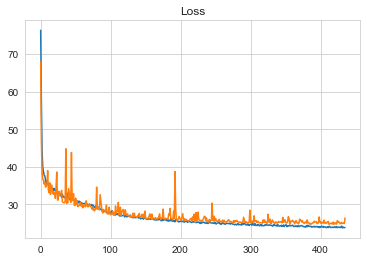

In [168]:
# Visualization
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [173]:
test_predict_nn1 = model.predict(X_test)
print(f"TEST mape: {(np.mean(np.abs((y_test - test_predict_nn1[:,0])/(y_test))))*100:0.2f}%")

TEST mape: 24.71%


In [175]:
# Good MAPE but nmore or less the same as we had before